<hr style="height:2px;border:none"/>
<h1 align='center'> <img src="http://www.exalumnos.usm.cl/wp-content/uploads/2015/06/Isotipo-Negro.gif" title="Title text" width="20%" height="20%" />

INF-395 / 477 / 577 Tarea 2 Redes Neuronales Artificiales - 2020-2 </h1>

<H3 align='center'> Integrantes: Patricio Calderón - Franco Parra </H3>
<hr style="height:2px;border:none"/>

**Temas**  
* Manipulaciones en tensorflow, keras, pandas y numpy
* Recurrent Neural Networks
* LSTM, GRU
* Autoencoders
* GAN

**Formalidades**  
* Equipos de trabajo de 2 personas (*Ambos estudiantes deben estar preparados para presentar la tarea el día de la entrega*)
* El entregable debe ser un _Jupyter Notebook_ incluyendo los códigos utilizados, los resultados, los gráficos realizados y comentarios. Debe seguir una estructura similar a un informe (se debe introducir los problemas a trabajar, presentar los resultados y discutirlos). Si lo prefiere puede entregar un _Jupyter Notebook_ por pregunta o uno para toda la tarea, con tal de que todos los entregables estén bien identificados y se encuentren en el mismo repositorio de _Github_.
* Se debe preparar una presentación del trabajo realizado y sus hallazgos. El presentador será elegido aleatoriamente y deberá apoyarse en el _Jupyter Notebook_ que entregarán. 
* Formato de entrega: envı́o de link del repositorio en _Github_ ( en caso de ser repositorio privado, invitar como colaborador al usuario de github "Aerlio") al correo electrónico del ayudante (*<tomas.ochoa.14@sansano.usm.cl>*), en copia al profesor (*<cvalle@inf.utfsm.cl>*). Especificar el siguiente asunto: [INF395/477/577-2020 Tarea 2]
* Fecha de entrega y presentaciones: 8 de Enero. Hora límite de entrega: 23:00. Cualquier _commit_ luego de la hora límite no será evaluado. Se realizará descuento por atrasos en envío del mail. 

<hr style="height:2px;border:none"/>

La tarea se divide en tres partes:

[1.](#primero) RNNs para series de tiempo  <br>
[2.](#segundo) RNNs para texto <br>
[3.](#tercero) Autoencoders para imágenes <br>
[3.](#cuarto) GANs para imágenes <br>

La tarea tiene ejemplos de códigos con los cuales pueden guiarse en gran parte, sin embargo solo son guías y pueden ser creativos al momento de resolver la tarea. Soluciones creativas o elegantes serán valoradas. También en algunas ocaciones se hacen elecciones arbitrarias, ustedes pueden realizar otras elecciones con tal de que haya una pequeña justificación de por qué su elección es mejor o equivalente.
Recuerden intercalar su código con comentarios y con celdas _Markdown_ con los comentarios de la pregunta y con cualquier analisis, fórmula o explicación que les parezca relevante para justificar sus procedimientos. 
Noten que en general cuando se les pide elegir algo o proponer algo no se evaluará mucho la elección en si, en cambio la argumentación detrás de la elección será lo más ponderado.

**Es ÁLTAMENTE recomendado realizar esta tarea en _Colab_ de Google (https://colab.research.google.com/notebooks/intro.ipynb#recent=true), con el fin de no depender del rendimiento de su computador personal al momento de entrenar redes neuronales y poder compartir de forma fácil sus avances con su compañer@ de trabajo.** Si bien conlleva sus pros y contras utilizar _Colab_ , existirá una curva de aprendizaje personal que lo ayudará a sacar el mayor provecho a esta herramienta, por ejemplo aprendiendo a guardar los avances realizados, evitando tener que ejecutar todo el código cada vez que se abra _Colab_ . *Tip: Una vez abierto un notebook en _Colab_ ir a **entorno de ejecución**->**Cambiar tipo de entorno de ejecución**, y seleccionár TPU como acelerador por hardware para redes recurrentes y GPU para redes convolucionales.*.

# 1. RNNs para series de tiempo

Las redes neuronales recurrentes (RNNs) son una red neuronal profunda que tiene, como su nombre indica, entradas recurrentes en la capa oculta, es decir, la salida de una capa oculta se retroalimenta a sí misma. La memoria neuronal es la capacidad impartida a un modelo para retener la entrada de los pasos de tiempo anteriores cuando la entrada es secuencial. En términos simples, cuando nuestro problema está asociado con una secuencia de datos como una oración o una serie temporal o la letra de una canción, el modelo tiene que recordar los estados previos de la entrada para funcionar.

<h1 align='center'> <img src="https://www.hobodataloggers.com.au/images/thumbs/0007371_hobo-weather-station-kits_510.jpeg" width="50%" height="100%" /> </h1>

En esta pregunta trabajaremos con datos obtenidos presumiblemente de una estación meteorológica, los cuales se obtienen desde el sitio https://www.kaggle.com/dronio/SolarEnergy, este dataset contiene mediciones de los últimos 4 meses. Nuestro objetivo será predecir el nivel de radiación solar para la próximas 24 horas.


## 1.a Carga de datos y preprocesamiento.

##### I) Iniciaremos cargando los datos. Para esto necesitará crear una cuenta en kaggle, dirigirse a su perfil, ir a Account, y en la sección API apretar _Create new API token_ , se descargará un archivo kaggle.json, ábralo como archivo de texto y obtenga su username y key. Luego ejecute el siguiente código (desconozco por qué pero a veces hay que ejecutar el código 2 veces para que funcione). Solución obtenida desde el hilo: https://gist.github.com/jayspeidell/d10b84b8d3da52df723beacc5b15cb27

In [ ]:
username="feparra"
key="3806c87fa9549e6b14cac1ebeed80bc9"
!pip install -q kaggle
api_token = {"username":username,"key":key}
import json
import zipfile
import os
os.environ['KAGGLE_USERNAME'] = str(username)
os.environ['KAGGLE_KEY'] = str(key)
!kaggle datasets download -d dronio/SolarEnergy
if not os.path.exists("/content/solar_prediction"):
    os.makedirs("/content/solar_prediction")
os.chdir('/content/solar_prediction')
for file in os.listdir():
    if file[-4:]==".zip":
      zip_ref = zipfile.ZipFile(file, 'r')
      zip_ref.extractall()
      zip_ref.close()
!ls

  0% 0.00/511k [00:00<?, ?B/s]
100% 511k/511k [00:00<00:00, 69.2MB/s]
SolarEnergy.zip  SolarPrediction.csv


Procederemos a ordenar la serie temporalmente a continuación.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from datetime import datetime
from pytz import timezone
import pytz

# UNIXTime mide los segundos desde enero 1, 1970
# las mediciones son de 4 meses, y por cada día, en promedio, los registros van de 5 en 5 minutos
# aunque hay algunos donde se saltan 10 o 15 minutos.
hawaii= timezone('Pacific/Honolulu') # to convert unixtime
dataset = pd.read_csv('/content/solar_prediction/SolarPrediction.csv') # read data
dataset = dataset.sort_values(['UNIXTime'], ascending = [True]) #sort data
dataset.index =  pd.to_datetime(dataset['UNIXTime'], unit='s') # make unix pandas dataframe index
dataset.index = dataset.index.tz_localize(pytz.utc).tz_convert(hawaii) # convert unixtime to timestamp
dataset.drop(['Data','Time','TimeSunRise','TimeSunSet',"UNIXTime"], inplace=True, axis=1) # drop extra-time variables
dataset.head()

,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed
UNIXTime,,,,,,
2016-09-01 00:00:08-10:00,2.58,51,30.43,103,77.27,11.25
2016-09-01 00:05:10-10:00,2.83,51,30.43,103,153.44,9.00
2016-09-01 00:20:06-10:00,2.16,51,30.43,103,142.04,7.87
2016-09-01 00:25:05-10:00,2.21,51,30.43,103,144.12,18.00
2016-09-01 00:30:09-10:00,2.25,51,30.43,103,67.42,11.25


**Comentario:** Se puede observar inmediatamente que existen datos faltantes, los cuales no son declarados. Dado que de los 6 datos impresos se puede inferir que el timestep es de 5 minutos, y faltarían los datos del instante 2016-09-01 ~00:10:00 y 2016-09-01 ~00:15:00

A continuación se proveen comandos con los cuales se puede observar cómo a partir del timestamp generado se puede categorizar con comandos simples el dataset según minuto del día, hora del día, mes del año, y día del año. Los cuales se ocuparán durante la tarea. 

In [ ]:
# en el primer ejemplo, dataset.index.minute retorna todos los minutos de los índices, por eso se repiten
# deberían ir de 5 en 5 pero hay datos faltantes
dataset.index.minute,dataset.index.hour,dataset.index.month,dataset.index.dayofyear

(Int64Index([ 0,  5, 20, 25, 30, 45, 50, 55,  0,  5,
             ...
             10, 15, 20, 25, 30, 35, 40, 45, 50, 55],
            dtype='int64', name='UNIXTime', length=32686),
 Int64Index([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,
             ...
             23, 23, 23, 23, 23, 23, 23, 23, 23, 23],
            dtype='int64', name='UNIXTime', length=32686),
 Int64Index([ 9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
             ...
             12, 12, 12, 12, 12, 12, 12, 12, 12, 12],
            dtype='int64', name='UNIXTime', length=32686),
 Int64Index([245, 245, 245, 245, 245, 245, 245, 245, 245, 245,
             ...
             366, 366, 366, 366, 366, 366, 366, 366, 366, 366],
            dtype='int64', name='UNIXTime', length=32686))

##### II) Para poder idententificar los Missing Values, y poder contar de manera segura con días de 24 horas, ejecute el siguiente código. **Explique** la funcionalidad del código escrito, escribiendo en forma de comentario (#) sobre las líneas de este código.

In [ ]:
import time
t1=time.time()
# 1. dataset.index.dayofyear => retorna todos los días del año asociados al índice de tipo fecha
# 2. len(np.unique(dataset.index.dayofyear)) => retorna todos los días distintos del total de días (que están como índices)
# es evidente que se repiten ya que el margen de tiempo es, en teoría, 5 minutos, por lo que hay varios registros con el mismo día del año
# 3. dado que son timestamps de 5 en 5 cada hora, en total hay 60/5 = 12 registros por hora.
# 4. como un día tiene 24 horas, en total habrán 24 * 12 = 288 registros por día
# 5. el dataset a crear deberá tener 24 * 12 * len(np.unique(dataset.index.dayofyear)) registros totales
# el original no necesariamente ya que hay datos faltantes
# 6. len(dataset.columns) retorna el numero de columnas sin incluir al índice (UNIXTime), por eso, realizamos 1+len(dataset.columns)
# 7. sea #registros = 24*12*len(np.unique(dataset.index.dayofyear)) y #columnas=1+len(dataset.columns),
# la línea np.zeros(#registros, #columnas) crea un arreglo de dimensiones #registros x #columnas
# 8. np.nan * np.zeros(...) simplemente indefine los valores de la matriz
# entonces, new_data son todas las fechas no repetidas encontradas en el dataset
# 9. dataset.index[i] retorna el id en la i-ésima fila
# 10. str(dataset.index[i]).split(" ")[0] obtiene unicamente la fecha. El registro se repite (timestamps de 5 en 5 minutos...)
# 11. days tiene las fechas (no repetidas) encontradas en el dataset 
new_data=np.nan*np.zeros((24*12*(len(np.unique(dataset.index.dayofyear))),1+len(dataset.columns)), dtype=object)
days=np.unique(np.asarray([str(dataset.index[i]).split(" ")[0] for i in range(dataset.shape[0])]))

# transforma minutos como entero a cadena en el formato mm
# por eso, en los casos donde los minutos son 0 o 5, se les agrega un 0 => 00 y 05
def min_to_str(min):
  if min==0: min="00"
  elif min==5: min="0"+str(min)
  else: min=str(min)
  return(min)

# new_data.shape => (filas, columnas)
for i in range(new_data.shape[0]):
  # i = 0, 1, 2, ...
  # hace, por decirlo asi, la operación módulo 24 del índice
  # sabemos que cada fecha estará repetida 24 veces
  # entonces le asociamos la hora respectiva
  hr=i//12-24*((i//12)//24)
  # rellena con zeros a la izquierda el string que representa a la hora
  if hr==0: hr="00"
  elif 0<hr<10: hr="0"+str(hr)
  else: hr=str(hr)
  # operación módulo 60 de los minutos
  # min toma valores 0, 5, 10, 15, ..., 60, 0, 5, ...
  min=5*i-60*((5*i)//60)
  # cada 24 registros, se completa 1 día
  day=(i//12)//24
  # rellena el indice de la matriz (columna 0) con los timestamps de 5 en 5
  new_data[i,0]=days[day]+" "+str(hr)+":"+min_to_str(min)+":00"


# verbose nos dice si queremos mostrar lso resultados
# freq es canda cuantas iteraciones queremos ver algo en pantalla
verbose,freq=True,12*24*5+12+1 # to see output
w_in=0

for i in range(dataset.shape[0]):
  # obtiene la fecha que es el índice
  ind=dataset.index[i]
  # obtiene los minutos de esa fecha
  min=ind.minute
  # obtiene los minutos en la fecha atrás de la actual
  if i>0: past_min=dataset.index[i-1].minute
  # podemos extraer el minuto siguiente siempre q no nos encontremos al final
  # entonces verificamos que estemos un paso atrás del final para poder extraer el minuto siguiente
  if i<dataset.shape[0]-1: next_min=dataset.index[i+1].minute
  # verifica si el minuto en la fecha actual no es múltiplo de 5
  if min%5!=0:
    # si sumandole 1 al minuto actual es múltiplo de 5, se arregla
    if (min+1)%5==0: min=min+1
    # si restandole 1 al minuto actual es múltiplo de 5, se arregla
    elif (min-1)%5==0: min=min-1
    # verifica si el minuto anterior es múltiplo de 5
    elif past_min%5==0:
      # mientras que el minuto pasado sea menor q 55, se le suma 1 y ahora el valor queda múltiplo de 5
      # si es justo 55, el siguiente minuto es 0
      # se podría simplificar simplemente colocando la operación módulo 60
      if past_min!=55: min=past_min+5
      else: min=0
    elif next_min%5==0:
      # la misma lógica anterior, pero ahora en el futuro
      if next_min!=0: min=past_min-5
      else: min=55
    # verifica si el minuto pasado menos 1 ahora es múltiplo de 5
    # las líneas de abajo hacen lo mismo q arriba
    # para evitar duplicar código, sería bueno usar recursión
    elif (past_min-1)%5==0:
      if (past_min-1)!=55: min=past_min-1+5
      else: min=0
    else: print(past_min,min,next_min,"---keep expanding")
  
  # 1. str(ind)[:-11] extrae la fecha + hora (incluidos los dos puntos) del actual indice
  # 2. min_to_str(min) devuelve el minuto con 0 a la izq si es necesario como string de la actual hora
  # min está arreglado en caso de q no sea múltiplo de 5
  # 3. str(ind)[-9:] devuelve lo que falta para completar un índice (segundos + ...)
  ind=str(ind)[:-11]+min_to_str(min)+str(ind)[-9:]
  found=0
  for w in range(w_in,w_in+new_data.shape[0]):
    # new_data[w,0][:-2] obtiene el índice menos los minutos (pero incluyendo los dos puntos)
    # verifica si calza el índice de los nuevos datos con el dataset original... (sin considerar a los minutos q no podrían ser multiplos de 5)
    if new_data[w,0][:-2] in ind:
      # guarda la última posición donde calzaron ambos índices
      # de esta forma, cuando pasemos a la sig. fecha, partiremos desde el último match...
      # este código no arregla los timestamps múltiplos de 5 donde no hayan registros => eso se arregla después
      # por mientras, quedan vacíos
      w_in=w
      # registra el match
      found=1
      # en la fila w, desde las columnas 1 en adelante, guardar los valores que habían en el dataset original (sin incluir en UNIXTime claro está)
      # la columna 0 simboliza el índice (UNIXTime) en los nuevos datos arreglados 
      new_data[w,1:]=dataset.values[i,:]
      # campo freq simplemente evita mostrar tooodo el recorrido
      # cada vez que el i sea múltiplo de la freq, se muestra la salida
      #if verbose and i%freq==0: print(str(dataset.index[i]),"---->",new_data[i+w,0]) <- FE DE ERRATA
      if verbose and i%freq==0: print(str(dataset.index[i]),"---->",new_data[w,0])
      break
  if found==0:
    print("Error at ",ind)
    break

df=pd.DataFrame(new_data[:,1:].astype("float32"),index=new_data[:,0],columns=dataset.columns)
t2=time.time()
print("Time of computation (seconds): ", t2-t1)
print("N° Missing time steps data: ", np.isnan(new_data[:,1].astype("float")).sum())

2016-09-01 00:00:08-10:00 ----> 2016-09-01 00:00:00
2016-09-06 07:05:20-10:00 ----> 2016-09-06 07:05:00
2016-09-13 02:25:08-10:00 ----> 2016-09-13 02:25:00
2016-09-19 03:20:05-10:00 ----> 2016-09-19 03:20:00
2016-09-24 06:30:19-10:00 ----> 2016-09-24 06:30:00
2016-09-29 11:15:22-10:00 ----> 2016-09-29 11:15:00
2016-10-05 14:35:20-10:00 ----> 2016-10-05 14:35:00
2016-10-10 18:25:23-10:00 ----> 2016-10-10 18:25:00
2016-10-15 21:50:21-10:00 ----> 2016-10-15 21:50:00
2016-10-20 23:50:20-10:00 ----> 2016-10-20 23:50:00
2016-10-26 01:25:17-10:00 ----> 2016-10-26 01:25:00
2016-10-31 02:45:17-10:00 ----> 2016-10-31 02:45:00
2016-11-05 04:15:18-10:00 ----> 2016-11-05 04:15:00
2016-11-10 05:20:02-10:00 ----> 2016-11-10 05:20:00
2016-11-15 06:25:02-10:00 ----> 2016-11-15 06:25:00
2016-11-20 07:40:20-10:00 ----> 2016-11-20 07:40:00
2016-11-25 09:00:04-10:00 ----> 2016-11-25 09:00:00
2016-12-01 14:55:04-10:00 ----> 2016-12-01 14:55:00
2016-12-09 06:25:52-10:00 ----> 2016-12-09 06:25:00
2016-12-14 0

##### III) **Reemplace** TODOS los missing values (NaN) de cada columna del nuevo dataset (df) de la forma que estime conveniente. Para esto debe usar los valores respectivos de cada columna, ya sea en el pasado o futuro. <br><br> _Como ejemplo_: Si es que existen datos perdidos a las 23:15 hrs, puede reemplazar el valor NaN con el promedio entre las 23:10 y 23:20, teniendo cuidado que el valor en la columna a reemplazar p.ej Pressure sea efectivamente el promedio entre la variable Pressure a las 23:10 y 23:20 . Note que el promedio entre un valor númerico y NaN es igual a NaN, por lo que tendrá que encontrar cómo hacer frente a esta situación.  <br><br> **Comente y fundamente su elección.**

In [ ]:
time=pd.to_datetime(df.index)
print(time)
var_names=df.columns.tolist()
print(var_names)
data=df.copy().values
print(data)
nan_row_loc=np.where((np.isnan((data[:,0]))==True))
print(nan_row_loc)
np.isnan((data)).sum()

DatetimeIndex(['2016-09-01 00:00:00', '2016-09-01 00:05:00',
               '2016-09-01 00:10:00', '2016-09-01 00:15:00',
               '2016-09-01 00:20:00', '2016-09-01 00:25:00',
               '2016-09-01 00:30:00', '2016-09-01 00:35:00',
               '2016-09-01 00:40:00', '2016-09-01 00:45:00',
               ...
               '2016-12-31 23:10:00', '2016-12-31 23:15:00',
               '2016-12-31 23:20:00', '2016-12-31 23:25:00',
               '2016-12-31 23:30:00', '2016-12-31 23:35:00',
               '2016-12-31 23:40:00', '2016-12-31 23:45:00',
               '2016-12-31 23:50:00', '2016-12-31 23:55:00'],
              dtype='datetime64[ns]', length=33984, freq=None)
['Radiation', 'Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed']
[[  2.58  51.    30.43 103.    77.27  11.25]
 [  2.83  51.    30.43 103.   153.44   9.  ]
 [   nan    nan    nan    nan    nan    nan]
 ...
 [  1.21  42.    30.34  81.   218.28   7.87]
 [  1.19  41.    30.34  80.   215.

7800

In [ ]:
from scipy.interpolate import interp1d

In [ ]:
for index in nan_row_loc[0]:
  previous_index = index-1
  next_index = index+1
  next_next_index = index+2
  while np.isnan(data[previous_index, 0]):
    previous_index -= 1
  while np.isnan(data[next_index, 0]):
    next_index += 1
  while np.isnan(data[next_next_index, 0]):
    next_next_index += 1
  for i, var_name in enumerate(var_names):
    interpolator = interp1d(
        [previous_index, next_index, next_next_index], 
        [data[previous_index, i], data[next_index, i], data[next_next_index, i]])
    data[index, i] = np.round_(interpolator(index), 2)
  #print("previous: {} current: {} next: {}".format(previous_index, index, next_index))

In [ ]:
print(data[:10, :])

[[  2.58  51.    30.43 103.    77.27  11.25]
 [  2.83  51.    30.43 103.   153.44   9.  ]
 [  2.61  51.    30.43 103.   149.64   8.62]
 [  2.38  51.    30.43 103.   145.84   8.24]
 [  2.16  51.    30.43 103.   142.04   7.87]
 [  2.21  51.    30.43 103.   144.12  18.  ]
 [  2.25  51.    30.43 103.    67.42  11.25]
 [  2.22  51.    30.43 103.    67.56   9.  ]
 [  2.19  51.    30.43 103.    67.7    6.75]
 [  2.15  51.    30.43 103.    67.85   4.5 ]]


Por mera intuición, creemos que la mejor alternativa es interpolar la función por un polinomio de grado 2 ya que es capaz de capturar alguna relación entre las variables. Consideramos 3 datos: el anterior no NaN al actual, el siguiente y subsiguiente no NaN al actual. Usamos el valor respectivo de la cantidad física como "y", y el "x" al índice previo, siguiente y subsiguiente. Interpolamos el valor del actual índice con el interpolador.

**Para disminuir los tiempos de entrenamiento reduciremos la resolución temporal de 5-min a 1-hr. Para esto calcularemos el promedio de cada hora.**

In [ ]:
# es la data que ahora en vez de tener timestamps de 5 en 5 minutos, será de cada 1 hr
# por eso, se realiza la división por 12
# time_hr es el promedio de los 12 registros, y tiene en total, data.shape[0]/12 registros.
data_hr=np.nan*np.zeros((int(data.shape[0]/12),data.shape[1]))
time_hr=np.nan*np.zeros((int(data.shape[0]/12)), dtype=object)
for i in range(data_hr.shape[0]):
  # calcula el promedio de los 12 registros diarios
  data_hr[i,:]=np.mean(data[12*i:12*(i+1),:],axis=0)
  # este será el nuevo indice del dataframe. Los valores q toma son las horas => 00:00:00, 01:00:00, ...
  time_hr[i]=time[12*i]
print(time_hr)
time_hr=pd.to_datetime(time_hr)
print(time_hr)

[Timestamp('2016-09-01 00:00:00') Timestamp('2016-09-01 01:00:00')
 Timestamp('2016-09-01 02:00:00') ... Timestamp('2016-12-31 21:00:00')
 Timestamp('2016-12-31 22:00:00') Timestamp('2016-12-31 23:00:00')]
DatetimeIndex(['2016-09-01 00:00:00', '2016-09-01 01:00:00',
               '2016-09-01 02:00:00', '2016-09-01 03:00:00',
               '2016-09-01 04:00:00', '2016-09-01 05:00:00',
               '2016-09-01 06:00:00', '2016-09-01 07:00:00',
               '2016-09-01 08:00:00', '2016-09-01 09:00:00',
               ...
               '2016-12-31 14:00:00', '2016-12-31 15:00:00',
               '2016-12-31 16:00:00', '2016-12-31 17:00:00',
               '2016-12-31 18:00:00', '2016-12-31 19:00:00',
               '2016-12-31 20:00:00', '2016-12-31 21:00:00',
               '2016-12-31 22:00:00', '2016-12-31 23:00:00'],
              dtype='datetime64[ns]', length=2832, freq=None)


##### IV) **Separe** el dataset en conjuntos de entrenamiento, validación y test, para esto considere un 70% de los datos para entrenamiento, un 15% para validación y un 15% para test. Como se está trabajando con series de tiempo, proceda a crear los conjuntos de manera sucesiva. Guarde las fechas asociadas a cada dato puesto se utilizarán más adelante. 

In [ ]:
data_tr, time_tr = data_hr[:int(data_hr.shape[0]*0.7)],time_hr[:int(data_hr.shape[0]*0.7)]
data_val, time_val = data_hr[int(data_hr.shape[0]*0.7):int(data_hr.shape[0]*0.85)],time_hr[int(data_hr.shape[0]*0.7):int(data_hr.shape[0]*0.85)]
data_tst, time_tst = data_hr[int(data_hr.shape[0]*0.85):],time_hr[int(data_hr.shape[0]*0.85):]

print("training: {}%\ntesting: {}%\nvalidation: {}%".format(data_tr.shape[0] / data_hr.shape[0] * 100, data_val.shape[0] / data_hr.shape[0] * 100, data_tst.shape[0] / data_hr.shape[0] * 100))

training: 69.98587570621469%
testing: 15.007062146892656%
validation: 15.007062146892656%


##### V) **Comente y visualice** los valores promedios y desviación estándar de cada atributo del dataset de entrenamiento según la hora del día y mes del año. Apóyese en el siguiente código si lo desea.

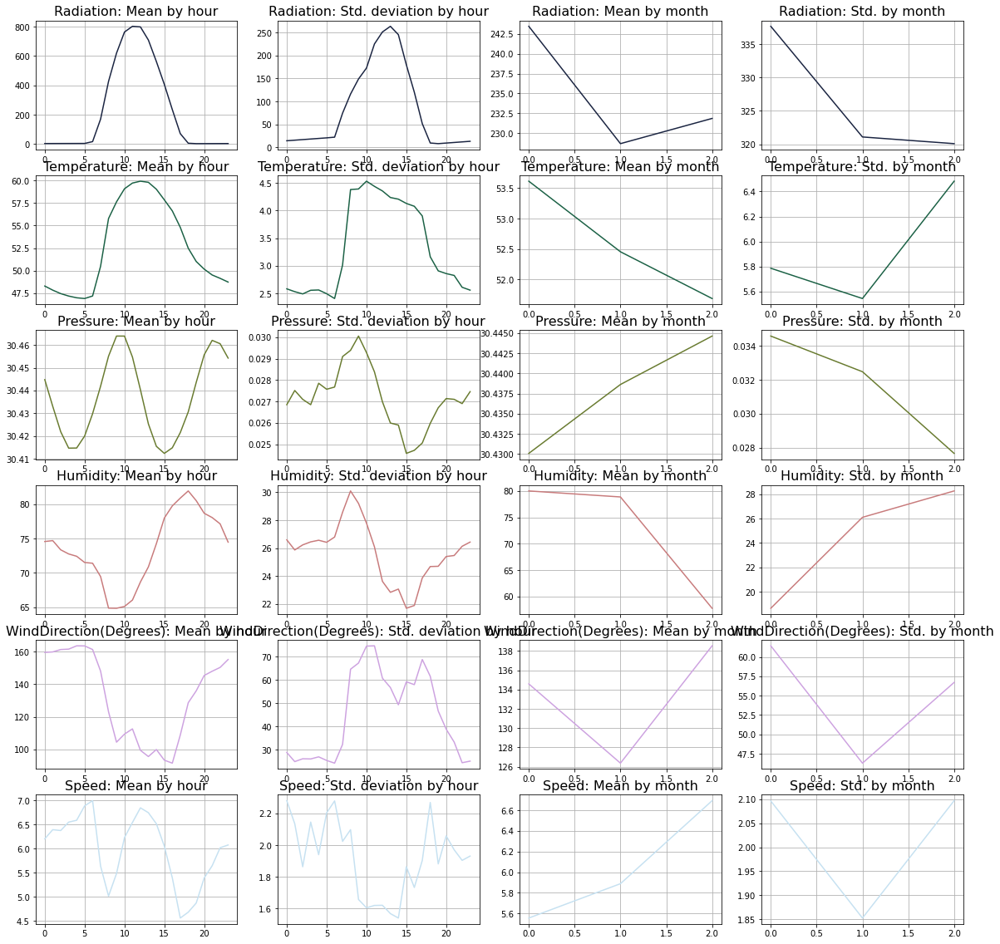

In [ ]:
import matplotlib.pyplot as plt
cols=sns.color_palette("cubehelix", len(var_names))

#plt.rcParams["figure.figsize"]=[20,2]
fig, axs = plt.subplots(len(var_names), 4, figsize=(20,20))

for J, var_name in enumerate(var_names):
  mean_per_hr=np.nan*np.zeros((24))
  mean_per_month = np.nan*np.zeros((4))
  std_per_hr=np.nan*np.zeros((24))
  std_per_month = np.nan*np.zeros((4))
  
  for hr in range(24):
    # 1. data_tr[time_tr.hour == hr][:, J] -> para todos los registros en la columna J, verifica si la hora calza con la q se está iterando (hr)
    # retorna todos los registros q hacen match
    # 2. np.mean(...) calcula el promedio de la cantidad física en la hora hr
    mean_per_hr[hr]=np.mean(data_tr[time_tr.hour==hr][:,J])
    # 3. calcula la desviación estándar de la cantidad física en la hora hr
    std_per_hr[hr]=np.std(data_tr[time_tr.hour==hr][:,J])

  for month in range(9, 11+1):
    mean_per_month[month-9] = np.mean(data_tr[time_tr.month == month][:, J])
    std_per_month[month-9] = np.std(data_tr[time_tr.month == month][:, J])
  
  # plt.suptitle(var_name,size=18,y=1.2)
  axs[J, 0].set_title("{}: Mean by hour".format(var_name), size=16)
  axs[J, 0].plot(mean_per_hr, color=cols[J])
  axs[J, 0].grid()
  axs[J, 1].set_title("{}: Std. deviation by hour".format(var_name), size=16)
  axs[J, 1].plot(std_per_hr, color=cols[J])
  axs[J, 1].grid()

  axs[J, 2].set_title("{}: Mean by month".format(var_name), size=16)
  axs[J, 2].plot(mean_per_month, color=cols[J])
  axs[J, 2].grid()
  axs[J, 3].set_title("{}: Std. by month".format(var_name), size=16)
  axs[J, 3].plot(std_per_month, color=cols[J])
  axs[J, 3].grid()

  #axs[J, 0].get_shared_y_axes().join(axs[J,0], axs[J, 1])

  """
  plt.subplot(1,2,1),plt.title("Mean by hour",size=16)
  plt.plot(mean_per_hr,color=cols[J]),plt.grid()
  plt.subplot(1,2,2),plt.title("Std. deviation by hour",size=16)
  plt.plot(std_per_hr,color=cols[J]),plt.grid()
  plt.tight_layout()
  """

#plt.show()

Tanto la radiación como la temperatura tienden a parecerse a una normal y concentran sus mayores valores entre las 10 y 15 horas. La presión por otra parte es oscilante y se asemeja a una función sinusoidal, la cual presenta sus peaks a las 10 y 20 horas, mientras que sus valores más bajos entre las 3 y 15 horas. La humedad también tiende a parecerse a una función sinusoidal, en la que se aprecia un sólo ciclo diario. La velocidad también se asemeja, pero sufre un desplazamiento a lo largo del día.

La radiación, temperatura y humedad presentan sus valores más altos en septiembre, no así la presión, dirección del viento y velocidad que lo hacen en noviembre (de diciembre no sabemos nada lamentablemente porque al crear la data de entrenamiento se perdieron esos datos).

##### VI) **Estandarice** los conjuntos de entrenamiento, validación y test. Tienendo en mente que buscaremos predecir la radiación para las 24 horas futuras definiremos las variables de entrada y salida, realizando una transformación conveniente utilizando la función split_sequence entregada.

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaler_tr = StandardScaler()
scaler_val = StandardScaler()
scaler_tst = StandardScaler()

xy_tr_sc = scaler_tr.fit_transform(data_tr)
xy_val_sc = scaler_val.fit_transform(data_val)
xy_tst_sc = scaler_tst.fit_transform(data_tst)

#scaler.fit()

print(xy_tr_sc.shape[0]-2*24)
print(xy_tr_sc.shape)
print(xy_val_sc.shape)
print(xy_tst_sc.shape)

1934
(1982, 6)
(425, 6)
(425, 6)


In [ ]:
def split_sequence(sequence, n_steps_in, n_steps_out,time_seq):
    X, y , seq_t= list(), list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        # check if we are beyond the sequence
        if out_end_ix > len(sequence):
            break
        # gather input and output parts of the pattern
        # note that we're indexing the 0 column because radiation is there
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix,0]
        seq_t.append(time_seq[end_ix])
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y) , np.asarray(seq_t)

In [ ]:
len_inp=24
len_out=24
x_tr,y_tr,t_tr=split_sequence(xy_tr_sc,len_inp,len_out,time_tr)
x_val,y_val,t_val=split_sequence(xy_val_sc,len_inp,len_out,time_tr)
x_tst,y_tst,t_tst=split_sequence(xy_tst_sc,len_inp,len_out,time_tr)

**Explique** a qué corresponde cada dimensión de las variables de entrada y salida.

In [ ]:
x_tr.shape,x_val.shape,x_tst.shape,y_tr.shape,y_val.shape,y_tst.shape

((1935, 24, 6), (378, 24, 6), (378, 24, 6), (1935, 24), (378, 24), (378, 24))

* x_tr: 
  1. el número de datos de entrenamiento para la red recurrente considerando 24 secuencias de entrada (1 cada hora) y 24 escalares de salida que predigan la radiación. Esto es así porque la dimensión original de entrenamiento es 1982 y necesitamos leer 2\*24 datos del total. Al final resulta  1982 - 2 * 24 + 1 = 1935.
  2. el número de secuencias de entrada (1 por cada hora)
  3. el número de atributos usados para la predicción, incluyendo a la radiación.
* x_val:
  1. Idem que en x_tr, pero con la diferencia de que el shape es distinto y resulta 425-2*24+1=378.
  2. Idem que en x_tr
  3. Idem que en x_tr
* y_val:
  1. Idem que en x_val ya que ambas representan un 15% de los datos.
  2. Idem que en x_tr
  3. Idem que en x_tr
* y_tr:
  1. Es el número de secuencias esperadas para entrenar (calza justamente con la primera dimensión de x_tr)
  2. Es el vector esperado a predecir, es decir, 24 escalares que predigan la radiación en el día.
* y_val:
  1. Es el número de secuencias esperadas para validar (calza justamente con la primera dimensión de y_val).
  2. Es el vector esperado a validar, es decir, 24 escalares que indiquen la radiación en el día.
* y_tst:
  1. Es el número de secuencias esperadas para testear (calza justamente con la primera dimensión de y_tst).
  2. Es el vector para testear, es decir, 24 escalares que indiquen la radiación en el día.

## 1.b) Primera  red recurrente.
Ahora entrenaremos una primera red recurrente LSTM. **Explique** la particularidad de estas redes y **por qué** podría comportarse bien para este tipo de problemas.

* Las redes LSTM (y al igual que todas las recurrentes) permiten realizar predicciones a secuencias de datos incluyendo como entradas sus propias salidas en tiempos anteriores, pero esta vez, de manera mucho mejor, ¿por qué? porque trabaja internamente con tres compuertas que permiten ponderar la predicción, ya sea considerando el estado de la celda, salidas anteriores y salidas actuales. La flexibilidad que ofrecen al poder ajustar todas sus compuertas hace que se puedan recordar relaciones entre secuencias con espacios de "tiempo" (o lags) mucho más grandes, por eso, esta red podría comportarse bien para este tipo de problemas porque las salidas probablemente dependan de los días anteriores, o incluso, de los meses previos al actual.

Entrenaremos dos redes recurrentes similares, la primera tan solo utilizará la variable Radiation como entrada para predecir Radiation, caso que llamaremos **univariante**, mientras la segunda utilizará las variables [Radiation, Temperature, Pressure, Humidity, WindDirection(Degrees), Speed] como entrada para predecir Radiation, caso que llamaremos **multivariante**. <br> <br> **Recupere** las funciones utilizadas en la tarea anterior para graficar los errores de entrenamiento, validación y test, y así comparar el rendimiento de ambas redes RNN gráficamente. **Comente**

In [ ]:
import tensorflow as tf
from tensorflow.python.keras import models
from tensorflow.python.keras import layers
from tensorflow.python.keras import activations
from tensorflow.python.keras.engine import input_layer

In [ ]:
tf.random.set_seed(696);

In [ ]:
input_lstm= input_layer.Input(shape=(x_tr.shape[1],1))
rnn=layers.LSTM(units=56,return_sequences=False)(input_lstm)
dens=layers.Dense(len_out, activation='sigmoid')(rnn)
model_1=models.Model(inputs=input_lstm, outputs=dens)
model_1.compile(loss='mse', optimizer='adam')

model_1.summary()
history_1 = model_1.fit(x_tr[:,:,0:1],y_tr, validation_data=(x_val[:,:,0:1],y_val), epochs=10, batch_size=16,verbose=False)

input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
rnn=layers.LSTM(units=56,return_sequences=False)(input_lstm)
dens=layers.Dense(len_out, activation='sigmoid')(rnn)
model_2=models.Model(inputs=input_lstm, outputs=dens)
model_2.compile(loss='mse', optimizer='adam')

model_2.summary()
history_2 = model_2.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=10, batch_size=16,verbose=False)

y_pred_1=model_1(x_tst[:,:,0:1])
tst_loss_1=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred_1)).numpy()
y_pred_2=model_2(x_tst)
tst_loss_2=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred_2)).numpy()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 24, 1)]           0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 56)                12992     
_________________________________________________________________
dense_2 (Dense)              (None, 24)                1368      
Total params: 14,360
Trainable params: 14,360
Non-trainable params: 0
_________________________________________________________________
Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 24, 6)]           0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 56)                14112     
______________________________________

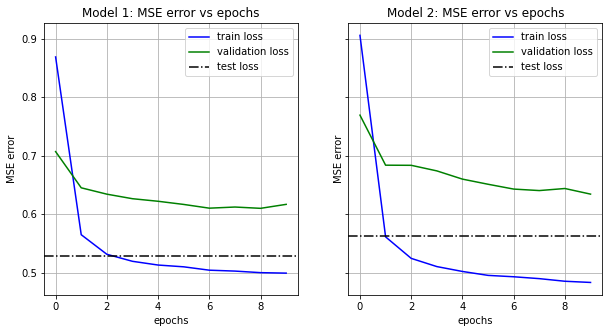

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5), sharey=True)

for i, ax in enumerate(axs):
  hist = history_1.history if i == 0 else history_2.history
  tst_loss = tst_loss_1 if i == 0 else tst_loss_2

  ax.set_title("Model {}: MSE error vs epochs".format(i+1))
  ax.plot(hist["loss"], "b",label="train loss")
  ax.plot(hist["val_loss"],"g",label="validation loss")
  ax.axhline(y=tst_loss,color="k",linestyle="-.",label="test loss")
  ax.set_xlabel("epochs")
  ax.set_ylabel("MSE error")
  ax.grid()
  ax.legend()

El error para el modelo 1 fue mucho menor respecto al modelo 2 (considere que ambos gráficos tienen los ejes compartidos), y creemos que se debe a que el modelo 2 cuenta con un espacio de hipótesis más amplio, y por ende, requiere de más datos de entrenamiento, no así el primero que sólo considera una característica. Claramente, el modelo 1 es bueno dentro de este contexto pero creemos que para predecir la radiación es necesario incluir otros factores ya que el fenómeno probablemente no sea autosuficiente, es decir, en la praxis influyen otros factores (¿presión? ¿humedad? ¿viento?)

## 1.c) Exploración de profundidad y GRU.

##### I) Exploraremos aumentar la profundidad de la red neuronal. El modelo LSTM original se compone de una sola capa LSTM oculta seguida de una capa de salida estándar. Podríamos decir que nuestra red neuronal posee dos profundidades distintas. La Stacked LSTM es una extensión del modelo LSTM original, la cual tiene múltiples capas LSTM ocultas donde cada capa contiene múltiples celdas de memoria. A la vez, del mismo modo que en la Tarea 1, es posible aumentar la profundidad de la red densa de salida. 

Proceda a probar distintas combinaciones de profundidades de capas LSTM y de capas Densas (contando la capa de salida), para el caso univariado y multivariado. Para mantener un tiempo de ejecución produnte, considere una profunidad LSTM máxima de 2, y una profundidad densa máxima de 2. **Grafique y compare** los errores de entrenamiento, validación y test para los distintos casos.  **Comente**.

El siguiente código muestra el caso multivariado con profundidades máximas LSTM y Densas. Utilice el número de celdas de memoria y número de neuronas recomendado en el código para las distintas profundidades, al igual que el número de epochs.

**Pregunta:** ¿Por qué cuando una capa LSTM precede otra capa LSTM es necesario utilizar return_sequences=True? ¿Es necesario/recomendado utilizar return_sequences=False cuando una capa LSTM precede a una capa Densa?

* Es necesario utilizar return_sequences=True porque las salidas de la primera capa LSTM son las secuencias de entrada para la siguiente capa LSTM.
* No es recomendado ya que sólo interesa en la capa densa la salida de la capa LSTM (la predicción). Si bien podría usarse, sería para fines más experimentales ya que la entrada de esta red debería ser del tamaño de las secuencias predichas en la capa LSTM multiplicado por el número de secuencias de entrenamiento.

###### Caso univariado

In [ ]:
input_lstm= input_layer.Input(shape=(x_tr.shape[1], 1))
rnn=layers.LSTM(units=56,return_sequences=True)(input_lstm) # 1° lstm
rnn=layers.LSTM(units=56,return_sequences=False)(rnn) # 2° lstm
dens=layers.Dense(32, activation='relu')(rnn) # 1° densa
dens=layers.Dense(len_out, activation='sigmoid')(dens) # 2° densa
model=models.Model(inputs=input_lstm, outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history_1 = model_1.fit(x_tr[:,:,0:1],y_tr, validation_data=(x_val[:,:,0:1],y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model(x_tst[:,:,0:1])
tst_loss_1=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 24, 1)]           0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 24, 56)            12992     
_________________________________________________________________
lstm_7 (LSTM)                (None, 56)                25312     
_________________________________________________________________
dense_6 (Dense)              (None, 32)                1824      
_________________________________________________________________
dense_7 (Dense)              (None, 24)                792       
Total params: 40,920
Trainable params: 40,920
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
121/121 [==============================] - 3s 26ms/step - loss: 0.4929 - val_loss: 0.6092
Epoch 2/10
121/121 [

In [ ]:
input_lstm= input_layer.Input(shape=(x_tr.shape[1], 1))
rnn=layers.LSTM(units=56,return_sequences=False)(input_lstm) # 1° lstm
dens=layers.Dense(32, activation='relu')(rnn) # 1° densa
dens=layers.Dense(len_out, activation='sigmoid')(dens) # 2° densa
model=models.Model(inputs=input_lstm, outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history_2 = model_1.fit(x_tr[:,:,0:1],y_tr, validation_data=(x_val[:,:,0:1],y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model(x_tst[:,:,0:1])
tst_loss_2=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 24, 1)]           0         
_________________________________________________________________
lstm_9 (LSTM)                (None, 56)                12992     
_________________________________________________________________
dense_10 (Dense)             (None, 32)                1824      
_________________________________________________________________
dense_11 (Dense)             (None, 24)                792       
Total params: 15,608
Trainable params: 15,608
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
121/121 [==============================] - 3s 26ms/step - loss: 0.4879 - val_loss: 0.6210
Epoch 2/10
121/121 [==============================] - 3s 26ms/step - loss: 0.4875 - val_loss: 0.6346
Epoch 3/10
121/121 [==============================]

In [ ]:
input_lstm= input_layer.Input(shape=(x_tr.shape[1], 1))
rnn=layers.LSTM(units=56,return_sequences=False)(input_lstm) # 1° lstm
dens=layers.Dense(len_out, activation='relu')(rnn) # 1° densa
model=models.Model(inputs=input_lstm, outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history_3 = model_1.fit(x_tr[:,:,0:1],y_tr, validation_data=(x_val[:,:,0:1],y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model(x_tst[:,:,0:1])
tst_loss_3=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 24, 1)]           0         
_________________________________________________________________
lstm_11 (LSTM)               (None, 56)                12992     
_________________________________________________________________
dense_13 (Dense)             (None, 24)                1368      
Total params: 14,360
Trainable params: 14,360
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
121/121 [==============================] - 3s 27ms/step - loss: 0.4823 - val_loss: 0.6826
Epoch 2/10
121/121 [==============================] - 3s 26ms/step - loss: 0.4823 - val_loss: 0.6586
Epoch 3/10
121/121 [==============================] - 3s 26ms/step - loss: 0.4816 - val_loss: 0.6372
Epoch 4/10
121/121 [==============================] - 3s 26ms/step - loss: 0.4817 

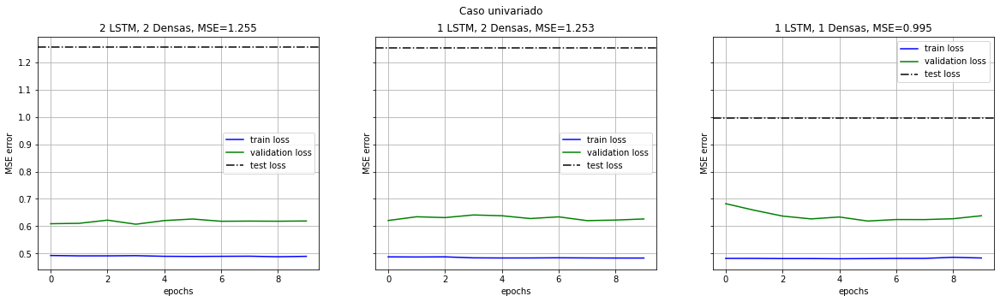

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(20,5), sharey=True)
fig.suptitle("Caso univariado")
metadata=[
          {"hist": history_1.history, "loss": tst_loss_1, "title": "2 LSTM, 2 Densas"},
          {"hist": history_2.history, "loss": tst_loss_2, "title": "1 LSTM, 2 Densas"},
          {"hist": history_3.history, "loss": tst_loss_3, "title": "1 LSTM, 1 Densas"}
          ]

for i, ax in enumerate(axs):
  hist = metadata[i]["hist"]
  tst_loss = metadata[i]["loss"]
  title = metadata[i]["title"]

  ax.set_title("{}, MSE={}".format(title, str(np.round_(tst_loss, 3))))
  ax.plot(hist["loss"], "b",label="train loss")
  ax.plot(hist["val_loss"],"g",label="validation loss")
  ax.axhline(y=tst_loss,color="k",linestyle="-.",label="test loss")
  ax.set_xlabel("epochs")
  ax.set_ylabel("MSE error")
  ax.grid()
  ax.legend()

###### Caso multivariado

In [ ]:
# Modelo 1
input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
rnn=layers.LSTM(units=56,return_sequences=True)(input_lstm) # 1° lstm
rnn=layers.LSTM(units=56,return_sequences=False)(rnn) # 2° lstm
dens=layers.Dense(32, activation='relu')(rnn) # 1° densa
dens=layers.Dense(len_out, activation='sigmoid')(dens) # 2° densa
model=models.Model(inputs=input_lstm, outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history_1 = model.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model(x_tst)
tst_loss_1=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 24, 6)]           0         
_________________________________________________________________
lstm_12 (LSTM)               (None, 24, 56)            14112     
_________________________________________________________________
lstm_13 (LSTM)               (None, 56)                25312     
_________________________________________________________________
dense_14 (Dense)             (None, 32)                1824      
_________________________________________________________________
dense_15 (Dense)             (None, 24)                792       
Total params: 42,040
Trainable params: 42,040
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
121/121 [==============================] - 12s 60ms/step - loss: 1.0699 - val_loss: 0.7214
Epoch 2/10
121/121

In [ ]:
# Modelo 2
input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
rnn=layers.LSTM(units=56,return_sequences=False)(input_lstm) # 1° lstm
dens=layers.Dense(32, activation='relu')(rnn) # 1° densa
dens=layers.Dense(len_out, activation='sigmoid')(dens) # 2° densa
model=models.Model(inputs=input_lstm, outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history_2 = model.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model(x_tst)
tst_loss_2=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 24, 6)]           0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 56)                14112     
_________________________________________________________________
dense_16 (Dense)             (None, 32)                1824      
_________________________________________________________________
dense_17 (Dense)             (None, 24)                792       
Total params: 16,728
Trainable params: 16,728
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
121/121 [==============================] - 6s 29ms/step - loss: 1.0803 - val_loss: 0.7603
Epoch 2/10
121/121 [==============================] - 3s 27ms/step - loss: 0.5454 - val_loss: 0.6576
Epoch 3/10
121/121 [==============================

In [ ]:
# Modelo 3
input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
rnn=layers.LSTM(units=56,return_sequences=False)(input_lstm) # 1° lstm
dens=layers.Dense(len_out, activation='relu')(rnn) # 1° densa
model=models.Model(inputs=input_lstm, outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history_3 = model.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model(x_tst)
tst_loss_3=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 24, 6)]           0         
_________________________________________________________________
lstm_15 (LSTM)               (None, 56)                14112     
_________________________________________________________________
dense_18 (Dense)             (None, 24)                1368      
Total params: 15,480
Trainable params: 15,480
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
121/121 [==============================] - 6s 29ms/step - loss: 0.8402 - val_loss: 0.6077
Epoch 2/10
121/121 [==============================] - 3s 27ms/step - loss: 0.4215 - val_loss: 0.5487
Epoch 3/10
121/121 [==============================] - 3s 27ms/step - loss: 0.3970 - val_loss: 0.5297
Epoch 4/10
121/121 [==============================] - 3s 27ms/step - loss: 0.3938

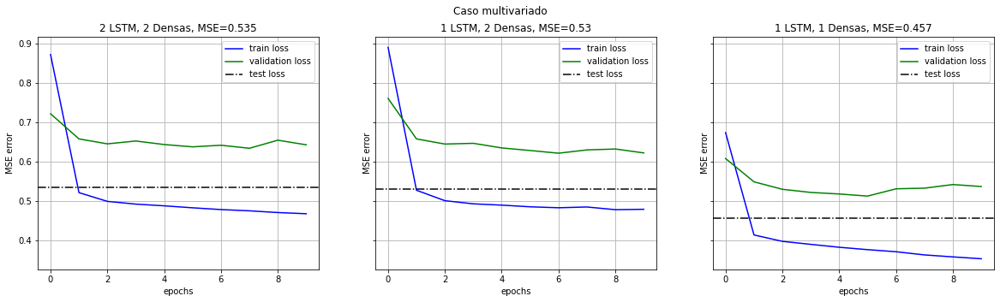

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(20,5), sharey=True)
fig.suptitle("Caso multivariado")
metadata=[
          {"hist": history_1.history, "loss": tst_loss_1, "title": "2 LSTM, 2 Densas"},
          {"hist": history_2.history, "loss": tst_loss_2, "title": "1 LSTM, 2 Densas"},
          {"hist": history_3.history, "loss": tst_loss_3, "title": "1 LSTM, 1 Densas"}
          ]

for i, ax in enumerate(axs):
  hist = metadata[i]["hist"]
  tst_loss = metadata[i]["loss"]
  title = metadata[i]["title"]

  ax.set_title("{}, MSE={}".format(title, str(np.round_(tst_loss, 3))))
  ax.plot(hist["loss"], "b",label="train loss")
  ax.plot(hist["val_loss"],"g",label="validation loss")
  ax.axhline(y=tst_loss,color="k",linestyle="-.",label="test loss")
  ax.set_xlabel("epochs")
  ax.set_ylabel("MSE error")
  ax.grid()
  ax.legend()

* Comentarios para ambos casos: En general, cualquiera de los modelos trabajados en el caso univariado presentó valores MSE muy altos con respecto a los del caso multivariado (más de la mitad de diferencia para ser precisos). Podríamos decir que para el primer caso casi no existió aprendizaje, mientras que para el segundo sí se tuvo, y bastante bien, es más, lo único común entre ambos casos es que a medida que disminuíamos la arquitectura, los valores de MSE se achicaban más, como se puede apreciar en los modelos "1 LSTM, 1 Densas" (quizás justificado por la propia naturaleza de aprendizaje de estas redes).

##### II) Añadiremos entradas a la capa Densa que indiquen la hora del día de forma bi-dimensional, semejante a un reloj, y una variable dummy que indica si es de día o noche. Ejecute el siguiente código para generar las entradas adicionales, y **añada la entrada** a la arquitectura entregada. Esta forma de ingresar variables adicionales a la capa densa se asemeja a la arquitectura skip-connections vista en la Tarea 1. **La hora que se entrega para indicar si es de día o noche es intencionalmente erronea**. Utilizando los datos de radiación del conjunto de entrenamiento **deberá definir las horas de día y noche de manera justificada**. 

**Comente** sobre los resultados obtenidos.

**Pregunta:** ¿Por qué puede resultar beneficioso representar la hora del día de manera bidimensional en lugar de unidimensional? 

In [ ]:
daytimehrs=[5,18]

Viendo el gráfico, notamos que el intervalo \[5,18\] es donde comienza y termina la radiación, es decir, donde se registra más luz.

In [ ]:
from math import *
hour_1_tr=np.asarray(np.sin(2*pi*pd.to_datetime(t_tr).hour/24)).reshape(-1,1)
hour_2_tr=np.asarray(np.cos(2*pi*pd.to_datetime(t_tr).hour/24)).reshape(-1,1)
dummy_tr=(1*(pd.to_datetime(t_tr).hour<daytimehrs[1])*(pd.to_datetime(t_tr).hour>daytimehrs[0])).reshape(-1,1)
hour_1_val=np.asarray(np.sin(2*pi*pd.to_datetime(t_val).hour/24)).reshape(-1,1)
hour_2_val=np.asarray(np.cos(2*pi*pd.to_datetime(t_val).hour/24)).reshape(-1,1)
dummy_val=(1*(pd.to_datetime(t_val).hour<daytimehrs[1])*(pd.to_datetime(t_val).hour>daytimehrs[0])).reshape(-1,1)
hour_1_tst=np.asarray(np.sin(2*pi*pd.to_datetime(t_tst).hour/24)).reshape(-1,1)
hour_2_tst=np.asarray(np.cos(2*pi*pd.to_datetime(t_tst).hour/24)).reshape(-1,1)
dummy_tst=(1*(pd.to_datetime(t_tst).hour<daytimehrs[1])*(pd.to_datetime(t_tst).hour>daytimehrs[0])).reshape(-1,1)

# como los hour_x_y son matrices de M x 1, lo que hace es concatenar a las tres matrices por columna
# al final ext_tr tiene dimensiones M x 3
# idem para el resto
ext_tr=np.concatenate((hour_1_tr,hour_2_tr,dummy_tr),axis=1)
ext_val=np.concatenate((hour_1_val,hour_2_val,dummy_val),axis=1)
ext_tst=np.concatenate((hour_1_tst,hour_2_tst,dummy_tst),axis=1)

In [ ]:
from keras.layers import concatenate

input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
rnn=layers.LSTM(units=56,return_sequences=True)(input_lstm) # 1° lstm
rnn=layers.LSTM(units=56,return_sequences=False)(rnn) # 2° lstm
input_clock= input_layer.Input(shape=(3))
# lo que hace esta parte es concatenar la salida de la rnn (tamaño 56) con la entrada del input_clock (tamaño 3)
input_dense=concatenate([rnn, input_clock])
dens=layers.Dense(32, activation='relu')(input_dense) # 1° densa
dens=layers.Dense(len_out, activation='sigmoid')(dens) # 2° densa
model=models.Model(inputs=[input_lstm,input_clock], outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history = model.fit([x_tr,ext_tr],y_tr, validation_data=([x_val,ext_val],y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model([x_tst,ext_tst])
tst_loss=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           [(None, 24, 6)]      0                                            
__________________________________________________________________________________________________
lstm_16 (LSTM)                  (None, 24, 56)       14112       input_14[0][0]                   
__________________________________________________________________________________________________
lstm_17 (LSTM)                  (None, 56)           25312       lstm_16[0][0]                    
__________________________________________________________________________________________________
input_15 (InputLayer)           [(None, 3)]          0                                            
___________________________________________________________________________________________

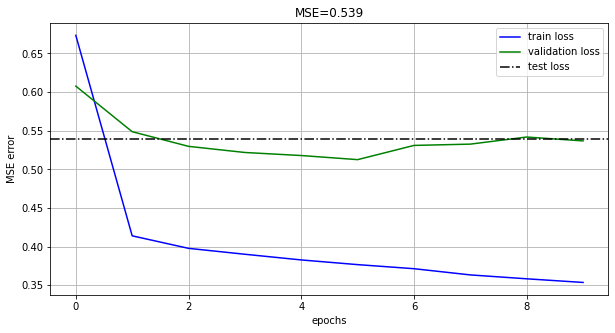

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(10,5), sharey=True)

axs.set_title("MSE={}".format(str(np.round_(tst_loss, 3))))
axs.plot(hist["loss"], "b",label="train loss")
axs.plot(hist["val_loss"],"g",label="validation loss")
axs.axhline(y=tst_loss,color="k",linestyle="-.",label="test loss")
axs.set_xlabel("epochs")
axs.set_ylabel("MSE error")
axs.grid()
axs.legend()

* Comentarios: La verdad es que incorporar el conocimiento del día y la hora no mejora para nada la predicción, de hecho, el desconocimiento genera mejores generalizaciones, tal y como se evidenció en el modelo multivariado "2 LSTM, 2 Densas", que arrojaba un resultado MSE cercano al 0.535 (que tampoco es radicalmente menor que el obtenido aqui, pero da a entender que podrían ahorrarse recursos computacionales y generalizar mejor).
* Beneficios: Al ser una función periódica, el intervalo o distancia entre segundos, minutos u horas (en este caso) es constante, no así en la representación lineal que, cada 24 horas, llegabamos a cero, y matemáticamente entre estos dos valores existía un gran vacío.

##### III) Entrene la misma arquitectura que en la pregunta anterior utilizando unidades GRU en lugar de LSTM. **Explique la diferencia entre GRU y LSTM**. **Compare** los resultados con los obtenidos en el punto anterior.

In [ ]:
input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
rnn=layers.GRU(units=56,return_sequences=True)(input_lstm) # 1° capa gru
rnn=layers.GRU(units=56,return_sequences=False)(rnn) # 2° capa gru
input_clock= input_layer.Input(shape=(3))
# lo que hace esta parte es concatenar la salida de la rnn (tamaño 56) con la entrada del input_clock (tamaño 3)
input_dense=concatenate([rnn, input_clock])
dens=layers.Dense(32, activation='relu')(input_dense) # 1° densa
dens=layers.Dense(len_out, activation='sigmoid')(dens) # 2° densa
model=models.Model(inputs=[input_lstm,input_clock], outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history = model.fit([x_tr,ext_tr],y_tr, validation_data=([x_val,ext_val],y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model([x_tst,ext_tst])
tst_loss=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()

Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 24, 6)]      0                                            
__________________________________________________________________________________________________
gru (GRU)                       (None, 24, 56)       10584       input_16[0][0]                   
__________________________________________________________________________________________________
gru_1 (GRU)                     (None, 56)           18984       gru[0][0]                        
__________________________________________________________________________________________________
input_17 (InputLayer)           [(None, 3)]          0                                            
___________________________________________________________________________________________

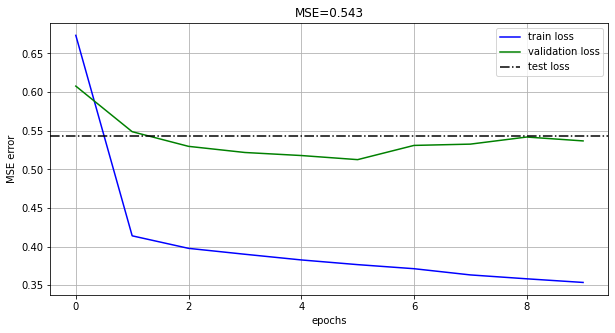

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(10,5), sharey=True)

axs.set_title("MSE={}".format(str(np.round_(tst_loss, 3))))
axs.plot(hist["loss"], "b",label="train loss")
axs.plot(hist["val_loss"],"g",label="validation loss")
axs.axhline(y=tst_loss,color="k",linestyle="-.",label="test loss")
axs.set_xlabel("epochs")
axs.set_ylabel("MSE error")
axs.grid()
axs.legend()

* Diferencia entre GRU y LSTM: Ambas son redes recurrentes, pero la GRU es una arquitectura mucho más simplificada ya que de las 3 compuertas originales de la LSTM, input, forget y output, combina las dos primeras, a la cuales se le conoce como "update gate", además, agrega otra compuerta llamada "reset", sumado a ello, mezcla el estado interno de la celda, que son las salidas anteriores de la red expresadas como secuencias (hidden state), con el estado de la celda (cell state). Los cálculos de los estados son distintos, pero mantienen la lógica de persistir o recordar información anterior. La gracia es que tiene menos pesos, por ende (y se supone) menos sobre ajuste. Es menos flexible que la LSTM al reducir el número de estados posibles, y a veces, resulta ser mejor que LSTM, en casos donde la solución no sea tan compleja. 
* Comparación: La diferencia neta entre la capacidad de generalización es pequeña (tan sólo una décima aproximadamente), lo cual no es grave, y podría perfectamente utilizarse este modelo para poder entrenar más rápidamente a la red. Ambas curvas (de hecho) son casi idénticas, lo cual da a entender que para este problema, no hay diferencias significativas en el aprendizaje como pudimos evidenciar, además, intuimos que el número de epochs fue suficiente para no caer en sobreajuste (evidenciado en el crecimiento del validation error luego de la quinta iteración aproximadamente).

##### IV) Con la red con mejor rendimiento, respecto al error de validación, en este punto 1.c) ejecute el siguiente código y saque conclusiones del violin plot.

**Pregunta:** ¿Qué hace un violin plot?

* Lo que hace es no sólo mostrar las características estadísticas de la data a graficar (media, desviación, rango intercuartílico, entre otros), sino que además, presentar la distribución de la información, generalmente suavizada por un *kernel density estimator*.

In [ ]:
input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
rnn=layers.LSTM(units=56,return_sequences=False)(input_lstm) # 1° lstm
dens=layers.Dense(len_out, activation='relu')(rnn) # 1° densa
model=models.Model(inputs=input_lstm, outputs=dens)
model.compile(loss='mse', optimizer='adam')
model.summary()
history = model.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=10, batch_size=16,verbose=True)
y_pred=model(x_tst)
# tst_loss=tf.math.reduce_mean(tf.keras.losses.MSE(y_tst, y_pred)).numpy()
tst_loss=((y_tst- y_pred)**2).numpy()

Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 24, 6)]           0         
_________________________________________________________________
lstm_18 (LSTM)               (None, 56)                14112     
_________________________________________________________________
dense_23 (Dense)             (None, 24)                1368      
Total params: 15,480
Trainable params: 15,480
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
121/121 [==============================] - 6s 30ms/step - loss: 0.8674 - val_loss: 0.6684
Epoch 2/10
121/121 [==============================] - 3s 28ms/step - loss: 0.4588 - val_loss: 0.6032
Epoch 3/10
121/121 [==============================] - 3s 27ms/step - loss: 0.4211 - val_loss: 0.5728
Epoch 4/10
121/121 [==============================] - 3s 27ms/step - loss: 0.3987

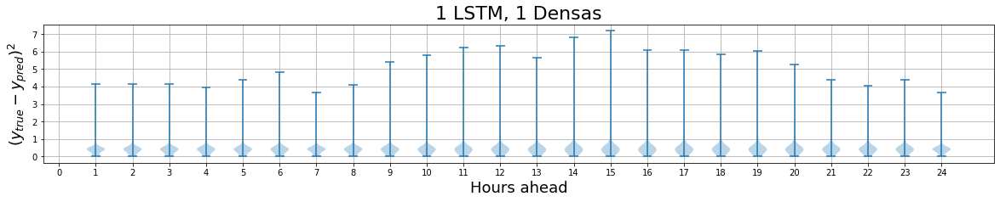

In [ ]:
plt.rcParams["figure.figsize"]=[20,3]
plt.title("1 LSTM, 1 Densas",size=22)
plt.violinplot(tst_loss)
plt.xlabel("Hours ahead",size=18)
plt.ylabel("$(y_{true}-y_{pred})^2$",size=18)
plt.xticks(np.arange(25))
plt.grid()
plt.show()

* Conclusiones: En promedio, podemos decir que las predicciones generadas son mucho menores que 1 usando MSE como estimador del error, además, todas las curvas son muy similares a lo que serían las distribuciones normales. Existen datos outlier que, en todos los casos, no entorpecieron las predicciones y estaban acotados entre las 4 y 7 unidades. Los puntos en donde se presentaron más errores fueron donde donde la radiación fue más alta, véase en los casos desde $x=9$ a $x=15$ horas, ambos incluidos. Creemos que se debe a que las noches siempre mantiene, en promedio, una temperatura constante y la radiación entrante es muy poca en comparación al día, por lo demás, la radiación percibida también depende de las estacionalidades de la data (¿invierno? ¿verano?), que probablemente LSTM no fue capaz de capturarlo precisamente en los casos donde falló.

## 1.d) Parameters & hyperparameters tunning. 

##### I) Como se habrá percatado, existe una **inmensa** cantidad de hiperparámetros que uno puede ajustar en las arquitecturas de redes neuronales (learning rate, profundidad de red, n° de neuronas en cada capa, optimizador, cantidad de epochs), también se puede considerar como hiperparámetro si es que incluir o no métodos tales como batch normalization, regularización L1/L2 o dropout en la red neuronal, a la vez habrá qué decidir dónde situar estos métodos, y cómo ajustar sus propios hiperparámetros. Aún más, también es posible experimentar con la manipulación del dataset, p.ej decidir si usar una entrada univariada, multivariada, o un punto intermedio (y si es un punto intermedio qué variables ocupar), también es posible variar el largo de las series de tiempo de entrada.

Prepare un código para hacer **Random Search**, dado que los tiempos de entrenamiento serán desproporcionados, **NO ENTRENE** las redes neuronales, pero evalúe en el conjunto de validación como si las hubiese entrenado para escoger los ""mejores"" parámetros & hiperparámetros de la red neuronal. Mantenga el objetivo de predecir la radiación para las siguientes 24 horas. **Imprima** (print) los valores de los parámetros & hiperparámetros de la red que se esté evaluando, indicando a qué corresponde, y recolecte el error de validación. Realice un Random Search de largo 100, apóyese en el código entregado, **expándalo** desde la búsqueda de 3 hiperparámetros/parámetros hasta una búsqueda de al menos **12** hiperparámetros/parámetros, puede escoger de los ejemplos dados en el primer párrafo de este ítem, o bien escoger por su propia cuenta. El código debe ser funcional, es decir, las _arquitecturas/manipulaciones del dataset_ indicadas por los hiperparámetros/parámetros deben ser efectivamente aplicadas en la construcción de la red neuronal y/o manipulación de datos. Note que en el código dado, un hiperparámetro a ajustar es recurrent dropout. **Indique** cuál fue la mejor arquitectura encontrada según el error de validación.

**Preguntas:** 

i) ¿Qué alternativas al Random Search existen? Nombre al menos una. 

ii) ¿Qué hace el método recurrent dropout?

1. Otra alternativa directa es grid search que, en vez de realizar una búsqueda aleatoria, busca durante intervalos finitos, la permutación tal de parámetros que genere las mejores generalizaciones mediante pequeños entrenamientos.
2. Recurrent dropout al igual que en las distintas técnicas, inhabilita el entrenamiento de ciertos nodos durante el tiempo, pero la gran diferencia es que es aplicado en redes recurrentes, o en este caso concreto, a redes LSTM

In [ ]:
from keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adadelta
from keras.regularizers import l1,l2

In [ ]:
val_h=[]
optimizers = [
              {"fun": SGD, "title": "SGD"}, 
              {"fun": Adam, "title": "Adam"}, 
              {"fun": RMSprop, "title": "RMSprop"}, 
              {"fun": Adagrad, "title": "Adagrad"}, 
              {"fun": Adadelta, "title": "Adadelta"}]
initializers=["uniform", "he_uniform", "glorot_normal"]
activations=["sigmoid", "tanh", "relu"]
regularizers=[{"fun": l1, "name": "L1"}, {"fun": l2, "name": "L2"}]

best = {}

for random_search in range(100):
  prof_rnn=np.random.randint(1,4) #
  neu_rnn=[np.random.randint(20,40) for t in range(prof_rnn)] #
  rec_drop=np.random.uniform(0,0.7) #
  
  learn_rate=np.random.uniform(0.001,0.1) #
  prof_dense=np.random.randint(1,4) #
  neu_denses=[np.random.randint(20,50) for _ in range(prof_dense-1)] #
  optimizer=optimizers[int(np.random.uniform(0, len(optimizers)-1))] #
  # batch_size=np.random.uniform(32, 100)
  kernel_init=initializers[int(np.random.uniform(0, len(initializers)-1))] #
  activ=activations[int(np.random.uniform(0, len(activations)-1))] #
  regularize=np.random.randint(0,1) #
  regularizer=regularizers[int(np.random.uniform(len(regularizers)-1))] #
  reg_lambda=np.random.uniform(0,0.1) #

  input_lstm= input_layer.Input(shape=(x_tr.shape[1:]))
  for i,neu in enumerate(neu_rnn):
    if i==0: 
      rnn=layers.LSTM(units=neu_rnn[0],return_sequences=True if prof_rnn > 1 else False,recurrent_dropout=rec_drop)(input_lstm)
    else: 
      rnn=layers.LSTM(units=56,return_sequences=(i+1<prof_rnn), recurrent_dropout=rec_drop)(rnn)
  
  #dens=layers.Dense(len_out, activation=activ, kernel_initializer=kernel_init)(rnn)
  if regularize:
    dens=layers.Dense(len_out, activation=activ, kernel_initializer=kernel_init, activity_regularizer=regularizer["fun"](reg_lambda))(rnn)
  else:
    dens=layers.Dense(len_out, activation=activ, kernel_initializer=kernel_init)(rnn)

  for i in range(prof_dense-1):
    if i == (prof_dense-1)-1:
      if regularize:
        dens=layers.Dense(len_out, activation=activ, kernel_initializer=kernel_init, activity_regularizer=regularizer["fun"](reg_lambda))(dens)
      else:
        dens=layers.Dense(len_out, activation=activ, kernel_initializer=kernel_init)(dens)
    else:
      if regularize:
        dens=layers.Dense(neu_denses[i], activation=activ, kernel_initializer=kernel_init, activity_regularizer=regularizer["fun"](reg_lambda))(dens)
      else:
        dens=layers.Dense(neu_denses[i], activation=activ, kernel_initializer=kernel_init)(dens)
    
  model=models.Model(inputs=input_lstm, outputs=dens)
  model.compile(loss='mse', optimizer=optimizer["fun"](learning_rate=learn_rate))
  y_pred=model(x_val)
  val_loss=tf.math.reduce_mean(tf.keras.losses.MSE(y_val, y_pred)).numpy()

  if random_search == 0:
    best = {
        "val_loss": val_loss,
        "prof_rnn": prof_rnn,
        "neu_rnn": neu_rnn,
        "rec_drop": rec_drop,
        "learn_rate": learn_rate,
        "prof_dense": prof_dense,
        "neu_denses": neu_denses,
        "optimizer": optimizer,
        "kernel_init": kernel_init,
        "activ": activ,
        "regularize": regularize,
        "regularizer": regularizer,
        "reg_lambda": reg_lambda
    }

  if best["val_loss"] > val_loss:
    best = {
        "val_loss": val_loss,
        "prof_rnn": prof_rnn,
        "neu_rnn": neu_rnn,
        "rec_drop": rec_drop,
        "learn_rate": learn_rate,
        "prof_dense": prof_dense,
        "neu_denses": neu_denses,
        "optimizer": optimizer,
        "kernel_init": kernel_init,
        "activ": activ,
        "regularize": regularize,
        "regularizer": regularizer,
        "reg_lambda": reg_lambda
    }

  val_h.append(val_loss)
  
  print("profundidad rnn: {}\nneuronas rnn: {}\nrecurrent dropout: {}".format(prof_dense, neu_rnn, rec_drop))
  print("learning rate: {}\nprofunidad fdd: {}\nneuronas fdd: {}".format(learn_rate, prof_dense, [len_out] + neu_denses))
  print("optimizador: {}\nkernel inicializador: {}\nactivacion: {}".format(optimizer["title"], kernel_init, activ))
  print("regulacion activada: {}".format(regularize))
  if regularize:
    print("regularizador: {}\nlambda: {}".format(regularizer["title"], reg_lambda))
  print("\nvalidation error: ",val_loss)
  print(""*120)
  

print("La mejor combinación encontrada obtuvo val loss {}, y la combinación de parametros la sig:".format(best["val_loss"]))
print("profundidad rnn: {}\nneuronas rnn: {}\nrecurrent dropout: {}".format(best["prof_dense"], best["neu_rnn"], best["rec_drop"]))
print("learning rate: {}\nprofunidad fdd: {}\nneuronas fdd: {}".format(best["learn_rate"], best["prof_dense"], [len_out] + best["neu_denses"]))
print("optimizador: {}\nkernel inicializador: {}\nactivacion: {}".format(best["optimizer"]["title"], best["kernel_init"], best["activ"]))
print("regulacion activada: {}".format(best["regularize"]))
if regularize:
  print("regularizador: {}\nlambda: {}".format(best["regularizer"]["title"], best["reg_lambda"]))

profundidad rnn: 1
neuronas rnn: [29, 20]
recurrent dropout: 0.6158558438530579
learning rate: 0.010582260639825161
profunidad fdd: 1
neuronas fdd: [24]
optimizador: SGD
kernel inicializador: he_uniform
activacion: tanh
regulacion activada: 0

validation error:  0.9851058

profundidad rnn: 3
neuronas rnn: [36, 34, 22]
recurrent dropout: 0.17173843086521118
learning rate: 0.056702282180120044
profunidad fdd: 3
neuronas fdd: [24, 30, 28]
optimizador: Adagrad
kernel inicializador: uniform
activacion: sigmoid
regulacion activada: 0

validation error:  1.2370034

profundidad rnn: 1
neuronas rnn: [39]
recurrent dropout: 0.28369678940233006
learning rate: 0.058155944556191025
profunidad fdd: 1
neuronas fdd: [24]
optimizador: RMSprop
kernel inicializador: uniform
activacion: sigmoid
regulacion activada: 0

validation error:  1.2402142

profundidad rnn: 3
neuronas rnn: [24]
recurrent dropout: 0.2900968670887471
learning rate: 0.001026187121298081
profunidad fdd: 3
neuronas fdd: [24, 20, 24]
opt

##### II) Implemente sobre el código de Random Search la funcionalidad de realizar Cross-Validation con 5 Folds para cada red neuronal creada en el proceso de Random Search. Dado que se está trabajando con series de tiempo ocupe la función TimeSeriesSplit. Nuevamente **NO ENTRENE** las redes neuronales. El conjunto de entrenamiento y validación deben ser uno inicialmente para luego ser divididos en cada Fold, el conjunto de test se debiese mantener hasta el final. Calcule el error en el conjunto de validación de cada Fold y use el promedio de los 5 Folds para evaluar el rendimiento de cada red neuronal, encuentre los ""mejores"" parámetros/hiperparámetros basado en estos promedios.

**Preguntas:**

i) Visite la página https://scikit-learn.org/stable/modules/cross_validation.html . **Nombre y explique** el método TimeSeriesSplit y al menos otros 3 métodos de cross-validation. ¿Por qué time series split es adecuado para nuestro caso?

ii) ¿Cuáles son los fundamentos de Cross Validation en general (como herramienta de selección de hiperparámetros)?

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
data_tr_val, time_tr_val = data_hr[:int(data_hr.shape[0]*0.85)],time_hr[:int(data_hr.shape[0]*0.85)] # DIVIDE IN EACH FOLD
data_tst, time_tst = data_hr[int(data_hr.shape[0]*0.85):],time_hr[int(data_hr.shape[0]*0.85):] # KEEP IT UNTIL THE END
# se debiese estandarizar en cada Fold ajustando el scaler con la data de entrenamiento que se genere

# 2. RNN sobre texto

Hoy en dı́a, una aplicación relevante de las redes neuronales recurrentes es el modelamiento de texto y lenguaje natural. En esta sección abordaremos el problema de procesar sentencias de texto, proporcionadas por GMB (*Groningen Meaning Bank*), para reconocimiento de entidades y tagger. En específico, trabajaremos con el dataset proprocionado a través de __[Kaggle](https://www.kaggle.com/abhinavwalia95/entity-annotated-corpus)__, que está compuesto por más de un millón de palabras, a fin de realizar predicciones sobre distintas tareas del tipo *many to many* y *many to one*.

<img src="https://i.stack.imgur.com/b4sus.jpg" width="70%" />


## 2.a Carga de datos y preprocesamientos


##### I) Investigue en la documentación del dataset cual es la tarea original para el cual fue propuesto, en particular cuál es la variable que buscamos predecir, a qué se refiere esta misma y por qué es necesario utilizar técnicas avanzadas para resolver esta tarea (¿no bastaría con un diccionario?).

Cargue el conjunto de datos. Este conjunto de datos es bastante grande, por lo que como ven en el código propuesto, nos contentaremos con no considerar las lineas corruptas del registro.

En esta primera instancia trabajaremos con la tarea de realizar un NER *tag* (**Named Entity Recognition**) sobre cada una de las palabras en las sentencias que se nos presenta en los datos. Esta tarea es del tipo *many to many*, es decir, la entrada es una secuencia y la salida es una secuencia, sin *shift*, por lo que necesitaremos una estructura de red adecuada a ésto. En primer lugar extraiga las columnas que utilizaremos del dataset **¿Por qué es conveniente utilizar *lemma* en vez de la palabra misma *word*?**


- El objetivo del dataset GMB es proporcionar una gran colección de textos en inglés con anotaciones semánticas con semántica formal en lugar de superficial. Entre sus objetivos esta integrar los fenómenos en un
formalismo único, en lugar de cubrir fenómenos individuales en
de forma aislada. Esto proporciona un mejor manejo para explicar las dependencias entre varios fenómenos lingüísticos ambiguos. Otro objetivo es anotar textos, no oraciones aisladas (como en los bancos de árboles ordinarios), lo que por ejemplo permite abordar ambigüedades a nivel oracional que requieren del contexto para poder resolverlas. La construccion de este dataset no fue 100% por humanos ya que se usaron tecnicas de NLP para generalo en combianacion con ayuda colaborativa para refinarlo.
- Por otro lado en el dataset que ocuparemos lo que buscamos predecir son las entidades en un texto, es decir, la variable 'tag'. Para esto usaremos el sistema de tagging IOB el cual contiene los tags de la siguiente forma:
  - B - {CHUNK_TIPO} – para palabras al comienzo del chunk
  - I - {CHUNK_TIPO} – para palabras dentro del chunk
  - O – Fuera del chunk
- Y los tipos de chunk son clasificados en las siguientes clases:
  - geo = Entidad geografica
  - org = Organizacion
  - per = Persona
  - gpe = Entidad geopolitica
  - tim = Indicador de tiempo
  - art = Artefacto
  - eve = Evento
  - nat = Fenomeno natural

- El uso de [lematización](https://es.wikipedia.org/wiki/Lematizaci%C3%B3n) nos permite optimizar el analizis del texto ya que resumimos las palabras flexionadas (plural, femenino, etc) en un sola palabra representante la cual es la representante de todas las otras palabras, esto permite un mejor manejo de las dependencias de varios fenomomenos linguisticos ambiguos ya que nos focalizaremos en un caso en especifico y no en todas sus variaciones las cuales no necesisitamos identificar ya que sin importar si la palabra es femenino/masculino o singular/plural entre otros, si llegase a ser una entidad deberiamos poder identificarla en cualquiera de sus formas, y para evitar tener muchos casos diferentes y por ende tener muchos casos parecidos se usa la lematizacion la cual nos hara lograr un mejor resultado.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

username="patriciobcs"
key="16cf5a22190e2b045539367fe6c7effc"
!pip install -q kaggle
api_token = {"username":username,"key":key}
import json
import zipfile
import os
os.environ['KAGGLE_USERNAME'] = str(username)
os.environ['KAGGLE_KEY'] = str(key)
!kaggle datasets download -d abhinavwalia95/entity-annotated-corpus
if not os.path.exists("/content/NER"):
    os.makedirs("/content/NER")
os.chdir('/content/NER')
for file in os.listdir():
    if file[-4:]==".zip":
      zip_ref = zipfile.ZipFile(file, 'r')
      zip_ref.extractall()
      zip_ref.close()
!ls

 42% 11.0M/26.4M [00:00<00:00, 83.6MB/s]
100% 26.4M/26.4M [00:00<00:00, 129MB/s] 
entity-annotated-corpus.zip  ner.csv  ner_dataset.csv


In [ ]:
df_ner = pd.read_csv("ner.csv", encoding ="cp1252", error_bad_lines=False)
df_ner.dropna(inplace=True)
dataset = df_ner.loc[:,['lemma','tag','word','sentence_idx']]
dataset[0:20]

b'Skipping line 281837: expected 25 fields, saw 34\n'


,lemma,tag,word,sentence_idx
0,thousand,O,Thousands,1.0
1,of,O,of,1.0
2,demonstr,O,demonstrators,1.0
3,have,O,have,1.0
4,march,O,marched,1.0
5,through,O,through,1.0
6,london,B-geo,London,1.0
7,to,O,to,1.0
8,protest,O,protest,1.0
9,the,O,the,1.0


##### II) Para poder utilizar este conjunto de datos, debemos transformar nuestra tabla de palabras y sentencias, a una tabla donde cada entrada sea una sentencia, ademas codificando los distintos lemmas y tags como valores numéricos. Esto pueden realizarlo con alguna de las utilidades de keras o sklearn, sin embargo en el código siguiente se propone un metodo solo usando python y pandas. Pueden utilizar el método que deseen. Note eso si que independiente la aproximación que utilice debe comenzar desde 1 para la codificación, pues el valor 0 lo reservaremos para representar la ausencia de palabras más adelante.

**Explique qué realiza cada linea del código.**

In [ ]:
import numpy as np

# Diccionario donde cada lemma (key) tiene asignado un respectivo indice (value) correspondiente a
# su indice (partiendo de 1) en un listado de los lemmas (sin repeticion) que se encuentra en el dataset   
lemma_to_code = {lemma:code+1 for code, lemma in enumerate(dataset.lemma.unique())}
# Diccionario donde cada tag (key) tiene asignado un respectivo indice (value) correspondiente a
# su indice (partiendo de 1) en un listado de los tag (sin repeticion) que se encuentra en el dataset  
tag_to_code = {tag:code+1 for code, tag in enumerate(dataset.tag.unique())}
# Cantidad de lemmas (sin repeticion) que hay en el dataset
n_lemmas = len(lemma_to_code)

# Cambio de el valor textual de cada lemma (en todos las filas del dataset) a su valor numerico o indice 
# respectivo al diccionario generado anteriormente
dataset['lemma'] = dataset.lemma.apply(lambda x: lemma_to_code[x])
# Cambio de el valor textual de cada tag (en todos las filas del dataset) a su valor numerico o indice 
# respectivo al diccionario generado anteriormente
dataset['tag'] = dataset.tag.apply(lambda x: tag_to_code[x])

# Cambio de forma del dataset
# Se agrupan las filas de acuerdo a la variable "sentence_idx" (todas las filas con el mismo valor quedaran en una sola fila)
# Las variables lemma y tag pasaran a ser listas con diferentes tamaños (en cada fila)
# pero siempre manteniendo el mismo tamaño entre lemma y tag (en cada fila)
# El largo de las listas correspondiente a lemma y tag sera el largo de lemmas correspondietes a la oracion n
dff = dataset.groupby("sentence_idx")[['lemma','tag']].agg(list).applymap(np.asarray)

## 2.b) Distribuciones.

Ahora que ya tenemos las sentencias codificadas y agrupadas, explore el tamaño de estas, en número de lemmas: ¿Son todas las sentencias de igual tamaño? ¿Le hace sentido esto? ¿Las redes que conoce pueden manajar ejemplos de distintos tamaños, y si pueden qué problemas podría traer? ¿Están las clases repartidas de manera equitativa?

Estudie la distribución del largo de los textos a procesar. Estudie también la frecuencia con la que aparecen las palabras en todo el dataset. **¿Se observa una ley Zipf?** (https://es.wikipedia.org/wiki/Ley_de_Zipf). Realice un gráfico de la cantidad de datos por clase. Comente.

Distribuciones

- Las sentencias son de diferentes tamaños los cuales van desde 1 lemma hasta 140 lemmas con un promedio 30 lemmas y una desviacion estandar de 15 lemmas. 
- Tiene mucho sentido de que sea de diferentes tamaños ya que como pudimos ver anteriormente los texto son sacados de manera semiautomatizada y por ende las oraciones son texto reales no diseñados para el dataset ni para las tareas que se pueda resolver con este y como sabemos en el mundo real, las oraciones no siempre tiene el mismo tamaña ni las mismas palabras.
- Para utilizar redes neuronales recurrentes, es necesario definir un largo de las secuencias, esto ya que la unica forma de ingresar los valores a los modelos es mediante tensores/matrices y estos deben tener el formato adecuado, ademas de que deben poder ser definidos los hiperparametros al respecto. De lo contrario, no habria forma en que el modelo pudiera saber los pesos extras que deberia agregar. Sin embargo, si es posible "trabajar" con ejemplos de distintos largos, lo cuales se les puede aplicar padding para hacer calzar los mismos tamaños. Posteriormente, se le pude indicar al modelo cual es el valor del padding (0 por ejemplo) y enmascarar este valor para omitirlo. El riesgo de hacer padding surge cuando hay secuencias con mucho pading y otras con muy poco, es decir alguna antes de hacerle padding eran muy cortan mientras que otras muy largas, aqui podriamos enfrentarnos a vanishing/exploding grandient ya que por ejemplo si tuvieramos solo un output (many to one) la informacion al principio de la secuencia no lograria persistir hasta el final de la secuencia y por ende perderiamos información relevante. Una alternativa es usar mini-batches de diferentes largos, es decir, que cada mini-batch agrupo secuencias del mismo largo, asi se podria entrena un modelo sin correr los riesgos antes mencionados.
- Como podemos ver, las clases de tag no estan repartidas de manera equitativa, los artefacto, eventos y fenomenos naturales tienen un muy baja aparicion respecto a las demas clases, y como podemos ver tambien hay algunas clases como organizacion la cual tiene una gran cantidad de nombres compuestos, es decir, de entidades compuestas por mas de una palabra/lemma mientras que la mayoria de las otras clases tiene una baja cantidad de palabras/lemmas compuestos. Ademas podemos ver que la cantiad de palabras sin clase (o en otras palabras con la clase O) es muy grande, esto hace sentido dado que normalmente para formular una oracion se ocupan muchos conectores, acciones y sustantivos los cuales solo sirven para dar una mejor redaccion y comprension y no mucho para dar informacion importante o para detallar entidades.

In [ ]:
sentences_lenghts = pd.DataFrame(dff.lemma.apply(len))
sentences_lenghts.describe()

,lemma
count,35177.000000
mean,29.871621
std,15.588137
min,1.000000
25%,19.000000
50%,26.000000
75%,38.000000
max,140.000000


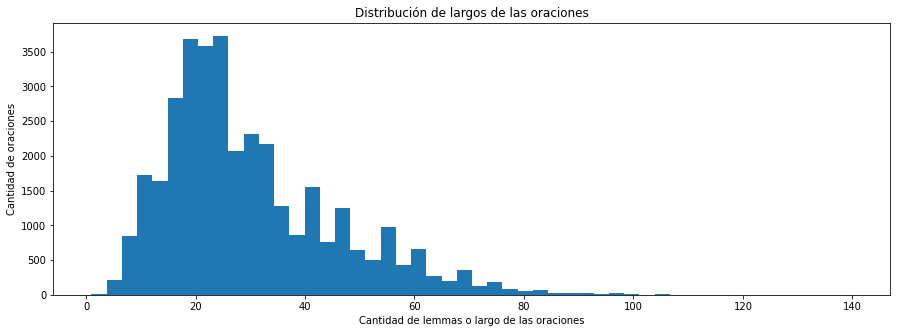

In [ ]:
plt.figure(figsize=(15,5))
plt.hist(sentences_lenghts.lemma, bins=50)
plt.title('Distribución de largos de las oraciones')
plt.xlabel('Cantidad de lemmas o largo de las oraciones')
plt.ylabel('Cantidad de oraciones')
plt.show()

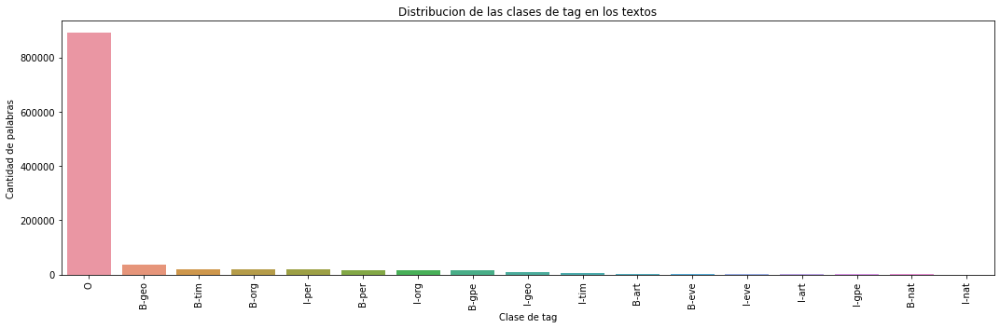

In [ ]:
plt.figure(figsize=(15,5))

ax = sns.countplot(x='tag', data=df_ner, order=df_ner.tag.value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
ax.set_xlabel('Clase de tag')
ax.set_ylabel('Cantidad de palabras')
ax.set_title('Distribución de las clases de tag en los textos')
plt.tight_layout()
plt.show()

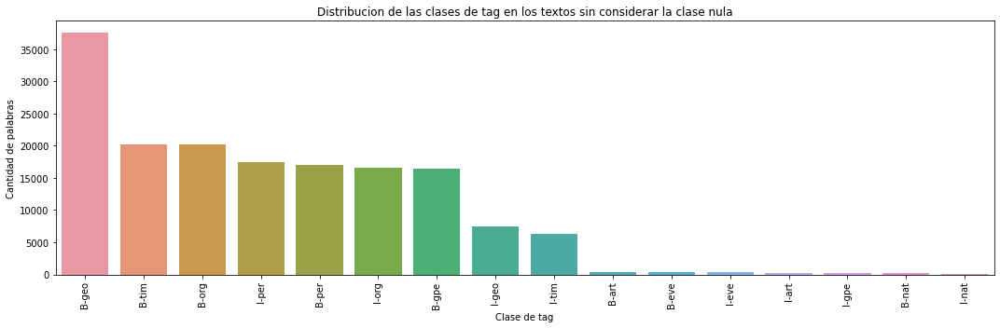

In [ ]:
plt.figure(figsize=(15,5))

df_ner_tags = df_ner[df_ner.tag != 'O']
ax = sns.countplot(x='tag', data=df_ner_tags, order=df_ner_tags.tag.value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
ax.set_xlabel('Clase de tag')
ax.set_ylabel('Cantidad de palabras')
ax.set_title('Distribución de las clases de tag en los textos sin considerar la clase nula')
plt.tight_layout()
plt.show()

Ley de Zipf

- Como podemos ver, en cuanto a los largos de las oraciones no podemos apreciar la ley de Zipf, si nos fijamos las distribuciones no se asemejan. Pero por otro lado, en cuanto a las lemmas si podemos apreciar la ley de Zipf, este es un fenomeno que se puede apreciar en cualquier conjunto de palabras no manipulado y que claramente no podia falta en este conjunto de palabras, esto es un buen indicador por ende de que los texto no fueron modificados o arreglados especificamente para ciertos problemas y que por ende la data es real y tiene una representacion significativa de un problema real.

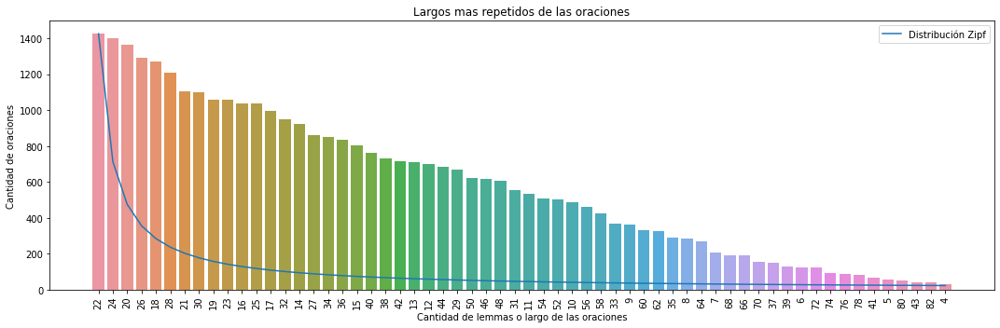

In [ ]:
plt.figure(figsize=(15,5))

n = 60
counts = sentences_lenghts.lemma.value_counts()
max_counts = max(counts)
x = np.arange(n)
y = np.vectorize(lambda i: max_counts * (1 / (i + 1)))(x)

ax = sns.countplot(x='lemma', data=sentences_lenghts, order=counts.iloc[:n].index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
plt.title('Largos mas repetidos de las oraciones')
plt.xlabel('Cantidad de lemmas o largo de las oraciones')
plt.ylabel('Cantidad de oraciones')
plt.plot(x, y, label="Distribución Zipf")
plt.tight_layout()
plt.legend()
plt.show()

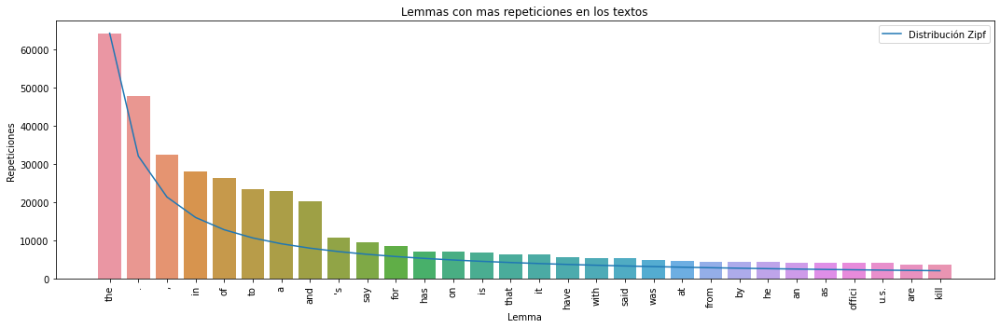

In [ ]:
plt.figure(figsize=(15,5))

n = 30
counts = df_ner.lemma.value_counts()
max_counts = max(counts)
x = np.arange(n)
y = np.vectorize(lambda i: max_counts * (1 / (i + 1)))(x)

ax = sns.countplot(x='lemma', data=df_ner, order=counts.iloc[:n].index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
ax.set_xlabel('Lemma')
ax.set_ylabel('Repeticiones')
ax.set_title('Lemmas con mas repeticiones en los textos')
plt.plot(x, y, label="Distribución Zipf")
plt.tight_layout()
plt.legend()
plt.show()

## 2.c) Padding y one hot vectors


##### I) En esta parte de la tarea, deben lograr que todas las secuencias de lemmas (y los tags correspondientes) queden del mismo largo, es decir realizar padding. El padding debe realizarse con el valor 0, pueden escoger si realizarlo al comienzo de la secuencia o al final, expliquen su elección. Pueden utilizar la función keras.preprocessing.sequence.pad_sequences o escribir sus propios códigos. Elija un valor de maxlen que le parezca adecuado.

¿Opinan que es deseable utilizar el valor 0 como codificación de palabras que "no existen", o creen que es irrelevante por ejemplo que su valor sea 1?

- Por defecto viene un padding al comienzo de las secuencias, esto debido a que una gran parte de los problemas que se suelen resolver son many to one, donde el output se obtiene luego de procesar toda la secuencia, es en esos problemas donde realmente es importante establecer un padding al comienzo de las secuencias a modo de que la informacion persista al momento de dar un output, a modo de ejemplo podemos analizar como se comunican las personas, si una persona X le habla a una Y y la persona Y espera un largo tiempo para responder entonces no recordara mucho de lo que le dijo la persona X, por el contrario si la persona Y le responde inmediatamente, esta podra recordar gran parte de los que dijo la persona X y por ende lograr una conversacion mas consistente. Este fenomeno lo podemos apreciar en una gran cantidad de estudios realizados, como el realizado por [Mahidhar y Reddy](https://arxiv.org/pdf/1903.07288.pdf) en el cual se analizan para modelos many to one la eficiencia de pre y post padding. 
- Sin embargo, el problema que tenemos que resolver es many to many, es por esto que las secuencias las podemos dejar con padding al comienzo o al final, en esta ocación ocuparemos padding posterior ya que el output final no nos intersa, si no que nos interesa el output de cada uno de iteraciones, es por esto que tampoco queremos que los zeros al comienzo de la secuencias afecten a los posibles resultados de los valores no nulos en las secuencias.
- Por otro lado usaremos un largo de 82 ya que este es el largo maximo que aparece el el top 60 que pudimos ver anteriromente, esto quiere decir que las secuencias mas largas son muy pocas y que por ende no nod deberiamos procupar de ellas (no se perdera mucha información), tambien truncaremos las palabras a posterior, ya que como sabemos las oraciones no son diseñadas manualmente y por ende representan oraciones reales, esto quiere decir que como ya sabemos la mayoria de las partes importantes de las oraciones esta en el comienzo que es cuando damos a conocer una idea y en el desenlace de la oracion normalemente se detalla la idea dada.
- Es importante usar el valor 0, ya que este representa el "no lemma", como vimos anteriormente el diccionario que generamos para los lemmas consideraba los el incide del primer lemma parte de 1 y no de 0 ya que este valor lo reservamos para representa el "no lemma". Simepre es importante poder diferencias los datos, ya que si por ejemplo hubiesemos hecho padding con un valor de 1, este habria representado a la primera palabra de nuestro diccionario y por ende estaria alterando la naturaleza del dataset, lo cual nos llevaria a resultados no deseados.


In [ ]:
from keras.preprocessing.sequence import pad_sequences

max_len = 82

dff.lemma = pad_sequences(dff.lemma, maxlen=max_len, padding='post', truncating='post', value=0).tolist()
dff.tag = pad_sequences(dff.tag, maxlen=max_len, padding='post', truncating='post', value=0).tolist()

##### II) Para poder entregar una clasificación sobre los distintos *tags* es necesario transformarlos a *one hot vectors*, debido a que están codificados en números enteros, esto resultará en un arreglo tridimensional con la cantidad de ejemplos, la cantidad máxima de palabras y la cantidad de posibles *tags*. Luego de esto cree los conjuntos de entrenamiento y de prueba con el código a continuación **¿Cuáles son las dimensiones de entrada y salida de cada conjunto?** Comente


Las dimenciones de entrada son (21105, 82) para el entrenamiento y (7036, 82) para prueba y validación, donde el primer valor es la cantidad de oraciones que hay para cada etapa y el segundo valor el largo de las secuencias (oraciones mas padding). Mientras que las de dimenciones de salida son (21105, 82, 18) para entrenamiento y (7036, 82, 18) para prueba y validación, donde el primer valor representa la cantidad de oraciones para cada etapa, el segundo valor la cantidad de elementos que tienen las secuencias las cuales consideran el padding, y el ultimo valor represanta la cantidad de tag disponibles considerando el tag O.

In [ ]:
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical

n_tags = len(tag_to_code) + 1
X = np.matrix(dff.lemma.tolist())
Y = np.asarray([to_categorical(i, num_classes=n_tags) for i in dff.tag])

X_tr, X_test, Y_tr, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)

x_tr, x_val, y_tr, y_val = train_test_split(X_tr, Y_tr, test_size=0.25, random_state=1)

In [ ]:
x_tr.shape,y_tr.shape,x_val.shape,y_val.shape,X_test.shape,Y_test.shape

((21105, 82),
 (21105, 82, 18),
 (7036, 82),
 (7036, 82, 18),
 (7036, 82),
 (7036, 82, 18))

## 2.d) RNN many to many



##### I) Defina una red neuronal recurrente *many to many* con compuertas LSTM para aprender a *tagear* la entidad en el texto, entrene y evalúe su desempeño sobre ambos conjuntos. Esta red debe procesar la secuencia de *lemmas* rellenados (o sin rellenar) y entregar el *tag* a cada uno de los *lemmas*, por lo que la salida de la red no es un vector como anteriormente se ha trabajado, sino que tiene una dimensión extra la cual es debido a que en cada instante de tiempo se necesita entregar un *output*. Como los *lemmas* corresponden a datos esencialmente categóricos, o al menos discretos, es necesario generar una representación vectorial de ellas. La primera capa de la red a construir debe por lo tanto incluir una transformación entrenable desde el espacio de representación original (discreto) a ${\rm I\!R}^{d}$ , con $d$ la dimensionalidad del *embedding*. **Comente sobre los cambios que sufre un dato al ingresar a la red y la cantidad de parámetros de la red**.


Para ingresar un lemma a la red esta es primero pasada por un Embedding el cual cambia su dimencionalidad, es decir, primero se vuelve el codigo del lemmma a one-hot vector de dimencion (20244,), luego este vector se multiplica por una matriz de embedding de dimención (20244, 32) donde tenemos 20244*32=647808 parametros que aprender. Posterirormente obtenmos un vector de dimención (32,) por cada lemma de la secuencia, al ser 82 lemmas por secuencia, el output del primer layer (embedding) sera de dimencion (82, 32). Posteriormente estos datos son ingresados a la LSTM, la cual tiene recibe vectores de dimencion (32,) por ende sus parametros seran 4*(128*32 + 128**2 + 128) = 82432. Y finalmente tenemos una capa densa en la salida que recibe un vector de 128 y retorna uno de 18 (tags), por lo tanto tendra (128 + 1)*18=2322 parametros. Es por esto que tenemos un total de 732562 parametros.

In [ ]:
unique_data = [list(x) for x in set(tuple(x) for x in dff.lemma)]

In [ ]:
print('n_lemmas con padding:', len(dff.explode('lemma').lemma.unique()))
print('n_lemmas sin padding:', n_lemmas)
print('n_tags con padding:  ', len(dff.explode('tag').tag.unique()))
print('n_tags sin padding:  ', n_tags)

n_lemmas con padding: 20244
n_lemmas sin padding: 20243
n_tags con padding:   18
n_tags sin padding:   18


In [ ]:
n_lemmas = len(dff.explode('lemma').lemma.unique())
tags = dff.explode('tag').tag.unique()
n_tags = len(tags)

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Embedding, Dense

#¿problemas con el embedding al ejecutar? chequear que el n_lemas, n_tags, y max_len correspondan a los datos modificados con padding
m = Sequential()
embedding_dim = 32
m.add(Embedding(input_dim=n_lemmas, output_dim=embedding_dim, input_length=max_len))
m.add(LSTM(units=128,return_sequences=True))
m.add(Dense(n_tags, activation='softmax'))
m.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['acc'])
print(m.summary())
m_history = m.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=6, batch_size=128)

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_18 (Embedding)     (None, 82, 32)            647808    
_________________________________________________________________
lstm_15 (LSTM)               (None, 82, 128)           82432     
_________________________________________________________________
dense_14 (Dense)             (None, 82, 18)            2322      
Total params: 732,562
Trainable params: 732,562
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/6
165/165 [==============================] - 56s 325ms/step - loss: 1.2041 - acc: 0.7205 - val_loss: 0.3228 - val_acc: 0.9412
Epoch 2/6
165/165 [==============================] - 52s 313ms/step - loss: 0.3004 - acc: 0.9422 - val_loss: 0.2113 - val_acc: 0.9448
Epoch 3/6
165/165 [==============================] - 51s 311ms/step - loss: 0.1889 - acc: 0.9481 - val_l

Para evaluar su modelo utilice una métrica adecauda para el desbalance presente entre las clases.

In [ ]:
!pip install sklearn_crfsuite
from sklearn_crfsuite.metrics import flat_classification_report 

     |████████████████████████████████| 747kB 6.7MB/s 


In [ ]:
labels = ['Empty'] + list(df_ner.tag.unique())
y_true = np.argmax(Y_test, axis=-1)

def class_report(model):
  y_pred = np.argmax(model.predict(X_test), axis=-1)
  print(flat_classification_report(y_true, y_pred, target_names=labels, digits=3, zero_division=0))

In [ ]:
class_report(m)

              precision    recall  f1-score   support

       Empty      1.000     1.000     1.000    368691
           O      0.965     0.992     0.978    176532
       B-geo      0.774     0.818     0.795      7427
       B-gpe      0.838     0.906     0.870      3286
       B-per      0.786     0.588     0.673      3243
       I-geo      0.690     0.523     0.595      1416
       B-org      0.703     0.387     0.499      4090
       I-org      0.637     0.376     0.472      3339
       B-tim      0.895     0.768     0.827      4043
       B-art      0.000     0.000     0.000        82
       I-art      0.000     0.000     0.000        52
       I-per      0.788     0.796     0.792      3316
       I-gpe      0.000     0.000     0.000        35
       I-tim      0.702     0.451     0.549      1157
       B-nat      0.000     0.000     0.000        56
       B-eve      0.000     0.000     0.000        85
       I-eve      0.000     0.000     0.000        78
       I-nat      0.000    

Al usar classification report, podemos evaluar clase por clase el modelo y asi obtener una vista mas detallada. El F1-score nos permite resumir que tan bien esta clasificando el modelo y el macro avg, nos permite resumir todos los F1-score en uno solo dandole igual peso a cada uno sin importar la canidad de ejemplos disponibles, mientras que el weighted avg nos permite resumir todos los F1-score per asignandole el peso (porcentage de ejemplos por clase respecto al total) y asi poder apreciar mejor el comportamiento general. El macro avg suele se peor ya que los modelos tienden a asignar mas veces la clase que mas se repite (ley de zipf otr vez) y por esto cuando hay muy pocos ejemplos de una clase, este practicamente no se clasifica, y como el macro avg considera a todos por igual, las clases no clasficadas, es decir con F1-score igual a 0 hacen que el resultado sea muy bajo.

##### II) Varı́e la dimensionalidad del embedding inicial y determine si **aumenta o disminuye el error de clasificación**. Comente.

Como podemos ver, a medida que aumentabamos la dimención del embedding, tambien aumentaba el accuracy (ligeramente). Tambien podemos observar que el F1-score es mejor mientras se aumenta la dimención del embedding, por lo que podemos concluir que es mejor subir la dimencionalidad de este, pero simepre hasta cierto punto. Esto ya que asi permitimos poder generar mas contextos a los cuales se adecuenten los diferentes lemas, como vimos anteriormente, los lemmas corresponden a agrupaciones de palabras, por ende, es muy factible que varias de estas tengan factores en comun, al ser 20244 vamos a encontrar varios factores en comun, por ende es recomendable permitir que se puedan generar estos contextos al usar embedding con gran dimencion, por ejemplo podria surgir contextos de palabras usadas en los hospitales, otras usadas academicamente, etc.  

In [ ]:
for embedding_dim in range(20, 45, 5):
  print('Embedding de dimención', embedding_dim)
  m = Sequential()
  m.add(Embedding(input_dim=n_lemmas, output_dim=embedding_dim, input_length=max_len))
  m.add(LSTM(units=128,return_sequences=True))
  m.add(Dense(n_tags, activation='softmax'))
  m.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['acc'])
  history = m.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=6, batch_size=128, verbose=0)
  class_report(m)

Embedding de dimención 20
              precision    recall  f1-score   support

       Empty      0.999     1.000     0.999    368691
           O      0.961     0.993     0.976    176532
       B-geo      0.722     0.805     0.761      7427
       B-gpe      0.780     0.858     0.817      3286
       B-per      0.741     0.518     0.610      3243
       I-geo      0.613     0.493     0.546      1416
       B-org      0.637     0.257     0.366      4090
       I-org      0.532     0.228     0.319      3339
       B-tim      0.887     0.746     0.811      4043
       B-art      0.000     0.000     0.000        82
       I-art      0.000     0.000     0.000        52
       I-per      0.781     0.755     0.767      3316
       I-gpe      0.000     0.000     0.000        35
       I-tim      0.824     0.360     0.501      1157
       B-nat      0.000     0.000     0.000        56
       B-eve      0.000     0.000     0.000        85
       I-eve      0.000     0.000     0.000        78
 

## 2.e) RNN Bidireccional y masking


##### I) Algunos autores señalan la importante dependencia que existe en texto, no solo con las palabras anteriores, sino que con las que siguen.**Mejore la red definida en 2.d.I) utilizando una red neuronal recurrente Bidireccional**, es decir, con recurrencia en ambas direcciones sobre la secuencia de *lemmas* de entrada. Comente **cuál debiera ser la forma correcta de usar el parámetro *merge_mode*** (concatenar, multiplicar, sumar o promediar) para este caso. Además comente las transformaciones que sufre el patrón de entrada al pasar por las capas. **¿Mejora o empeora el desempeño?** Analice.

Para comparar, entrenaremos 3 modelos con el parametro merga_change igual a sum, ave y mul, ya que estos nos entregaran un output del tamaño adecuado al que estabamos trabajando anteriormente. Concat nos entregaria un red diferente y por ende no podriamos hablar de uan buena comparacion, ademas de que para el caso actual no seria bueno tener un vector del doble de tamaño para definir que tag es el indicado ya que no indicaria correctamente la posicion del lemma.

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Embedding, Dense, Bidirectional

embedding_dim = 32
chooses = ['sum', 'ave', 'mul']
n_labels = n_tags
models = []

for choose in chooses:
  model = Sequential()
  model.add(Embedding(input_dim=n_lemmas, output_dim=embedding_dim, input_length=max_len))
  layer_lstm = LSTM(units=100,return_sequences=True)
  model.add(Bidirectional(layer_lstm,merge_mode=choose))
  model.add(Dense(n_labels, activation='softmax'))
  model.summary()
  model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['acc'])
  history = model.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=6, batch_size=128)
  models.append({'history': history, 'model': model})

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_19 (Embedding)     (None, 82, 32)            647808    
_________________________________________________________________
bidirectional_9 (Bidirection (None, 82, 100)           106400    
_________________________________________________________________
dense_15 (Dense)             (None, 82, 18)            1818      
Total params: 756,026
Trainable params: 756,026
Non-trainable params: 0
_________________________________________________________________
Epoch 1/6
165/165 [==============================] - 70s 404ms/step - loss: 1.0044 - acc: 0.8068 - val_loss: 0.2835 - val_acc: 0.9432
Epoch 2/6
165/165 [==============================] - 66s 398ms/step - loss: 0.2698 - acc: 0.9427 - val_loss: 0.1805 - val_acc: 0.9497
Epoch 3/6
165/165 [==============================] - 64s 387ms/step - loss: 0.1631 - acc: 0.9534 - val_loss: 

In [ ]:
for i in range(len(chooses)):
  print('Merge mode:', chooses[i])
  class_report(models[i]['model'])

Merge mode: sum
              precision    recall  f1-score   support

       Empty      1.000     1.000     1.000    368691
           O      0.968     0.993     0.980    176532
       B-geo      0.795     0.838     0.816      7427
       B-gpe      0.933     0.896     0.914      3286
       B-per      0.827     0.651     0.729      3243
       I-geo      0.694     0.593     0.640      1416
       B-org      0.720     0.504     0.593      4090
       I-org      0.642     0.425     0.511      3339
       B-tim      0.896     0.811     0.851      4043
       B-art      0.000     0.000     0.000        82
       I-art      0.000     0.000     0.000        52
       I-per      0.789     0.734     0.761      3316
       I-gpe      0.000     0.000     0.000        35
       I-tim      0.765     0.449     0.566      1157
       B-nat      0.000     0.000     0.000        56
       B-eve      0.000     0.000     0.000        85
       I-eve      0.000     0.000     0.000        78
       I-na

##### II) Recientemente se ha implementado la capa de *Masking* en las redes recurrentes en *keras*, lo cual podría traer gran ayuda gracias al *padding* que se realiza con el símbolo especial definido. Entrene la red definida en 2.d.I) y compare al utilizar esta funcionalidad de enmascarar el valor 0  en este caso para el default de la capa embedding.


Para poder ver resultados, descartaremos los valores nulos del classification report ya que estos seran omitidos por el modelo. Como podemos ver el recall mejoro mientras que el presicion empeoro, esto quiere decir que este modelo es mejor cuando necesitamos que se detecten mas clases, a costas de que se comentan mas confusiones entre clases mal clasificadas.

In [ ]:
embedding_dim = 32
mask_model = Sequential()
mask_model.add(Embedding(input_dim=n_lemmas, output_dim=embedding_dim, input_length=max_len,mask_zero=True))
mask_model.add(LSTM(units=128,return_sequences=True))
mask_model.add(Dense(n_tags, activation='softmax'))
mask_model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['acc'])
mask_history = mask_model.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=6, batch_size=128)

Epoch 1/6
165/165 [==============================] - 60s 337ms/step - loss: 0.5302 - acc: 0.8168 - val_loss: 0.2141 - val_acc: 0.8486
Epoch 2/6
165/165 [==============================] - 54s 327ms/step - loss: 0.1833 - acc: 0.8597 - val_loss: 0.1431 - val_acc: 0.8850
Epoch 3/6
165/165 [==============================] - 55s 332ms/step - loss: 0.1374 - acc: 0.8888 - val_loss: 0.1311 - val_acc: 0.8969
Epoch 4/6
165/165 [==============================] - 55s 334ms/step - loss: 0.1227 - acc: 0.9062 - val_loss: 0.1113 - val_acc: 0.9172
Epoch 5/6
165/165 [==============================] - 55s 331ms/step - loss: 0.0979 - acc: 0.9305 - val_loss: 0.0893 - val_acc: 0.9368
Epoch 6/6
165/165 [==============================] - 54s 325ms/step - loss: 0.0760 - acc: 0.9475 - val_loss: 0.0786 - val_acc: 0.9407


In [ ]:
def class_report_without_zeros(model):
  labels = list(df_ner.tag.unique())
  y_pred = np.argmax(model.predict(X_test), axis=-1)
  print(flat_classification_report(y_true, y_pred, labels=list(range(1, 17)), target_names=labels, digits=3, zero_division=0))

In [ ]:
class_report_without_zeros(mask_model)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1989: UserWarning: labels size, 16, does not match size of target_names, 17
  .format(len(labels), len(target_names))


              precision    recall  f1-score   support

           O      0.318     0.987     0.481    176532
       B-geo      0.738     0.826     0.780      7427
       B-gpe      0.923     0.888     0.905      3286
       B-per      0.798     0.699     0.745      3243
       I-geo      0.645     0.643     0.644      1416
       B-org      0.487     0.421     0.451      4090
       I-org      0.540     0.391     0.453      3339
       B-tim      0.881     0.763     0.818      4043
       B-art      0.000     0.000     0.000        82
       I-art      0.000     0.000     0.000        52
       I-per      0.809     0.836     0.822      3316
       I-gpe      0.000     0.000     0.000        35
       I-tim      0.749     0.371     0.496      1157
       B-nat      0.000     0.000     0.000        56
       B-eve      0.000     0.000     0.000        85
       I-eve      0.000     0.000     0.000        78

   micro avg      0.339     0.940     0.499    208237
   macro avg      0.430   

## 2.f) Mejora libre

En base a lo experimentado, **intente mejorar el desempeño de las redes encontradas**, ya sea utilizando y combinando las distintas variaciones que se hicieron en los distintos ítemes, como bien alguna mejora en el pre-proceso de los datos (largo de secuencia, el tipo de *padding* o alguna otra), agregar mayor profundidad, variar el número de unidades/neuronas, utilizando otra *gate* de recurrencia (GRU o Vanilla/Simple), en https://keras.io/layers/recurrent/,  entre otras. Utilice la red entrenada, **se espera que sea la mejor de esta sección**, y **muestre las predicciones**, el *NER tager*, sobre algún ejemplo de pruebas, comente.

Se utilizara una GRU bidireccional con 100 unidades. Esto a modo de lograr mejores resultados. 

In [ ]:
from keras.layers import GRU

gru_model = Sequential()
gru_model.add(Embedding(input_dim=n_lemmas, output_dim=embedding_dim, input_length=max_len))
layer_gru = GRU(units=100,return_sequences=True)
gru_model.add(Bidirectional(layer_gru,merge_mode=choose))
gru_model.add(Dense(n_labels, activation='softmax'))
gru_model.summary()
gru_model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['acc'])
gru_history = gru_model.fit(x_tr,y_tr, validation_data=(x_val,y_val), epochs=6, batch_size=128)

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_13 (Embedding)     (None, 82, 32)            647808    
_________________________________________________________________
bidirectional_8 (Bidirection (None, 82, 100)           80400     
_________________________________________________________________
dense_9 (Dense)              (None, 82, 18)            1818      
Total params: 730,026
Trainable params: 730,026
Non-trainable params: 0
_________________________________________________________________
Epoch 1/6
165/165 [==============================] - 61s 348ms/step - loss: 1.5887 - acc: 0.7209 - val_loss: 0.2725 - val_acc: 0.9446
Epoch 2/6
165/165 [==============================] - 57s 344ms/step - loss: 0.2329 - acc: 0.9456 - val_loss: 0.1521 - val_acc: 0.9579
Epoch 3/6
165/165 [==============================] - 56s 342ms/step - loss: 0.1384 - acc: 0.9621 - val_loss: 

In [ ]:
class_report(gru_model)

              precision    recall  f1-score   support

       Empty      1.000     1.000     1.000    368691
           O      0.969     0.990     0.980    176532
       B-geo      0.777     0.833     0.804      7427
       B-gpe      0.926     0.907     0.916      3286
       B-per      0.782     0.688     0.732      3243
       I-geo      0.695     0.627     0.659      1416
       B-org      0.706     0.452     0.551      4090
       I-org      0.614     0.443     0.514      3339
       B-tim      0.881     0.801     0.839      4043
       B-art      0.000     0.000     0.000        82
       I-art      0.000     0.000     0.000        52
       I-per      0.815     0.805     0.810      3316
       I-gpe      0.000     0.000     0.000        35
       I-tim      0.790     0.475     0.594      1157
       B-nat      0.000     0.000     0.000        56
       B-eve      0.000     0.000     0.000        85
       I-eve      0.000     0.000     0.000        78
       I-nat      0.000    

Como podemos ver los resultados son mucho mejores que los obtenidos anterirmente, se clasifican mejor cada clase y el precision y recall se mantienen altos.

In [ ]:
words = df_ner.lemma.unique()
words = np.insert(words, 0, 'Empty')
tags = df_ner.tag.unique()
tags = np.insert(tags, 0, 'Empty')

In [ ]:
i = 100
min_labels = 3

for i in range(X_test.shape[0]):
  sentence = np.ma.masked_equal(np.squeeze(np.asarray(X_test[i])), 0).compressed()
  pred_labels = np.squeeze(np.argmax(gru_model.predict(sentence), axis=-1))
  if np.unique(pred_labels[pred_labels > 1]).shape[0] >= min_labels:
    true_labels = np.argmax(np.squeeze(np.asarray(Y_test[i]))[:len(sentence)], axis=-1)
    print('Sentencia Nº', i)
    print("{:14} | {:5} | {:5}".format("Word", "True", "Pred"))
    for w, true, pred in zip(sentence, true_labels, pred_labels):
        print("{:14} | {:5} | {:5}".format(words[w], tags[true], tags[pred]))
    break

Sentencia Nº 250
Word           | True  | Pred 
elsewher       | O     | O    
,              | O     | O    
iraqi          | B-gpe | B-gpe
polic          | O     | O    
say            | O     | O    
some           | O     | O    
civilian       | O     | O    
were           | O     | O    
kill           | O     | O    
when           | O     | O    
a              | O     | O    
car            | O     | O    
bomb           | O     | O    
target         | O     | O    
a              | O     | O    
u.s.           | B-geo | O    
militari       | O     | O    
convoy         | O     | O    
explod         | O     | O    
tuesday        | B-tim | B-tim
in             | O     | O    
central        | O     | O    
baghdad        | B-geo | B-geo
.              | O     | O    


Como podemos ver el modelo puede clasificar facilmente 3 clases distintas en un mismo texto, sin embargo, tambien puede omitir algunas, sobre todo cuando estas involucran caracteres no alphanumericos como u.s., lo cual incluso para un humano puede ser facil de confundir.

## 2.g) Escribamos palabras


##### I) Ahora buscaremos otra aplicación a las redes recurrentes, predecir el caracter siguiente. Si logramos entrenar una red que sea buena en esta tarea, podremos escribir texto automáticamente, pues podemos, a partir de una frase, predecir el caracter siguiente, y luego introducir la nueva frase sin el primer caracter en la red nuevamente, e iterando así escribir automáticamente. Si bien las redes recurrentes son adecuadas para esta tarea, no pretendemos entrenar un Shakespeare en esta tarea, sin embargo es interesante investigar qué tan verosimil o no puede lograr ser el texto generado.

Para esto, primero crearmos nuestro nuevo dataset. Para esta tarea preferiremos unir todas las frases en un solo gran corpus y luego crear nuevas secuencias semi redundantes. Esto nos evita primero el problema de tener que hacer padding, pues crearemos todas las entradas iguales, pero también nos permite aprovechar mejor el dataset, de cierta forma aumentando el número de datos. El target en este caso será solo el caracter siguiente correspondiente a cada secuencia.

En este item debe cargar el dataset. **Explique lo que hace el código entregado**

In [ ]:
import numpy as np
import pandas as pd
from keras.utils.np_utils import to_categorical

# Se carga el dataset NER obtenido de Kaggle, se omiten las lineas con problemas
df_w = pd.read_csv(os.path.join("ner.csv"), engine='python', error_bad_lines=False)
# Se remueven las filas con campos incompletos, y se selecciona solo la columna 'word'
df_w = df_w.dropna()[['word']]

# Se genera una cadena que contiene todo el cuerpo del texto 
corpus = ' '.join(list(df_w.word.values)).lower()
# Se define el largo de caracteres de las sentencias
sentence_length = 40
# Se defino la cantidad de caracteres que se saltaran para comenzar la siguiente sentencia
steps = 5

# Arreglos que contendra todas las sentencias -> Input
sentences = []
# Arreglo que contentra el primer caracter de la sentencia posterior (i+1) -> Target
next_char = []
# Se generan las sentencias y el target, se recorre todo el texto
# menos el ultimo caracter, el cual sera usado de target para la ultima sentencia
for i in range(0,len(corpus) - sentence_length - 1 , steps):
  # Se agrega cada sentencia al arreglo de sentencias
  sentences.append(corpus[i:sentence_length+i])
  # Se agrega el target de la sentencia actual
  # el cual corresponde al primer caracter que aparece despues de la sentencia en el texto
  next_char.append(corpus[sentence_length+i])

# Diccionario para convertir un caracter a un numero unico representativo
chars_to_code = {char:code for code, char in enumerate(set(corpus))}
# Diccionario para convertir un numero unico representativo a un caracter
# lo contrario que el diccionario anterior
code_to_chars = {code:char for char,code in chars_to_code.items()}
# Se codifican las sentencia a un valor numerico para poder ser interpretadas por el modelo
x = np.array([[chars_to_code[char] for char in sentence] for sentence in sentences])
# Se codifican los caracteres targets a un valor numerico para poder ser interpretadas por el modelo
y = np.array([chars_to_code[char] for char in next_char])
# Se convierten la representacion de y, se numero enteros a numeros binarios
# contemplando un arreglo del tamaño de la cantidad caracteres targets que hay
# por cada sample, es decir, por cada sentencia
y = to_categorical(y)

Skipping line 281837: Expected 25 fields in line 281837, saw 34


##### II) Entrene ahora una red con estos datos utilizando GRU. El resto de la estructura queda a su elección. Evalúe el desempeño de su red evaluando qué tan bien genera texto, puede utilizar las funciones propuestas como callback para ver como progresa su red. Pruebe a lo menos 2 estructuras distintas.

Una vez esté satisfecho de su red, hágala escribir algunos textos a partir de textos semilla elegidos por usted. Describa sus observaciones. ¿Qué cree ocurriría si entrenamos la red con otro dataset?

Si entrenaramos con otro dataset, en primer lugar nuestro diccionario tomaria contexto diferentes, ya que estos estan muy relacionados con las palabras que se estan ocupando. Si por ejemplo el otra dataset estuviera muy relacionado a una area especial como la medicina, habrian mas contextos de medicina y por ende costaria mas generalizar para cualquier texto que se ingrese. El uso del dataset actual nos brinda una transparencia en el hecho de que esta hecho a partir de texto no especializados, sacados de distintas fuentes formales en su mayoria, esto de cierta forma nos limita a escribir de manera formal para poder obtener resultados buenos. Por otro lado otro dataset podria contener mas palabras unicas o menos, lo cual haria que el modelo tomara mas tiempo o menos en entrenarse ya que el embedding seria mas grande.

In [ ]:
from keras.layers import Embedding
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import GRU
from keras.callbacks import LambdaCallback
from keras.optimizers import RMSprop
from keras.preprocessing.sequence import pad_sequences
import numpy as np
import random
import sys

def predict_char(model, sentence):
    x = [chars_to_code[char] for char in sentence]
    x = pad_sequences([x], maxlen=sentence_length, padding='pre', value=0)
    probas = model.predict(x)[0]
    next_index = np.random.choice(len(chars_to_code), p=probas)
    return code_to_chars[next_index]

def on_epoch_end(epoch, logs):
    print(f'\n Generating random text for epoch: {epoch}')
    start_index = random.randint(0,x.shape[0]-1)
    sentence = ''.join([code_to_chars[code] for code in x[start_index]])
    print('\n Generating with seed: ' + sentence)
    sys.stdout.write(sentence)
    for i in range(400):
        next_char = predict_char(character, sentence)
        sentence = sentence[1:] + next_char #for next character
        sys.stdout.write(next_char)
        sys.stdout.flush()
    return

print_text_callback = LambdaCallback(on_epoch_end=on_epoch_end)

In [ ]:
character = Sequential()
embedding_dim = 100
character.add(Embedding(input_dim=y.shape[1], output_dim=embedding_dim, input_length=x.shape[1]))
character.add(GRU(128,return_sequences=False))
character.add(Dense(y.shape[1],activation='softmax'))
optimizer = RMSprop(lr = 0.01)
character.compile(loss='categorical_crossentropy', optimizer=optimizer,metrics=["acc"])
character.fit(x,y, epochs=1, batch_size = 512,callbacks=[print_text_callback])
character.summary()

2371/2371 [==============================] - 909s 382ms/step - loss: 1.8758 - acc: 0.4533

 Generating random text for epoch: 0

 Generating with seed: 's south . officials say coalition and a
's south . officials say coalition and able health military hear , prapen e stempt ecoveme becevsenman ess netstinivarif befomist peties in nominh gasmeas because of tille cambarly for mowea of out new a newica indeadences in bid no numbsi . abcurer as militations onballed one of mont over out neighors endrance andoinved in dead foves of nimpers . dayman , alsmightina 's nata obassay tark reatestinal otconve notway for ity absmare the kModel: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_14 (Embedding)     (None, 40, 100)           6000      
_________________________________________________________________
gru_2 (GRU)                  (None, 128)               88320     
______________

In [ ]:
character_lstm = Sequential()
embedding_dim = 120
character_lstm.add(Embedding(input_dim=y.shape[1], output_dim=embedding_dim, input_length=x.shape[1]))
character_lstm.add(LSTM(128,return_sequences=False, dropout=0.8))
character_lstm.add(Dense(y.shape[1],activation='softmax'))
character_lstm.compile(loss='categorical_crossentropy', optimizer='adam',metrics=["acc"])
character_lstm.fit(x,y, epochs=1, batch_size = 254,callbacks=[print_text_callback])
character_lstm.summary()

4778/4778 [==============================] - 1310s 274ms/step - loss: 2.4271 - acc: 0.2979

 Generating random text for epoch: 0

 Generating with seed: government is ready to fill the gap with
government is ready to fill the gap with guraw stark birnes on serim in north bzion of korea ministed not cancurimed their peaceakead of nation nigi hort and eurol2s rowsay obar nevlading . month comparliad not month with bomber between nowalks berrar based to staighelar month counts for the . cream bet tran severosoned not anyan seristemen with a by not embar of viepis repare for defears prevenuges abon ome octarypan not beavy ab allieModel: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_31 (Embedding)     (None, 40, 120)           7200      
_________________________________________________________________
lstm_37 (LSTM)               (None, 128)               127488    
_____________

In [ ]:
def complete_sentence(sentence, model, n=40):
  sys.stdout.write(sentence)
  for i in range(n):
          next_char = predict_char(model, sentence)
          sentence = sentence[1:] + next_char #for next character
          sys.stdout.write(next_char)
          sys.stdout.flush()
  sys.stdout.write('\n')

In [ ]:
examples = [
            'health military hear for ',
            'the course of neural networks is ',
            'the year 2020 was ',
            'can i clean this '
]

In [ ]:
for model, name in [[character, 'GRU'], [character_lstm, 'LSTM']]:
  print('Modelo: ', name)
  for sentence in examples:
    complete_sentence(sentence, model)

Modelo:  GRU
health military hear for the for turds on at new lang-dever sirks
the course of neural networks is establed notes of niar let month nownmem
the year 2020 was bewn a cable to corleved 62 2 be deced t
can i clean this bech indian marou voal the conver died n
Modelo:  LSTM
health military hear for tcesply the malition suverism the u.s. f
the course of neural networks is thac . the undected stail 2007 to spatio
the year 2020 was fhorcitiond and in allorgery wairs it pu
can i clean this the u.s. 176 . whe netes say the a.s. pa


Como podemos ver, por un lado usamos GRU y obtuvimos resultados que quizas no tiene cabida en temas de semantica pero si en sintaxis ya que la mayoria de las palabras redactadas si existen. Mientras que al usar LSTM podemos ver que hay mas errores de sintaxis, de igual manera que de semantica. 

# 3. Autoencoders en Fashion MNIST

Si bien las redes neuronales han tenido desempeños sorprendentes en muchas áreas donde antes solo un ser humano podía alcanzar buenos desempeños, uno de sus desventajas suele serla alta dimensionalidad de los espacios de hipótesis. En la práctica, esto implica que para aprender una tarea predictiva con alguna capacidad de generalización, se requieren grandes bases de datos etiquetadas. Esto implica un problema, considerando que al momento de buscar la base de datos, no se tiene a priori una manera de automatizar esta etiquetación. Esta necesidad de gran cantidad de trabajo de clasificación realizado por humanos, ha engendrado soluciones ingeniosas, como la aproximación de _Facebook_ hace algunos años de pedirle a los mismos usuarios que etiquetaran a las personas en sus fotos, o la solución de _Amazon_, _Mechanical Turk_, donde cualquier usuario puede realizar tareas repetitivas de clasificación a cambio de dinero real, o por otro lado cualquier persona puede comprar la etiquetación de una base de datos la cual realizan varias personas en cualquier parte del mundo. 

Otra aproximación, quizás aún más ingeniosa, para solucionar el problema de las etiquetas, es utilizar las bases de datos sin preocuparse de sus etiquetas. Esta aproximación de aprendizaje no supervisado tiene su representante en redes neuronales en los _Autoencoders_, redes que utilizan el mismo input como target y buscan representaciones de menor dimensionalidad al interior de la red. Estas redes han permitido el uso de cantidades masivas de datos para aprender de ellos sin necesidad de tener etiquetas. Durante esta pregunta veremos algunos de los aspectos y posibilidades básicas que nos presentan los _autoencoders_, utilizando una base de datos de imágenes de articulos de vestimenta, el Fashion MNIST. 

## 3.a) Carga de datos y visualizaciones
Cargue los datos. Puede user las funciones de `keras.datasets` como muestra el código o descargarlo manualmente. 

Luego, visualice algunas imagenes de cada una de las catégorias junto con sus nombres (investigue un poco para encontrar la codificación de `y`). Note que las imagenes deben representarse en blanco y negro, puede usar `cmap='Greys'`. ¿Qué pares de categorías cree podrían ocasionar problemas al momento de clasificación? ¿Qué tan bien cree que se desempeñaría un humano en esta tarea?

In [ ]:
from keras.datasets import fashion_mnist
(x_tr,y_tr),(x_val,y_val) = fashion_mnist.load_data()

## 3.b Posibilidades de preprocesamiento y pequeños análisis. 

Las primeras redes que entrenaremos utilizarán arquitecturas _fully connected_, por lo cual también es necesario transformar nuestras imagenes 2-dimensionales a vectores, como muestra el ejemplo de código.

**Preguntas:**

i) ¿Cuáles son los rangos de valores de `x`? ¿Por qué?

ii) ¿Las distintas clases de ejemplos están balanceadas?

iii) ¿Considera necesario realizar un preprocesamiento? Escale los valores de `x` al intervalo $[0,1]$, y guarde el conjunto de datos original de igual manera que el escalado. ¿Se pierde información al realizar este preprocesamiento? 


In [ ]:
x_tr_vector = x_tr.reshape(-1,28*28)
x_val_vector = x_val.reshape(-1,28*28)

## 3.c) Primer Autoencoder

Entrenaremos un primer autoencoder de una capa oculta, usando arquitectura densa. Para esto, utilize como guía los códigos presentados abajo. 

Utilice en primera instancia su conjunto de datos escalados. Considerando el intervalo de los datos escalados.

Entrene esta primera red utilizando pérdida _binary cross entropy_. Compare luego las imagenes originales con las imagenes reconstruidas, como muestra el código. **Grafique** como varia la pérdida a lo largo del entrenamiento y visualice algunas imagenes reconstruidas. 

**Preguntas:**

i) ¿Qué función de activación correspondería a la capa de salida de la red? ¿Debería afectar la elección de la función de activación de la capa oculta? 

ii) ¿Qué le parece el desempeño de la red, logra aprender la tarea en su opinion?

In [ ]:
from keras.layers import Dense
from keras.optimizers import SGD
from keras.models import Sequential

autoencoder = Sequential()

autoencoder.add(Dense(32,activation='')) # encoder
 
autoencoder.add(Dense(28*28,activation= '')) #decoder

autoencoder.compile(optimizer=SGD(lr=0.002),loss='binary_crossentropy')
autoencoder.fit(x_train_vector_scaled,x_train_vector_scaled,epochs=50,validation_data=(x_val_vector_scaled,x_val_vector_scaled))

plt.rcParams["figure.figsize"]=[16,4]
ix = 1
for u in range(5):
  for v in range(2):
    ax = plt.subplot(2,5,ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(autoencoder.predict(x_val_vector_scaled)[ix].reshape(28,28))
    ix += 1
plt.show()

## 3.d) Dimensionalidad

Una forma de interpretar lo que realiza el autoencoder, es considerar que si el autoencoder hace bien su tarea, la información necesaria para reconstruir la imagen original se encuentra en la capa oculta, la cual tiene menor dimensionalidad que la imagen original. Uno puede considerar por lo tanto que la capa de _encoding_ esta comprimiendo la información contenida en la imagen, mientras la capa de _decoding_ hace el proceso contrario, descomprimiendola a su estado original lo mejor posible. 

Explore como cambia el desempeño de la red en cuestión frente a cambios en la dimensión de la capa oculta. Pruebe a lo menos 5 niveles de compresión distintos, incluyendo uno donde la capa oculta tenga $50\%$ de ratio de compresión y otro donde la capa oculta tenga tan solo 2 neuronas. ¿Qué observa?

## 3.e) Deep autoencoder

Pruebe ahora con una arquitectura ligeramente más profunda. Para esto utilice a lo menos 3 capas de encoding, es decir, 3 capas que progresivamente reduzcan la dimensionalidad de la representación hasta una dimensión objetivo inicialmente igual a la mejor obtenida en la pregunta anterior. Utilice igualmente a lo menos 2 capas de decoding, que se encarguen de aumentar la dimensionaliad de la representación hasta alcanzar la dimensión de la imagen original. Note que las primeras capas no necesariamente deben tener menor dimensionalidad que la imagen, la dimensión relevante es aquella de la última capa de encoding. 

Una vez esté satisfecho con su arquitectura profunda, varíe la dimensión objetivo de la última capa de encoding, realizando una exploración similar a la pregunta anterior. Utilice gráficos y muestre algunas imágenes reconstruidas para complementar sus comentarios. 

**Preguntas:**

i) ¿Cómo aumenta el número de parámetros entrenables? ¿Aumenta el tamaño de la representación "comprimida"?

ii) ¿Puede obtener una representación de menor dimensionalidad que la encontrada en el item anterior sin perder calidad en las imagenes obtenidas?

## 3.f) Convolutional Autoencoder

Como hemos hasta ahora  utilizado una arquitectura fully connected, nuestra red no toma en cuenta la infomación local contenida en la proximidad de un pixel en la imagen. Como vimos en la tarea anterior, esta información podría ser crucial al momento de procesar imágenes. 

En este item deberá implementar un autoencoder convolucional. La sección de encoding de la red se creará de igual manera que las redes convolucionales creadas en la tarea 1. Puede utilizar capas de Max Pooling o Strides mayores a 1 para reducir la dimensionalidad en esta etapa. Tenga en mente como varía la dimensión de la imagen a lo largo del proceso. 

Para luego recuperar la dimensionalidad de la imagen original debemos utilizar una capa llamada usualmente como "Deconvolution Layer". Esta capa realiza el proceso inverso que aquel realizado por una capa convolucional, por lo cual utilizando por ejemplo `stride=2` puede duplicar la dimensionalidad de su input. 

Puede realizar la profundidad que desee, pero tome en cuenta que una mayor profundidad de la sección convolucional permite a la red reducir dimensionalidad más lentamente, sin "forzar" la compresión de las características. Note que para reconstruir la dimensión original puede usar `output_padding` para corregir problemas de paridad, entre otros. 

Puede igualmente optar por usar algun número de capas densas en el cuello de botella del autoencoder, usando al comienzo de esta una capa `Flatten` y al final de ella una capa `Reshape` (`keras.layers.Reshape(target_shape)`) para recuperar la bidimensionalidad.

¡No olvide que para entrenar esta red debe usar la versión bidimensional de los datos escalados!

Visualice que tan bien se comporta la convolución, en terminos de la función de pérdida y visualizando las imagenes reconstruidas. Compárese con la red densa. 

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Flatten
from keras.layers import Dense
from keras.optimizers import SGD
from keras.models import Sequential
conv=Sequential()
#E
conv.add(Conv2D(filters=?, kernel_size=(?,?), padding='same', activation='relu',input_shape=?))
conv.add(MaxPooling2D(pool_size=(?,?)))
conv.add(Conv2D(filters=?, kernel_size=(?,?), padding='same', activation='relu',input_shape=?))
conv.add(MaxPooling2D(pool_size=(?,?)))

#D
conv.add(Conv2D(filters=?, kernel_size=(?,?), padding='same', activation='relu'))
conv.add(UpSampling2D((?, ?)))
conv.add(Conv2D(filters=?, kernel_size=(?,?), padding='same', activation='relu'))
conv.add(UpSampling2D((?, ?)))

## 3.g) Denoising Autoencoder 

Otra utilidad que se le ha dado a los autoencoders es la posibilidad de utilizarlos para separar ruido de información. Para entrenar tal tipo de modelo, la idea es simple: utilizar como datos de entrada imagenes a las cuales se les ha agregado artificialmente ruido y como objetivo la imagen original sin ruido. 

Entrene alguna arquitectura de autoencoder que le parezca apropiada para la tarea utilizando algún tipo de ruido aleatorio. Puede utilizar cambios en valores de pixeles aleatoriamente, o por ejemplo "promediar" ponderadamente la imagen original con alguna otra imagen del dataset ligeramente modificada. Puede utilizar las librerías `random` de `numpy`. Sea creativo, puede crear el ruido que desee. Idealmente, considerando la naturaleza del problema que se buscaría modelar (eliminar ruido real de mediciones), la naturaleza del ruido agregado debe ser estocástica y no puede "repetirse" el mismo patrón de ruido a lo largo de todo el entrenamiendo, es decir, si agregó un ruido estocástico a cada imágen del conjunto, este proceso debe iterarse igualmente luego de cada época de entrenamiento, para evitar que la red aprenda un patrón especifico de ruido, si no aprenda realmente a diferenciar ruido sin información de la información suyaciente a la imagen. 

Una vez esté satisfecho con la red, muestre ejemplos de la imagen con ruido, la imagen original y la imagen reconstruida. Pruebe igualmente entregarle a la red nuevas.

In [ ]:
autoencoder.fit(x_tr_noise,x_tr,epochs=50,validation_data=(x_val_noise,x_val))

## 3.h) Generación de imágenes

Otra utilización posible que podría darse, quizás, a los autoencoders, es utilizar los decoders para generar nuevas imágenes. La idea de esto sería considerar que la habilidad que tiene la sección decoder de generar una imágen a partir de una representación de menor dimensionalidad puede aprovecharse. 

Para esto, extraiga la sección de encoding y la sección de decoding de alguno de los autoencoders entrenados que prefiera. Obtenga los valores de la representación interna de las imágenes usando el encoder para calcularlos. Luego agréguele a esta representación algún ruido de su preferencia, y calcule la imágen resultante utilizando el decoder. ¿Qué observa? Muestre las imágenes obtenidas junto con otras imágenes de la misma categoría que la imágen que utilizó originalmente. Pruebe con distintos valores de ruido.

Pruebe también, por ejemplo, calcular la imágen obtenida al promediar las representaciones comprimidas de varias (o todas) las imágenes de una clase. Utilice el encoder para generar imágenes a partir de otros valores que se les ocurran y especule sobre el por qué la imágen obtenida se asimila o no a las imágenes del dataset. 

# 4. GAN para MNIST 

Probablemente uno de los desarrollos recientes del area de las redes neuronales más interesantes son las GAN, o _Generative Adversarial Networks_. Estas han deslumbrado al mundo los últimos años generando resultados inesperados, como los llamados _deep fakes_ (https://www.youtube.com/watch?v=25GjijODWoI&ab_channel=Borked), caras no no existentes generadas artificialmente, entre muchas otras aplicaciones de las cuales las más creativas y divertidas son ampliamente divulgadas. Estos resultados nos dan cuenta que estas redes cuando son implementadas correctamente tienen la habilidad de realizar tareas muy especificas logrando desempeños que en logran incluso en algunos casos engañar a observadores humanos.

<img src="https://jrmerwin.github.io/deeplearning4j-docs/img/GANs.png" background="white">

Dependiendo del problema que uno quiera resolver las GAN no requieren datos etiquetados. Esto lo logran gracias a su estructura adversarial, es decir, donde simultaneamente se entrenan dos redes, una especializada en generar datos y otra red especializada en discriminar datos verdaderos de datos falsos, en su configuración más simple al menos. En esta parte de la tarea deberan generar una red de este tipo que genere dígitos que aparenten ser hechos a mano. Para esto utilizaremos las imágenes de entrenamiento del dataset MNIST que ya conocen.


## 4.a) Primera GAN

El código siguiente contiene todos los ingredientes para entrenar una red GAN, se encuentra áltamente comentada para su entendimiento. Usted deberá incluir funcionalidades al código, no incluya aún ninguna mejora a la arquitectura de las redes, esto se verá en el item 4.c). Las funcionalidades que debe añadir son las siguientes: 

i) Imprimir alguna medida del desempeño tanto del generador como del disciminador (por ejemplo f1-score, precision and recall o accuracy) a lo largo del entrenamiento. ¿Variaciones en esta medidas representan mejoras en nuestra red?

ii) Añadir gráficos de las entradas de data real con un título que indique la clasificación que está dando el discriminador a cada una de estas imágenes (Falsa|Real). El código entregado grafica tan solo las imágenes que genera el generador y la etiqueta que le está dando el discriminador (Falsa|Real).

**Recuero usar entorno de ejecución en GPU**

In [ ]:
from keras.datasets import mnist
import numpy as np
(x,_),(_,_) = mnist.load_data()
x = x.reshape((-1,28,28,1)).astype(np.float32)
x = x/255

11493376/11490434 [==============================] - 0s 0us/step


In [ ]:
from keras.layers import Flatten
from keras.layers import Reshape
from keras.layers import Conv2D
from keras.layers import UpSampling2D
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import RMSprop
from keras.optimizers import Adam
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, plot_confusion_matrix

In [ ]:
discriminator_net = Sequential() # Discriminador
discriminator_net.add(Conv2D(3, 3, strides=2, input_shape=x.shape[1:], padding='same')) #Recibe como entrada tanto imágenes generadas por el generador como imágenes del dataset
                                                                                        # de entrenamiento. Recuerden que los hiperparámetros de la red son intencionalmentes
                                                                                        # no idóneos.
discriminator_net.add(Flatten())    #Flatten para pasar a una neurona de capa densa
discriminator_net.add(Dense(1,activation='sigmoid',use_bias=False))   # La salida estará entre 0 y 1.

generator_net = Sequential() 
noise_size=50
generator_net.add(Dense(7*7*10, input_shape=[noise_size]))   # el generador recibirá como entrada ruido, el tamaño es arbitrario.
generator_net.add(Reshape((7,7,10)))    # Transforma la salida de la red densa unidimensional a tridimensional, las primeras dos pueden ser interpretadas como tamaño imágen
                                          # y la tercera como n° canales
generator_net.add(UpSampling2D())   # upsampling2d nos permite pasar de imágenes 7,7,10 a 14,14,10
generator_net.add(Conv2D(32, 5, padding='same')) # podemos añadir convolucionales dada la entrada a esta capa, la primera dimensión transformará la data
                                                      # desde 14,14,10 a 14,14,32
generator_net.add(UpSampling2D()) # pasamos de 14,14,32 a 28,28,32
generator_net.add(Conv2D(1, 6, padding='same',activation='sigmoid')) # hagamos lo que hagamos hay que asegurarse de obtener una salida 28,28,1 como es el caso en esta arquitectura

discriminator = Sequential() # Compilamos el discriminador, sin embargo debemos crear la red auxiliar a discriminator_net, para poder entrenarla independiente del generator
discriminator.add(discriminator_net)
discriminator.compile(loss='binary_crossentropy', optimizer = RMSprop(lr=1e-2), metrics=['acc']) # compilamos con binary cross entropy

gan = Sequential() # GAN contendrá al generador y al discriminador en serie
gan.add(generator_net) # añadimos inicialmente el generador
#for layer in discriminator_net.layers: # y luego el discriminador 
#    layer.trainable = False # nos preocupamos de dejar esta capa no entrenable por el compilador, puesto este discrimiador se entrenará con la data real para identificar real|fake
gan.add(discriminator_net) # añadimos las capas ya modificadas para no ser entrenadas
gan.compile(loss='binary_crossentropy', optimizer = RMSprop(lr=1e-2), metrics=['acc']) #compilamos

(60000, 28, 28, 1)
Epoch:  0     | Batch:   0
Discriminator | Loss: 0.818462 | Accuracy: 0.460938
Generator     | Loss: 2.43715 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.73       128
         1.0       1.00      0.24      0.39       128

    accuracy                           0.62       256
   macro avg       0.78      0.62      0.56       256
weighted avg       0.78      0.62      0.56       256



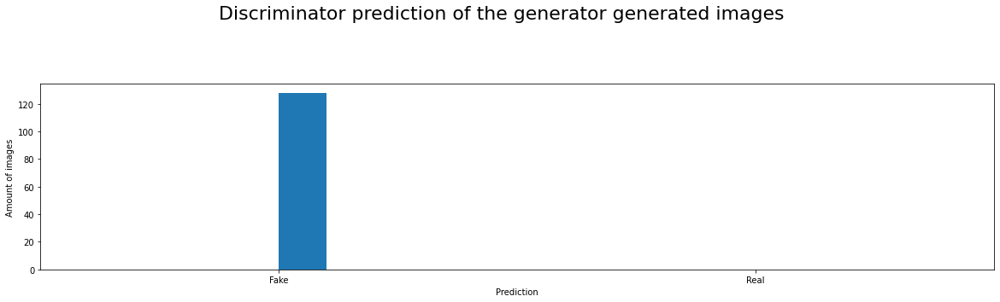

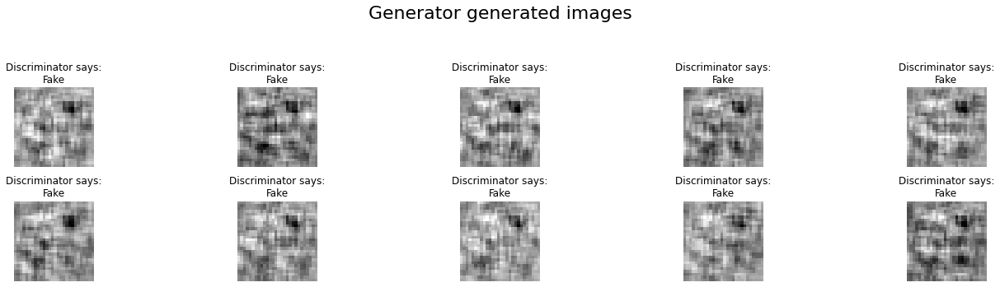

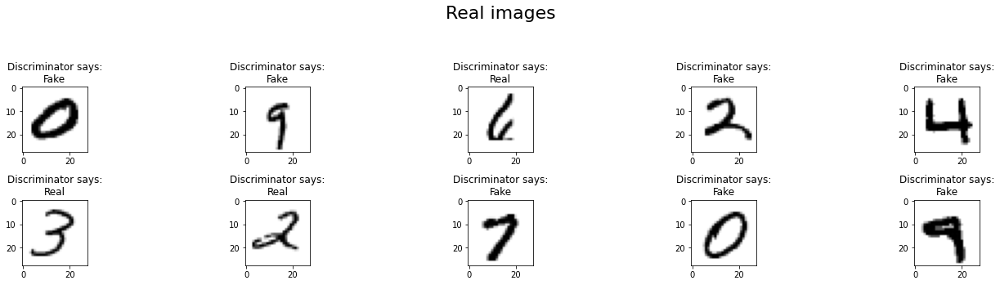

------------------------------------------------------------------------------------------------------------------------

Epoch:  0     | Batch: 200
Discriminator | Loss: 0.00168931 | Accuracy:    1.0
Generator     | Loss: 6.42919 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



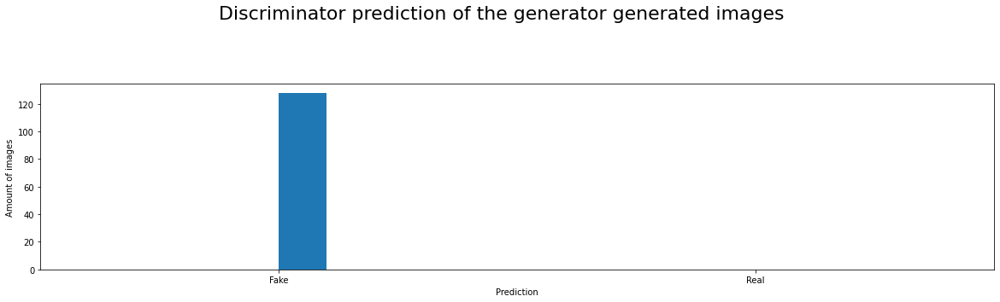

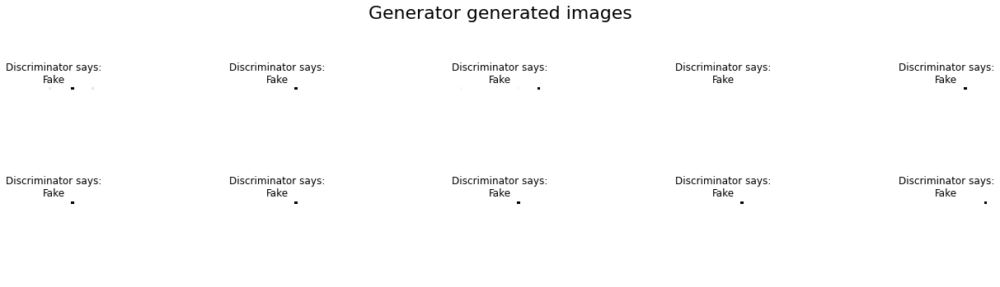

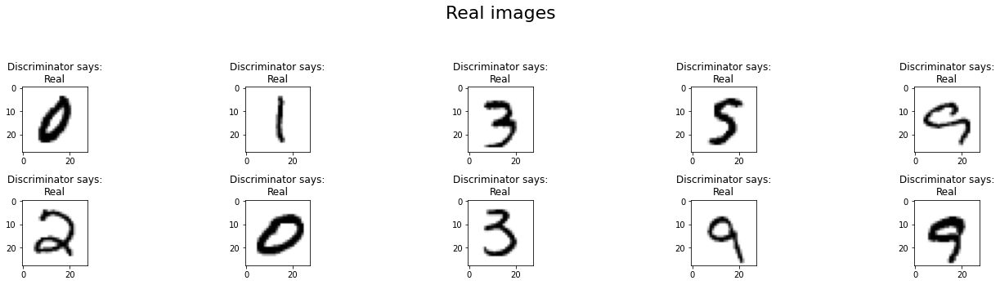

------------------------------------------------------------------------------------------------------------------------

Epoch:  0     | Batch: 400
Discriminator | Loss: 8.87865e-08 | Accuracy:    1.0
Generator     | Loss: 15.623 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



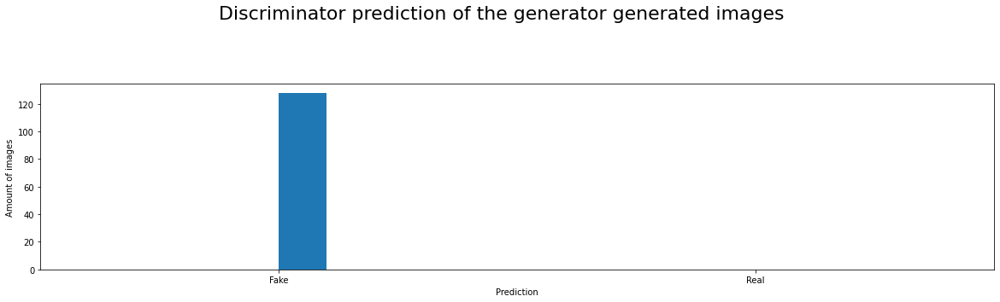

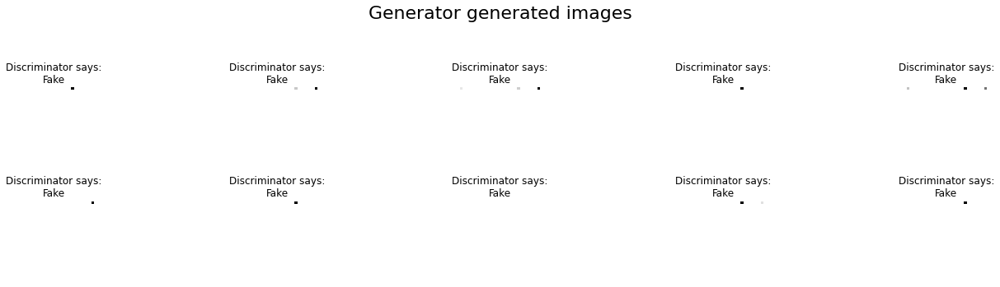

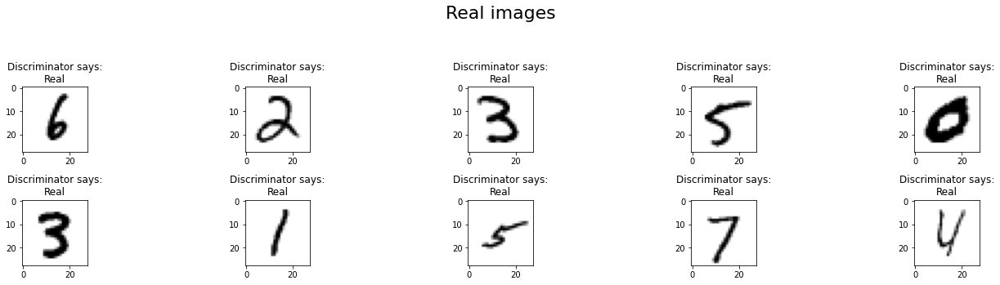

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  1     | Batch:   0
Discriminator | Loss: 5.13737e-08 | Accuracy:    1.0
Generator     | Loss: 16.1841 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



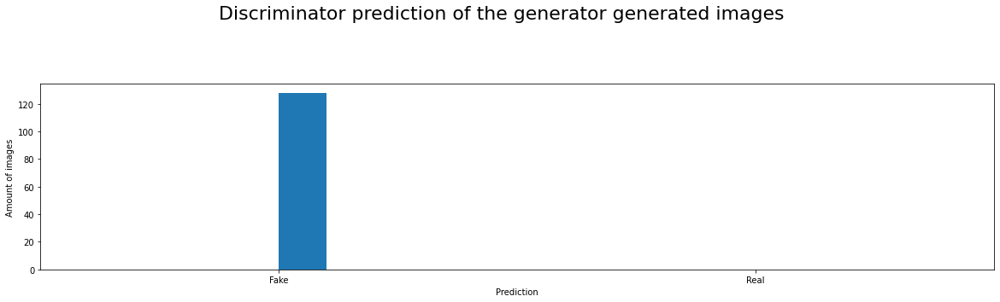

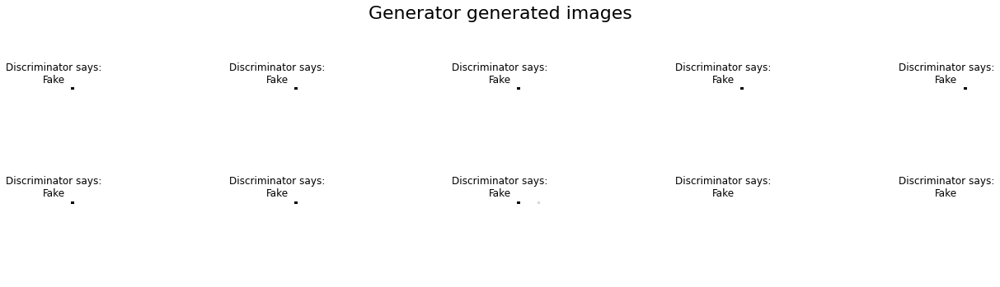

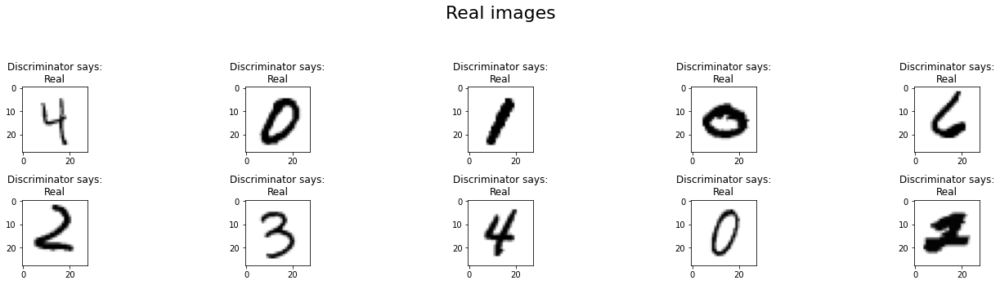

------------------------------------------------------------------------------------------------------------------------

Epoch:  1     | Batch: 200
Discriminator | Loss: 2.55583e-09 | Accuracy:    1.0
Generator     | Loss: 19.1762 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



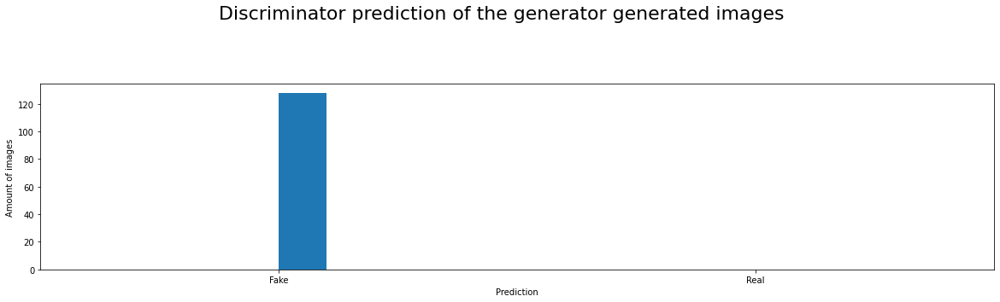

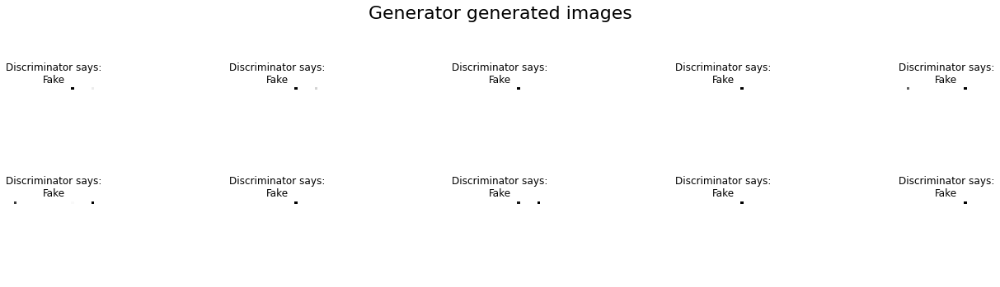

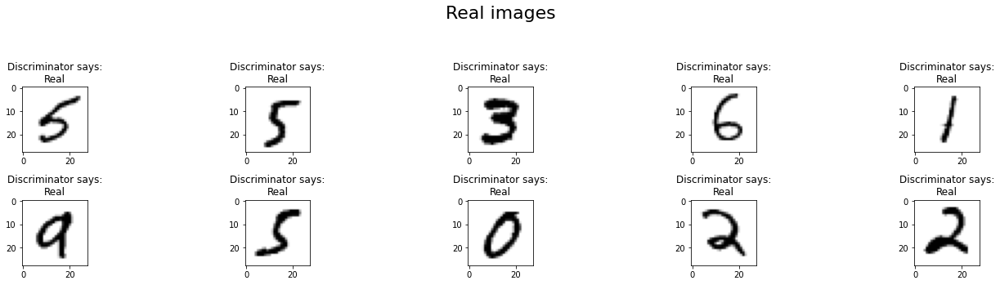

------------------------------------------------------------------------------------------------------------------------

Epoch:  1     | Batch: 400
Discriminator | Loss: 4.11715e-10 | Accuracy:    1.0
Generator     | Loss: 20.9457 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



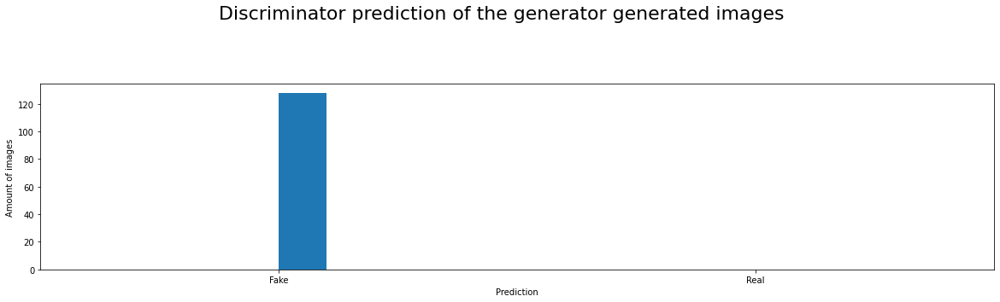

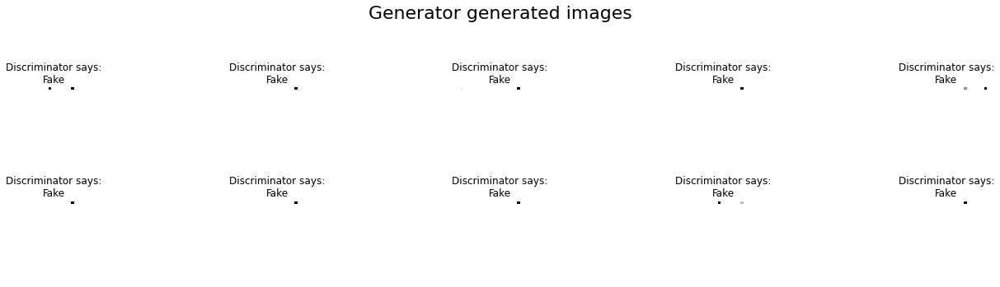

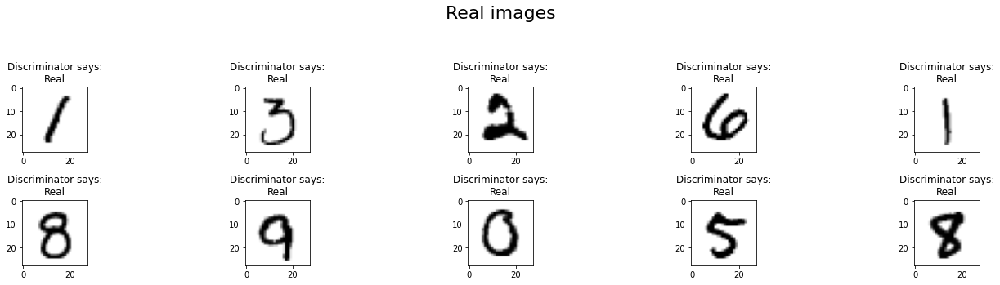

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  2     | Batch:   0
Discriminator | Loss: 2.0947e-10 | Accuracy:    1.0
Generator     | Loss: 21.6323 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



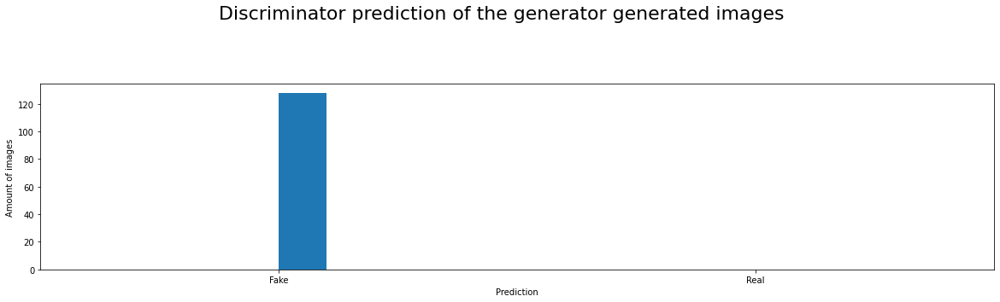

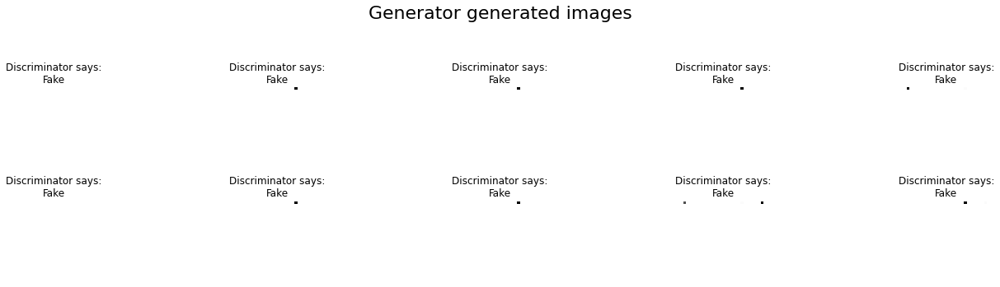

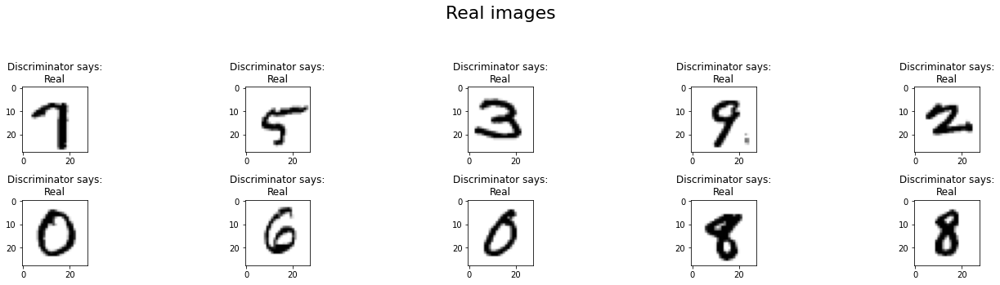

------------------------------------------------------------------------------------------------------------------------

Epoch:  2     | Batch: 200
Discriminator | Loss: 7.0454e-11 | Accuracy:    1.0
Generator     | Loss: 22.6989 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



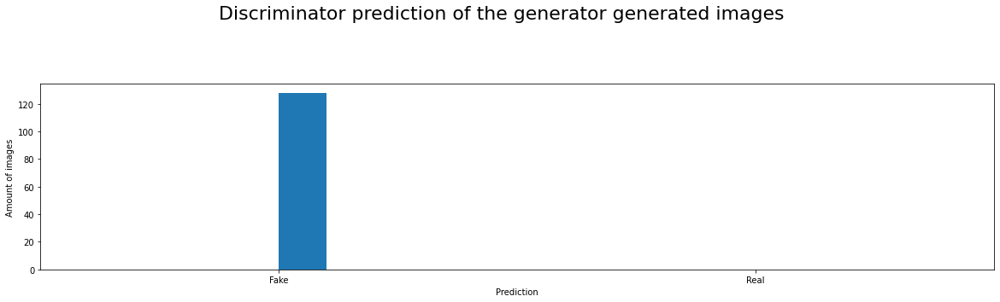

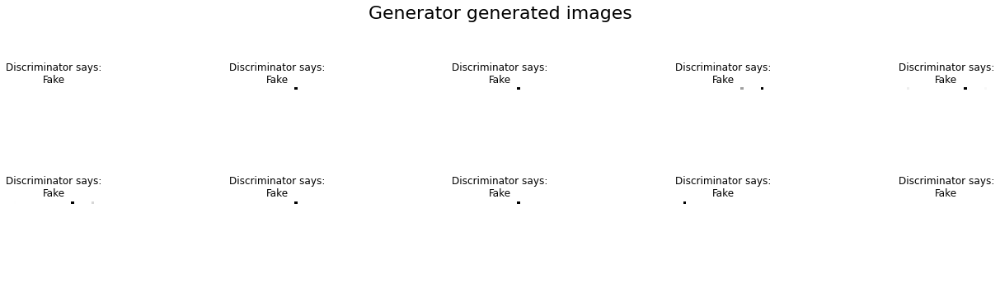

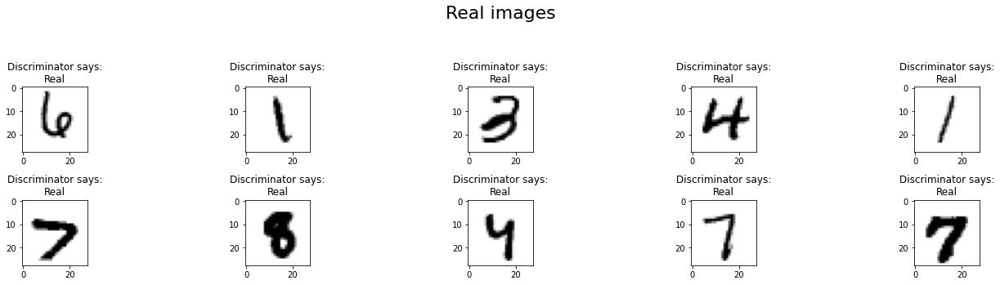

------------------------------------------------------------------------------------------------------------------------

Epoch:  2     | Batch: 400
Discriminator | Loss: 1.17202e-10 | Accuracy:    1.0
Generator     | Loss: 22.1926 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



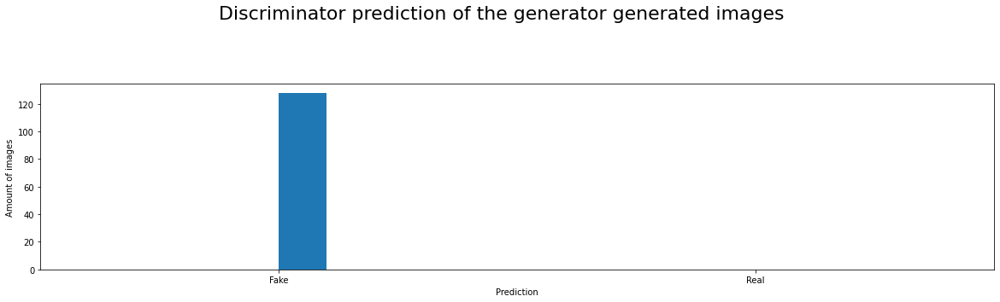

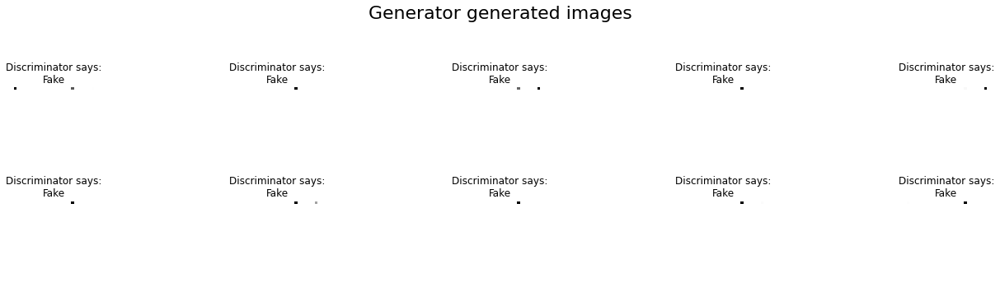

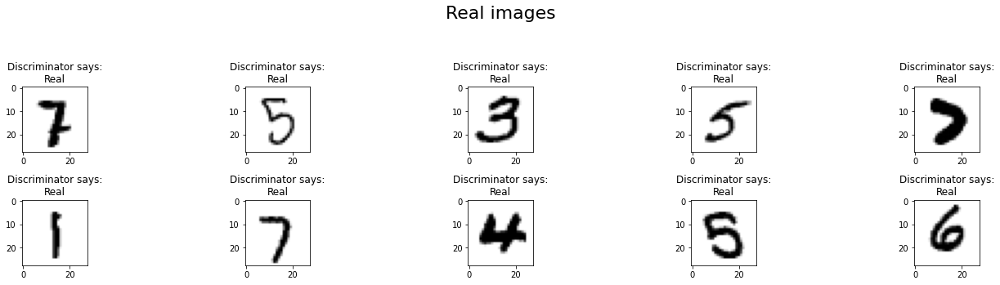

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  3     | Batch:   0
Discriminator | Loss: 4.65188e-11 | Accuracy:    1.0
Generator     | Loss: 23.1097 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



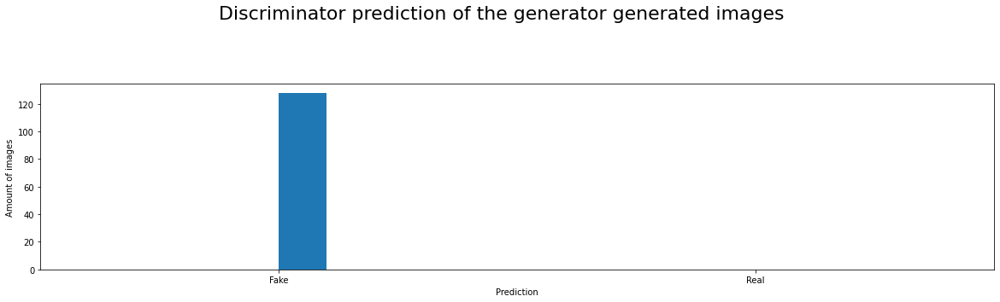

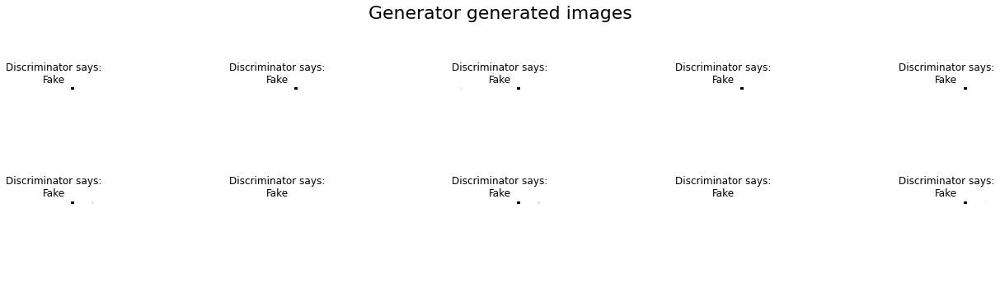

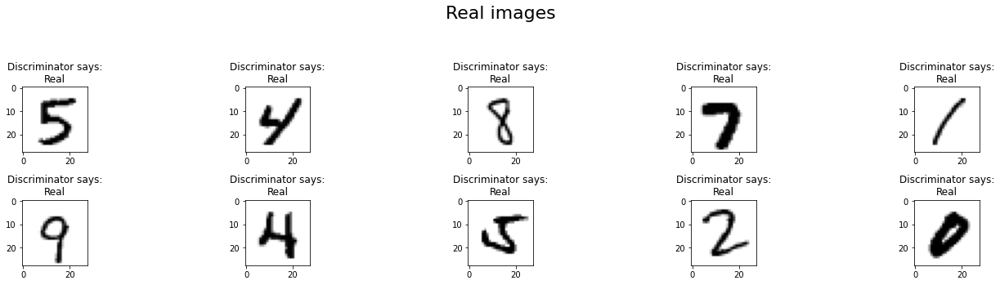

------------------------------------------------------------------------------------------------------------------------

Epoch:  3     | Batch: 200
Discriminator | Loss: 7.44875e-11 | Accuracy:    1.0
Generator     | Loss: 22.6417 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



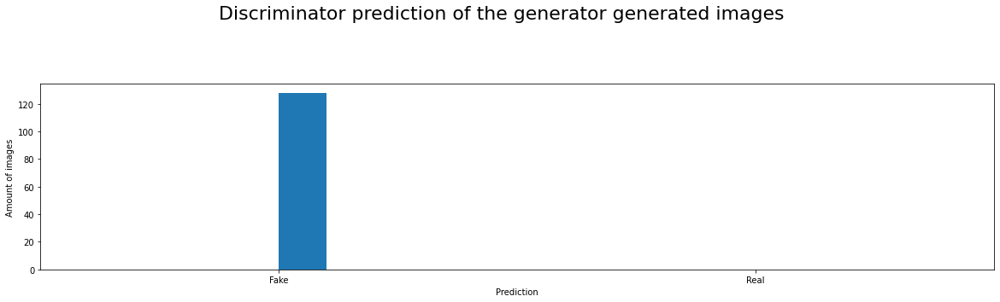

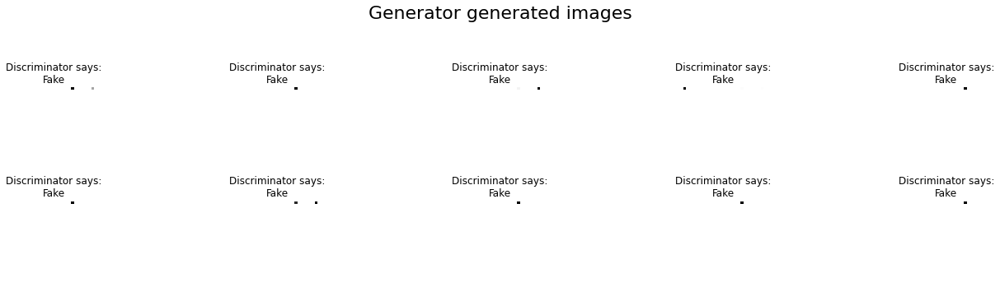

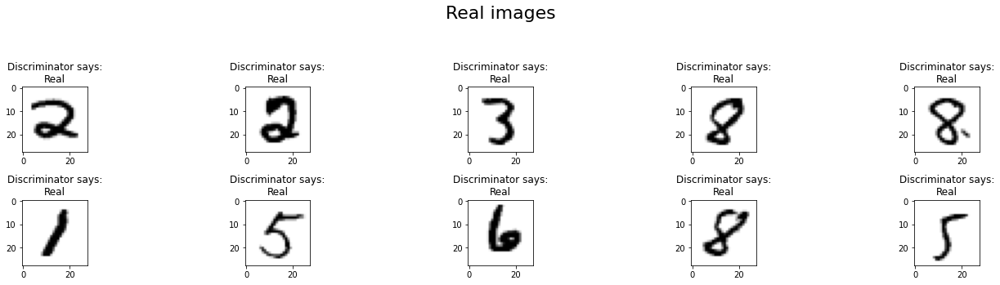

------------------------------------------------------------------------------------------------------------------------

Epoch:  3     | Batch: 400
Discriminator | Loss: 2.14901e-11 | Accuracy:    1.0
Generator     | Loss: 23.8755 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



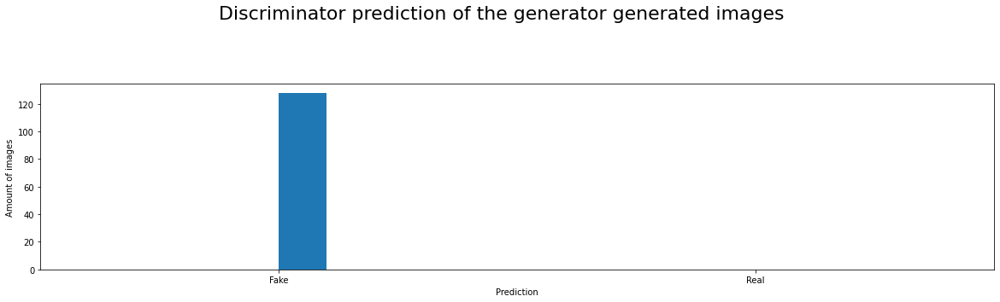

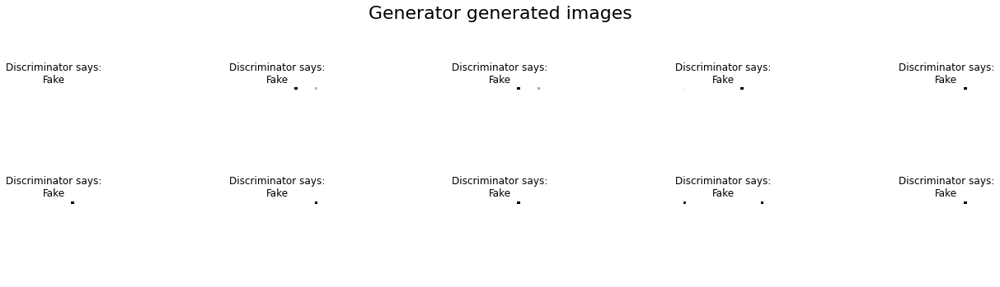

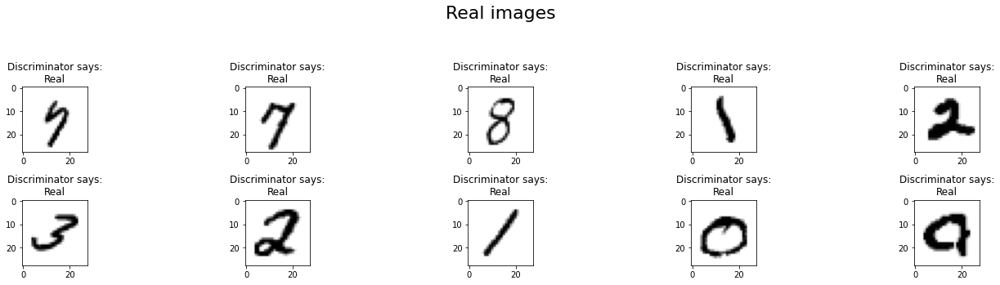

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  4     | Batch:   0
Discriminator | Loss: 5.63706e-11 | Accuracy:    1.0
Generator     | Loss: 22.9177 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



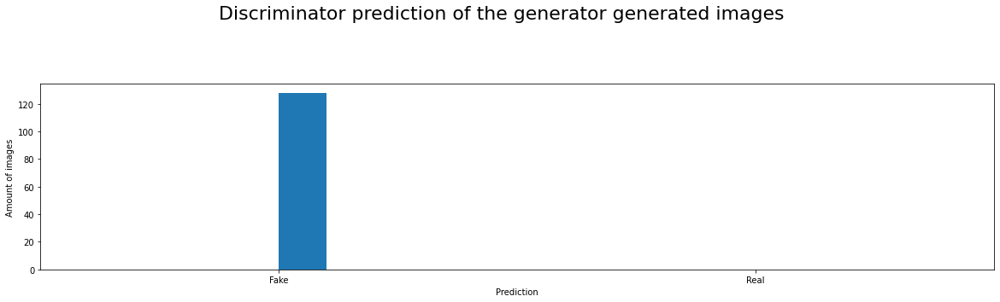

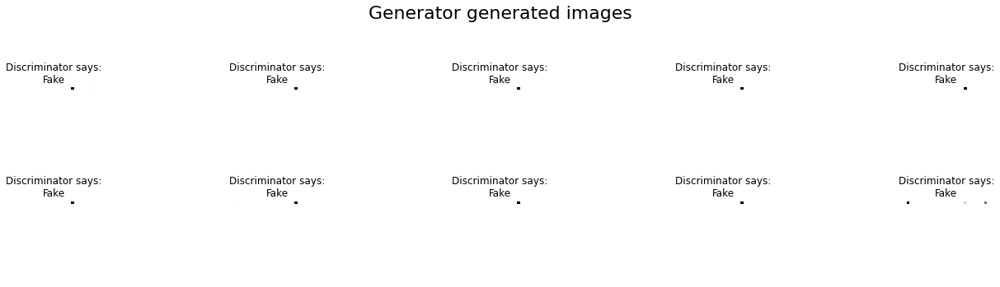

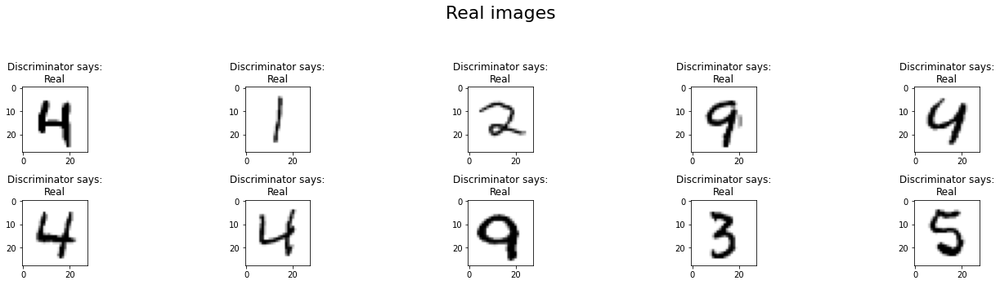

------------------------------------------------------------------------------------------------------------------------

Epoch:  4     | Batch: 200
Discriminator | Loss: 2.50767e-11 | Accuracy:    1.0
Generator     | Loss: 23.7227 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



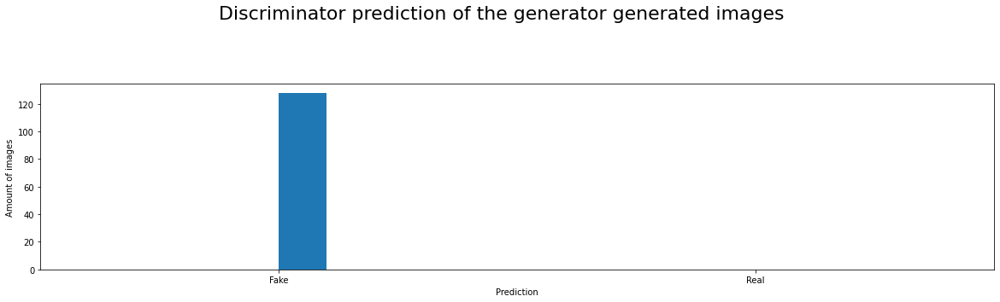

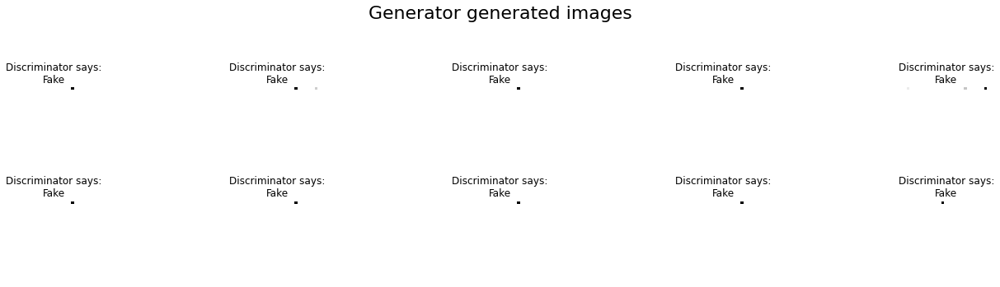

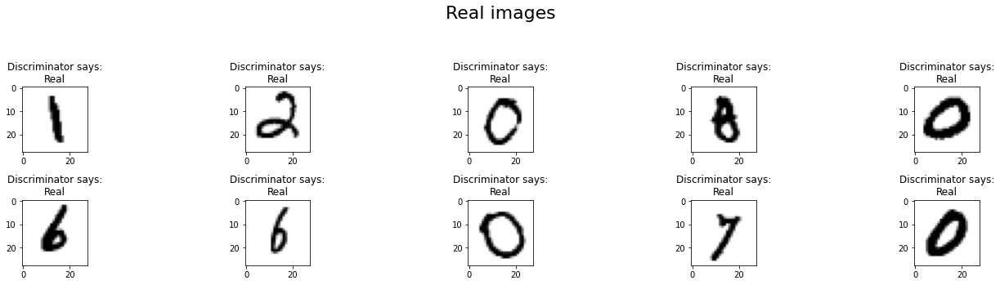

------------------------------------------------------------------------------------------------------------------------

Epoch:  4     | Batch: 400
Discriminator | Loss: 3.29031e-11 | Accuracy:    1.0
Generator     | Loss: 23.4515 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



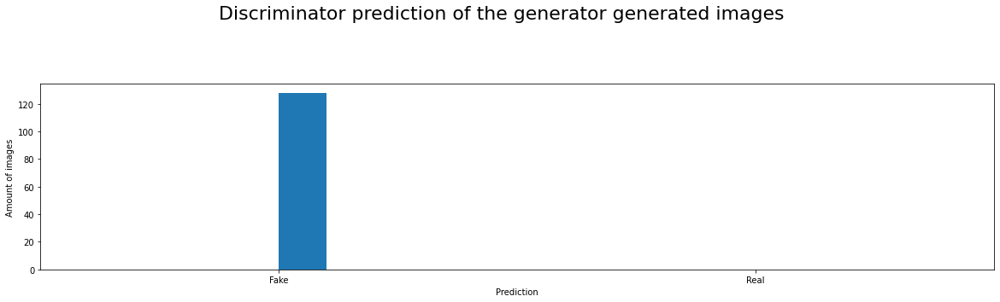

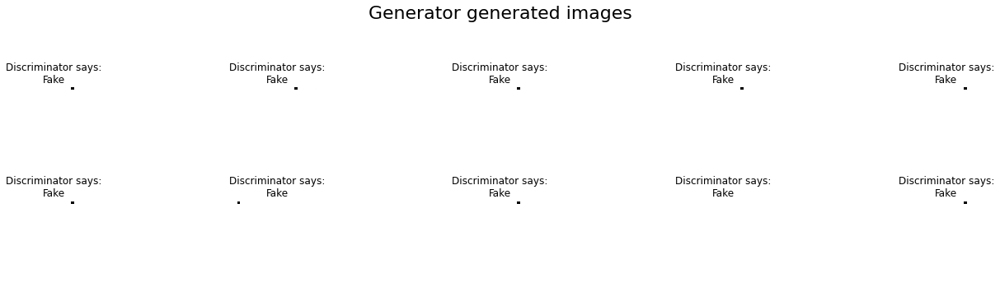

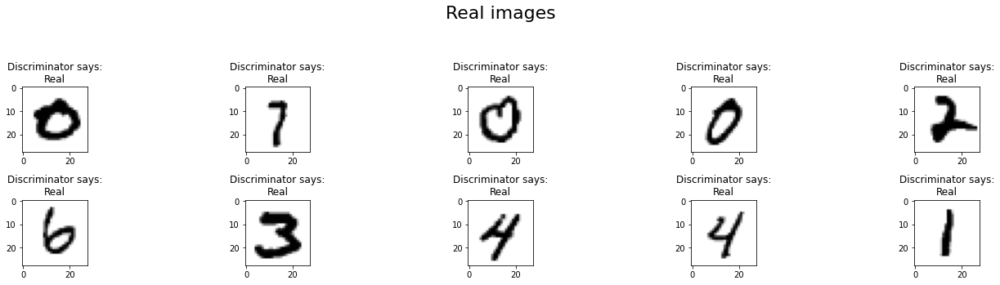

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  5     | Batch:   0
Discriminator | Loss: 3.83145e-11 | Accuracy:    1.0
Generator     | Loss: 23.3009 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



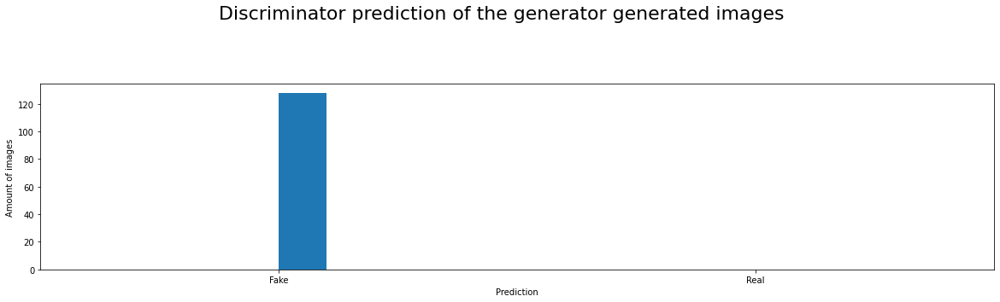

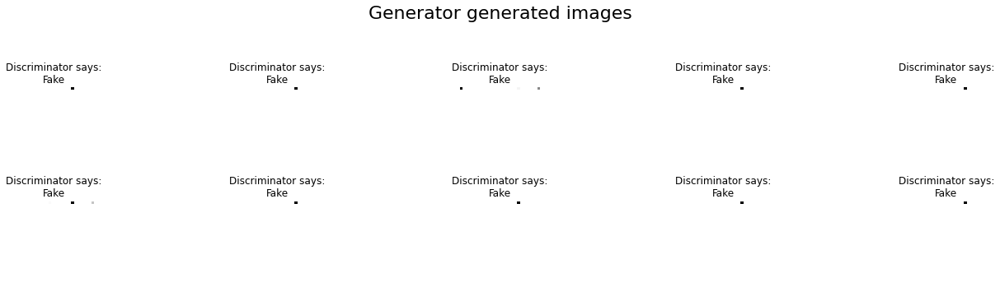

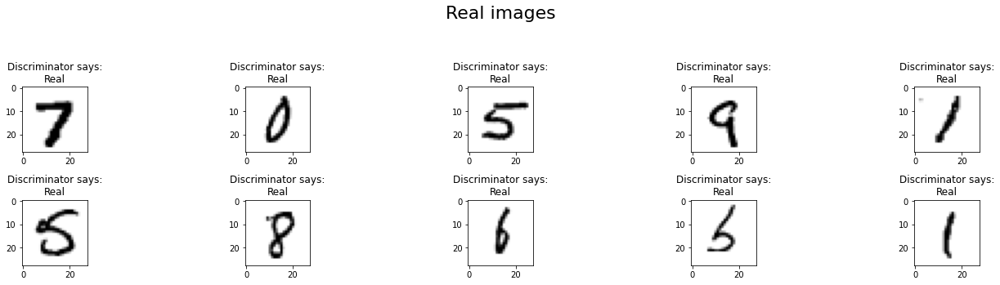

------------------------------------------------------------------------------------------------------------------------

Epoch:  5     | Batch: 200
Discriminator | Loss: 1.88484e-11 | Accuracy:    1.0
Generator     | Loss: 24.0061 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



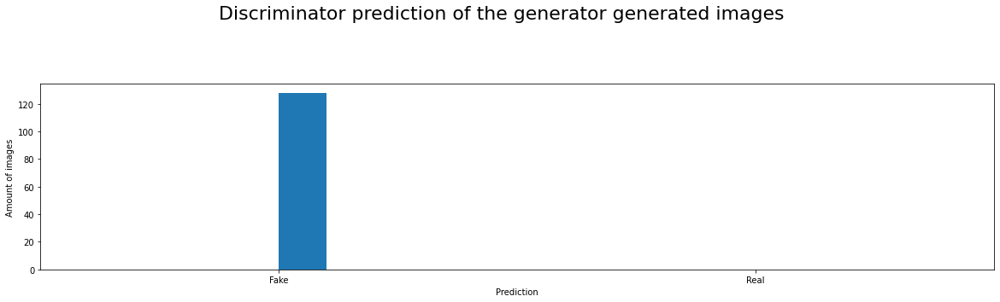

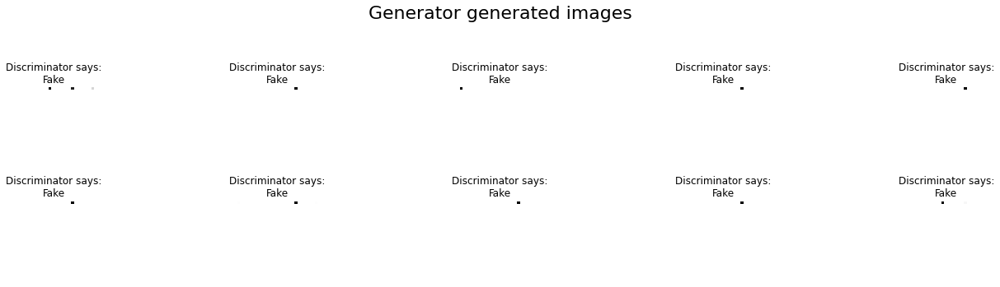

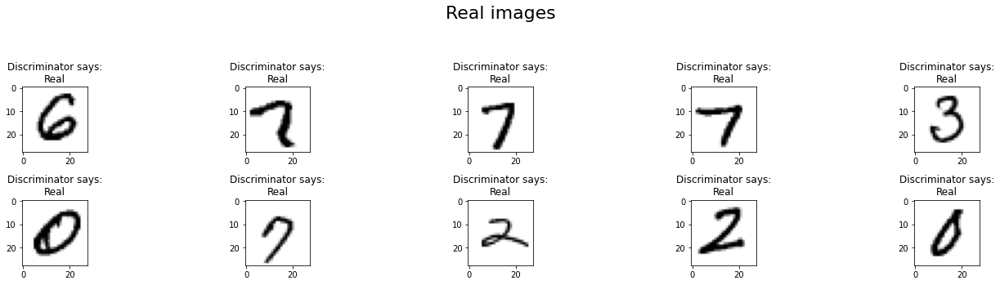

------------------------------------------------------------------------------------------------------------------------

Epoch:  5     | Batch: 400
Discriminator | Loss: 1.42068e-11 | Accuracy:    1.0
Generator     | Loss: 24.2877 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



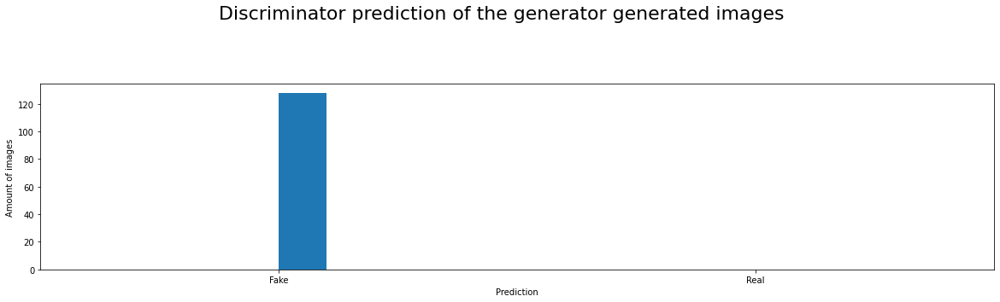

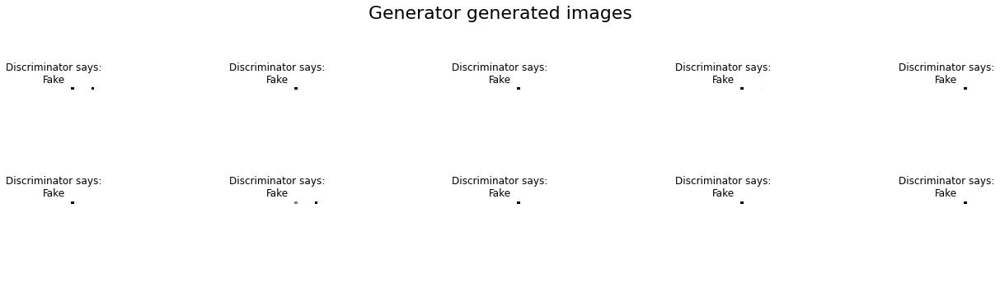

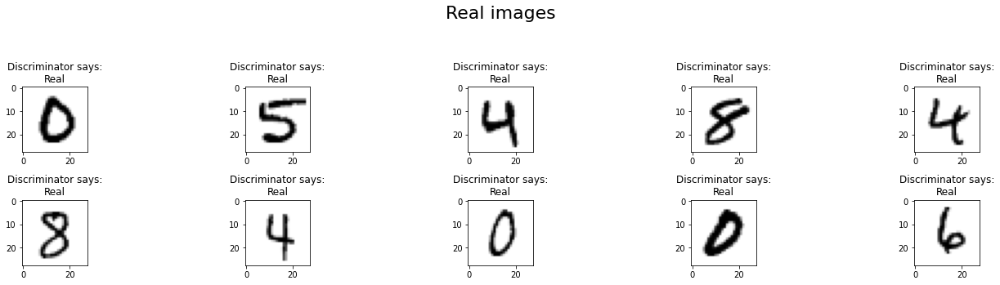

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  6     | Batch:   0
Discriminator | Loss: 1.14668e-11 | Accuracy:    1.0
Generator     | Loss: 24.5012 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



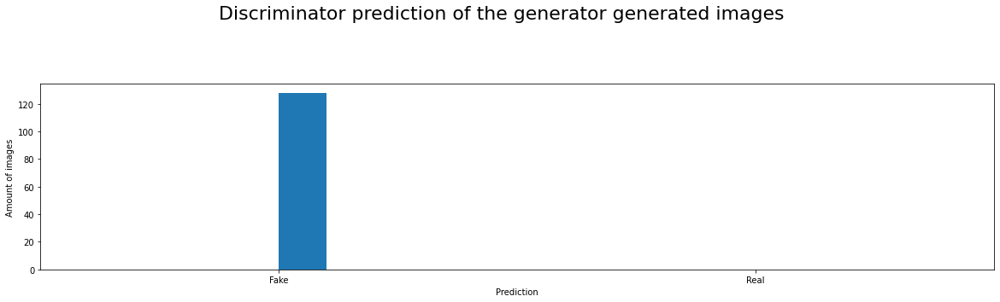

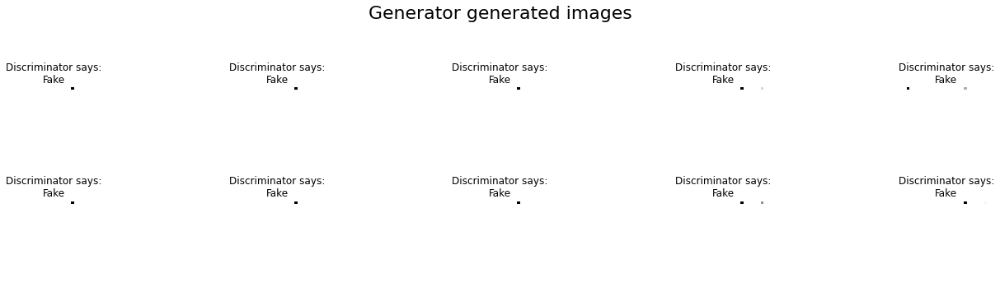

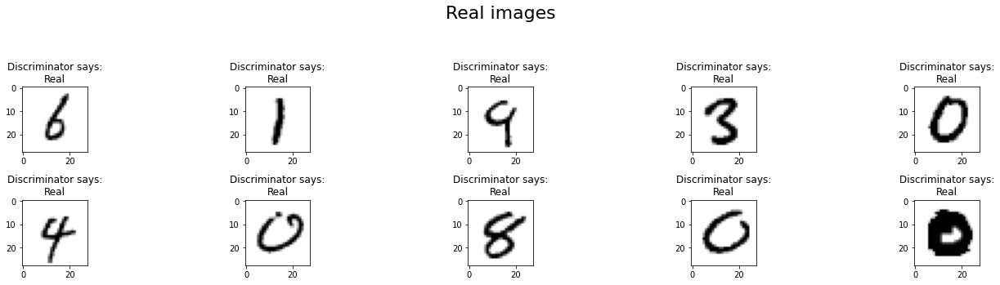

------------------------------------------------------------------------------------------------------------------------

Epoch:  6     | Batch: 200
Discriminator | Loss: 1.82094e-11 | Accuracy:    1.0
Generator     | Loss: 24.0404 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



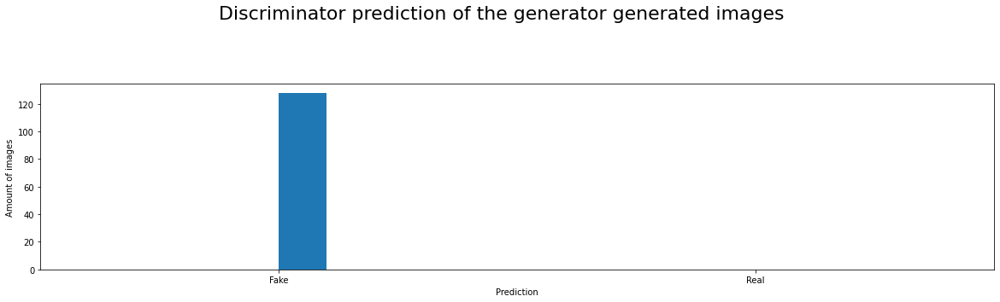

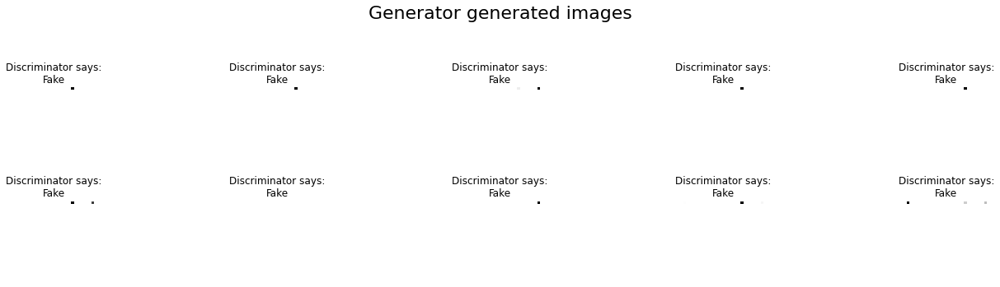

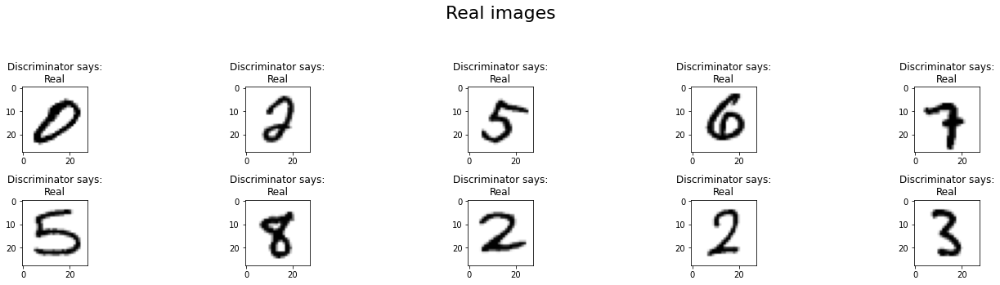

------------------------------------------------------------------------------------------------------------------------

Epoch:  6     | Batch: 400
Discriminator | Loss: 1.57201e-11 | Accuracy:    1.0
Generator     | Loss: 24.1872 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



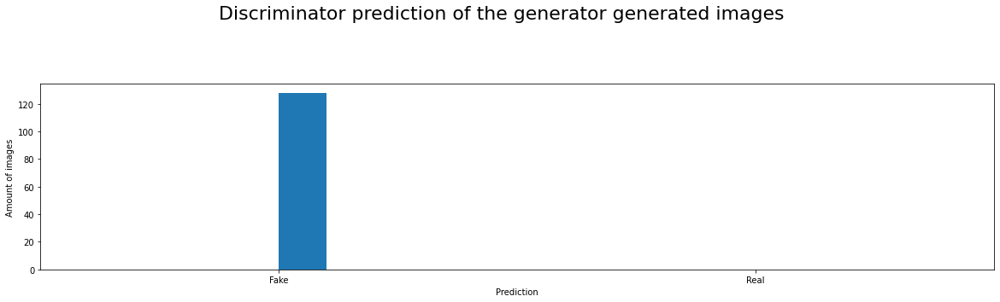

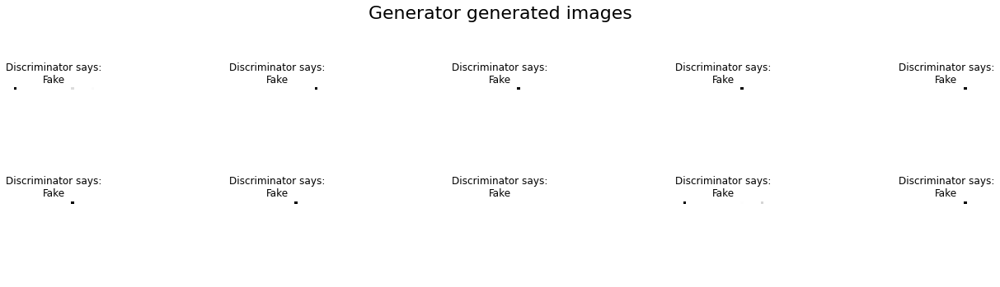

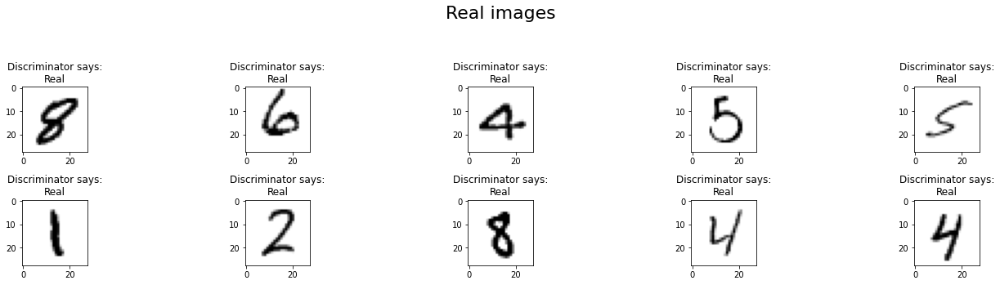

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  7     | Batch:   0
Discriminator | Loss: 1.87962e-11 | Accuracy:    1.0
Generator     | Loss: 24.0086 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



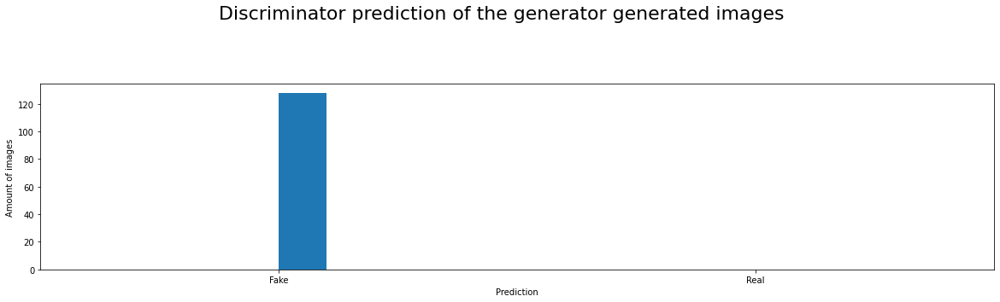

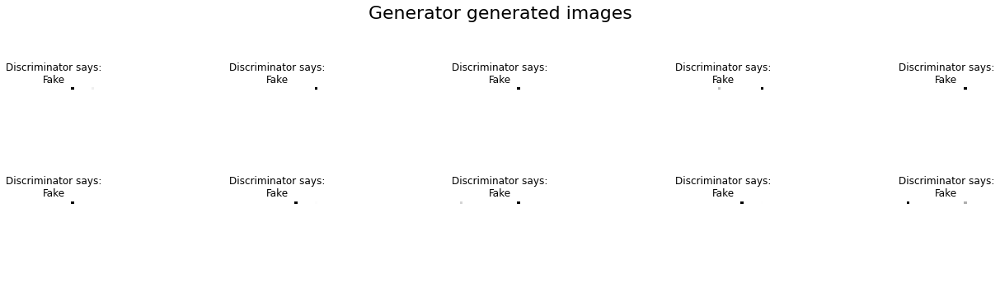

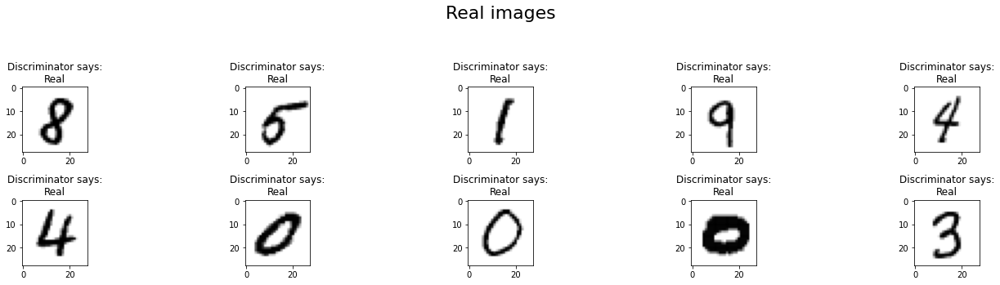

------------------------------------------------------------------------------------------------------------------------

Epoch:  7     | Batch: 200
Discriminator | Loss: 2.25485e-11 | Accuracy:    1.0
Generator     | Loss: 23.8274 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



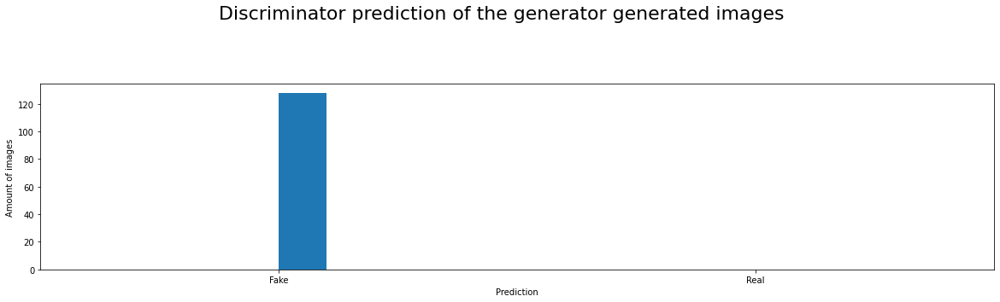

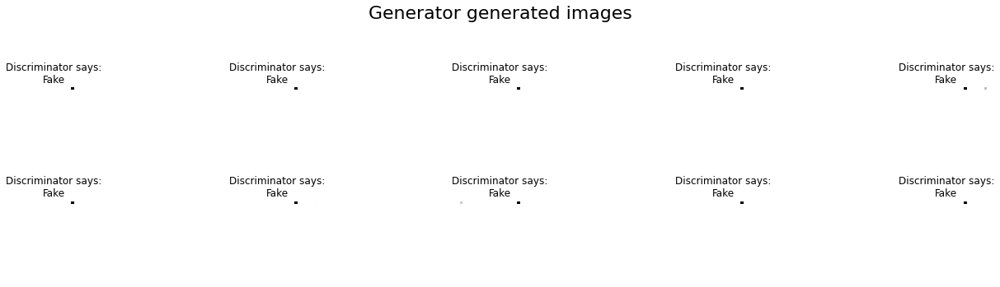

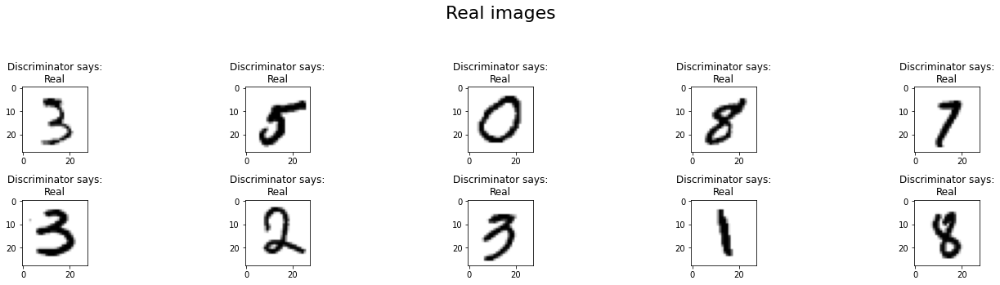

------------------------------------------------------------------------------------------------------------------------

Epoch:  7     | Batch: 400
Discriminator | Loss: 2.22187e-11 | Accuracy:    1.0
Generator     | Loss: 23.8422 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



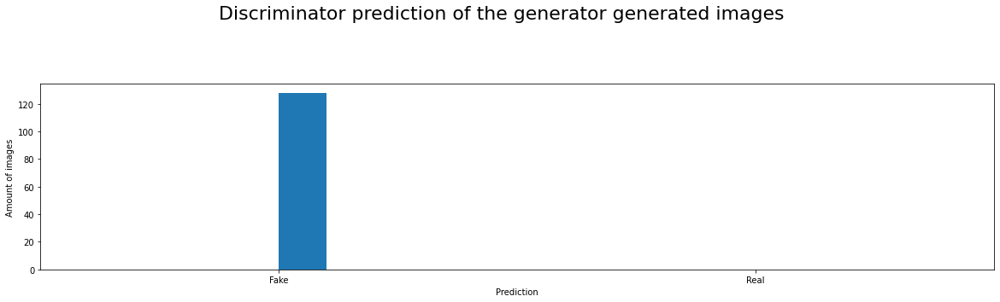

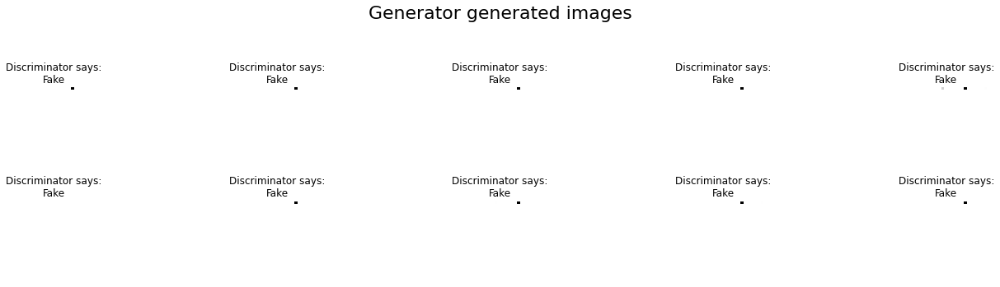

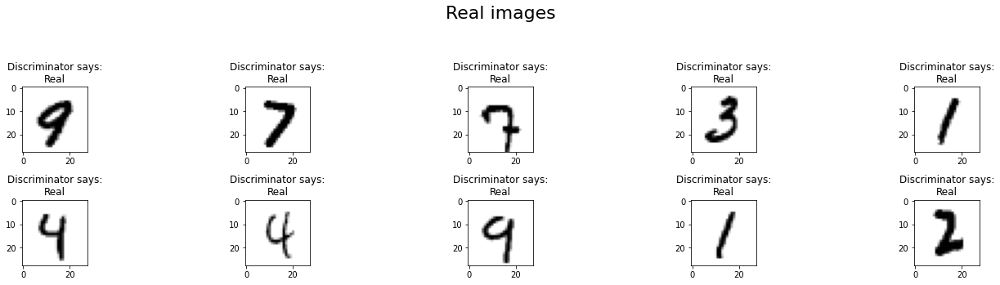

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  8     | Batch:   0
Discriminator | Loss: 1.62072e-11 | Accuracy:    1.0
Generator     | Loss: 24.1564 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



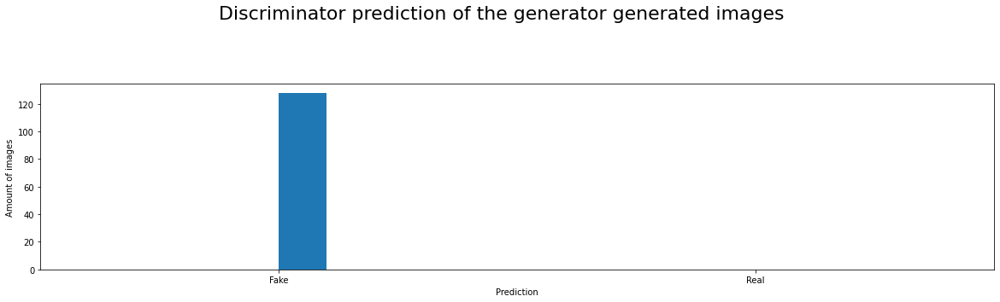

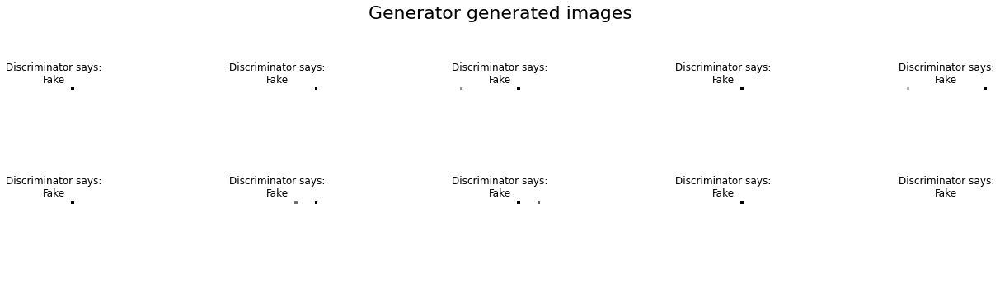

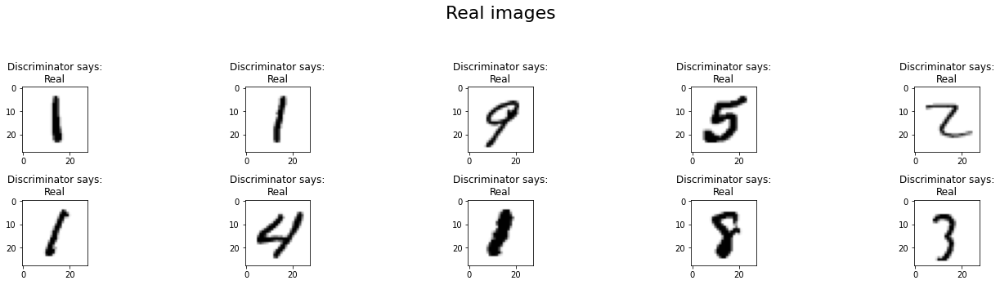

------------------------------------------------------------------------------------------------------------------------

Epoch:  8     | Batch: 200
Discriminator | Loss: 1.5876e-11 | Accuracy:    1.0
Generator     | Loss: 24.177 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



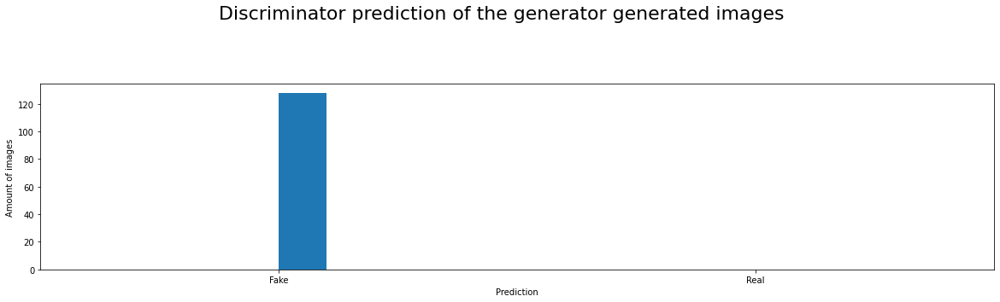

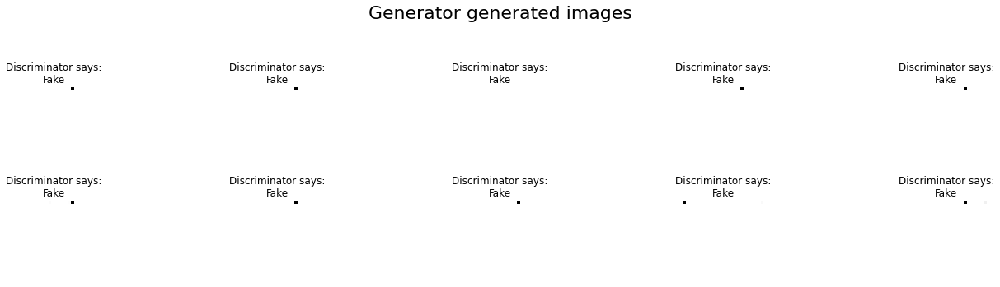

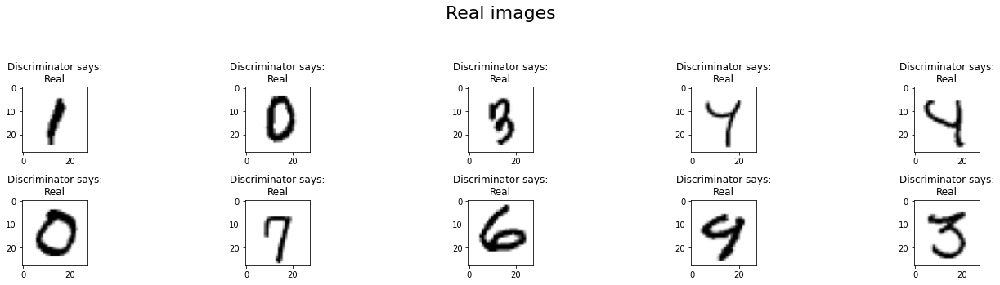

------------------------------------------------------------------------------------------------------------------------

Epoch:  8     | Batch: 400
Discriminator | Loss: 1.6134e-11 | Accuracy:    1.0
Generator     | Loss: 24.1609 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



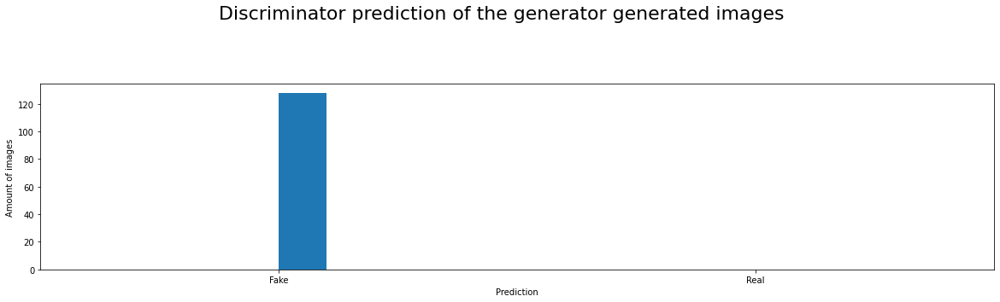

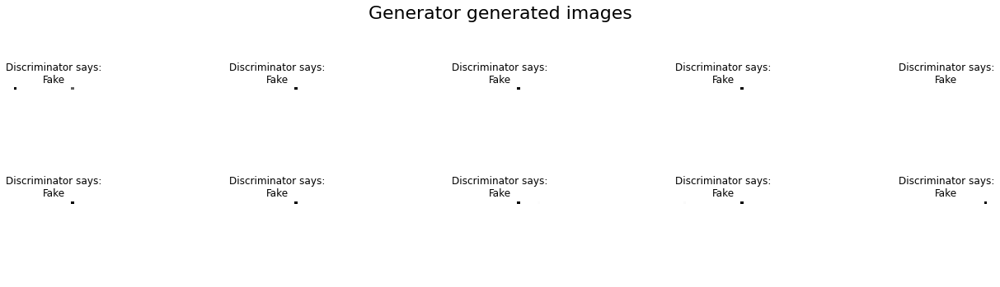

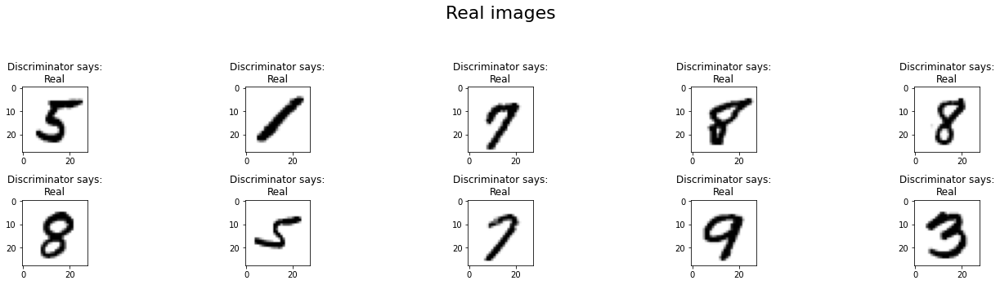

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  9     | Batch:   0
Discriminator | Loss: 1.33926e-11 | Accuracy:    1.0
Generator     | Loss: 24.3465 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



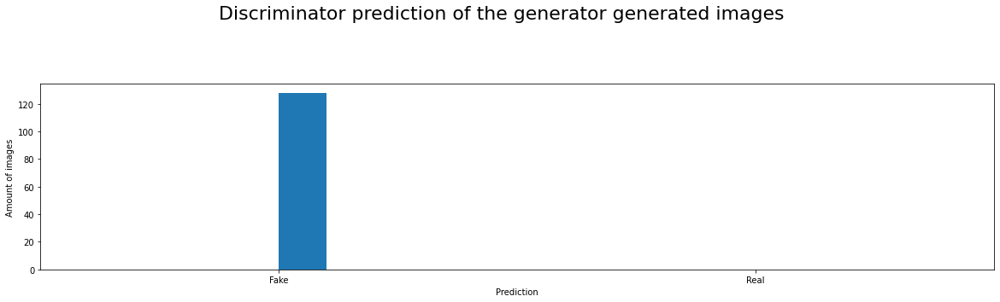

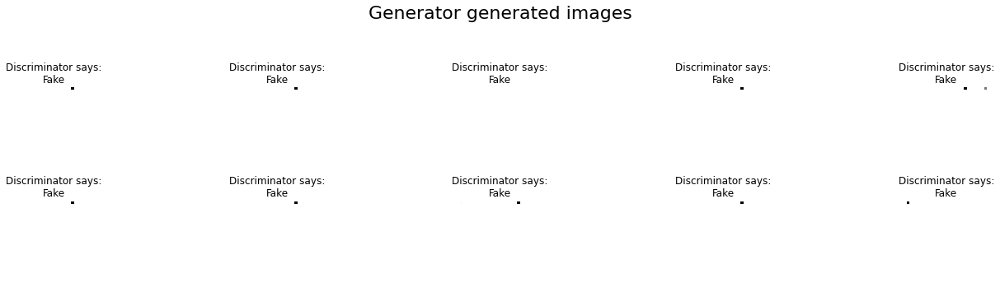

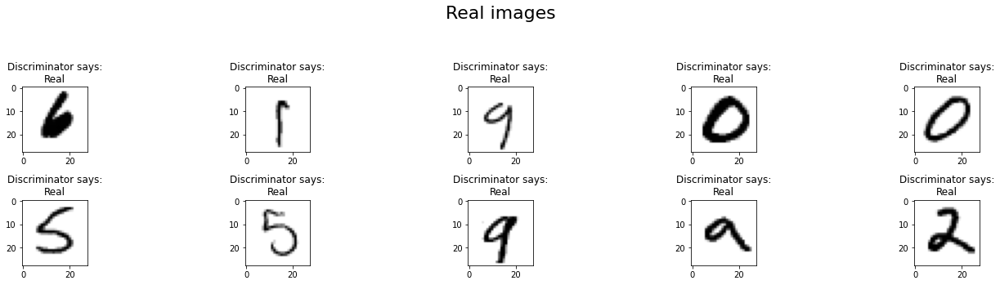

------------------------------------------------------------------------------------------------------------------------

Epoch:  9     | Batch: 200
Discriminator | Loss: 1.35038e-11 | Accuracy:    1.0
Generator     | Loss: 24.3384 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



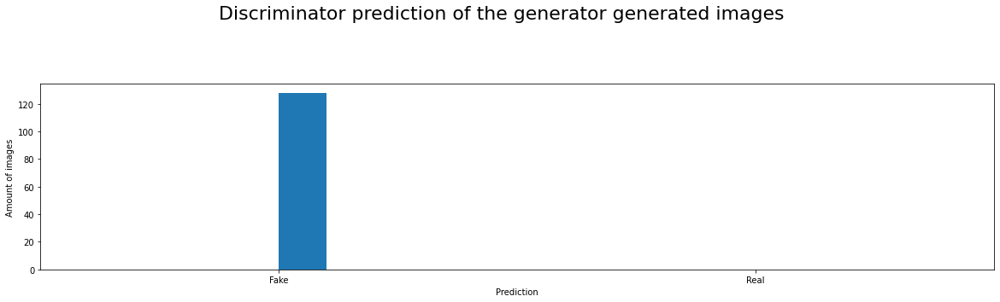

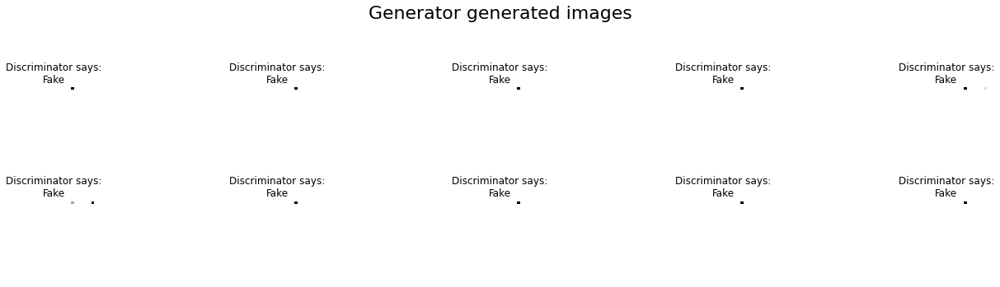

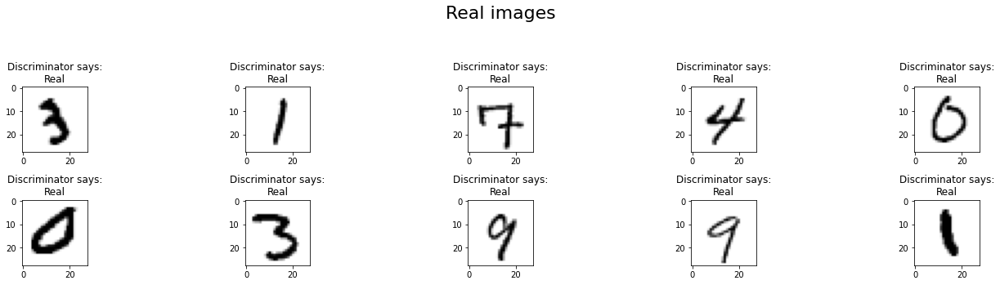

------------------------------------------------------------------------------------------------------------------------

Epoch:  9     | Batch: 400
Discriminator | Loss: 1.27796e-11 | Accuracy:    1.0
Generator     | Loss: 24.3932 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



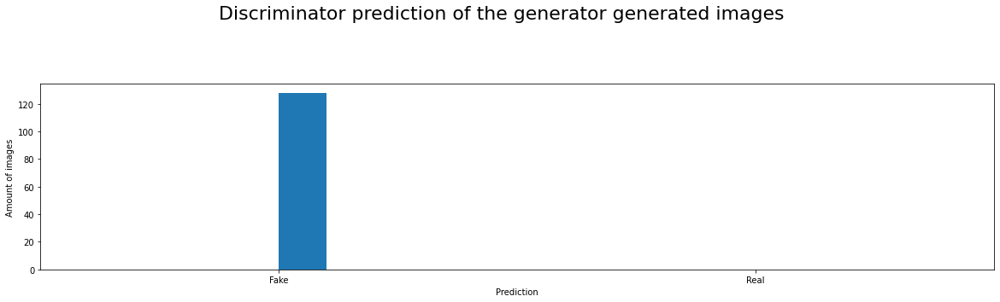

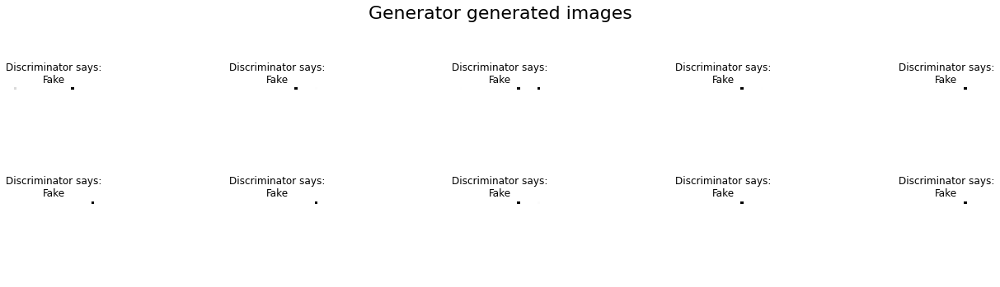

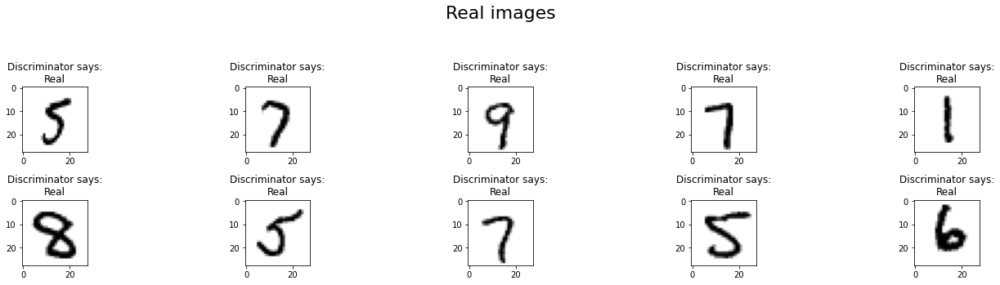

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 10     | Batch:   0
Discriminator | Loss: 1.1725e-11 | Accuracy:    1.0
Generator     | Loss: 24.479 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



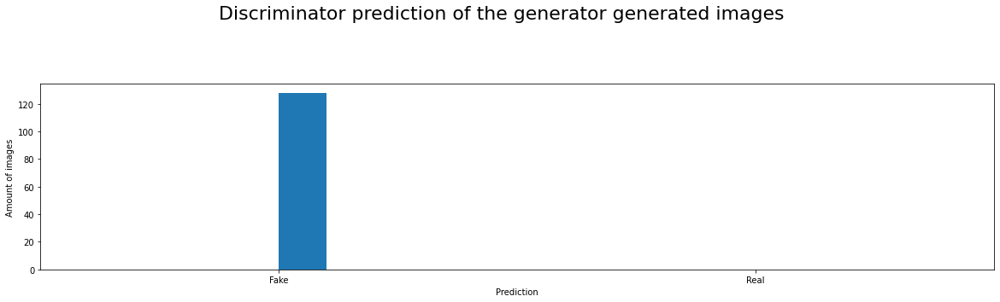

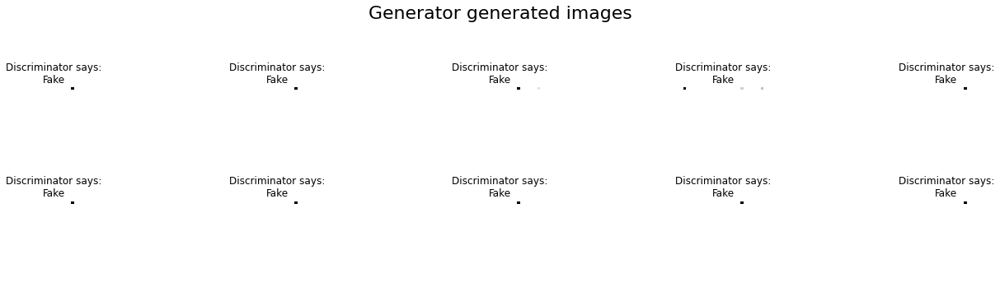

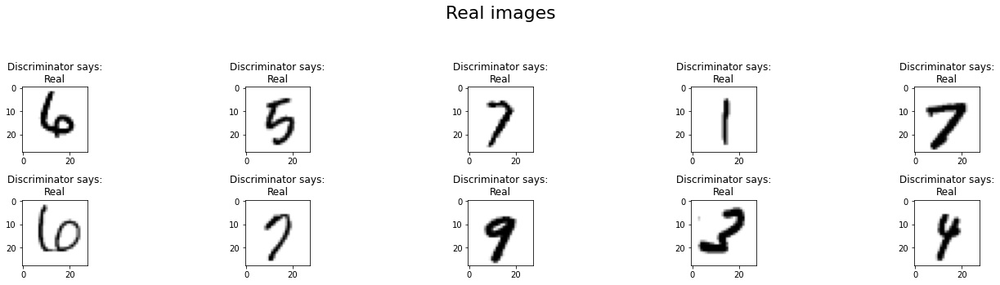

------------------------------------------------------------------------------------------------------------------------

Epoch: 10     | Batch: 200
Discriminator | Loss: 9.47734e-12 | Accuracy:    1.0
Generator     | Loss: 24.6913 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



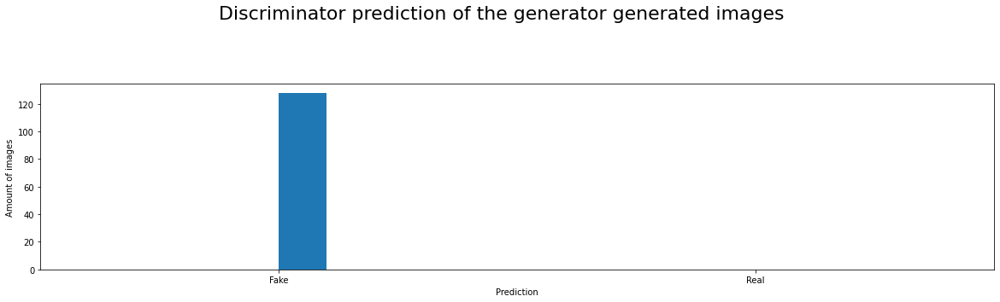

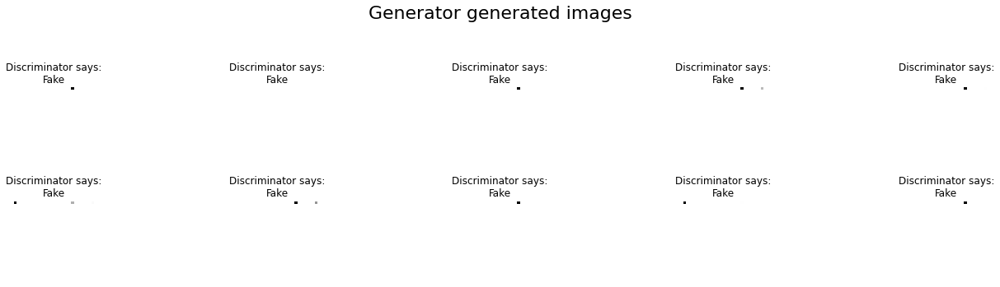

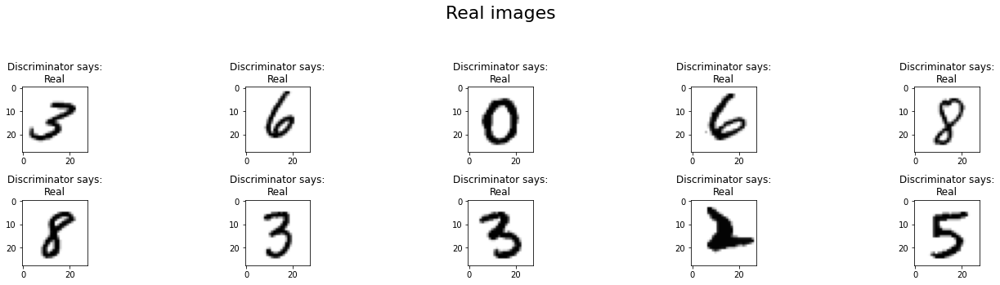

------------------------------------------------------------------------------------------------------------------------

Epoch: 10     | Batch: 400
Discriminator | Loss: 1.17122e-11 | Accuracy:    1.0
Generator     | Loss: 24.4801 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



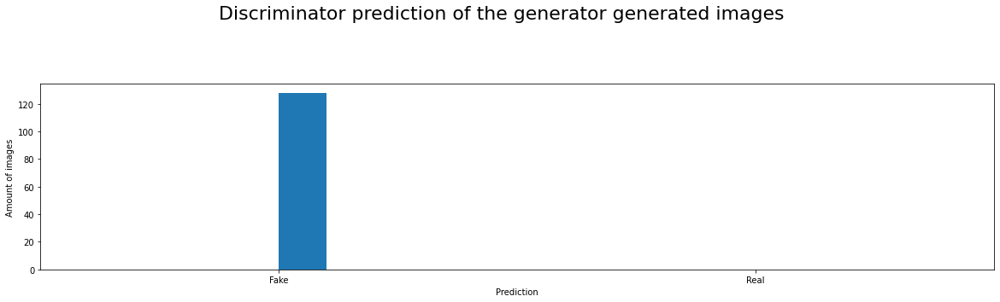

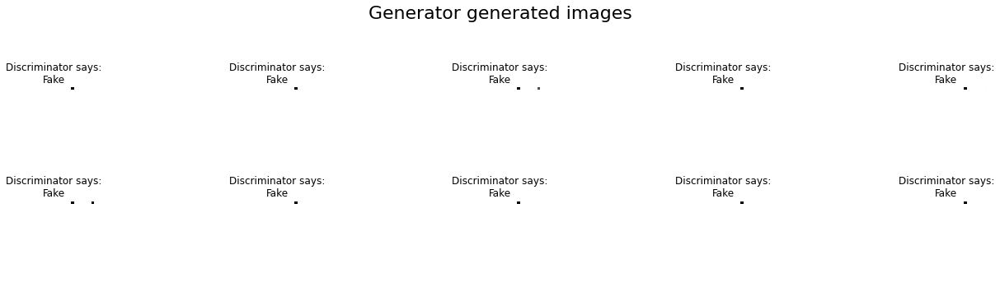

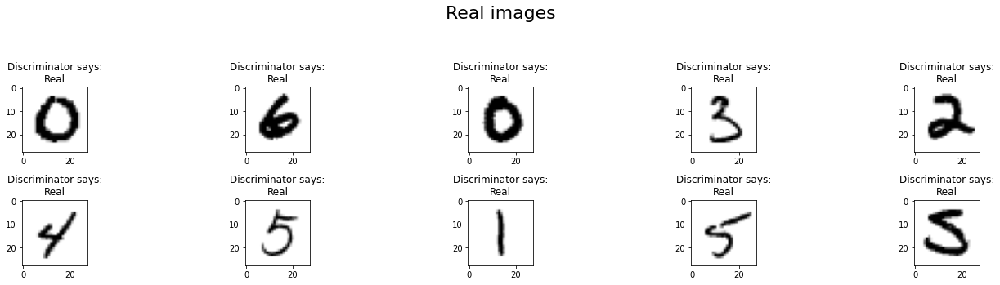

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 11     | Batch:   0
Discriminator | Loss: 1.44757e-11 | Accuracy:    1.0
Generator     | Loss: 24.2686 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



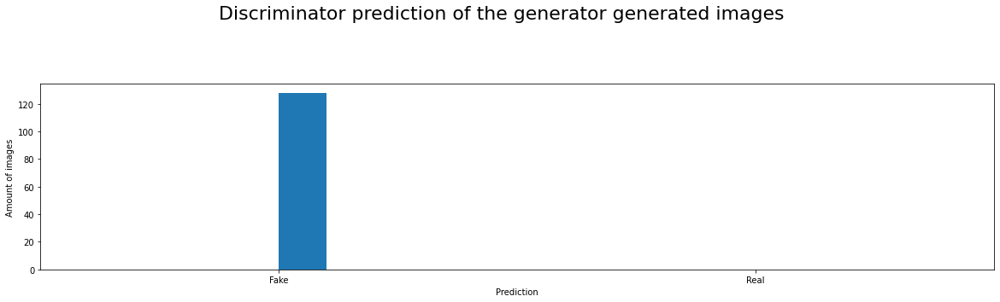

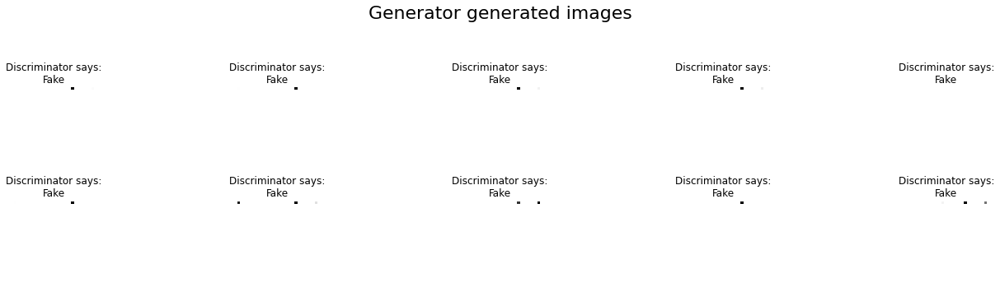

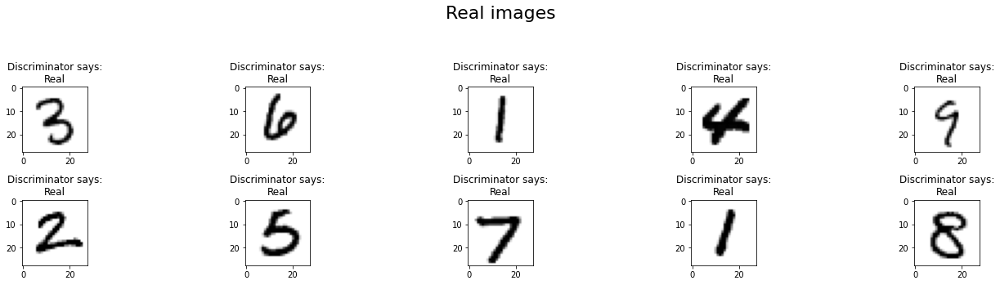

------------------------------------------------------------------------------------------------------------------------

Epoch: 11     | Batch: 200
Discriminator | Loss: 1.09347e-11 | Accuracy:    1.0
Generator     | Loss: 24.5557 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



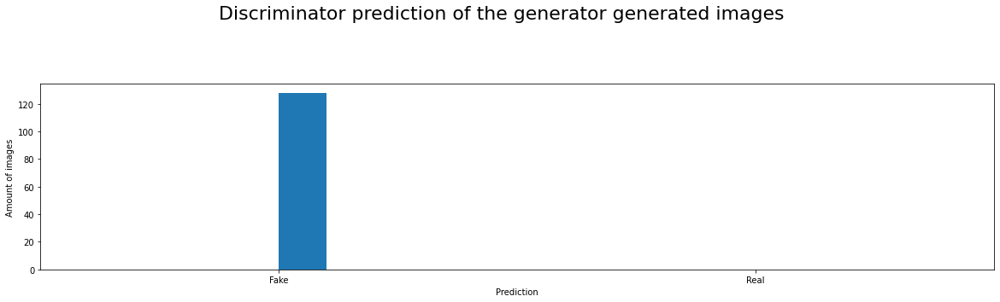

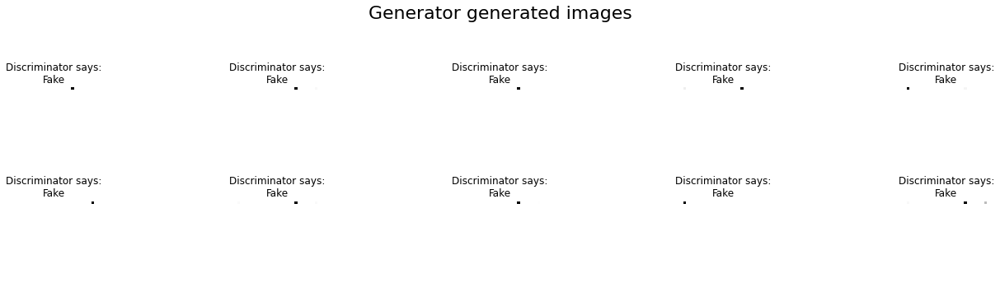

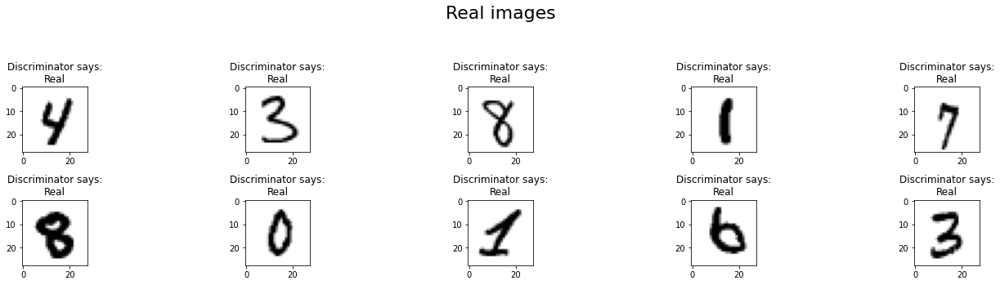

------------------------------------------------------------------------------------------------------------------------

Epoch: 11     | Batch: 400
Discriminator | Loss: 1.28339e-10 | Accuracy:    1.0
Generator     | Loss: 24.5608 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



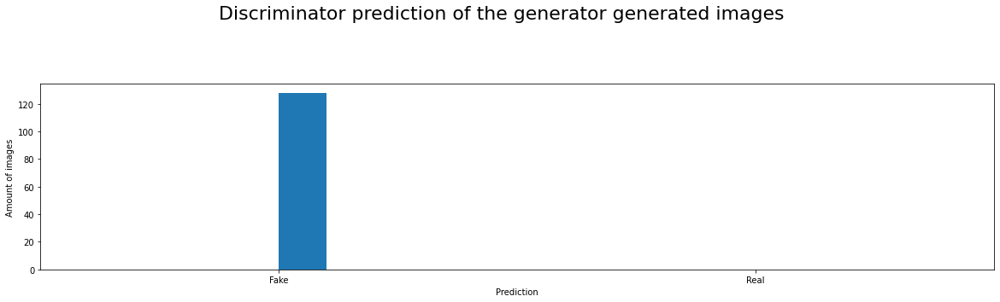

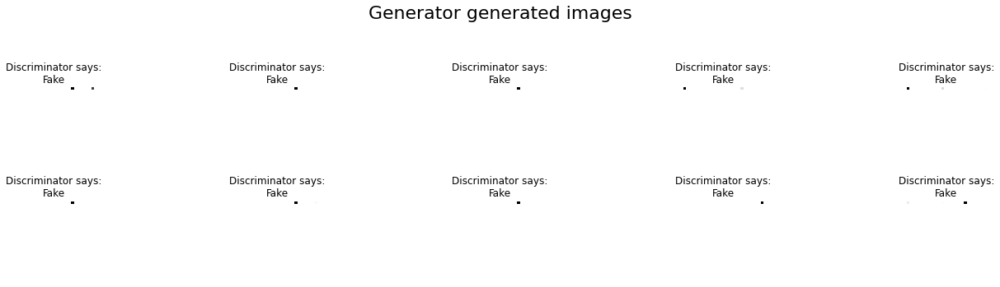

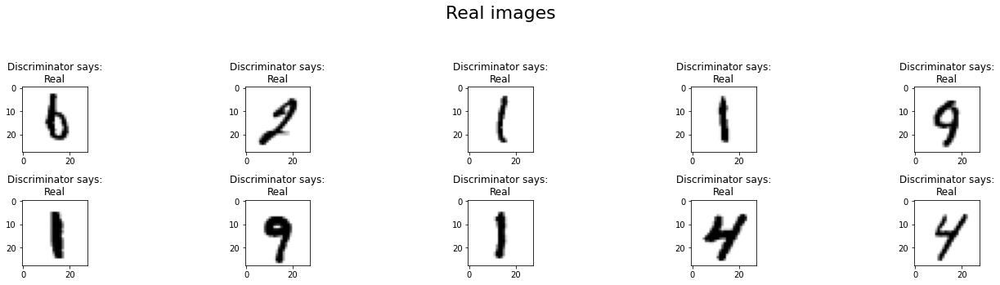

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 12     | Batch:   0
Discriminator | Loss: 1.27906e-10 | Accuracy:    1.0
Generator     | Loss: 24.5717 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



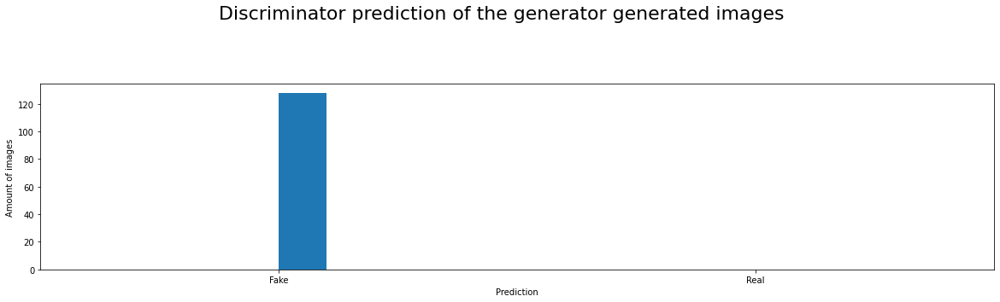

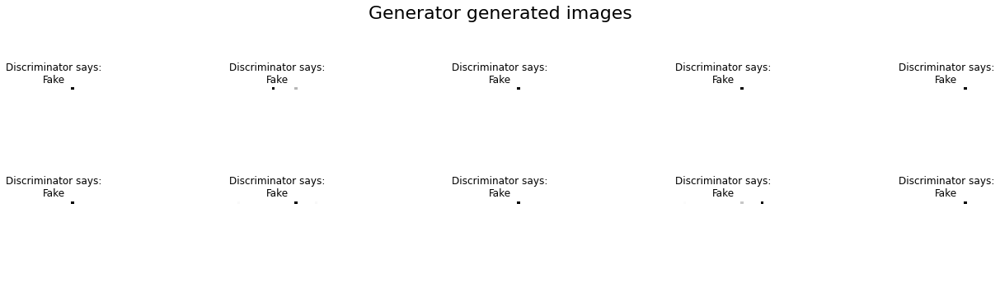

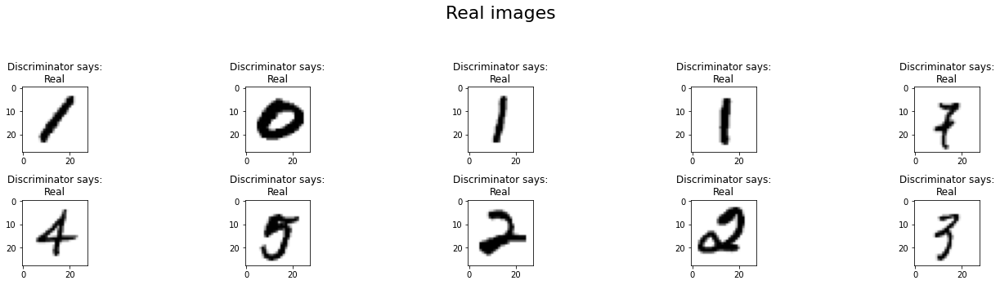

------------------------------------------------------------------------------------------------------------------------

Epoch: 12     | Batch: 200
Discriminator | Loss: 1.00558e-11 | Accuracy:    1.0
Generator     | Loss: 24.6322 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



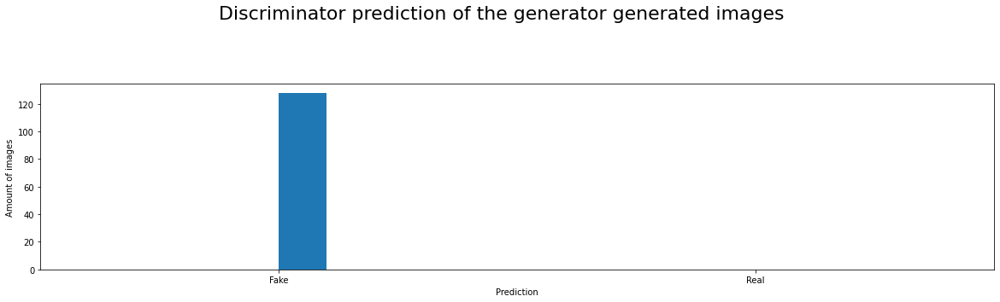

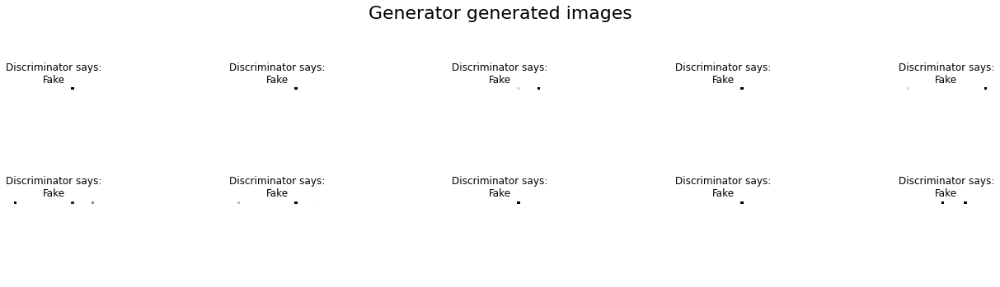

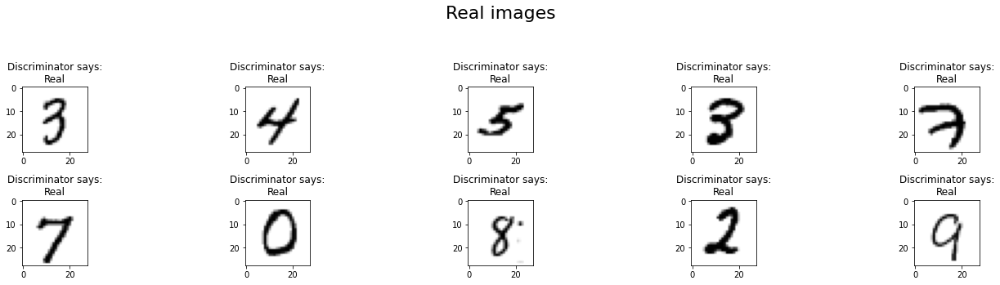

------------------------------------------------------------------------------------------------------------------------

Epoch: 12     | Batch: 400
Discriminator | Loss: 9.34939e-12 | Accuracy:    1.0
Generator     | Loss: 24.7049 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



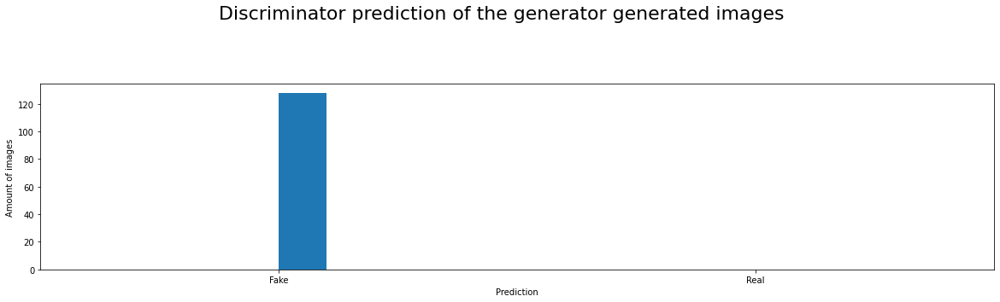

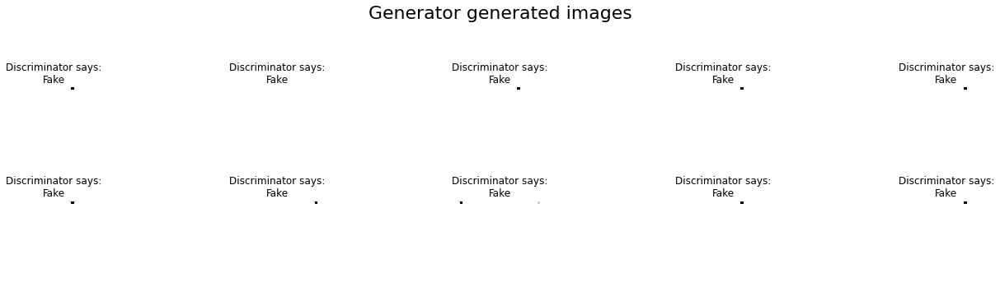

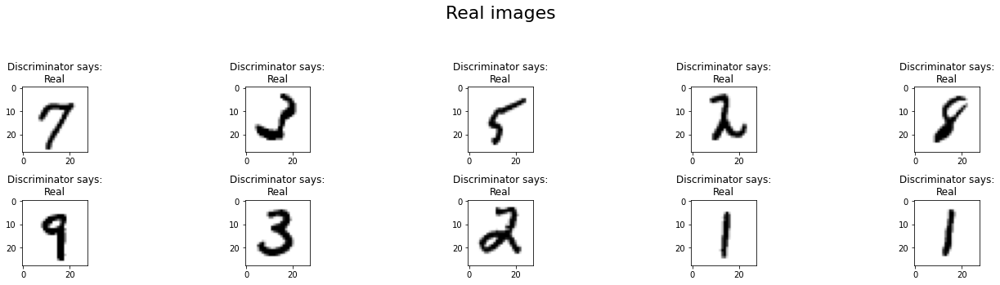

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 13     | Batch:   0
Discriminator | Loss: 8.13564e-12 | Accuracy:    1.0
Generator     | Loss: 24.8517 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



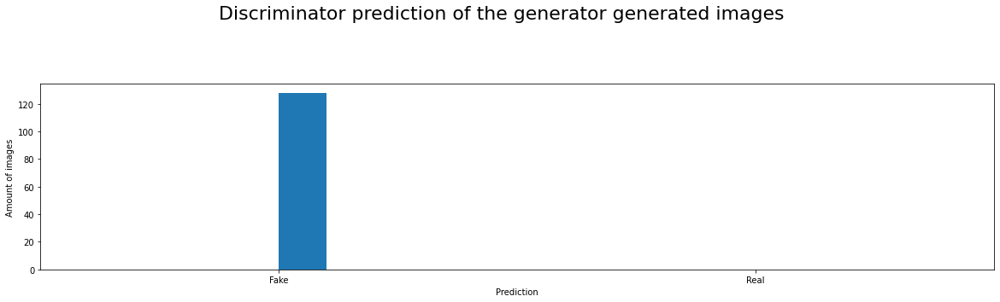

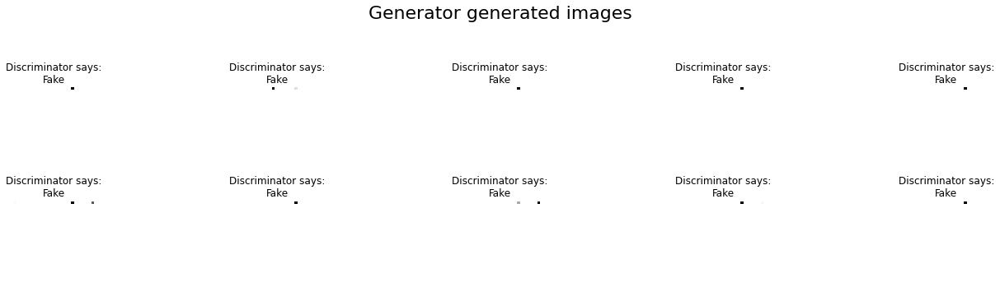

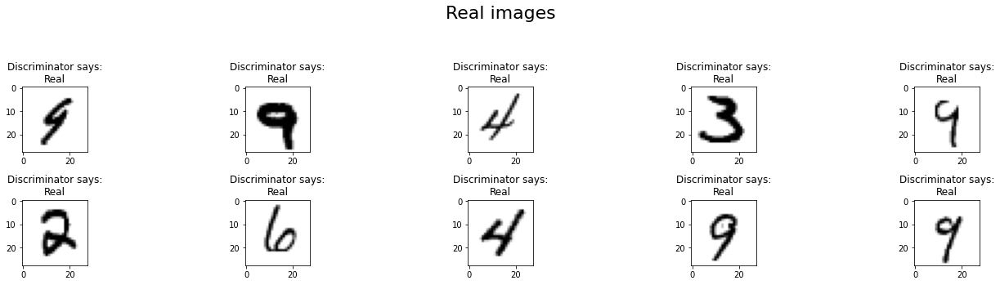

------------------------------------------------------------------------------------------------------------------------

Epoch: 13     | Batch: 200
Discriminator | Loss: 9.87224e-12 | Accuracy:    1.0
Generator     | Loss: 24.6658 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



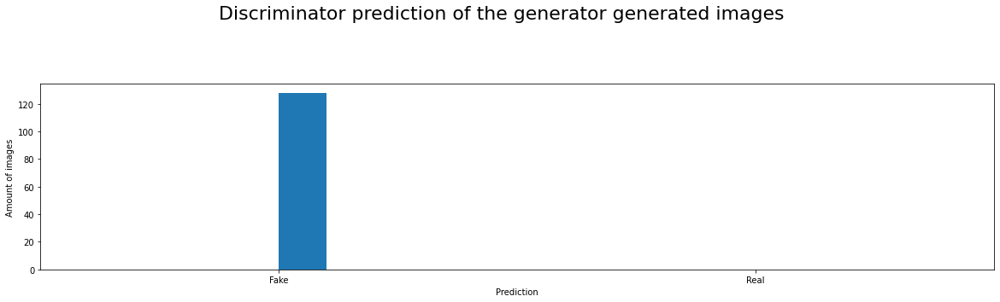

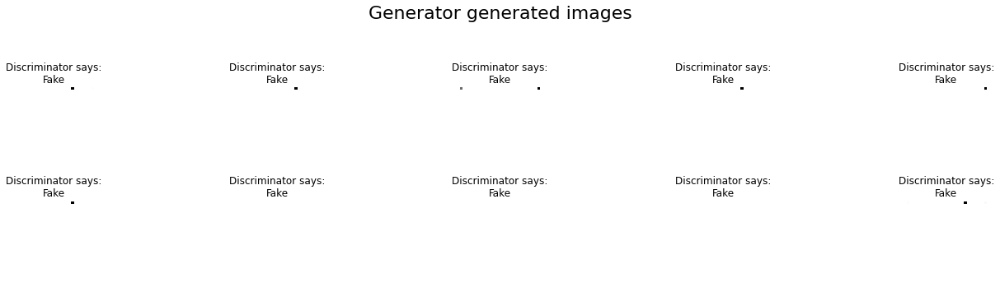

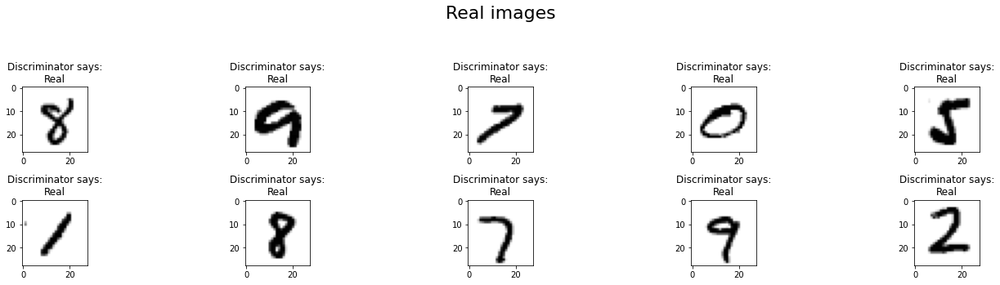

------------------------------------------------------------------------------------------------------------------------

Epoch: 13     | Batch: 400
Discriminator | Loss: 2.02175e-10 | Accuracy:    1.0
Generator     | Loss: 24.9088 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



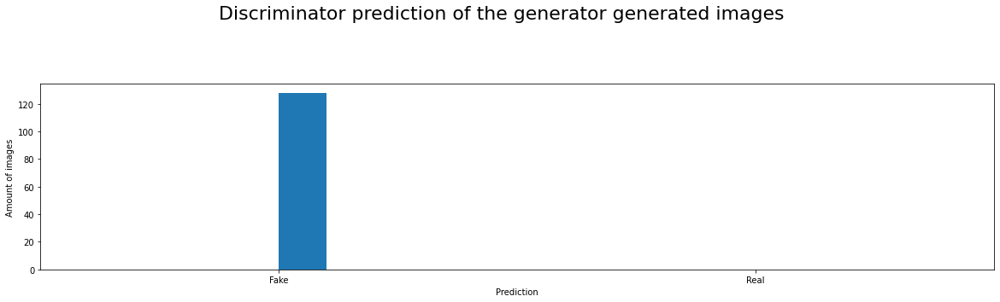

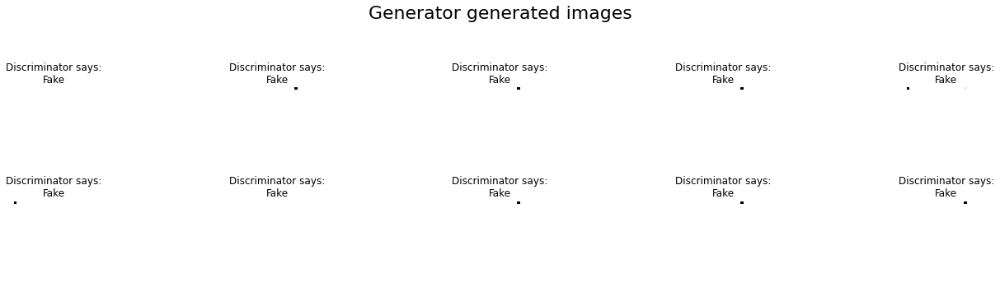

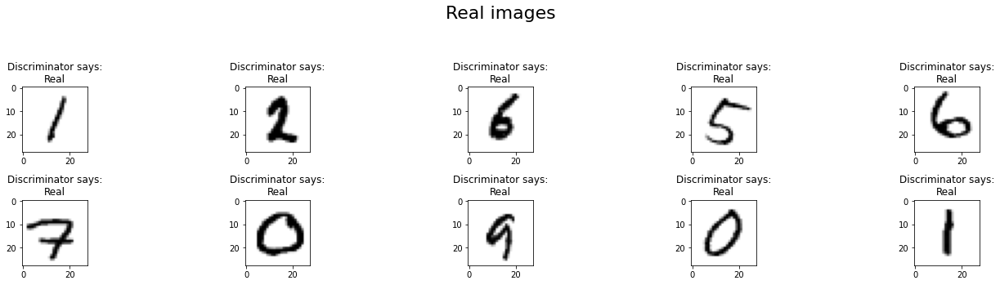

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 14     | Batch:   0
Discriminator | Loss: 7.45854e-11 | Accuracy:    1.0
Generator     | Loss: 24.9756 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



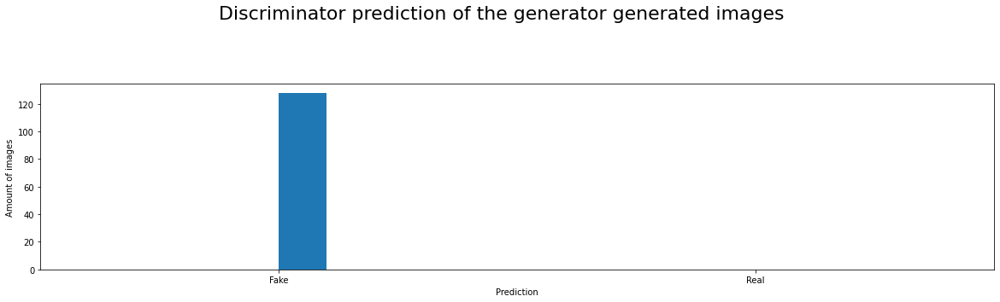

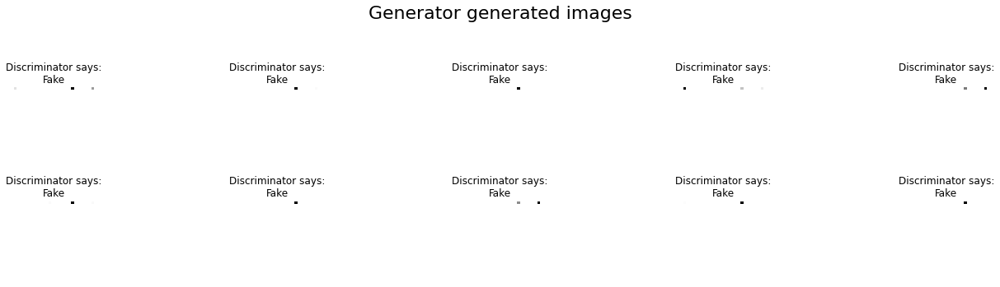

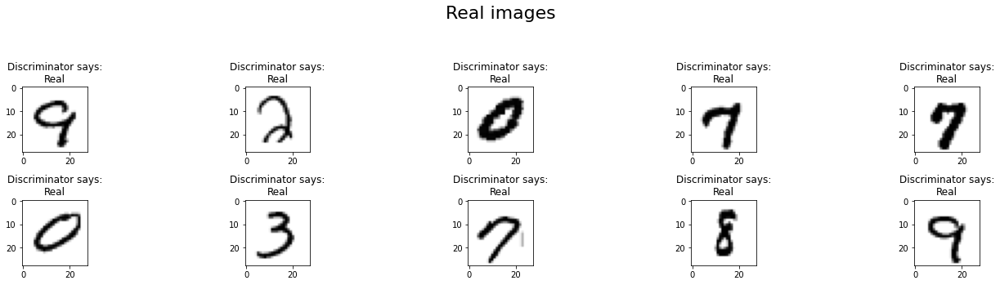

------------------------------------------------------------------------------------------------------------------------

Epoch: 14     | Batch: 200
Discriminator | Loss: 1.06624e-11 | Accuracy:    1.0
Generator     | Loss: 24.5738 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



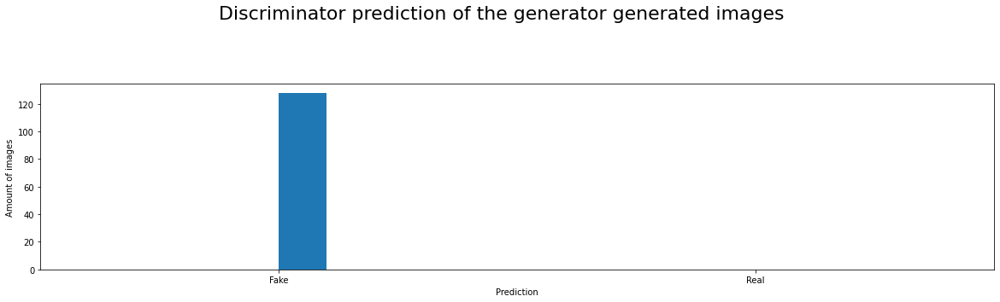

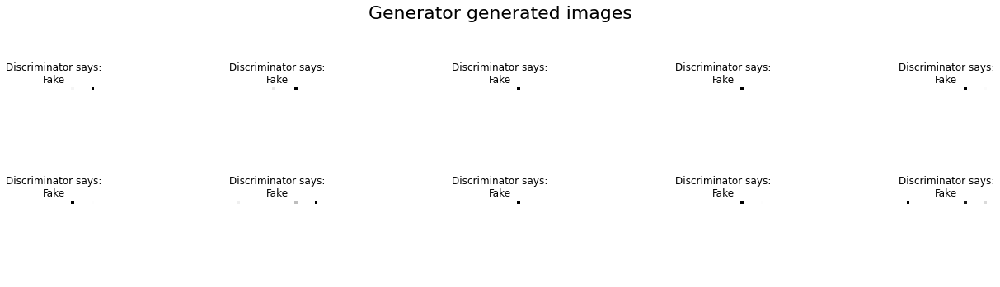

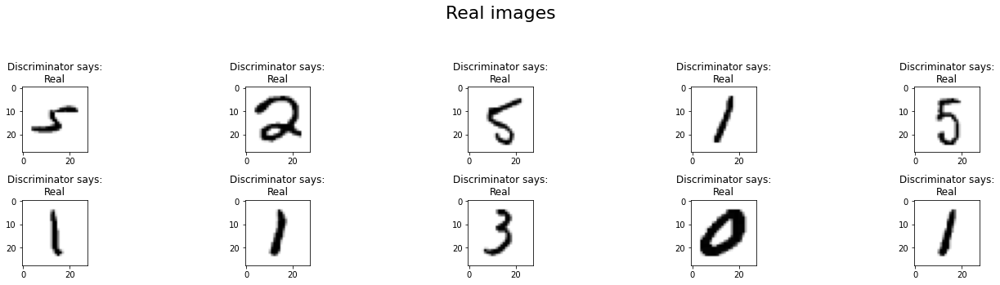

------------------------------------------------------------------------------------------------------------------------

Epoch: 14     | Batch: 400
Discriminator | Loss: 8.90562e-12 | Accuracy:    1.0
Generator     | Loss: 24.7541 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



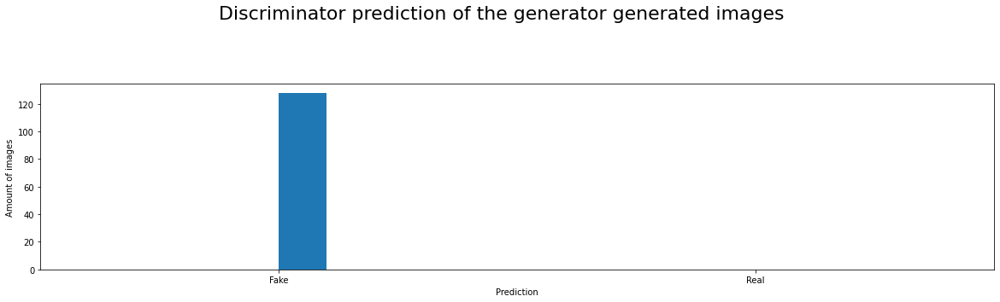

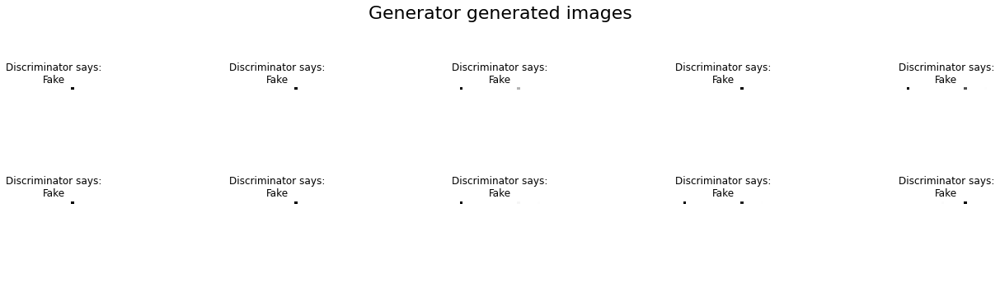

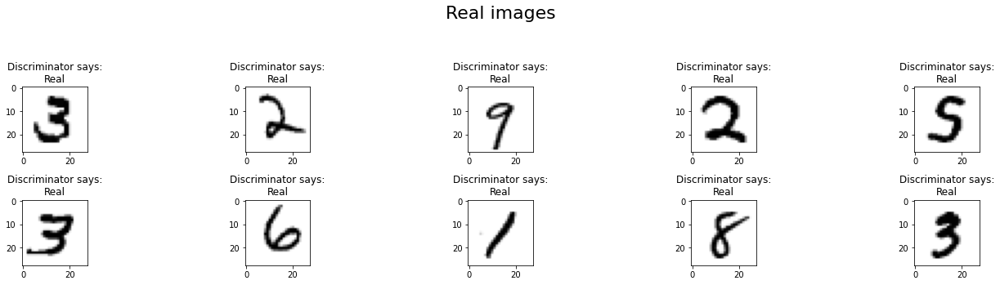

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 15     | Batch:   0
Discriminator | Loss: 7.72783e-12 | Accuracy:    1.0
Generator     | Loss: 24.895 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



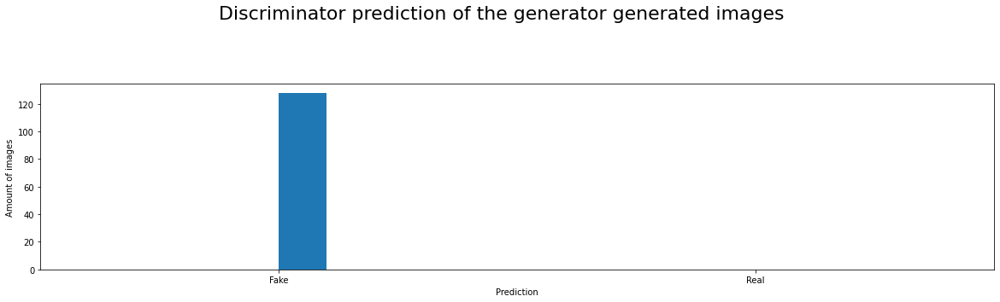

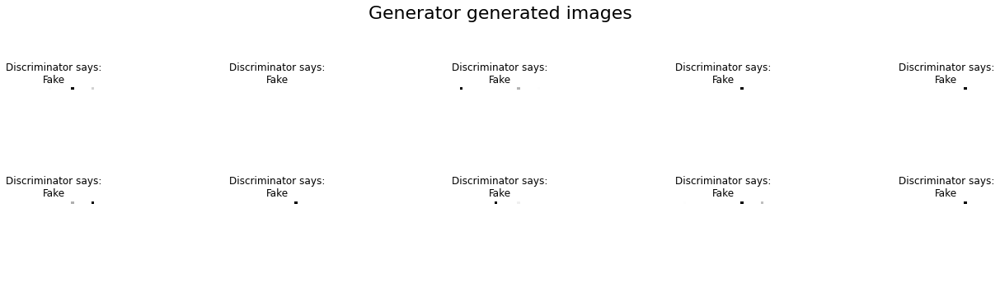

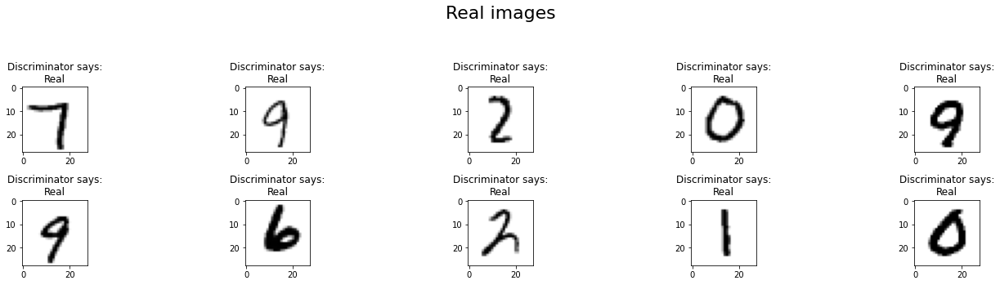

------------------------------------------------------------------------------------------------------------------------

Epoch: 15     | Batch: 200
Discriminator | Loss: 7.53291e-12 | Accuracy:    1.0
Generator     | Loss: 24.9204 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



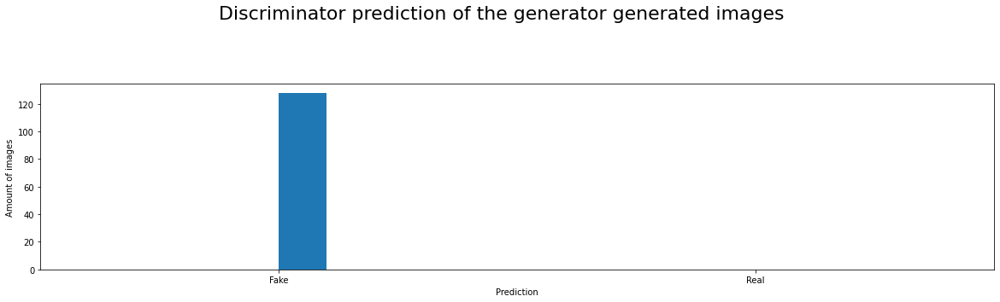

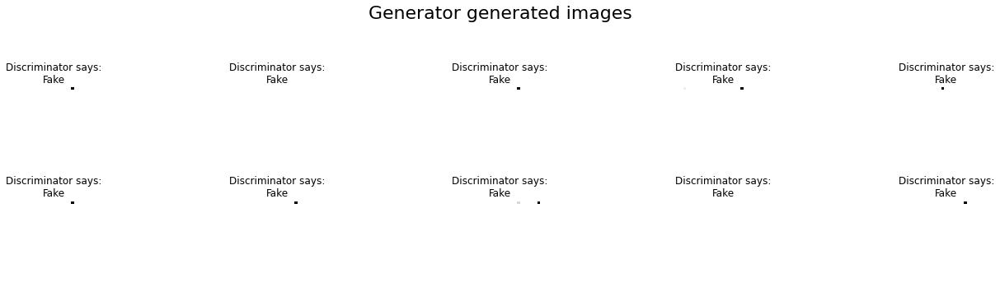

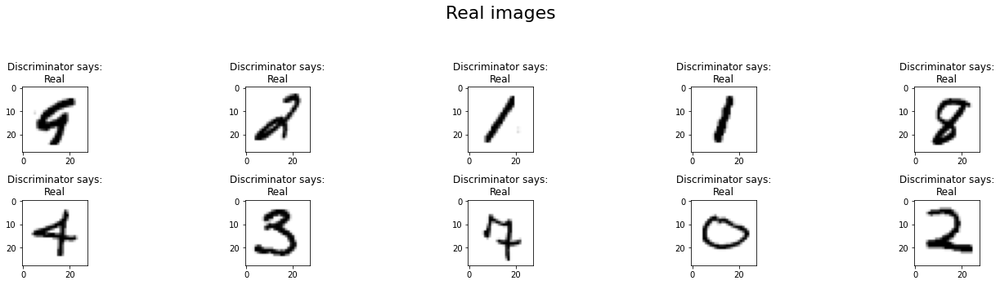

------------------------------------------------------------------------------------------------------------------------

Epoch: 15     | Batch: 400
Discriminator | Loss: 8.90442e-12 | Accuracy:    1.0
Generator     | Loss: 24.7541 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



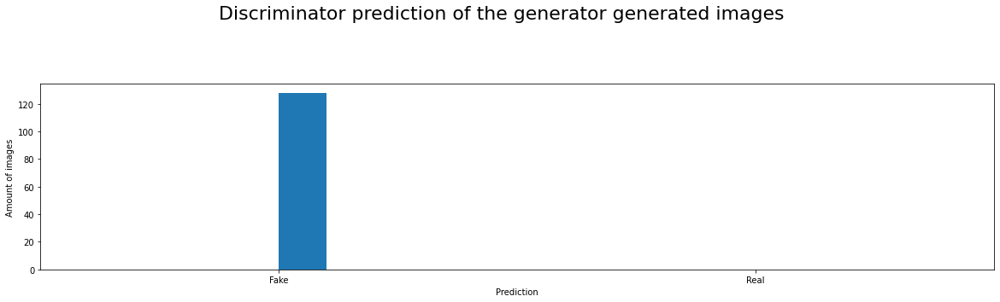

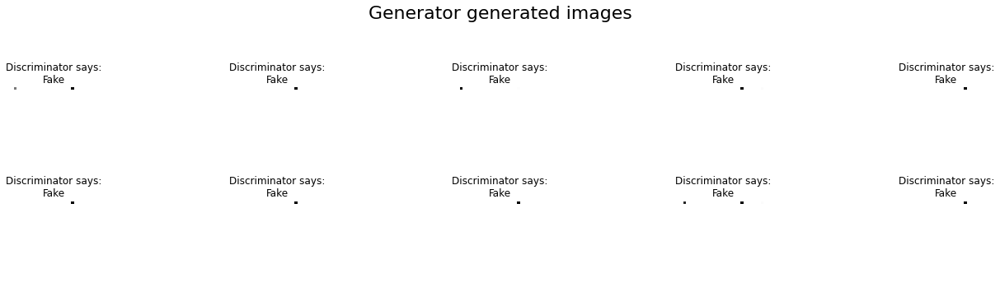

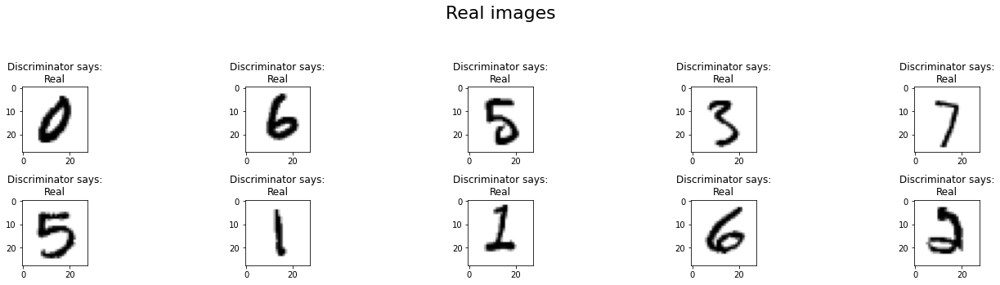

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 16     | Batch:   0
Discriminator | Loss: 7.75281e-12 | Accuracy:    1.0
Generator     | Loss: 24.8918 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



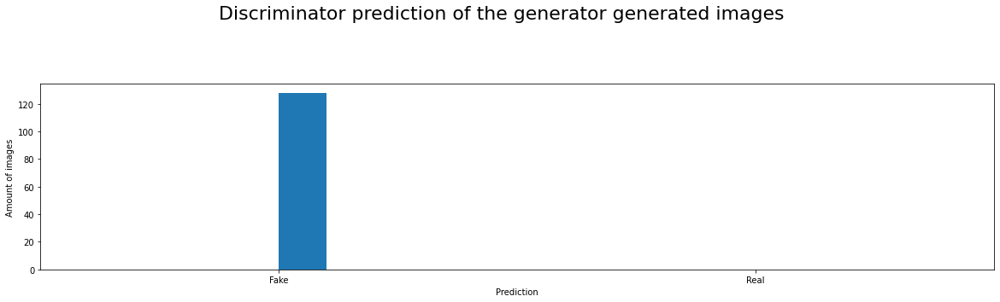

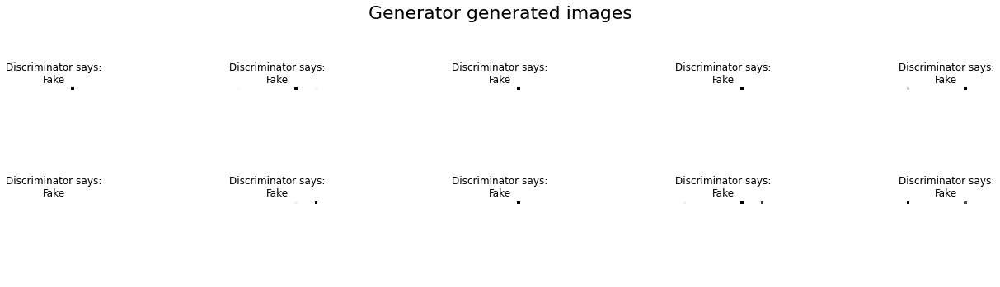

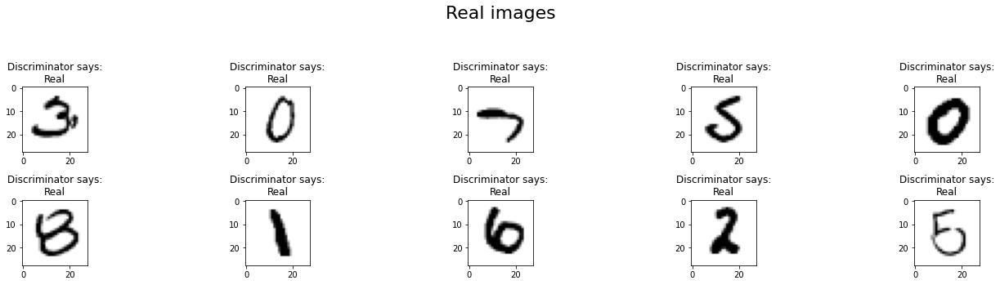

------------------------------------------------------------------------------------------------------------------------

Epoch: 16     | Batch: 200
Discriminator | Loss: 7.29361e-12 | Accuracy:    1.0
Generator     | Loss: 24.9726 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



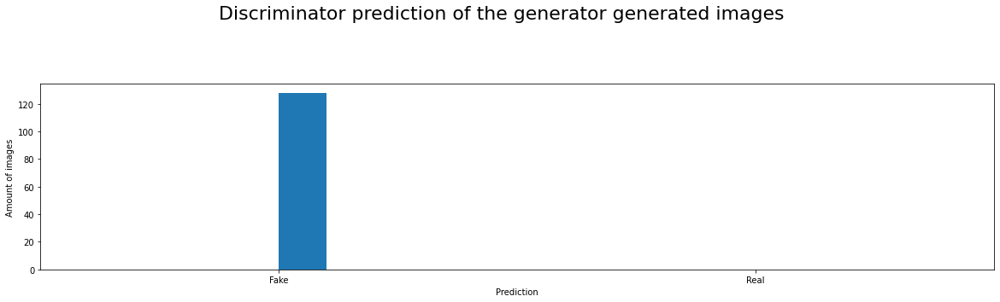

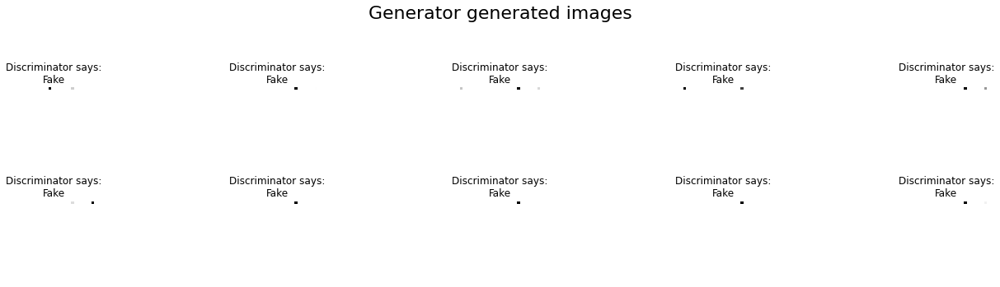

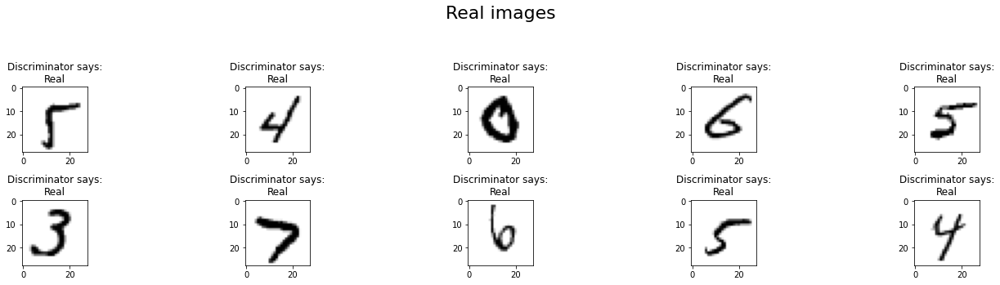

------------------------------------------------------------------------------------------------------------------------

Epoch: 16     | Batch: 400
Discriminator | Loss: 6.3561e-12 | Accuracy:    1.0
Generator     | Loss: 25.1456 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



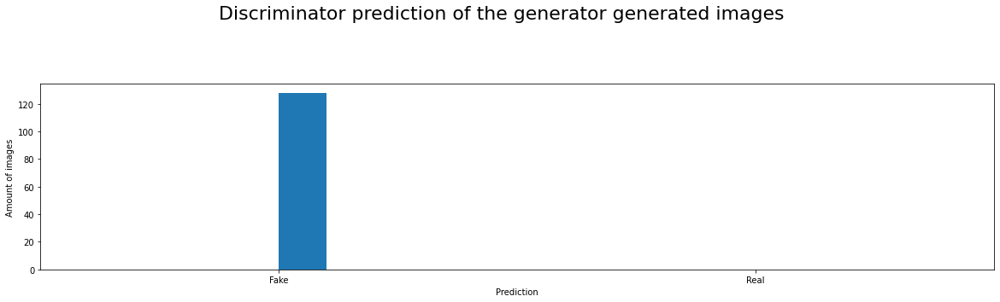

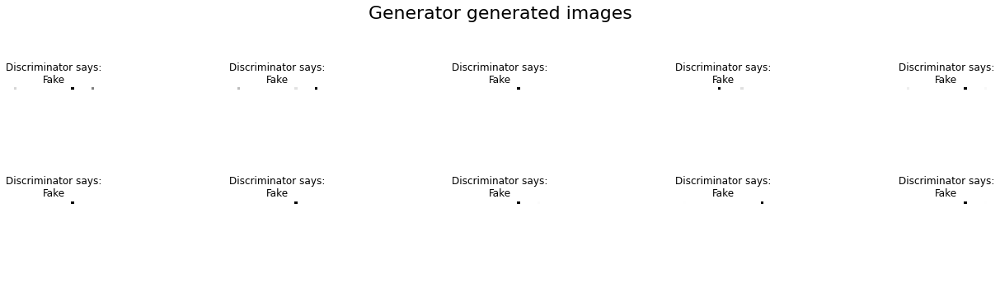

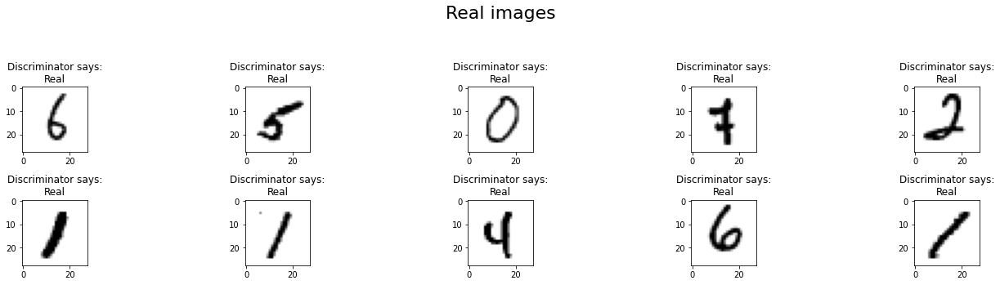

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 17     | Batch:   0
Discriminator | Loss: 7.42858e-12 | Accuracy:    1.0
Generator     | Loss: 24.9343 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



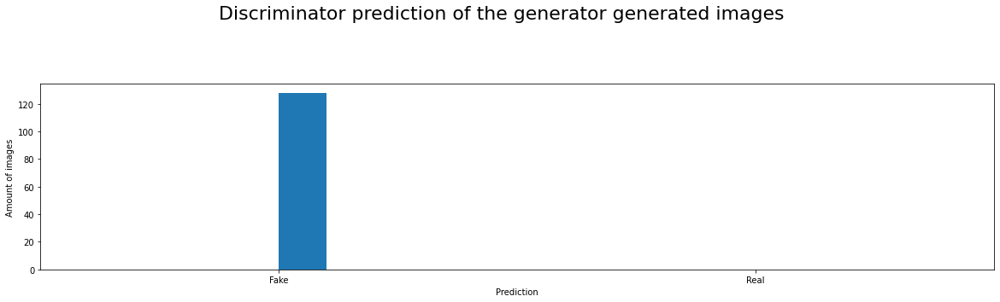

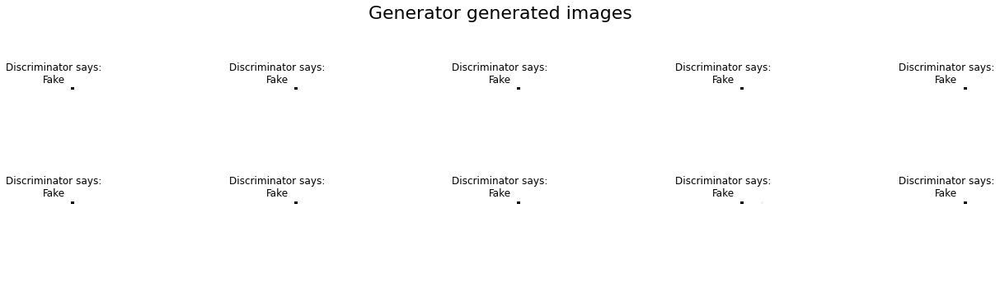

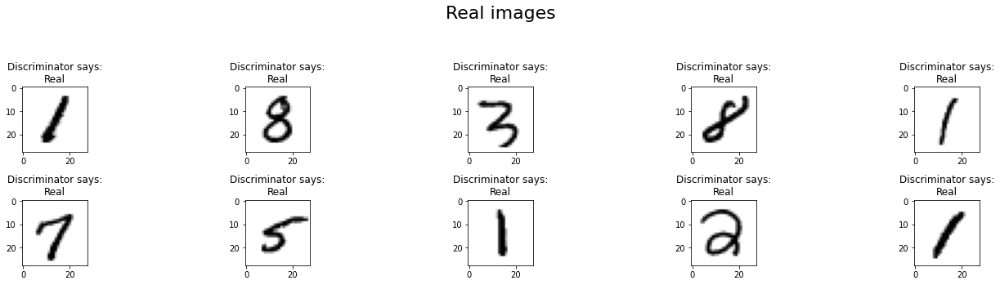

------------------------------------------------------------------------------------------------------------------------

Epoch: 17     | Batch: 200
Discriminator | Loss: 6.516e-12 | Accuracy:    1.0
Generator     | Loss: 25.0653 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



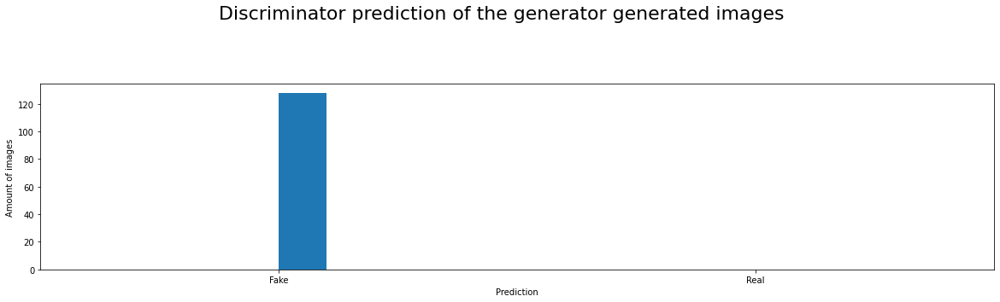

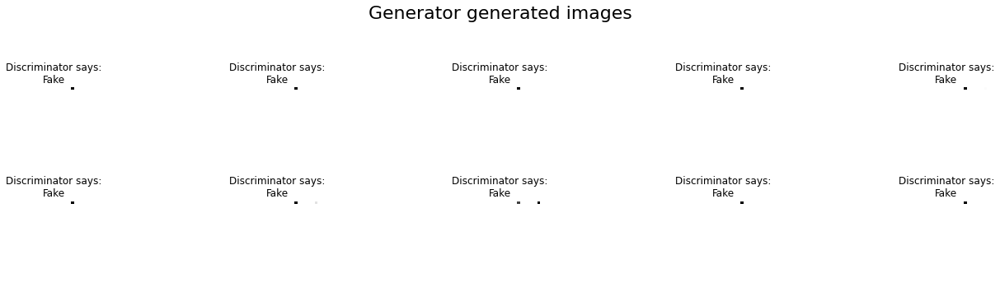

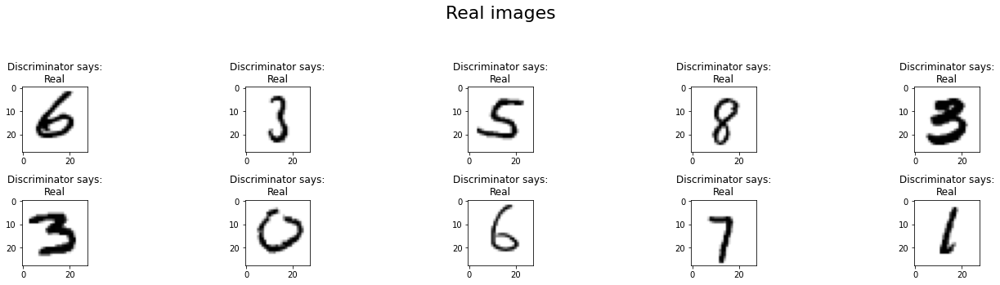

------------------------------------------------------------------------------------------------------------------------

Epoch: 17     | Batch: 400
Discriminator | Loss: 7.41734e-12 | Accuracy:    1.0
Generator     | Loss: 24.936 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



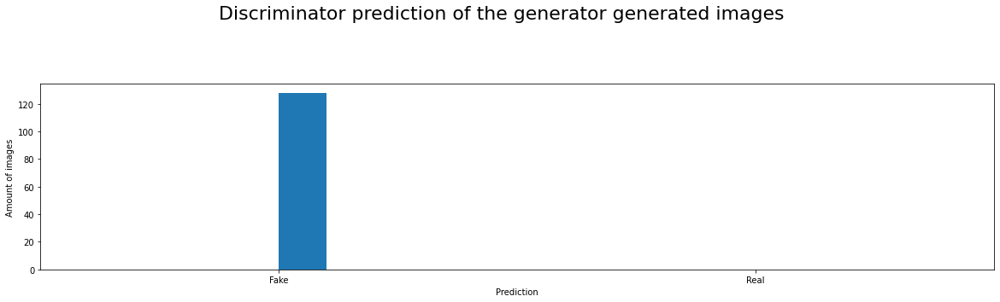

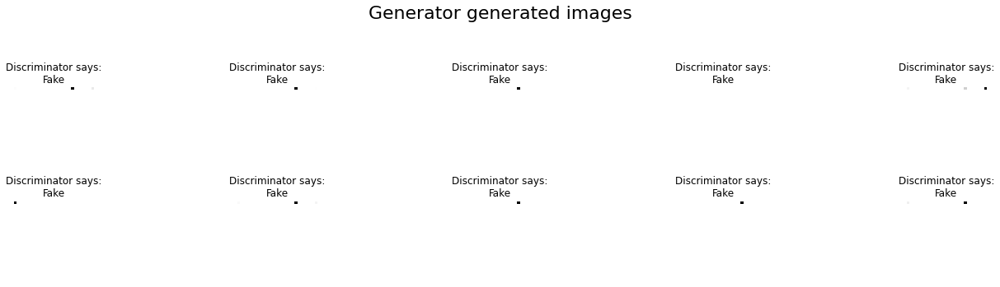

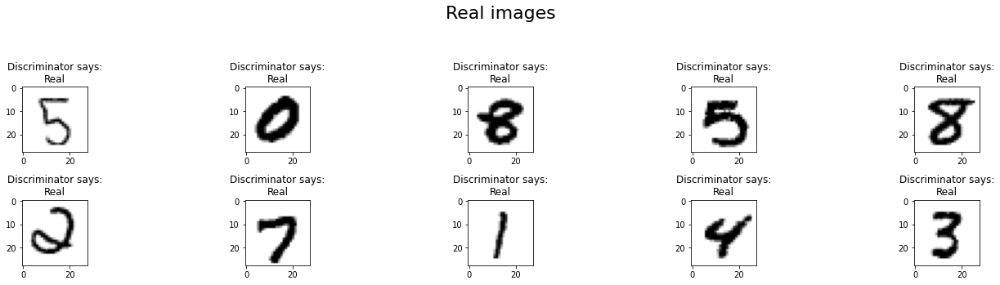

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 18     | Batch:   0
Discriminator | Loss: 6.59804e-12 | Accuracy:    1.0
Generator     | Loss: 25.0535 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



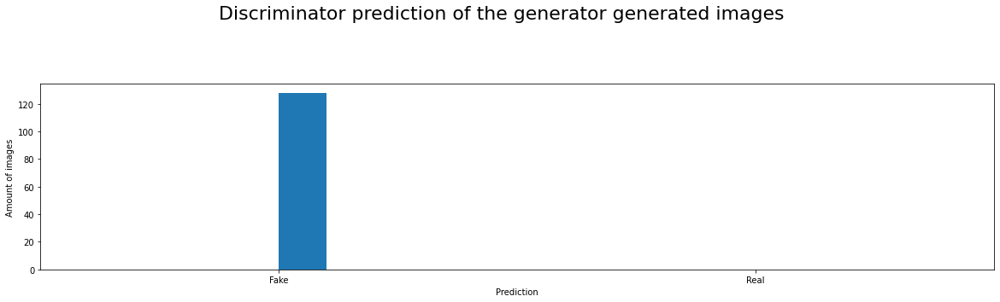

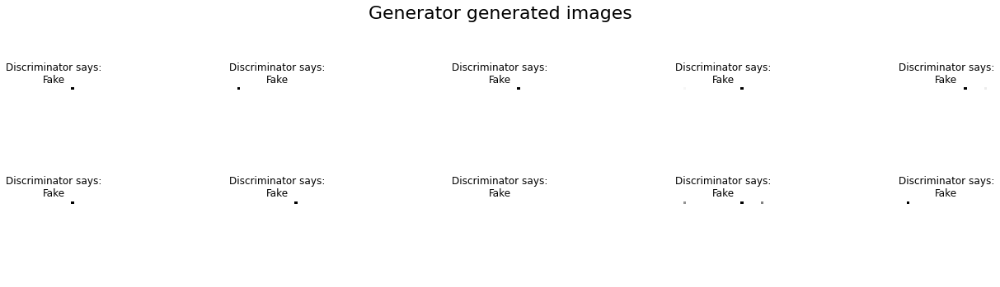

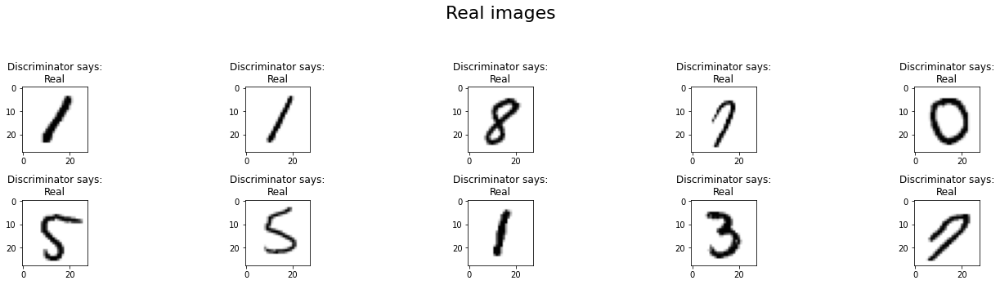

------------------------------------------------------------------------------------------------------------------------

Epoch: 18     | Batch: 200
Discriminator | Loss: 7.09636e-12 | Accuracy:    1.0
Generator     | Loss: 24.9801 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



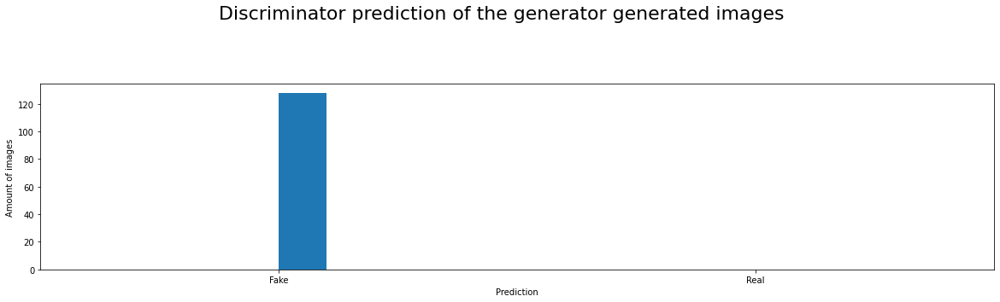

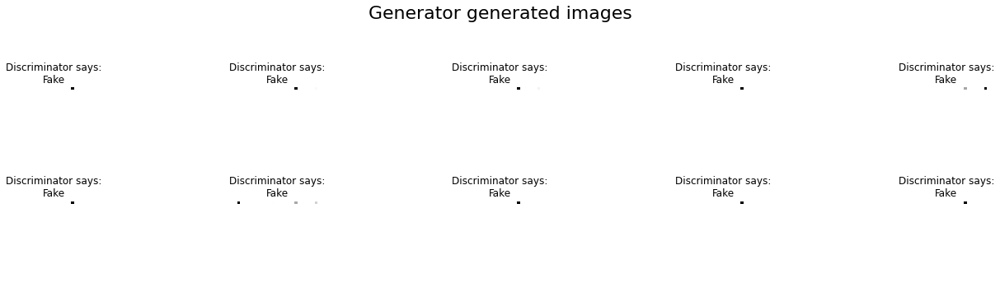

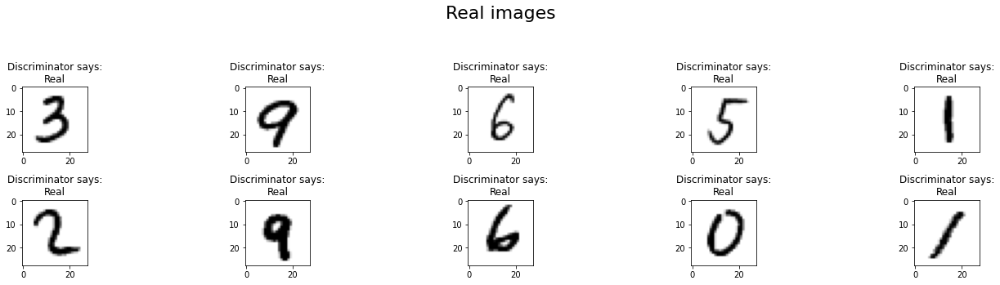

------------------------------------------------------------------------------------------------------------------------

Epoch: 18     | Batch: 400
Discriminator | Loss: 8.77084e-12 | Accuracy:    1.0
Generator     | Loss: 24.7686 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



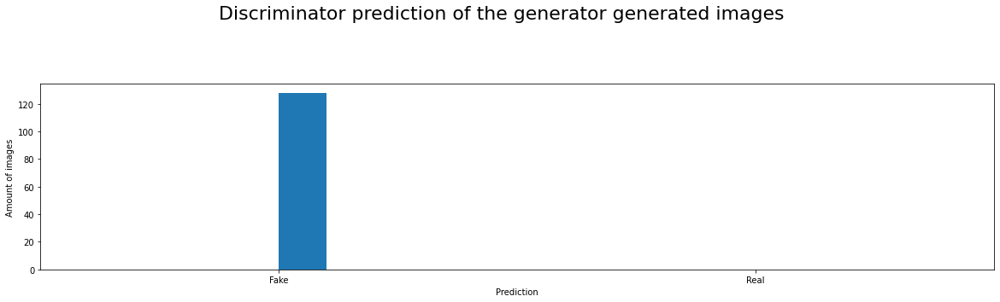

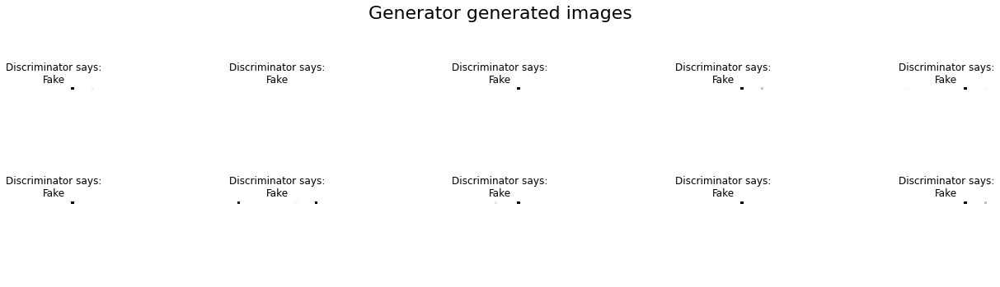

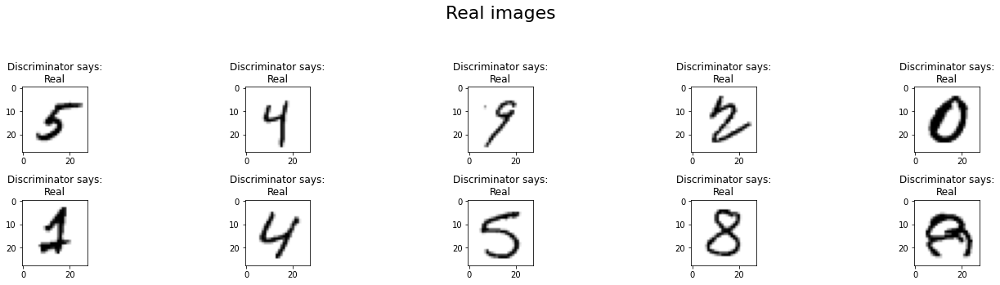

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 19     | Batch:   0
Discriminator | Loss: 2.64971e-11 | Accuracy:    1.0
Generator     | Loss: 24.9079 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



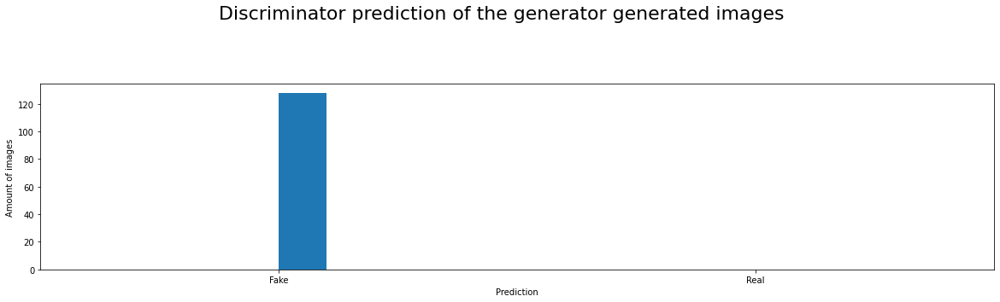

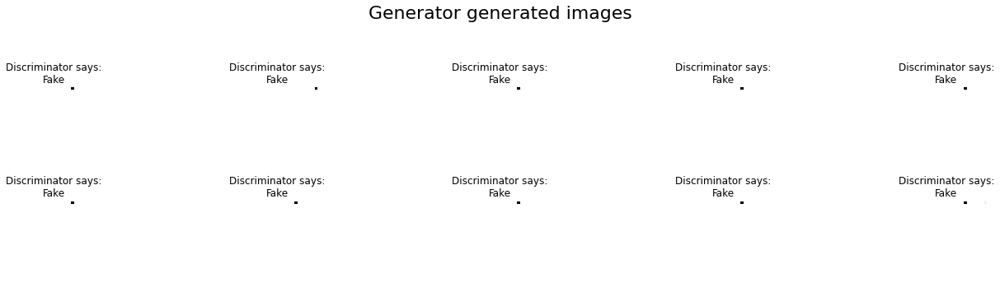

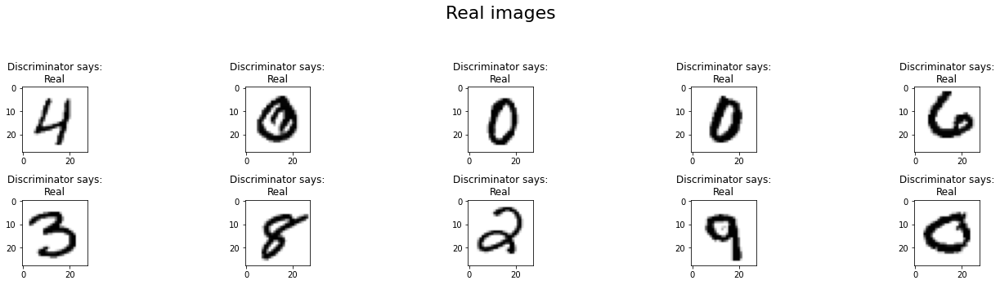

------------------------------------------------------------------------------------------------------------------------

Epoch: 19     | Batch: 200
Discriminator | Loss: 6.72153e-12 | Accuracy:    1.0
Generator     | Loss: 25.0343 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



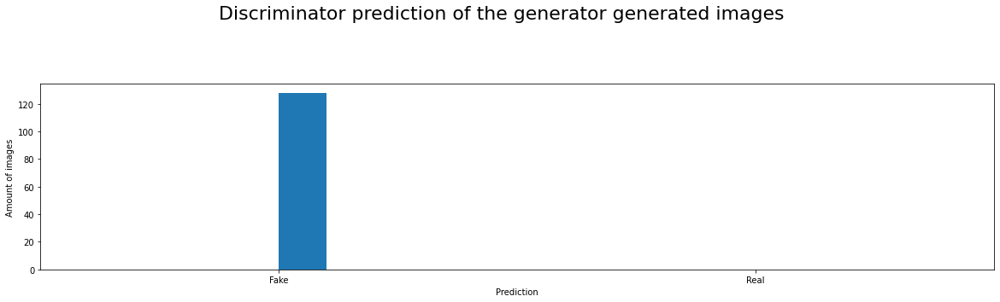

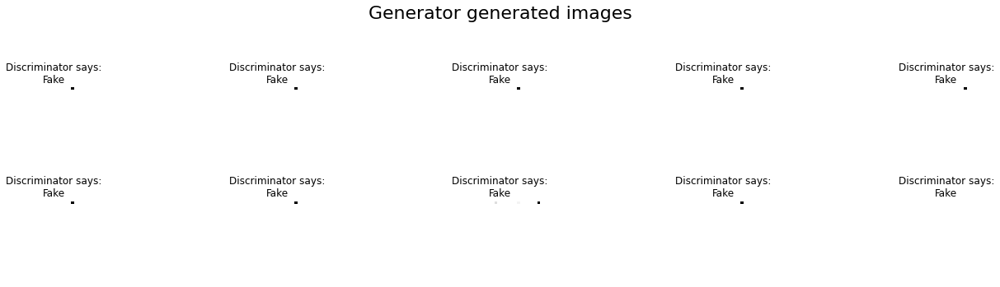

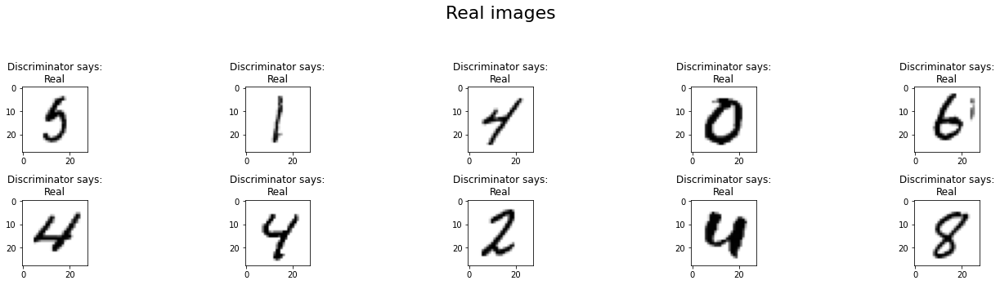

------------------------------------------------------------------------------------------------------------------------

Epoch: 19     | Batch: 400
Discriminator | Loss: 9.98535e-12 | Accuracy:    1.0
Generator     | Loss: 24.6395 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



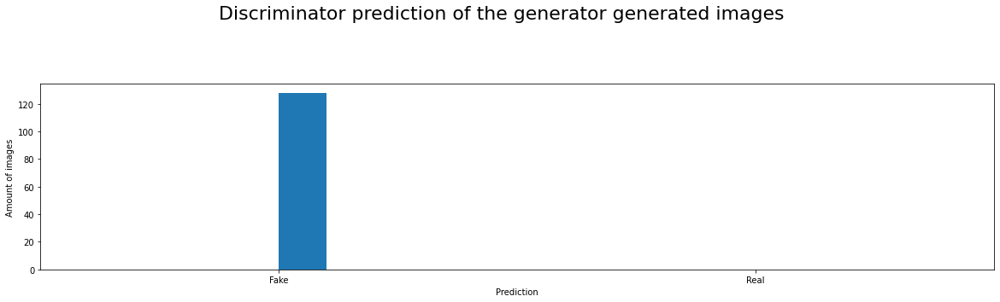

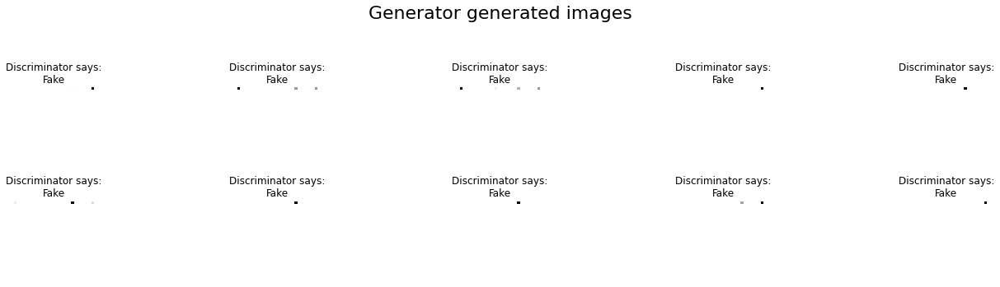

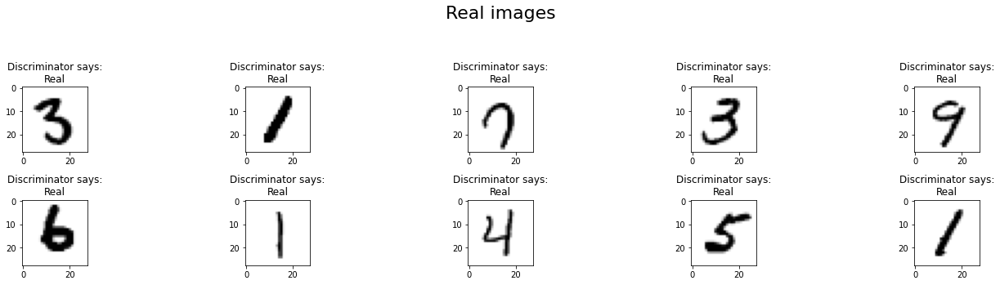

------------------------------------------------------------------------------------------------------------------------



In [ ]:
batch_size=128 # tamaño del batch
plt.rcParams["figure.figsize"]=[20,4]
for epoch in range(20): #epochs a realizar
    print(x.shape)
    for batch in range(int(x.shape[0]/batch_size)): #n° de batchs a realizar según el tamaño batch_size
      # train discriminator
      ix = np.random.randint(0, x.shape[0], batch_size) # generamos índices para samplear imágenes del dataset, sampleamos batch_size=128 datos
      x_real = x[ix]  # seleccionamos las imágenes
      noise = np.random.rand(noise_size * batch_size) # generamos ruido, según el tamaño de la entrada de nuestro generador
      noise = noise.reshape((batch_size, noise_size)) # reshape (batch_size,noise_size) sized noise
      x_false = generator_net.predict(noise) # generamos imágenes fake según el ruido
      y_real= np.ones((batch_size, 1)) # etiquetas real
      y_false = np.zeros((batch_size, 1)) #etiquetas fake
      x_train = np.concatenate((x_real, x_false)) # x_train-> imágenes reales + imágenes fakes
      y_train = np.concatenate((y_real, y_false)) # y_train-> etiquetas reales + etiquetas fakes
      dis_loss, dis_acc = discriminator.train_on_batch(x_train, y_train) #train discriminator
      # train generator
      noise2 = np.random.rand(noise_size * batch_size) # generamos ruido nuevamente según el tamaño de la entrada de nuestro generador
      noise2 = noise2.reshape((batch_size, noise_size)) # reshape (batch_size,noise_size) sized noise
      gen_loss, gen_acc = gan.train_on_batch(noise2 , np.ones((batch_size, 1))) # output is 1, as generator needs to convine discriminator (trainable false) w/ fake images from noise
      if batch%(200)==0: # cada cuánto plotear es ajustable
          print("Epoch: {:2}     | Batch: {:3}".format(epoch, batch))
          print("Discriminator | Loss: {:6.6} | Accuracy: {:6.6}".format(dis_loss, dis_acc))
          print("Generator     | Loss: {:6.6} | Accuracy: {:6.6}".format(gen_loss, gen_acc))
          # plot random generated images, discriminator image inputs and outputs, and losses and accuracies
          y_pred = discriminator.predict(x_train)
          y_pred = (y_pred > 0.5)
          print('Metrics')
          print(classification_report(y_train, y_pred))

          y_pred_gen = discriminator.predict(x_false)
          y_pred_gen = (y_pred_gen > 0.5).astype(int)
          plt.suptitle("Discriminator prediction of the generator generated images", y=1.2,size=22)
          plt.hist(y_pred_gen)
          plt.xticks([0, 1], ['Fake', 'Real'])
          plt.xlim(-0.5, 1.5)
          plt.xlabel('Prediction')
          plt.ylabel('Amount of images')
          plt.show()  

          plt.suptitle("Generator generated images", y=1.2,size=22)
          for i in range(10):
            plt.subplot(2, 5, 1 + i)
            plt.title("Discriminator says:\n"+ ["Fake","Real"][int(np.round(discriminator.predict(x_false[i:i+1, :, :, :])[0,0],0))])
            plt.axis('off')
            plt.imshow(x_false[i, :, :, 0], cmap='gray_r')
          plt.tight_layout()
          plt.show()
    
          plt.suptitle("Real images", y=1.2,size=22)
          for i in range(10):
            plt.subplot(2, 5, 1 + i)
            plt.title("Discriminator says:\n"+ ["Fake","Real"][int(np.round(discriminator.predict(x_real[i:i+1, :, :, :])[0,0],0))])
            plt.imshow(x_real[i, :, :, 0],cmap='gray_r')
          plt.tight_layout()
          plt.show()

          print("-"*120+"\n")
          

Debido a que el discriminador no se entrena con las imagenes predecidas, este discriminador podria considerarse como un sabelotodo que no permite al generador lograr convenserlo, es por este que el generador queda en underfitting, lo cual es claramente representado por imagenes blancas.

## 4.b) Mejora de GAN.

Utilizando el código modificado en el punto 4.b y lo aprendido durante el ramo. Modifique la arquitectura de la red neuronal a modo de obtener imágenes fake sean convincentes. Adicionalmente responda/comente según lo que observa durante el entrenamiento de la red neuronal.

* Explicar el comportamiento de la evolución de ambos desempeños y por qué no necesariamente esos valores representan que la red alcance su cometido
* Describir, teórica o práctiamente, que ocurriría si la red generadora no pudiera por algún motivo (divergencia en entrenamiento, excesivo _underfitting_, etc) generar imágenes razonables.
* Describir la contraparte de lo que ocurriría si la red discriminadora no pudiera aprender a diferenciar imagenes reales de ruido aleatorio.


Una vez teniendo una red entrenada a completitud, muestre varias imagenes generadas. ¿Se logra obtener imágenes convincentes?. Igualmente con la red entrenada, guarde el ruido aleatorio que origina dos números reconocibles distintos. ¿Qué ocurre si vemos las imagenes generadas por el generador al entregarle el vector del promedio entre los dos puntos?


- No estamos buscando que el discriminador sea perfecto, ni que el generador genere una imagen en especifico, si no que estamos buscando generar imagenes que se parezcan a las del dataset original. Es por esto que la metricas no son muy utiles para ver el comportamiento del modelo, ya que como se puede ver aveces decide que todos las images reales son falsas y las falsas son verdaderas y aveces lo contrario. Lo importante es que se logren rescatar patrones importantes durante el entrenamiento, por sobre todo en el generador el cual lentamente va rescatando patrones relevantes los cuales sirven para redistribuir los valores ingresados por los ruidos y asi lograr imagenes semejantes a las conocidas.
- El discriminador podra volverse muy bueno en comparacion al generador y por ende este nunca podria lograr convencer al discriminador, esto ocasionaria un mal comportamiento ocasionando underfitting. 
- Si el discriminador no pudiera aprender a diferenciar entonces cualquier cosa que le enviara el generador la tomaria como buena, o en otras palabras, habria mas chance de que el ruido sea tomado como imagen real y asi el generador no podria comprender cuales son los patrones importantes que se deben rescatar.

Para mejorar el modelo nos basamos en el modelo planteado por [Towards DS](https://towardsdatascience.com/gan-by-example-using-keras-on-tensorflow-backend-1a6d515a60d0) en el cual se ataca el mismo problema. Como podemos ver mas abajo, si se logra obtener imagenes mas convicentes, de hecho de se puede ver una secuencia (seleccionada) de numeros del 3 al 8. Al sacar el promedio podemos observar que las imagenes se "mezclan" entre ellas, obteniedo una imagen que tiene cualidades de ambas, esto se puede usar para moldear una imagen particular para que quede de una manera mas exacta, por ejemplo si tenemos dos ruidos que generan numeros parecidos al cinco, se podrian mezclar sus ruidos y obtener un 5 de mejor calidad.

In [ ]:
from keras.layers import LeakyReLU, Dropout, Input, BatchNormalization, Activation, Conv2DTranspose
from keras.models import Model

# Discriminator
discriminator_net = Sequential()
depth = 64
dropout = 0.4
input_shape = x.shape[1:]
discriminator_net.add(Conv2D(depth*1, 5, strides=2, input_shape=input_shape,\
padding='same', activation=LeakyReLU(alpha=0.2)))
discriminator_net.add(Dropout(dropout))
discriminator_net.add(Conv2D(depth*2, 5, strides=2, padding='same',\
activation=LeakyReLU(alpha=0.2)))
discriminator_net.add(Dropout(dropout))
discriminator_net.add(Conv2D(depth*4, 5, strides=2, padding='same',\
activation=LeakyReLU(alpha=0.2)))
discriminator_net.add(Dropout(dropout))
discriminator_net.add(Conv2D(depth*8, 5, strides=1, padding='same',\
activation=LeakyReLU(alpha=0.2)))
discriminator_net.add(Dropout(dropout))
discriminator_net.add(Flatten())
discriminator_net.add(Dense(1))
discriminator_net.add(Activation('sigmoid'))
discriminator_net.summary()

optimizer = RMSprop(lr=0.0008, clipvalue=1.0, decay=6e-8)
discriminator = Sequential()
discriminator.add(discriminator_net)
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer,metrics=['accuracy'])

# Generator
generator_net = Sequential()
depth = 10
dim = 7
noise_size=50
generator_net.add(Dense(dim*dim*depth, input_dim=noise_size))
generator_net.add(BatchNormalization(momentum=0.9))
generator_net.add(Activation('relu'))
generator_net.add(Reshape((dim, dim, depth)))
generator_net.add(Dropout(dropout))
generator_net.add(UpSampling2D())
generator_net.add(Conv2DTranspose(int(depth/2), 5, padding='same'))
generator_net.add(BatchNormalization(momentum=0.9))
generator_net.add(Activation('relu'))
generator_net.add(UpSampling2D())
generator_net.add(Conv2DTranspose(int(depth/4), 5, padding='same'))
generator_net.add(BatchNormalization(momentum=0.9))
generator_net.add(Activation('relu'))
generator_net.add(Conv2DTranspose(int(depth/8), 5, padding='same'))
generator_net.add(BatchNormalization(momentum=0.9))
generator_net.add(Activation('relu'))
generator_net.add(Conv2DTranspose(1, 5, padding='same'))
generator_net.add(Activation('sigmoid'))
generator_net.summary()

optimizer = RMSprop(lr=0.0004, clipvalue=1.0, decay=3e-8)
gan = Sequential()
gan.add(generator_net)
gan.add(discriminator_net)
gan.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 14, 14, 64)        1664      
_________________________________________________________________
dropout_16 (Dropout)         (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 7, 7, 128)         204928    
_________________________________________________________________
dropout_17 (Dropout)         (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 4, 4, 256)         819456    
_________________________________________________________________
dropout_18 (Dropout)         (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 4, 4, 512)       

(60000, 28, 28, 1)
Epoch:  0     | Batch:   0
Discriminator | Loss: 0.693631 | Accuracy: 0.527344
Generator     | Loss: 1.48496 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       128
         1.0       0.50      1.00      0.67       128

    accuracy                           0.50       256
   macro avg       0.25      0.50      0.33       256
weighted avg       0.25      0.50      0.33       256



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


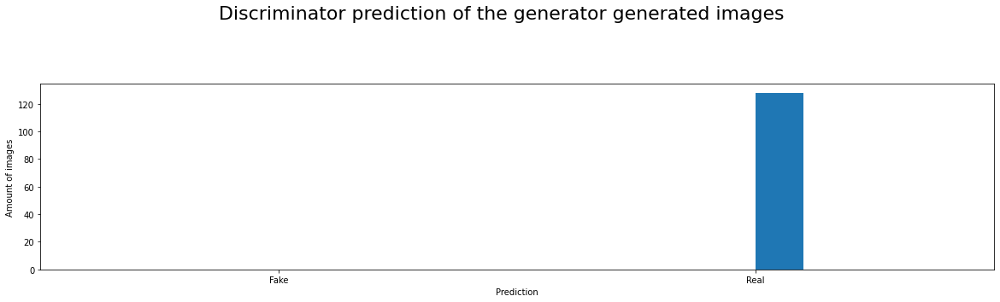

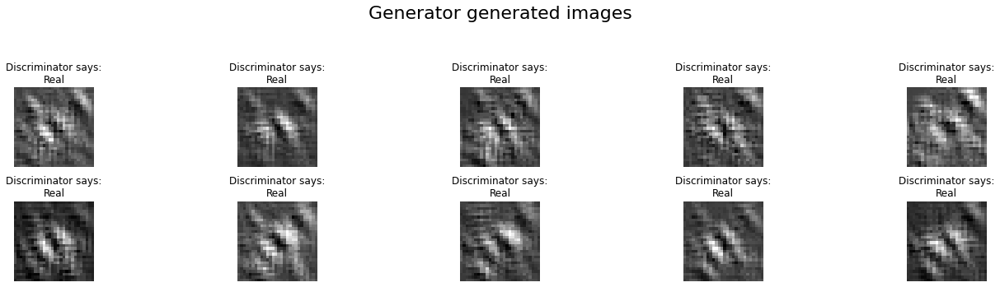

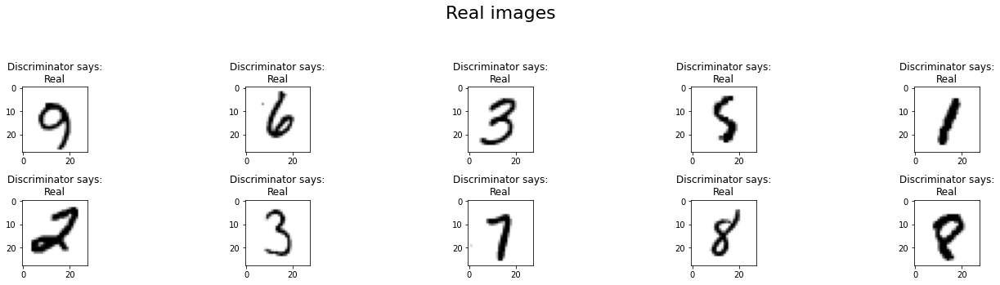

------------------------------------------------------------------------------------------------------------------------

Epoch:  0     | Batch: 200
Discriminator | Loss: 0.0103329 | Accuracy:    1.0
Generator     | Loss: 5.38396 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



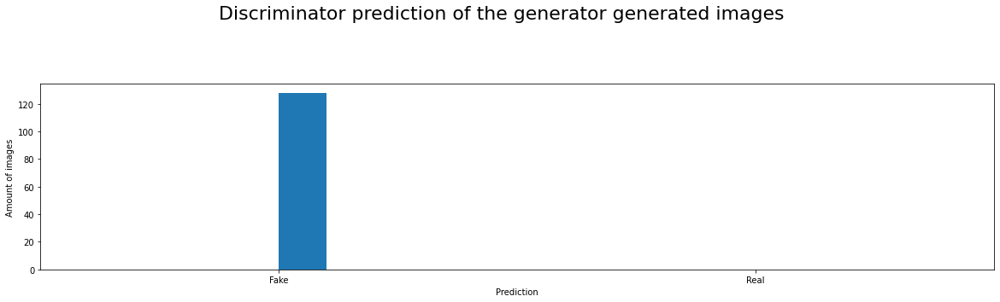

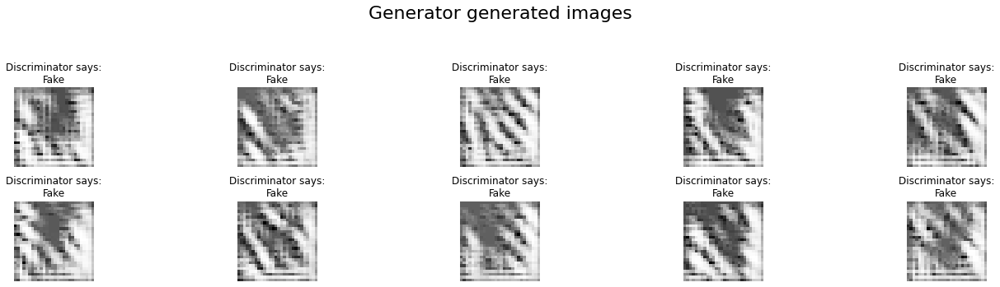

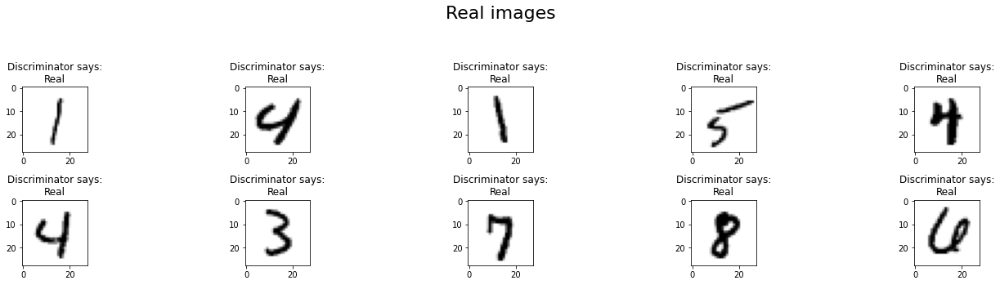

------------------------------------------------------------------------------------------------------------------------

Epoch:  0     | Batch: 400
Discriminator | Loss: 0.280751 | Accuracy: 0.863281
Generator     | Loss: 12.8537 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       128
         1.0       1.00      0.95      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



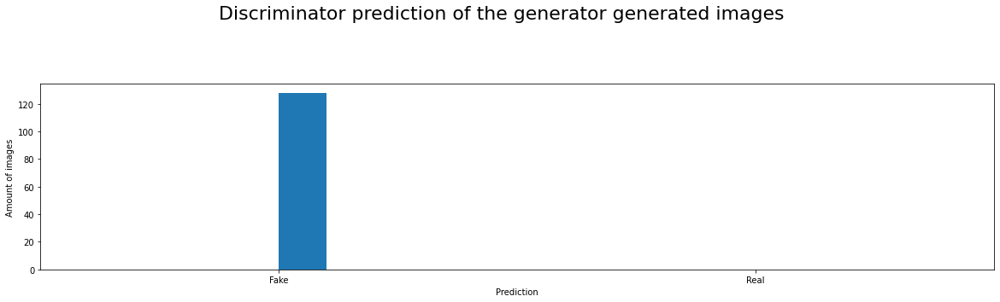

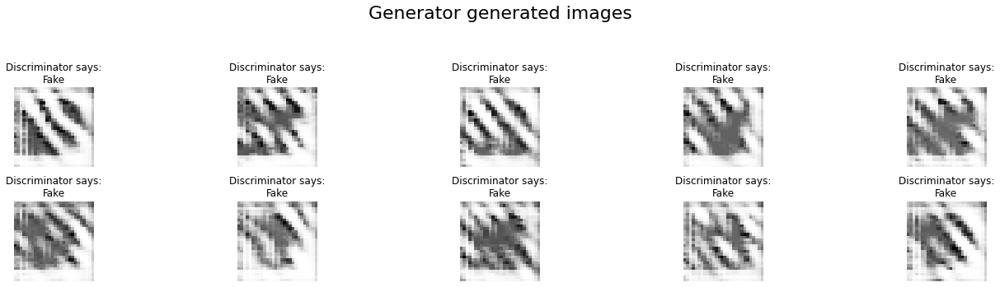

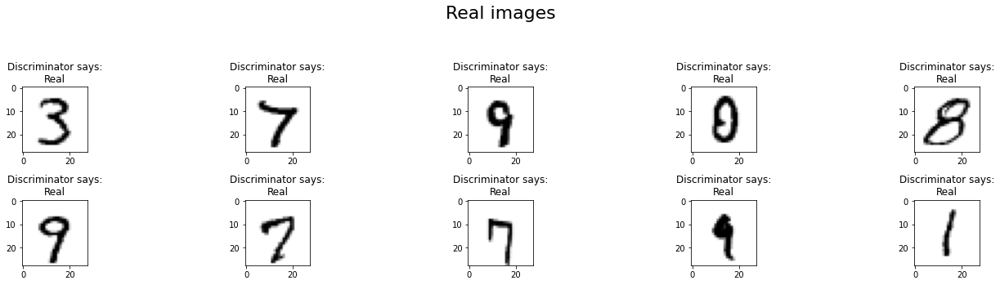

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  1     | Batch:   0
Discriminator | Loss: 0.013153 | Accuracy:    1.0
Generator     | Loss: 4.69874 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.98       128
         1.0       0.96      1.00      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



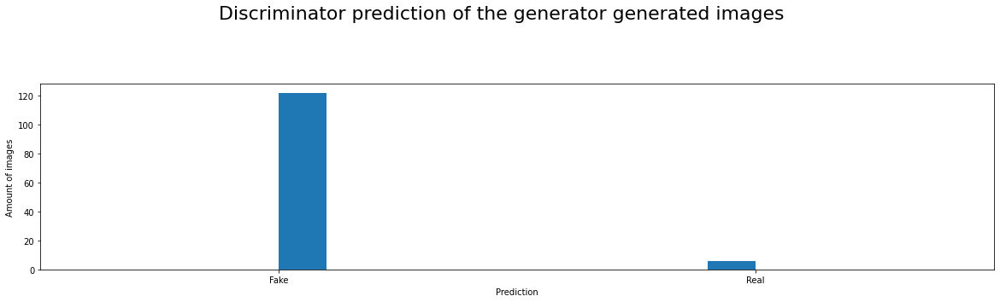

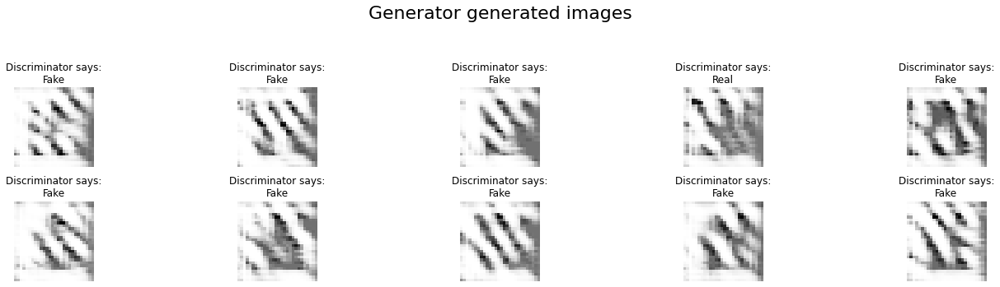

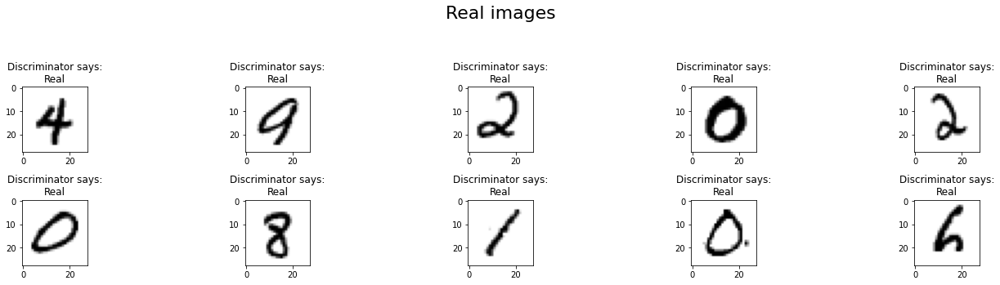

------------------------------------------------------------------------------------------------------------------------

Epoch:  1     | Batch: 200
Discriminator | Loss: 0.0156939 | Accuracy: 0.996094
Generator     | Loss: 5.47149 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.69      0.81       128
         1.0       0.76      1.00      0.86       128

    accuracy                           0.84       256
   macro avg       0.88      0.84      0.84       256
weighted avg       0.88      0.84      0.84       256



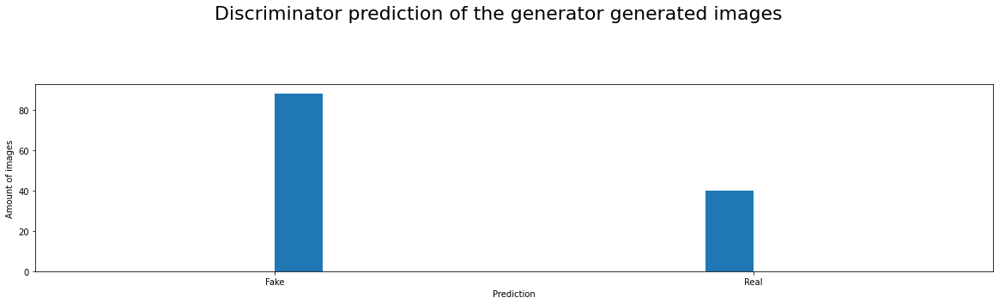

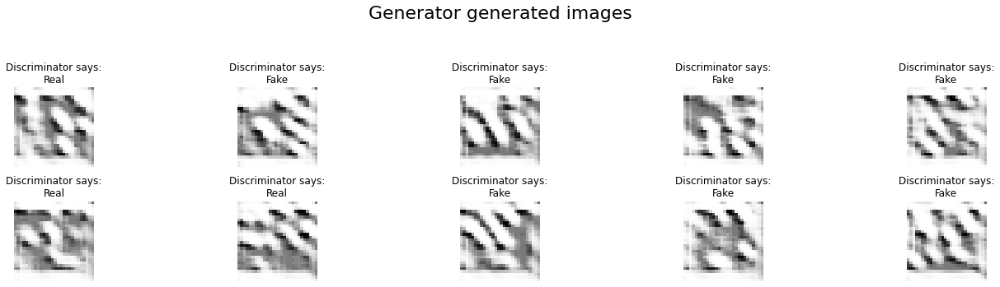

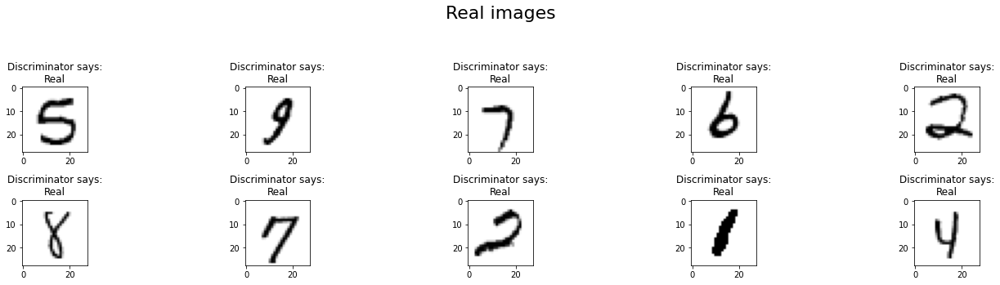

------------------------------------------------------------------------------------------------------------------------

Epoch:  1     | Batch: 400
Discriminator | Loss: 0.0826314 | Accuracy: 0.996094
Generator     | Loss: 4.64318 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



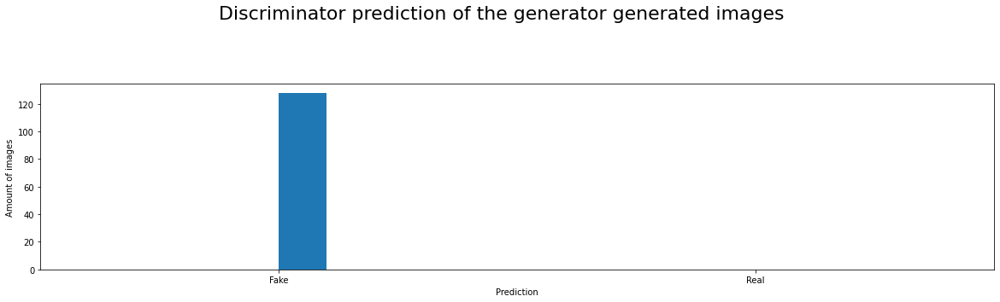

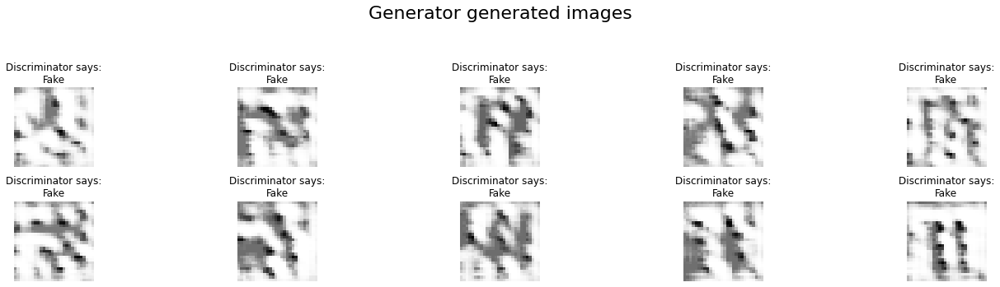

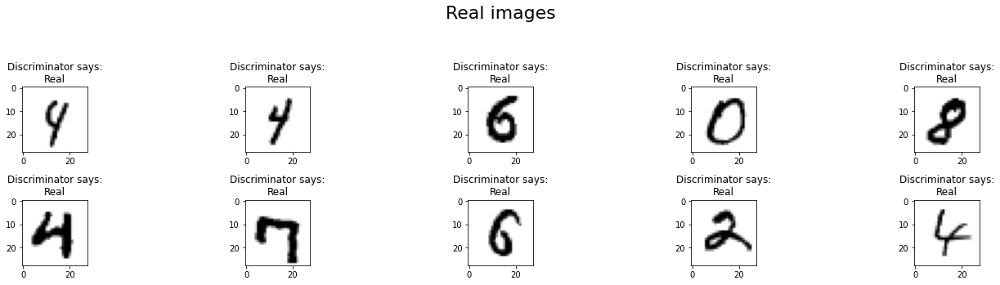

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  2     | Batch:   0
Discriminator | Loss: 0.0236599 | Accuracy: 0.996094
Generator     | Loss: 4.37415 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



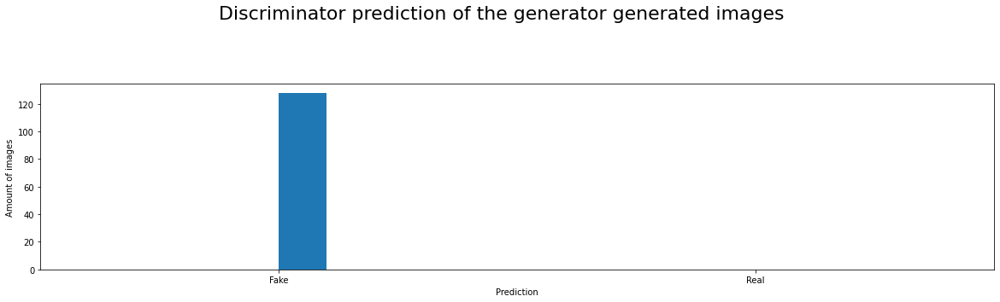

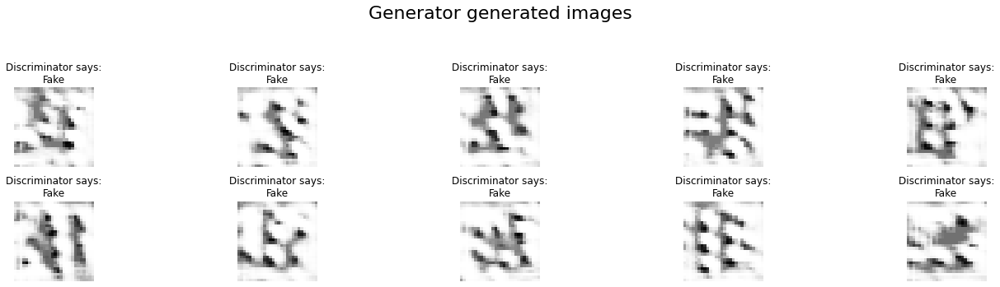

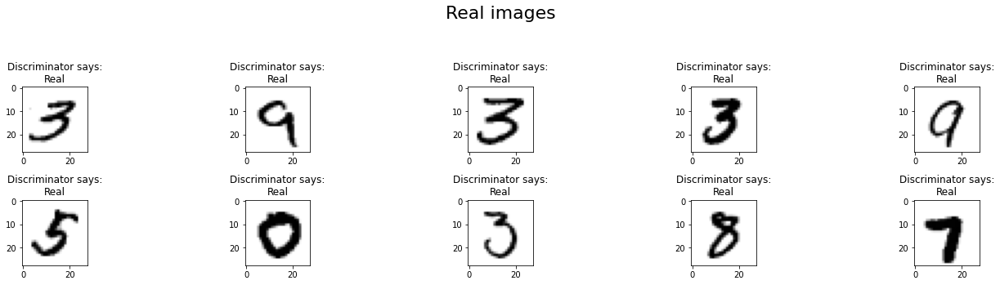

------------------------------------------------------------------------------------------------------------------------

Epoch:  2     | Batch: 200
Discriminator | Loss: 0.237741 | Accuracy: 0.890625
Generator     | Loss: 7.4654 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       128
         1.0       1.00      0.98      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



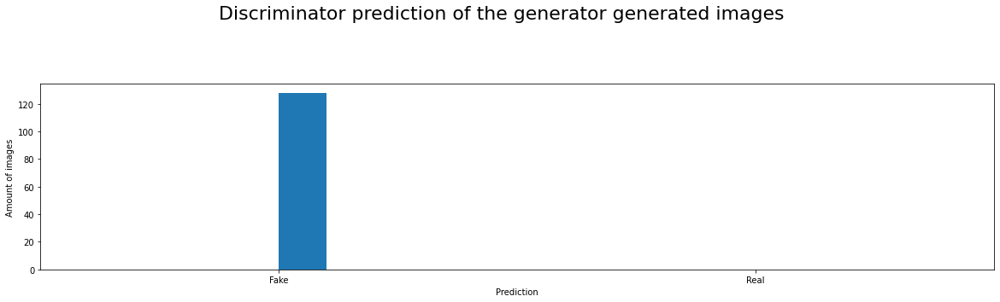

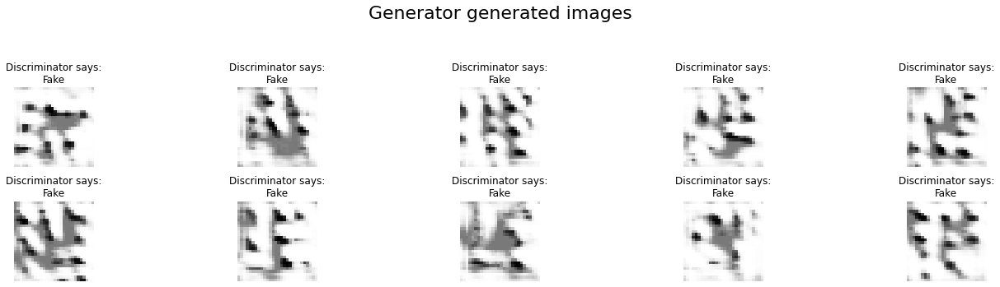

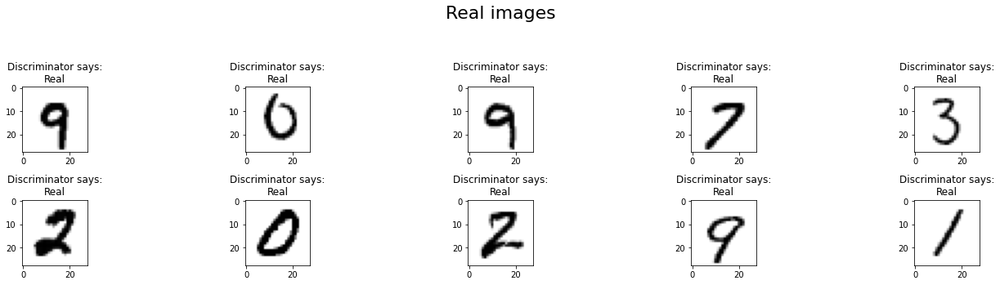

------------------------------------------------------------------------------------------------------------------------

Epoch:  2     | Batch: 400
Discriminator | Loss: 0.0430649 | Accuracy: 0.976562
Generator     | Loss: 5.12908 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.77      0.87       128
         1.0       0.81      1.00      0.90       128

    accuracy                           0.88       256
   macro avg       0.91      0.88      0.88       256
weighted avg       0.91      0.88      0.88       256



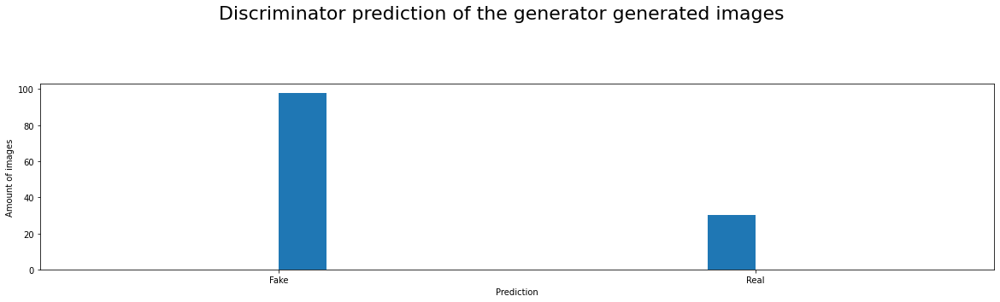

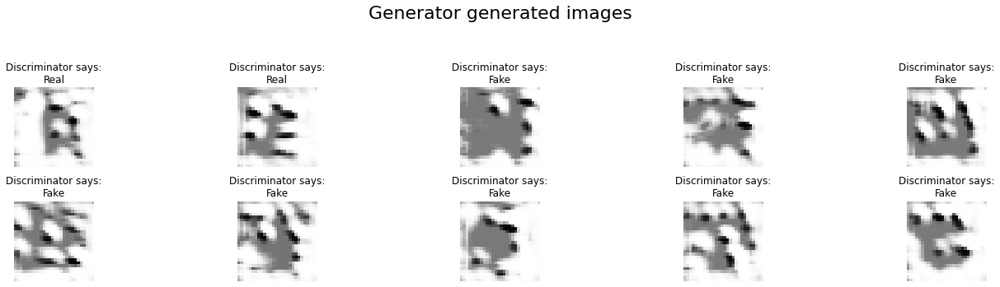

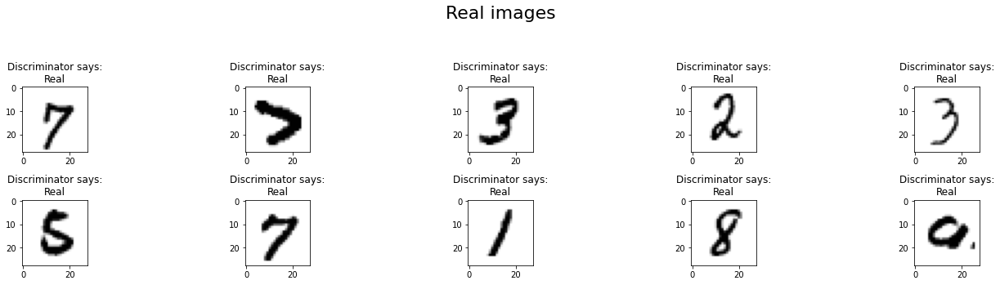

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  3     | Batch:   0
Discriminator | Loss: 0.109977 | Accuracy: 0.964844
Generator     | Loss: 5.59288 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98       128
         1.0       0.99      0.98      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



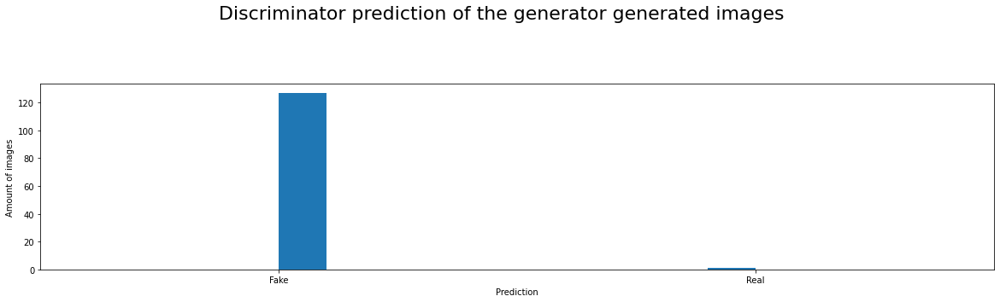

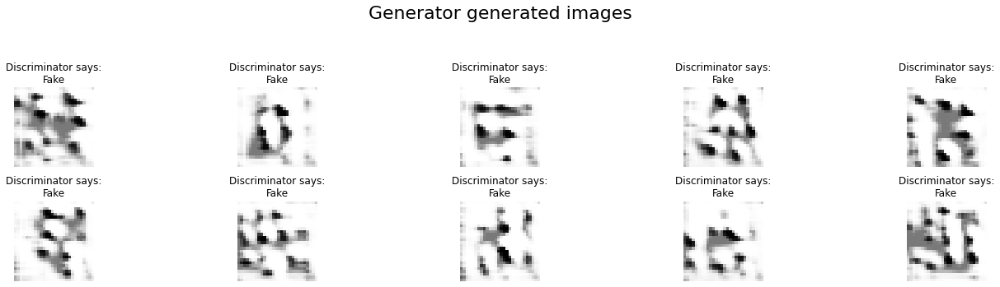

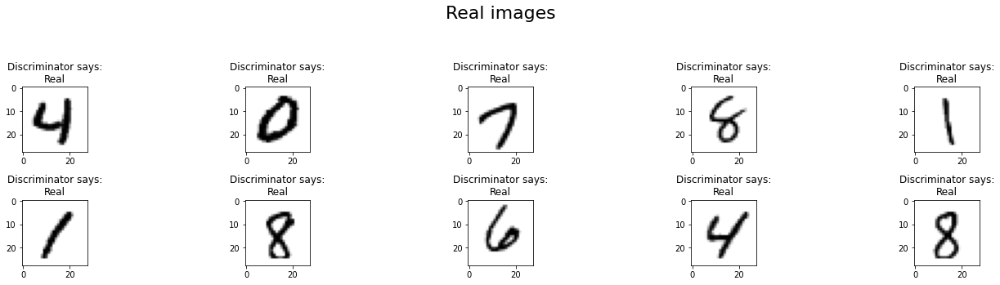

------------------------------------------------------------------------------------------------------------------------

Epoch:  3     | Batch: 200
Discriminator | Loss: 0.0135949 | Accuracy: 0.992188
Generator     | Loss: 7.28304 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.98       128
         1.0       0.96      1.00      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



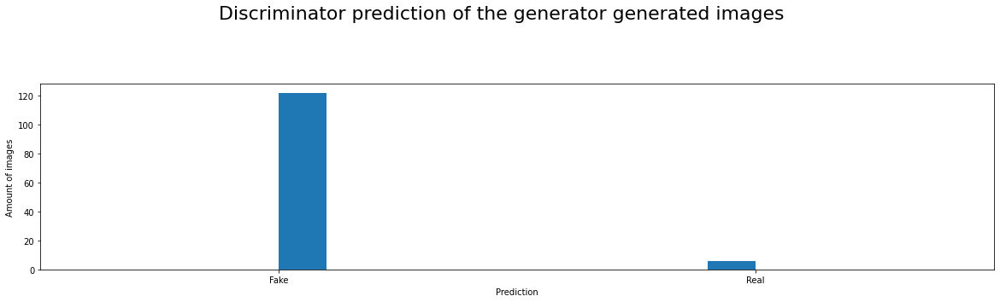

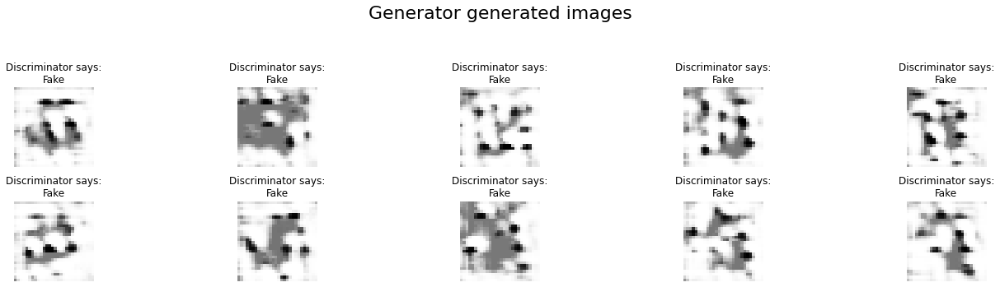

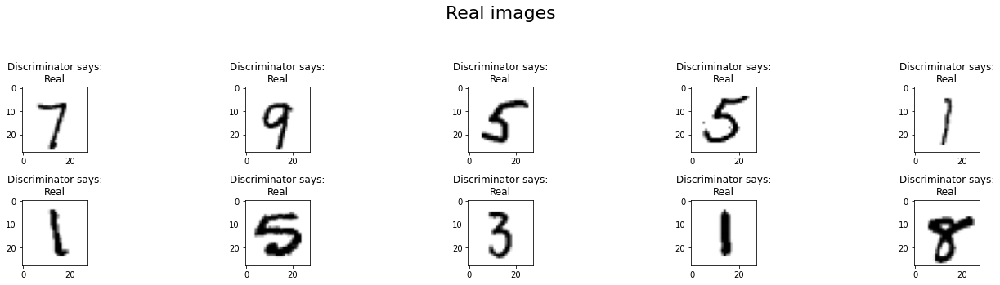

------------------------------------------------------------------------------------------------------------------------

Epoch:  3     | Batch: 400
Discriminator | Loss: 0.105692 | Accuracy: 0.96875
Generator     | Loss: 5.22877 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99       128
         1.0       0.98      0.99      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



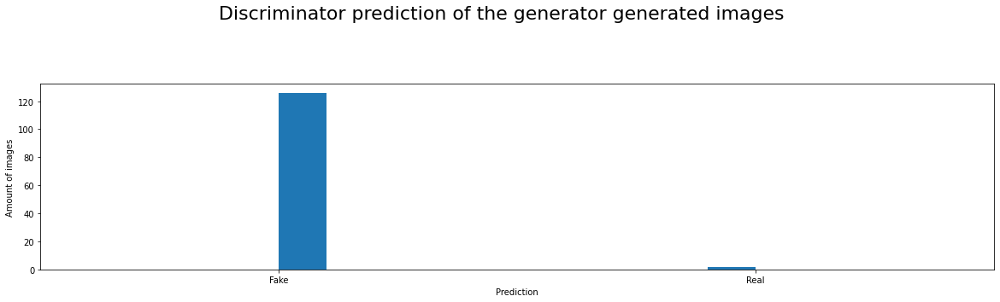

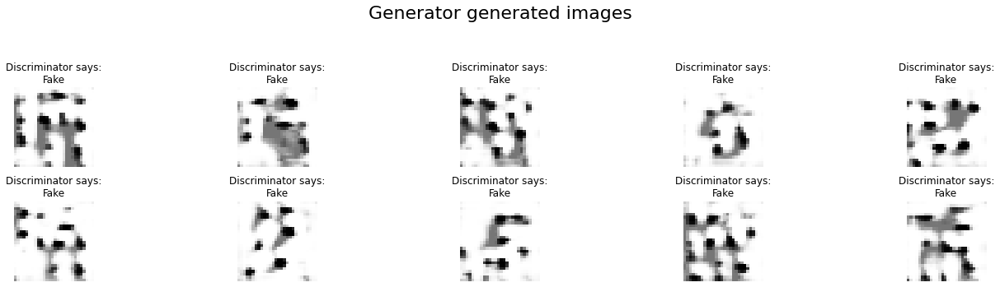

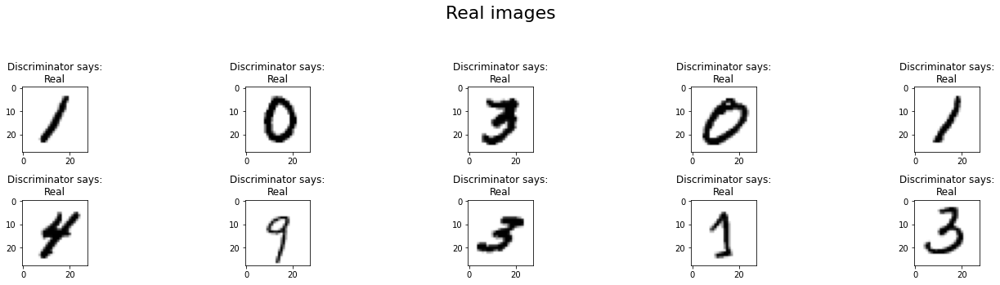

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  4     | Batch:   0
Discriminator | Loss: 0.0732757 | Accuracy: 0.976562
Generator     | Loss: 5.46663 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00       128
         1.0       0.99      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



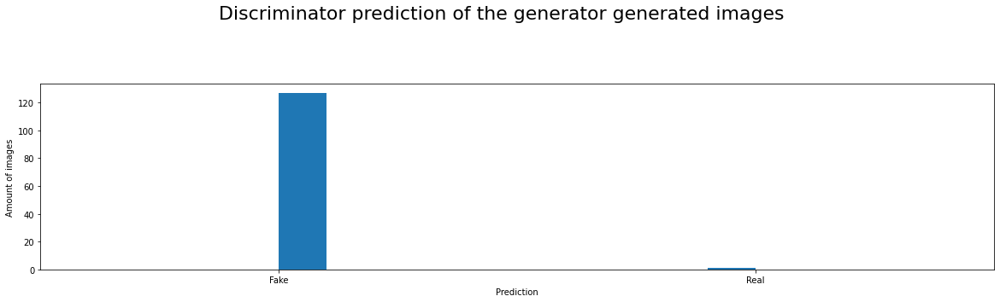

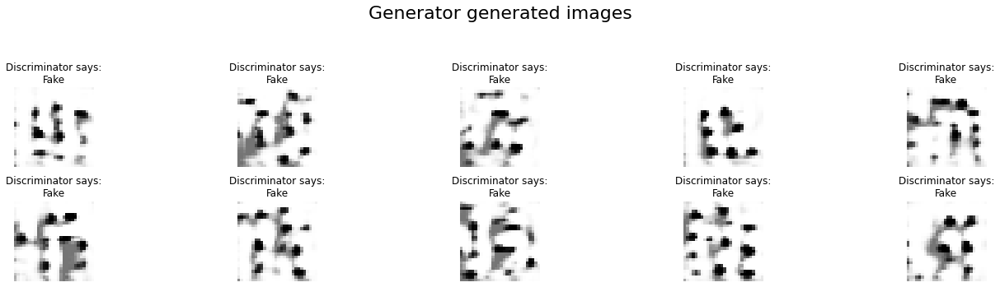

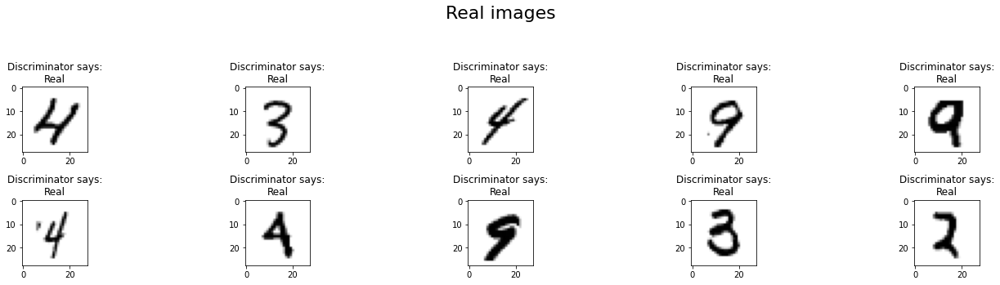

------------------------------------------------------------------------------------------------------------------------

Epoch:  4     | Batch: 200
Discriminator | Loss: 0.159494 | Accuracy: 0.929688
Generator     | Loss: 6.08823 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



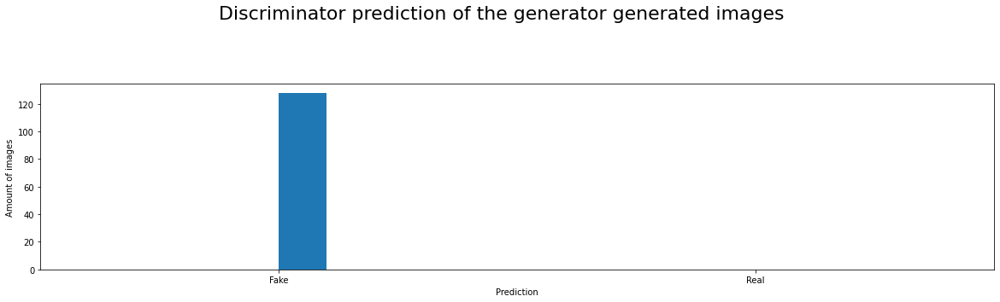

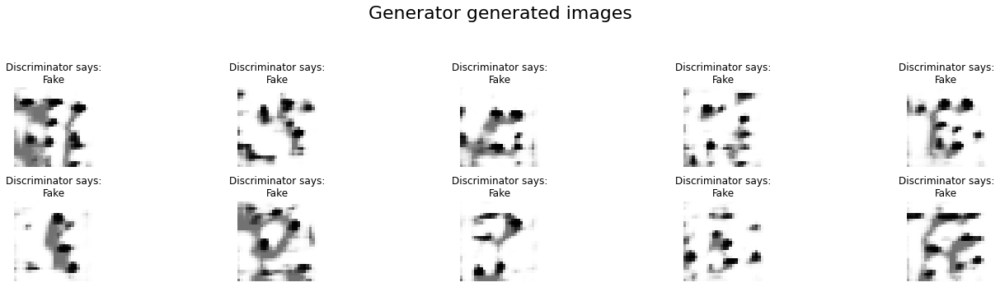

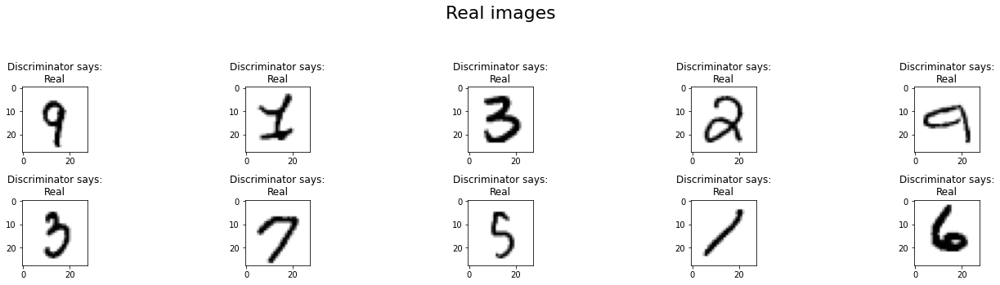

------------------------------------------------------------------------------------------------------------------------

Epoch:  4     | Batch: 400
Discriminator | Loss: 1.85209 | Accuracy: 0.542969
Generator     | Loss: 7.64803 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       128
         1.0       1.00      0.98      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



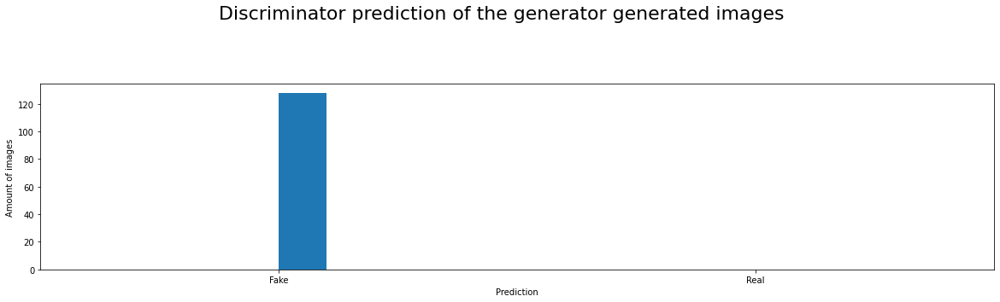

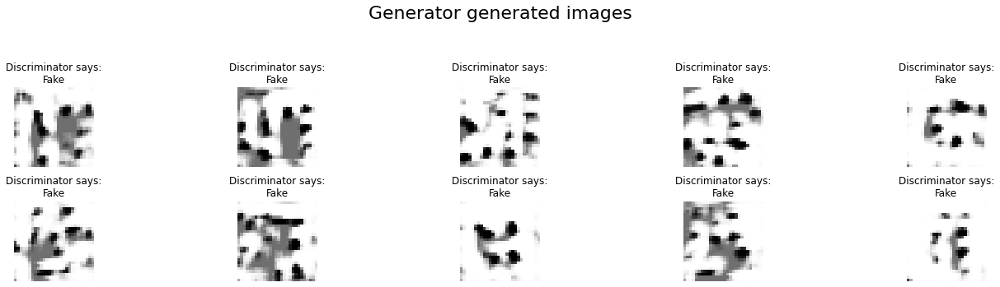

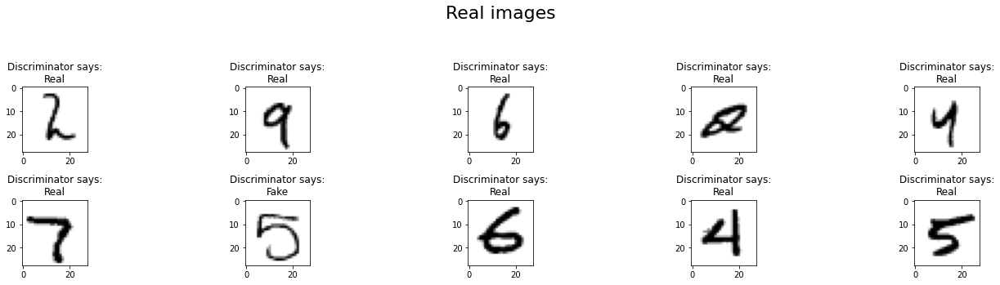

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  5     | Batch:   0
Discriminator | Loss: 0.343695 | Accuracy:  0.875
Generator     | Loss: 1.78273 | Accuracy: 0.257812
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.20      0.33       128
         1.0       0.55      1.00      0.71       128

    accuracy                           0.60       256
   macro avg       0.78      0.60      0.52       256
weighted avg       0.78      0.60      0.52       256



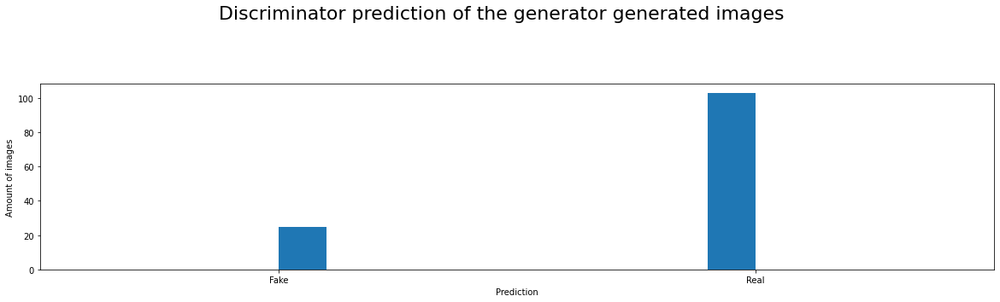

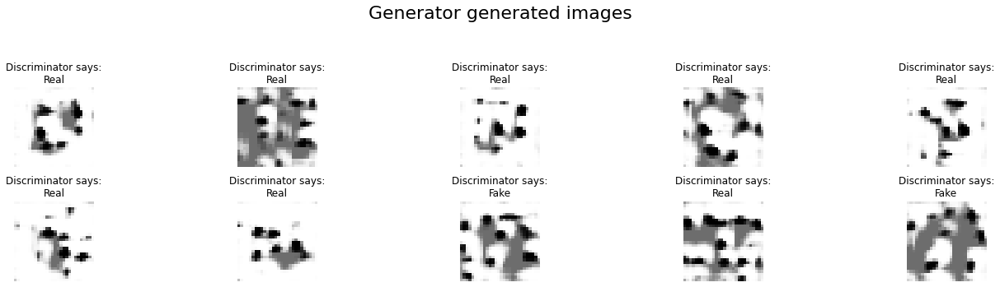

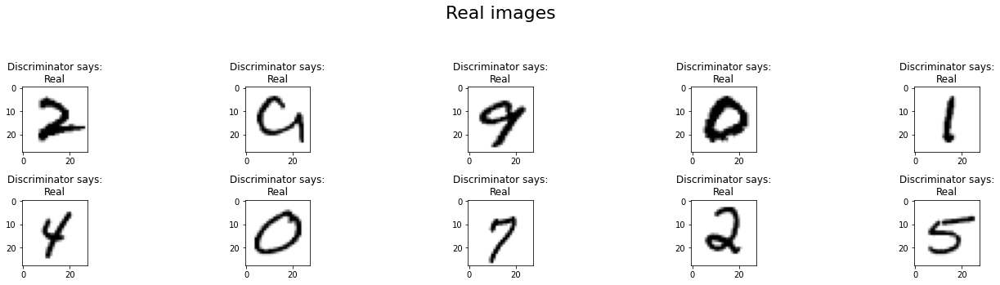

------------------------------------------------------------------------------------------------------------------------

Epoch:  5     | Batch: 200
Discriminator | Loss: 0.148668 | Accuracy: 0.945312
Generator     | Loss: 4.88007 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



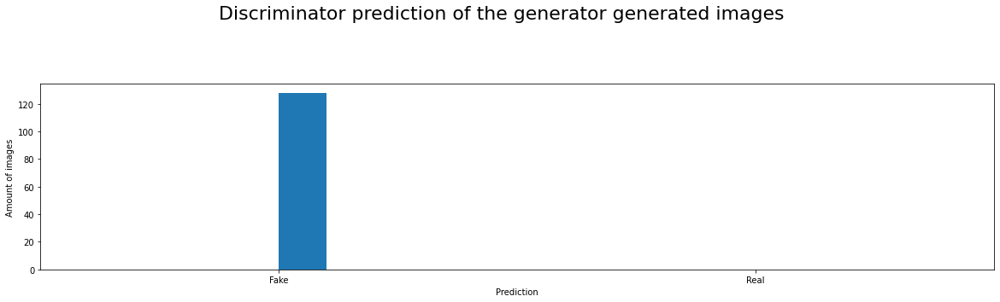

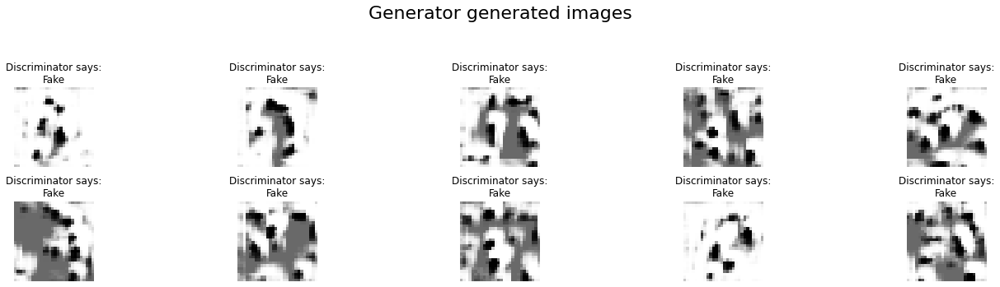

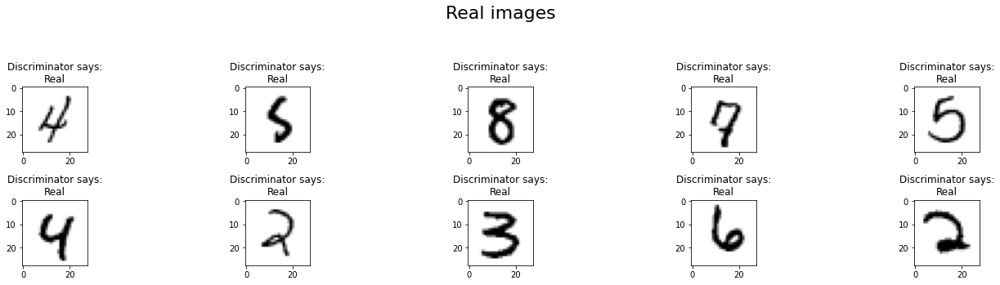

------------------------------------------------------------------------------------------------------------------------

Epoch:  5     | Batch: 400
Discriminator | Loss: 0.119284 | Accuracy: 0.957031
Generator     | Loss: 4.41068 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



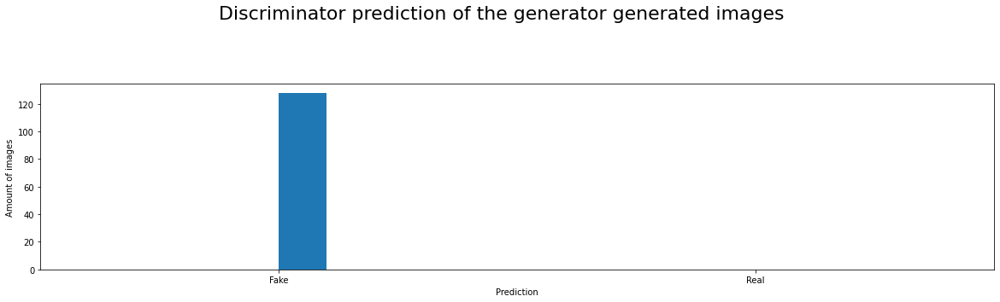

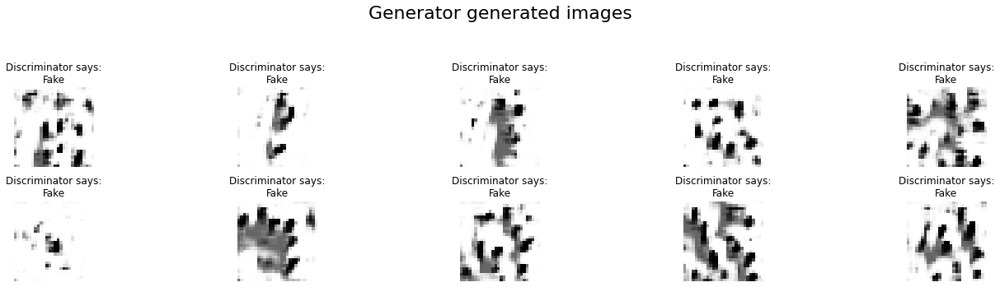

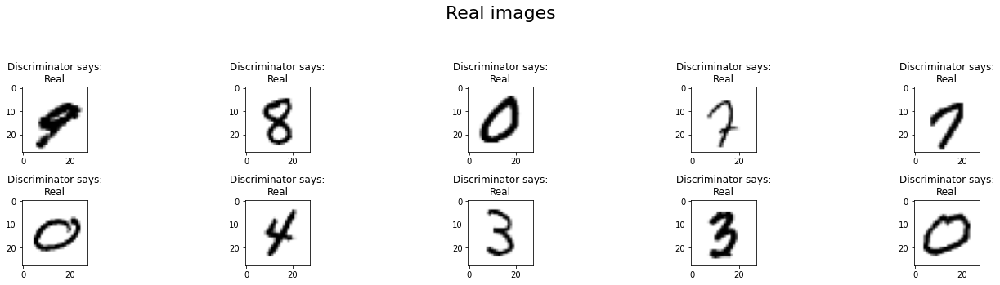

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  6     | Batch:   0
Discriminator | Loss: 0.111798 | Accuracy: 0.953125
Generator     | Loss: 5.53925 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       128
         1.0       0.99      0.99      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



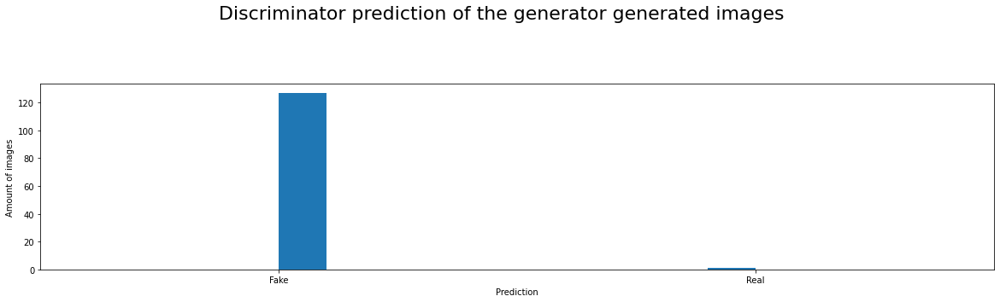

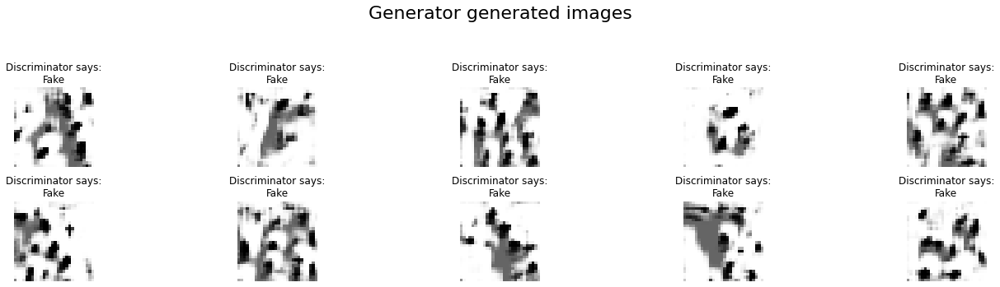

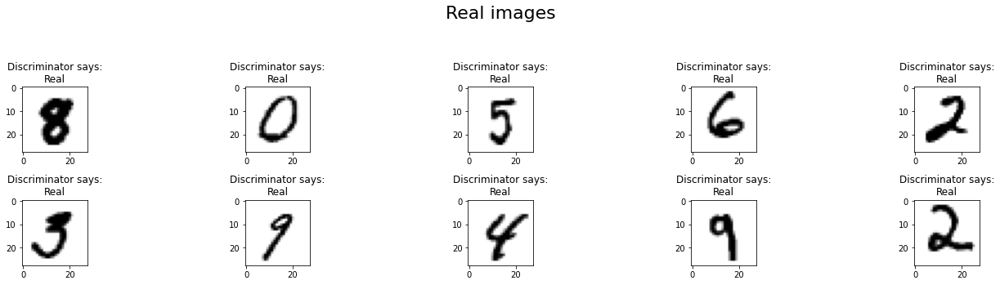

------------------------------------------------------------------------------------------------------------------------

Epoch:  6     | Batch: 200
Discriminator | Loss: 0.143604 | Accuracy: 0.933594
Generator     | Loss: 4.8062 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99       128
         1.0       0.98      0.99      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



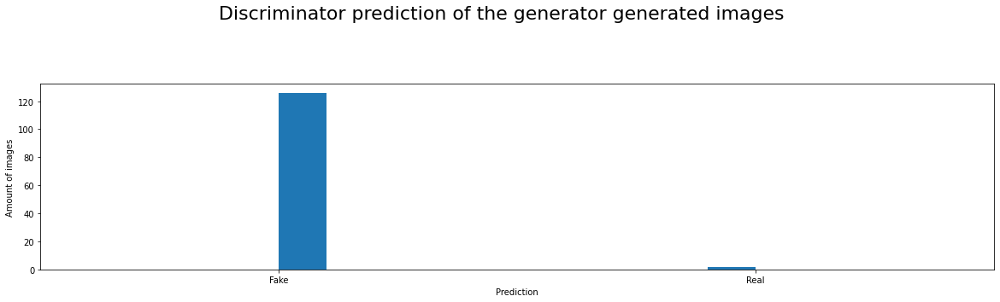

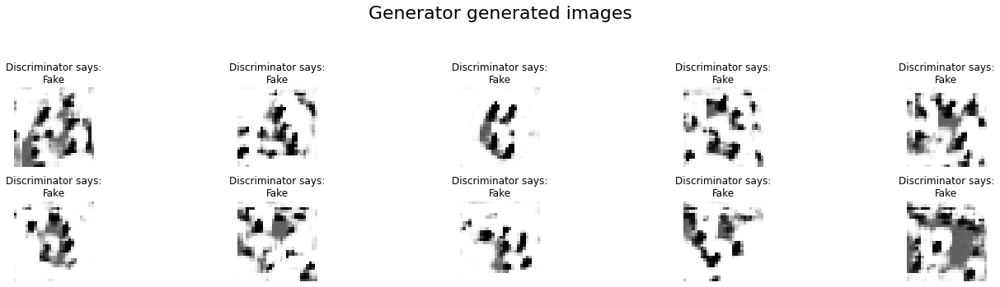

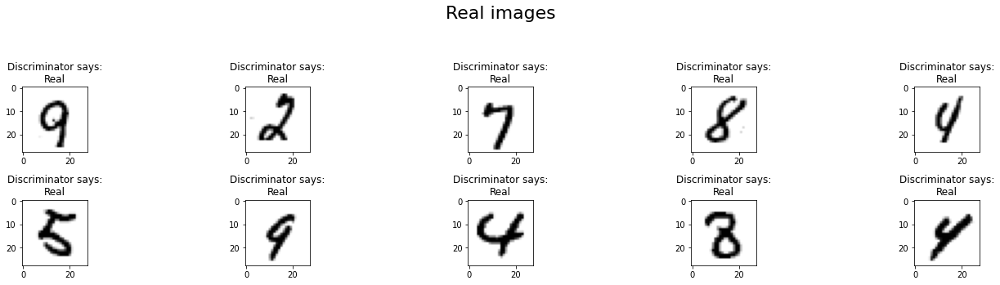

------------------------------------------------------------------------------------------------------------------------

Epoch:  6     | Batch: 400
Discriminator | Loss: 0.122221 | Accuracy: 0.953125
Generator     | Loss: 4.37235 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       128
         1.0       1.00      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



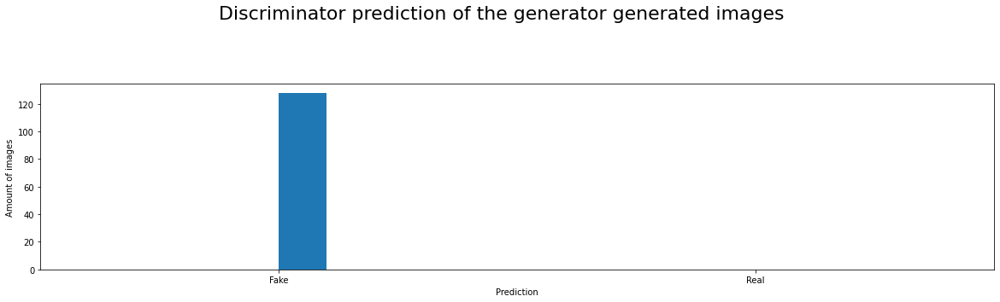

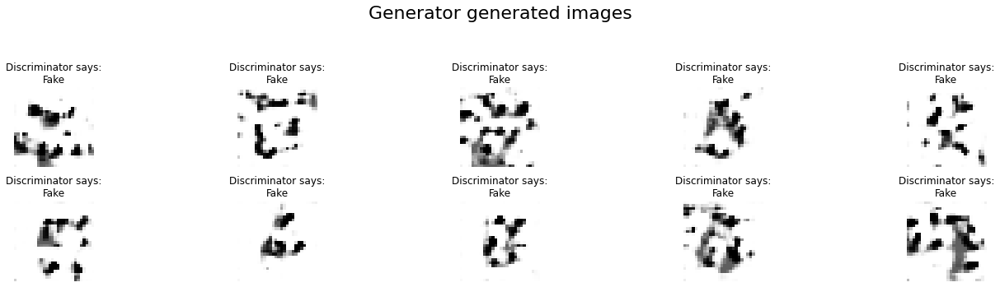

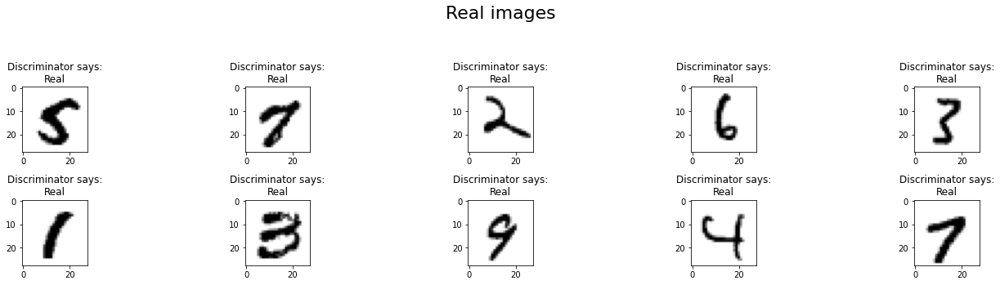

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  7     | Batch:   0
Discriminator | Loss: 0.67436 | Accuracy: 0.703125
Generator     | Loss: 6.90167 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       128
         1.0       1.00      0.95      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



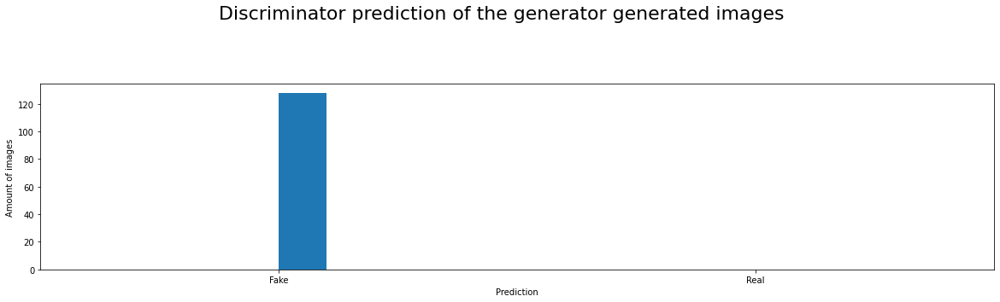

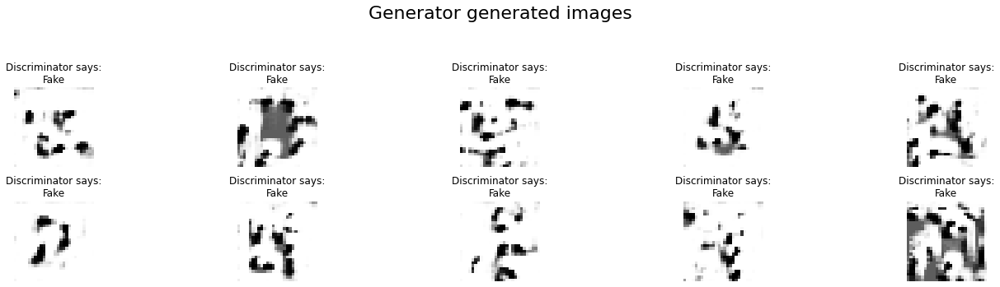

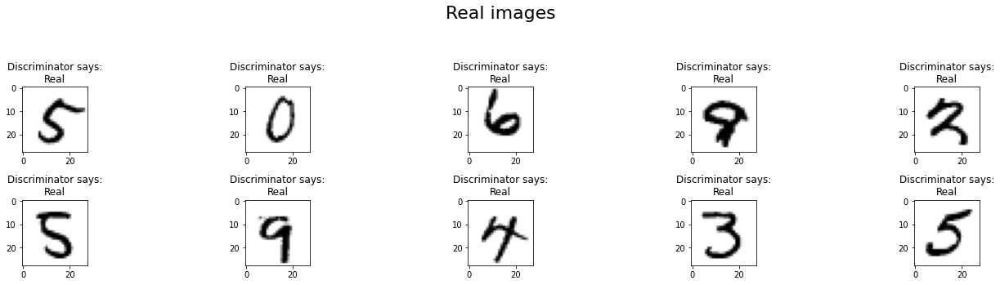

------------------------------------------------------------------------------------------------------------------------

Epoch:  7     | Batch: 200
Discriminator | Loss: 0.166508 | Accuracy: 0.949219
Generator     | Loss: 4.67297 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00       128
         1.0       1.00      0.99      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



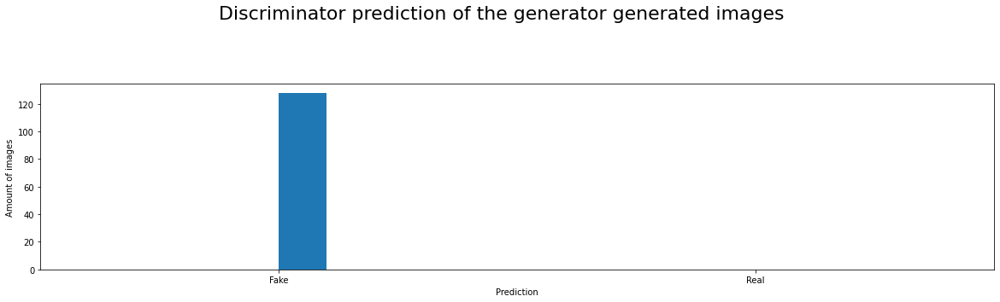

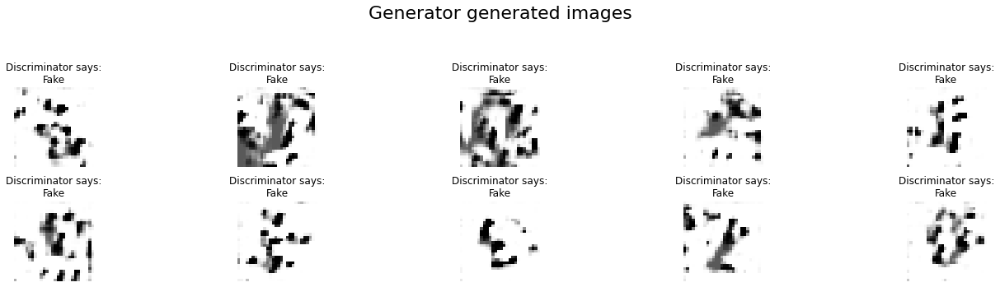

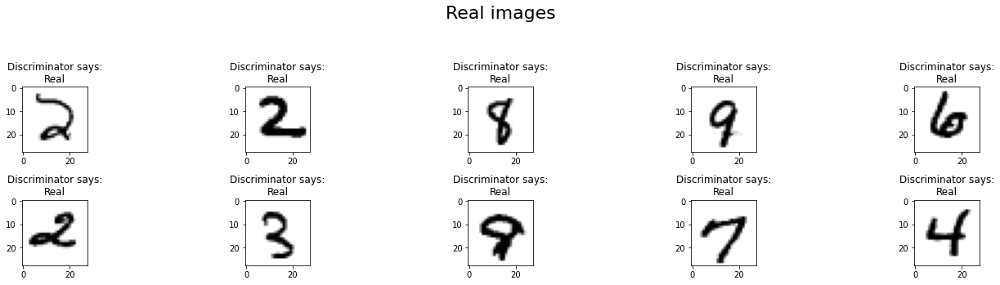

------------------------------------------------------------------------------------------------------------------------

Epoch:  7     | Batch: 400
Discriminator | Loss: 0.160762 | Accuracy: 0.929688
Generator     | Loss: 4.92719 | Accuracy: 0.046875
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00       128
         1.0       0.99      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



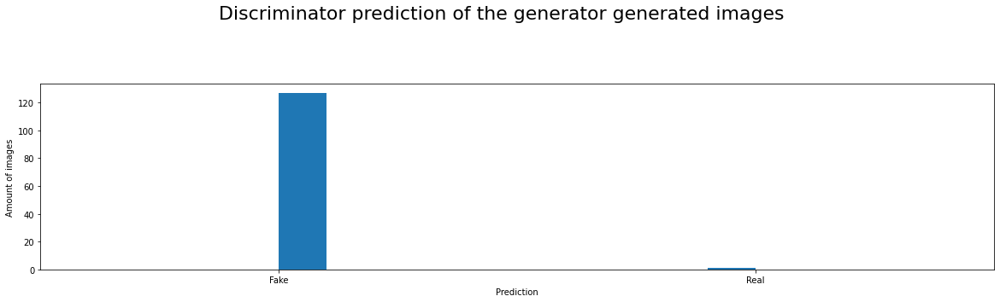

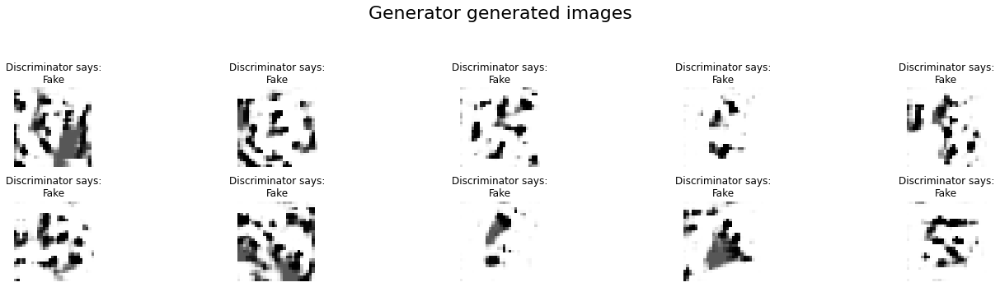

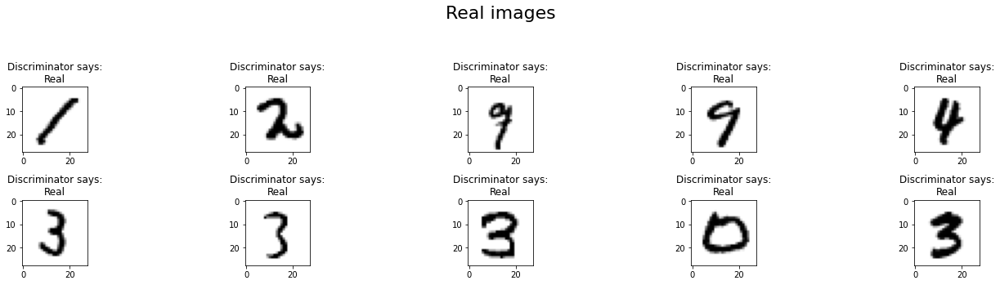

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  8     | Batch:   0
Discriminator | Loss: 0.125036 | Accuracy: 0.945312
Generator     | Loss: 3.1162 | Accuracy: 0.09375
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.84      0.91       128
         1.0       0.86      1.00      0.92       128

    accuracy                           0.92       256
   macro avg       0.93      0.92      0.92       256
weighted avg       0.93      0.92      0.92       256



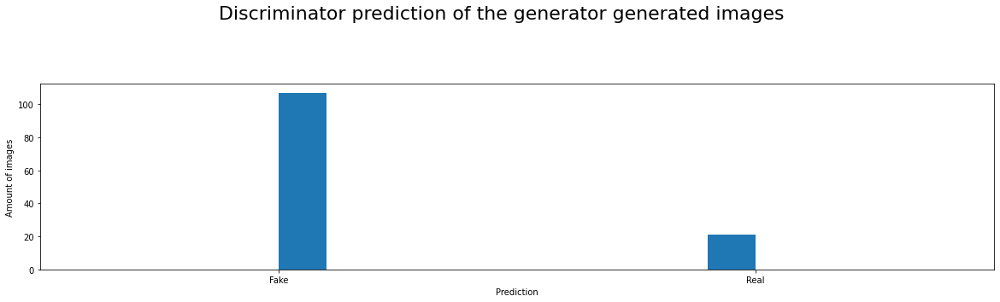

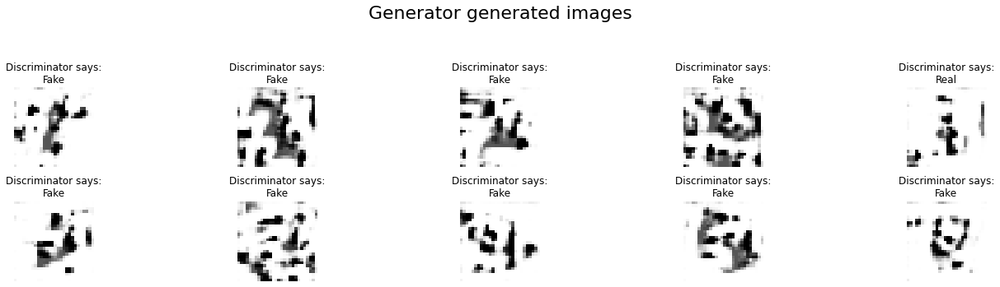

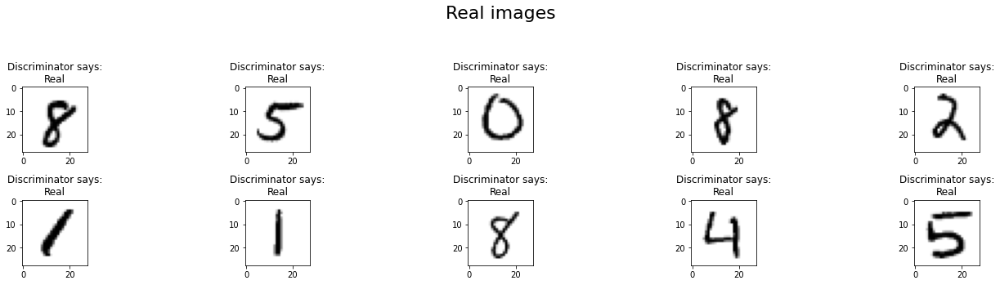

------------------------------------------------------------------------------------------------------------------------

Epoch:  8     | Batch: 200
Discriminator | Loss: 0.146813 | Accuracy: 0.9375
Generator     | Loss: 4.19592 | Accuracy: 0.0390625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00       128
         1.0       1.00      0.99      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



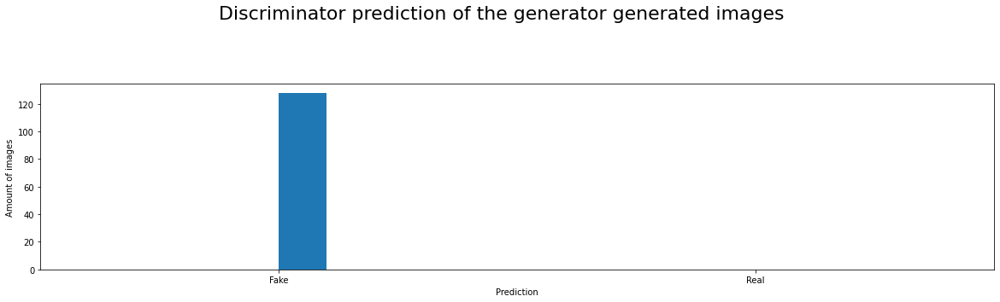

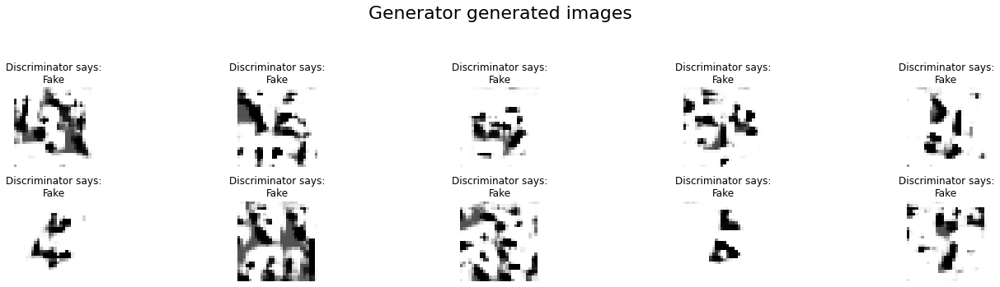

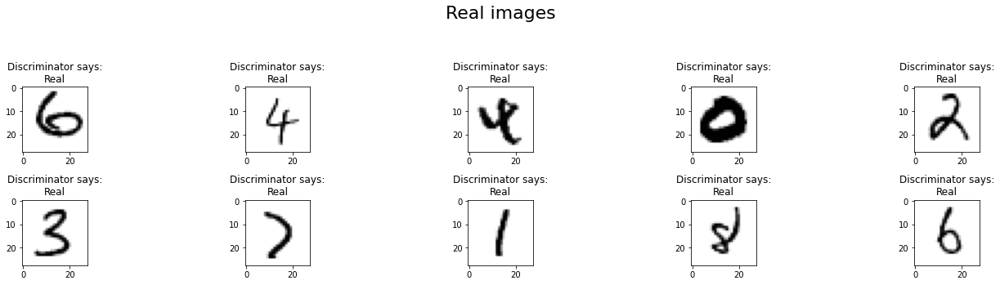

------------------------------------------------------------------------------------------------------------------------

Epoch:  8     | Batch: 400
Discriminator | Loss: 0.222275 | Accuracy: 0.910156
Generator     | Loss: 3.30618 | Accuracy: 0.0625
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97       128
         1.0       0.94      1.00      0.97       128

    accuracy                           0.97       256
   macro avg       0.97      0.97      0.97       256
weighted avg       0.97      0.97      0.97       256



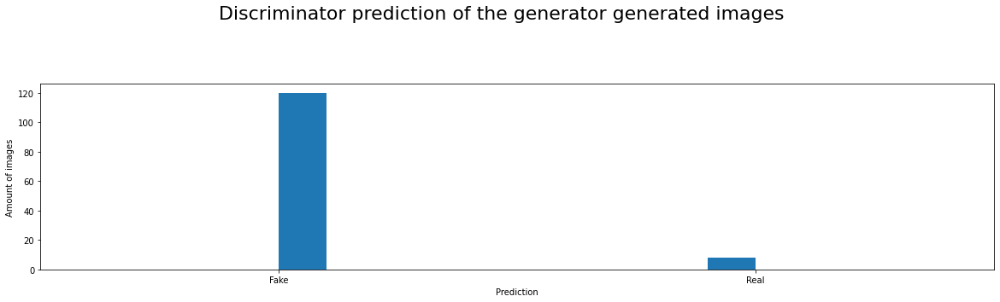

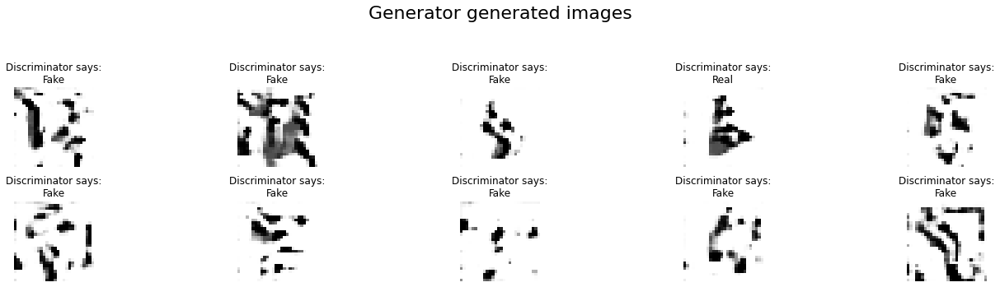

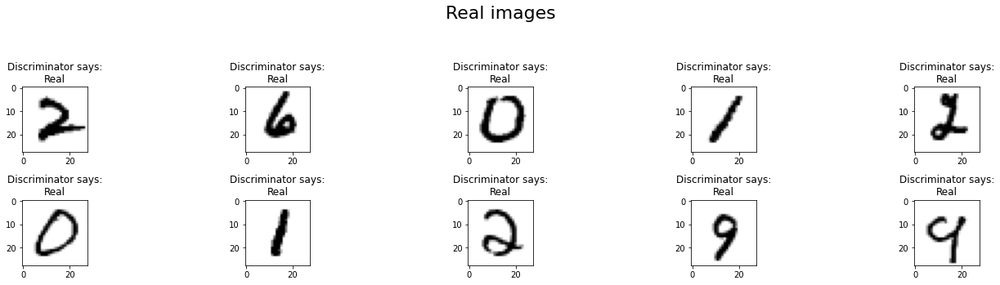

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch:  9     | Batch:   0
Discriminator | Loss: 0.137251 | Accuracy: 0.945312
Generator     | Loss: 5.10971 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       128
         1.0       0.99      0.99      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



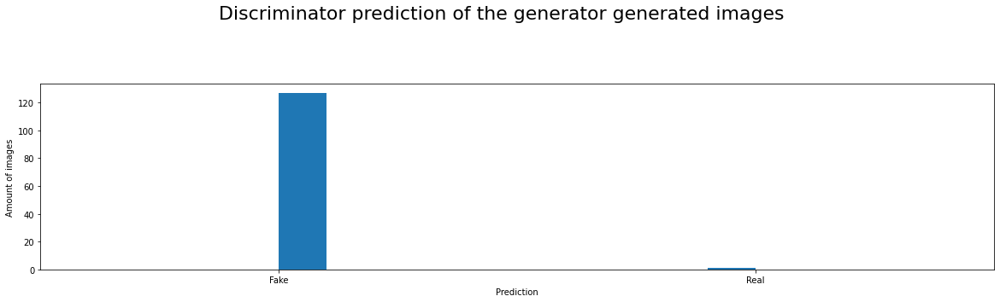

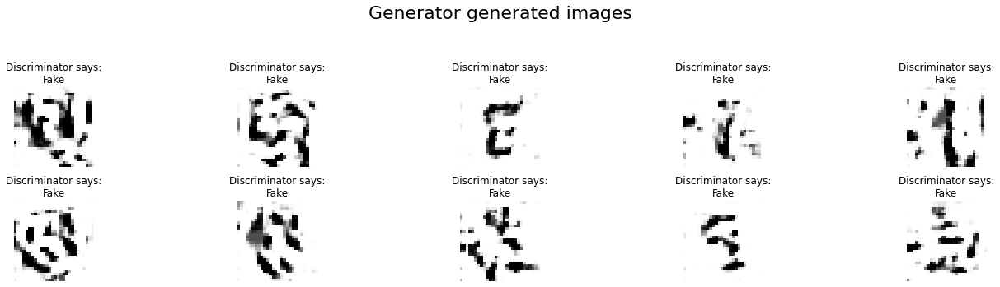

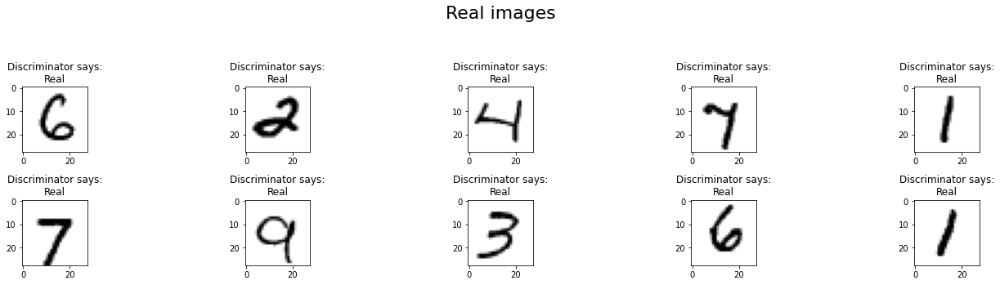

------------------------------------------------------------------------------------------------------------------------

Epoch:  9     | Batch: 200
Discriminator | Loss: 0.142929 | Accuracy: 0.957031
Generator     | Loss: 3.79182 | Accuracy: 0.078125
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98       128
         1.0       0.96      1.00      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



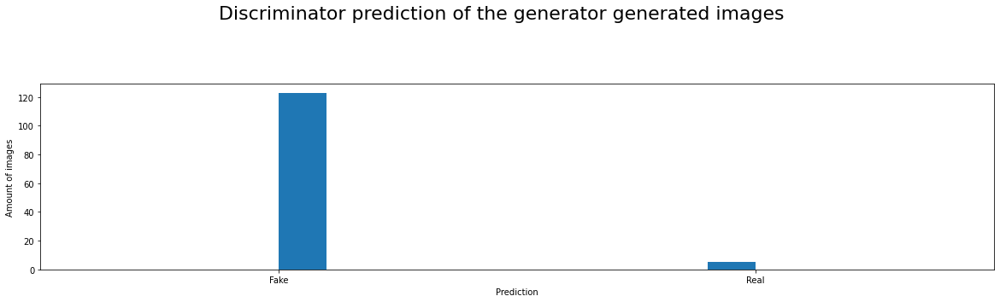

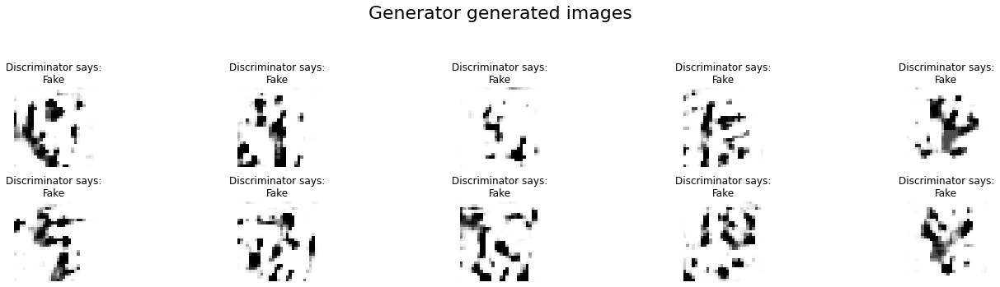

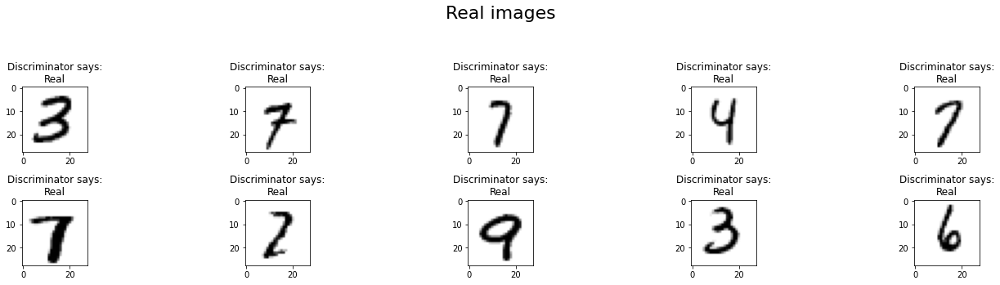

------------------------------------------------------------------------------------------------------------------------

Epoch:  9     | Batch: 400
Discriminator | Loss: 0.188441 | Accuracy: 0.917969
Generator     | Loss: 4.98263 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00       128
         1.0       1.00      0.99      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



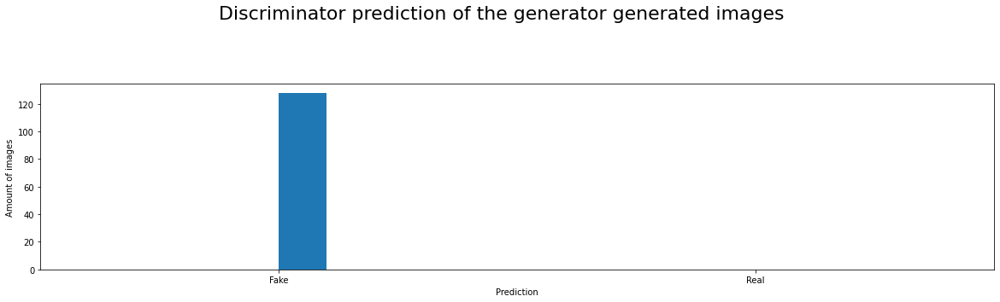

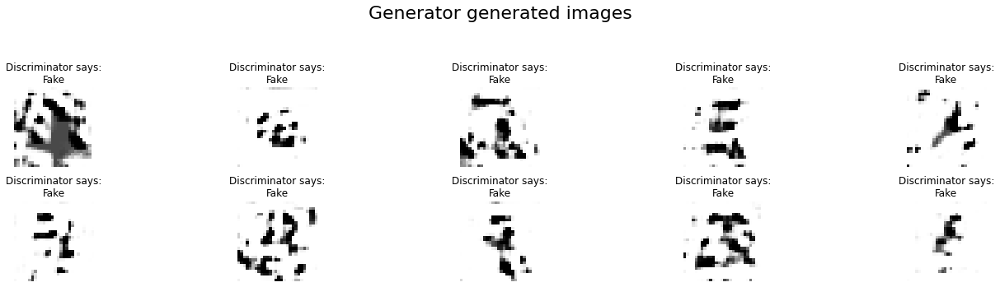

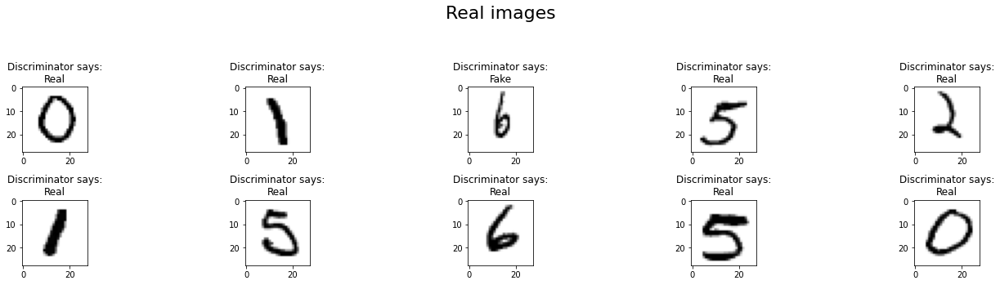

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 10     | Batch:   0
Discriminator | Loss: 0.173438 | Accuracy: 0.941406
Generator     | Loss: 5.32478 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       128
         1.0       0.99      0.99      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



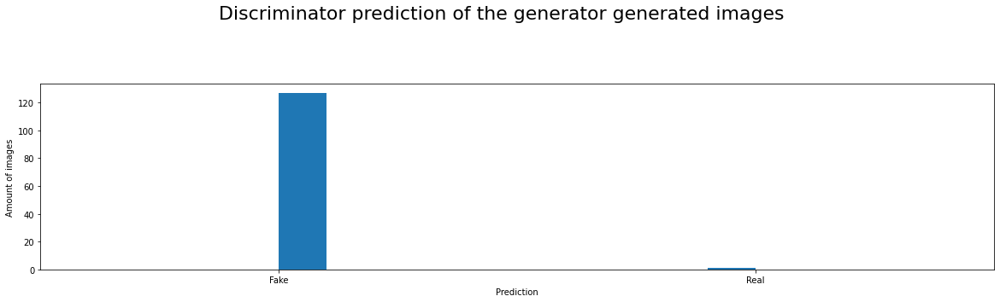

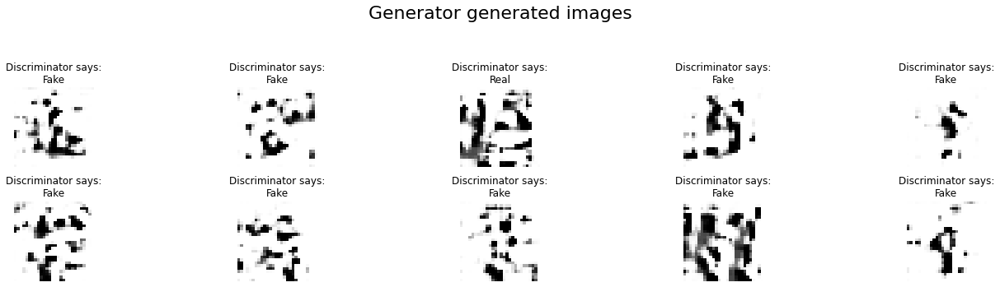

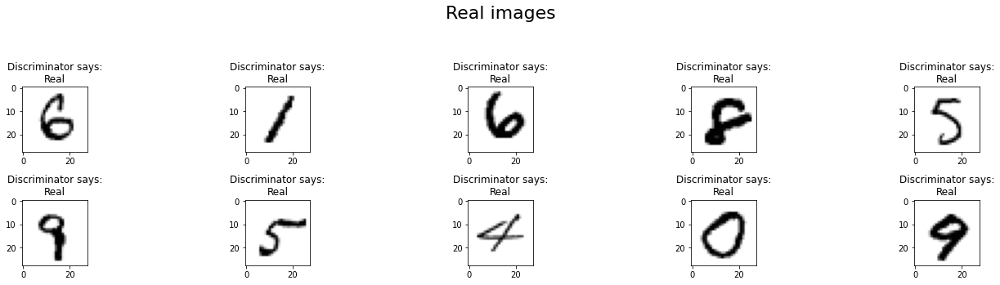

------------------------------------------------------------------------------------------------------------------------

Epoch: 10     | Batch: 200
Discriminator | Loss: 0.173485 | Accuracy: 0.914062
Generator     | Loss: 6.06616 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00       128
         1.0       1.00      0.99      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



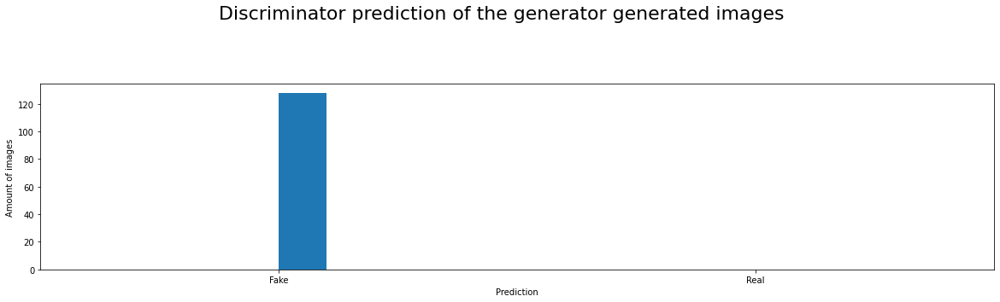

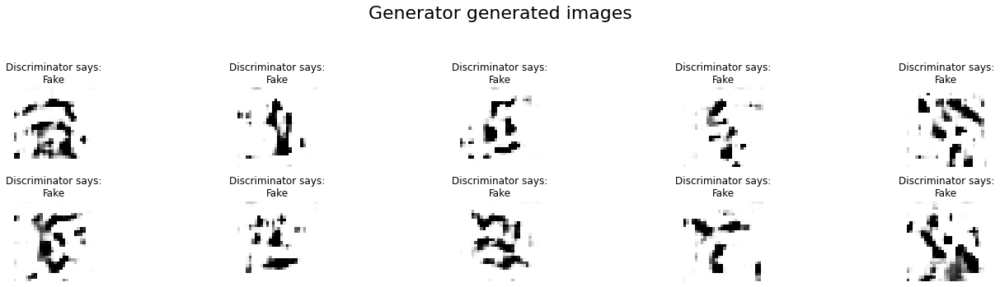

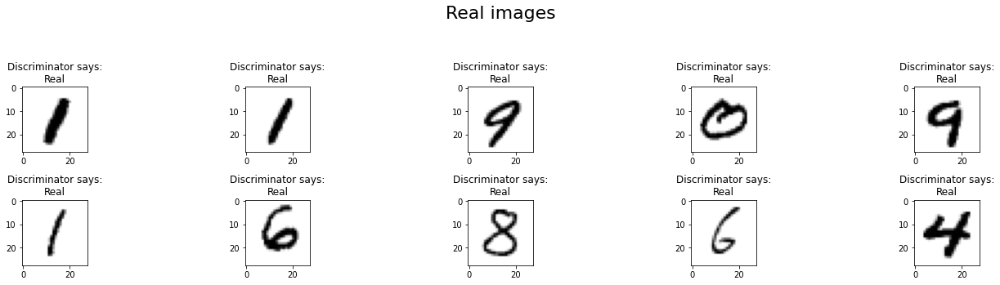

------------------------------------------------------------------------------------------------------------------------

Epoch: 10     | Batch: 400
Discriminator | Loss: 0.292596 | Accuracy: 0.886719
Generator     | Loss: 7.04204 | Accuracy:    0.0
Metrics
              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97       128
         1.0       1.00      0.95      0.97       128

    accuracy                           0.97       256
   macro avg       0.97      0.97      0.97       256
weighted avg       0.97      0.97      0.97       256



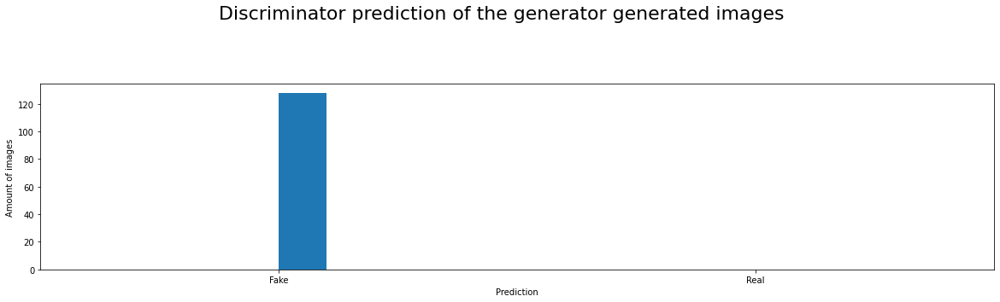

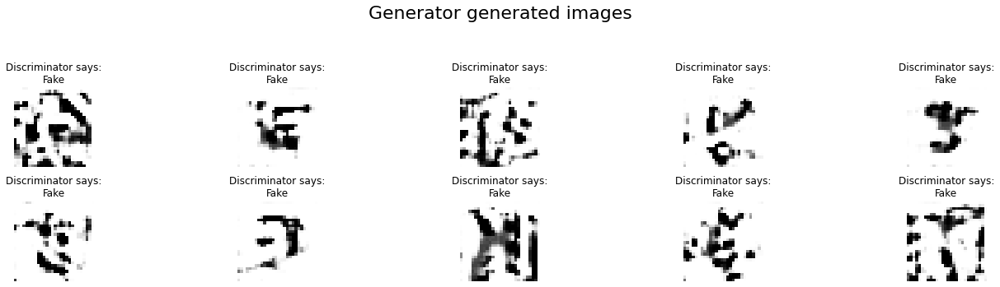

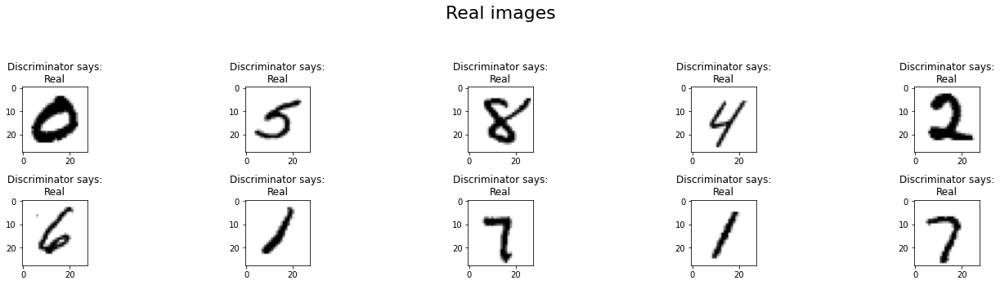

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 11     | Batch:   0
Discriminator | Loss: 0.169505 | Accuracy: 0.945312
Generator     | Loss: 5.90731 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       128
         1.0       0.99      0.97      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



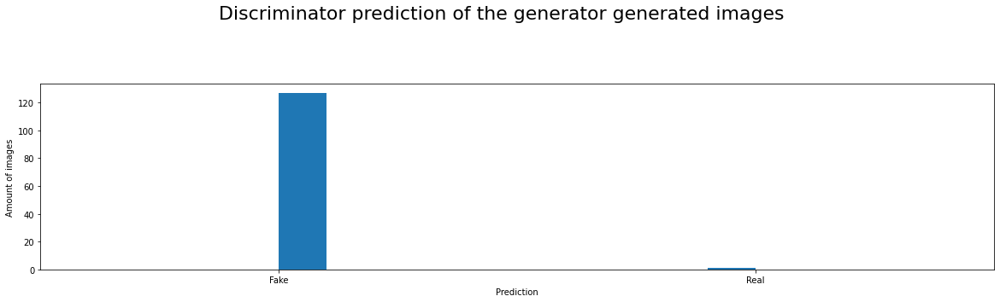

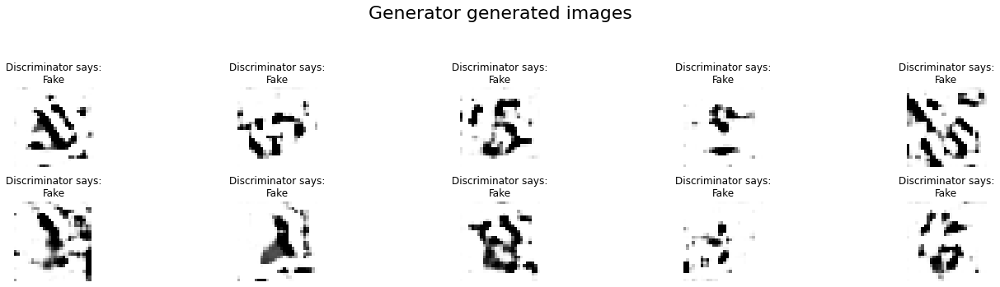

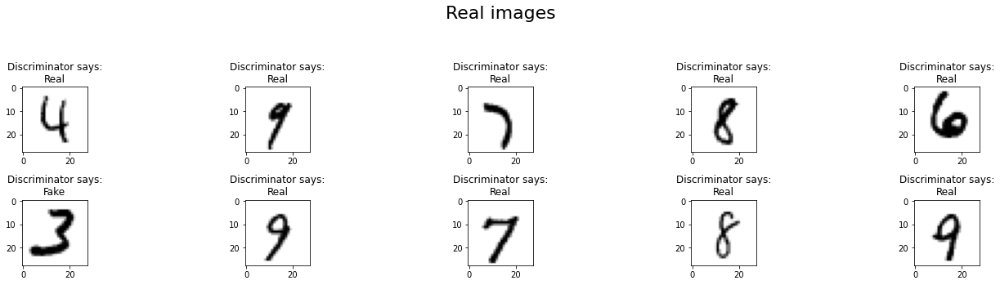

------------------------------------------------------------------------------------------------------------------------

Epoch: 11     | Batch: 200
Discriminator | Loss: 0.161617 | Accuracy: 0.941406
Generator     | Loss: 4.71116 | Accuracy: 0.046875
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00       128
         1.0       0.99      1.00      1.00       128

    accuracy                           1.00       256
   macro avg       1.00      1.00      1.00       256
weighted avg       1.00      1.00      1.00       256



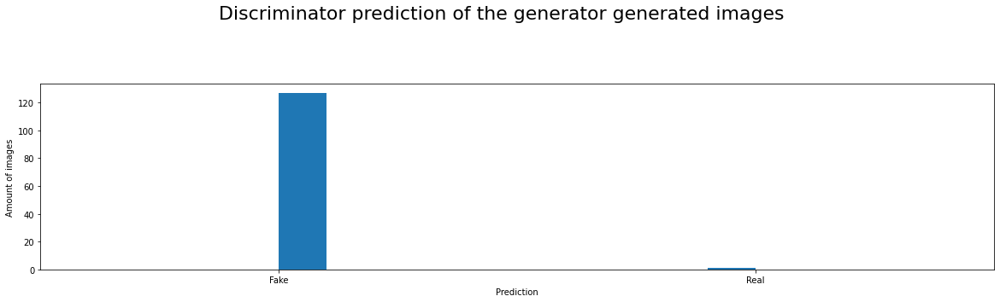

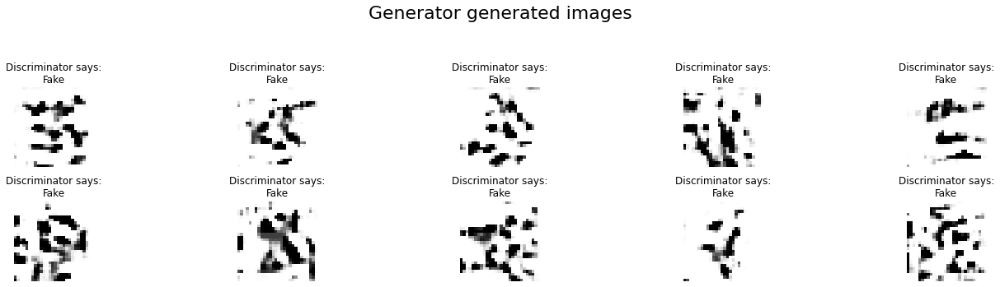

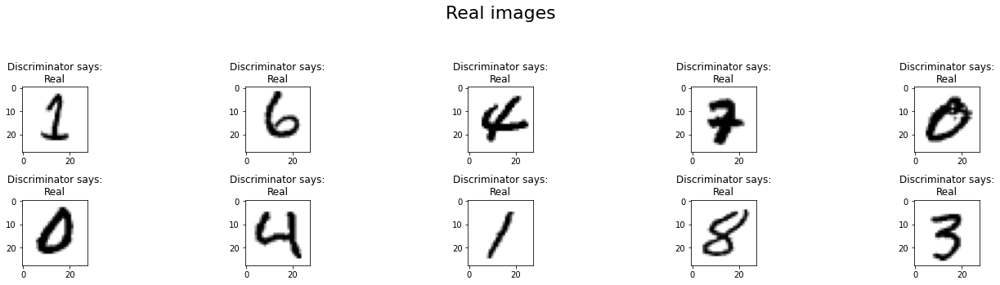

------------------------------------------------------------------------------------------------------------------------

Epoch: 11     | Batch: 400
Discriminator | Loss: 0.228128 | Accuracy: 0.898438
Generator     | Loss: 5.00566 | Accuracy: 0.0390625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98       128
         1.0       0.97      0.99      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



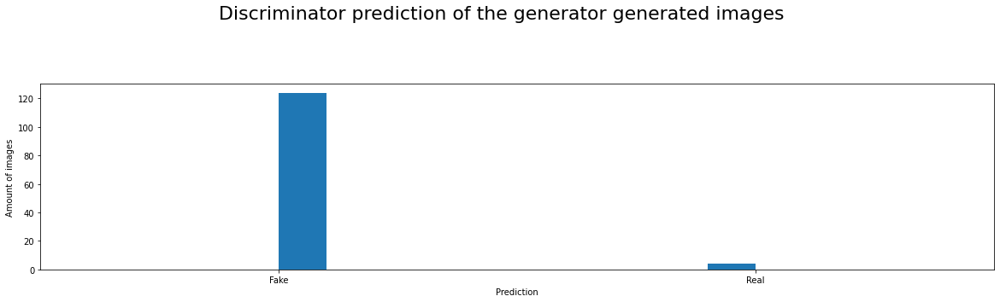

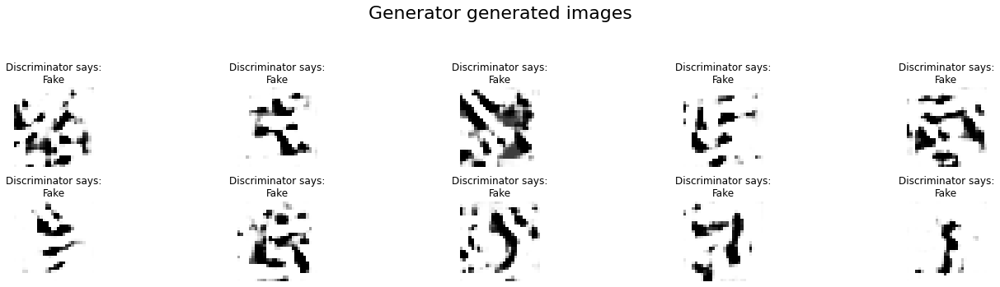

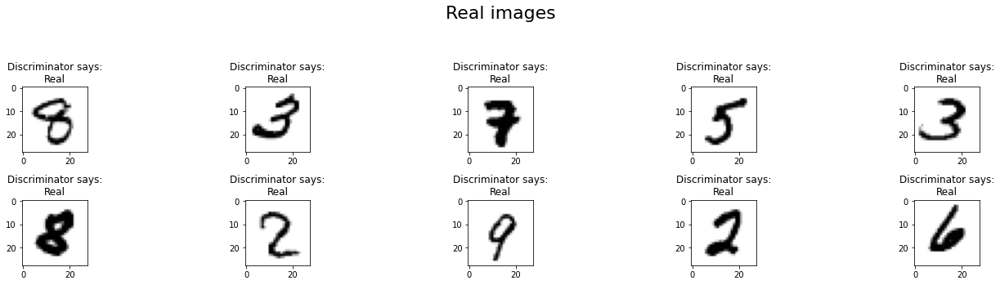

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 12     | Batch:   0
Discriminator | Loss: 0.151099 | Accuracy: 0.929688
Generator     | Loss: 5.13362 | Accuracy: 0.03125
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98       128
         1.0       0.96      1.00      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



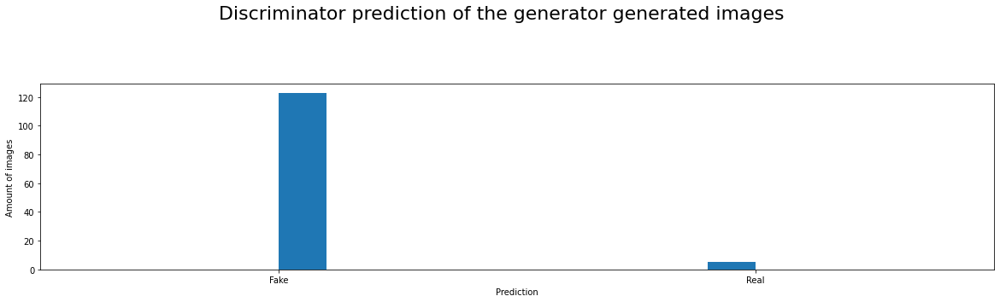

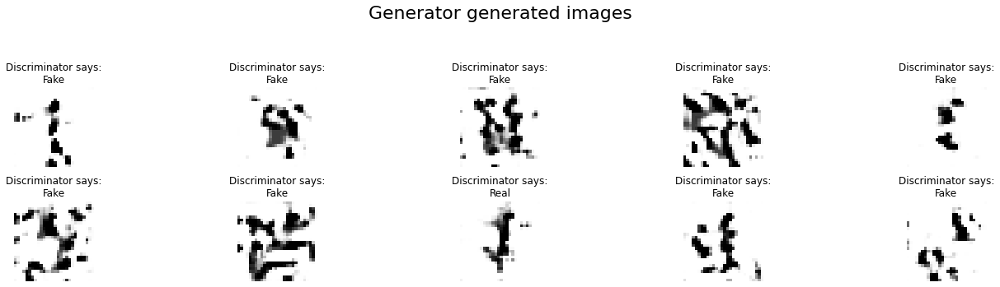

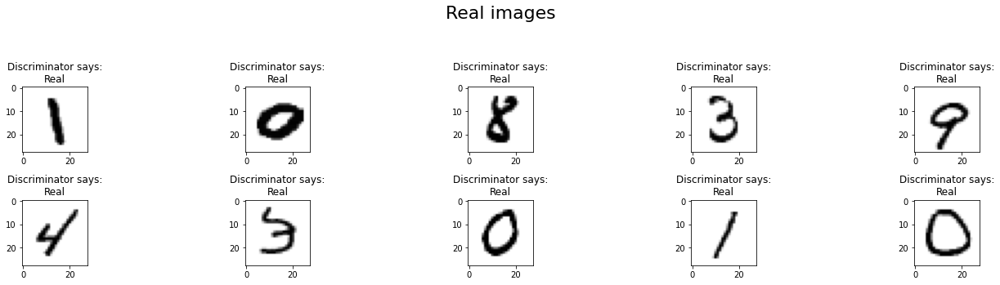

------------------------------------------------------------------------------------------------------------------------

Epoch: 12     | Batch: 200
Discriminator | Loss: 0.233641 | Accuracy: 0.90625
Generator     | Loss: 5.49268 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       128
         1.0       1.00      0.98      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



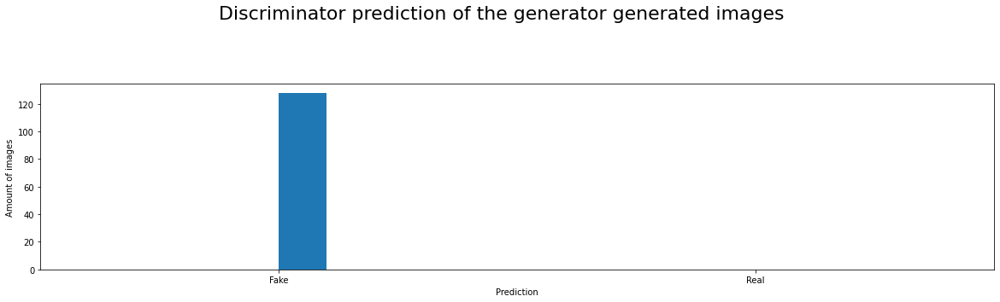

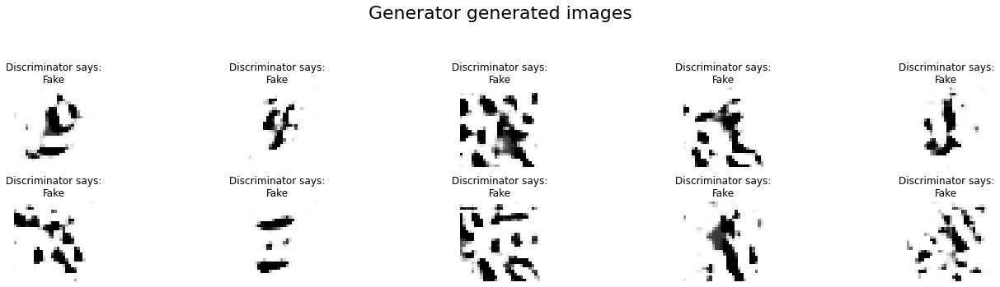

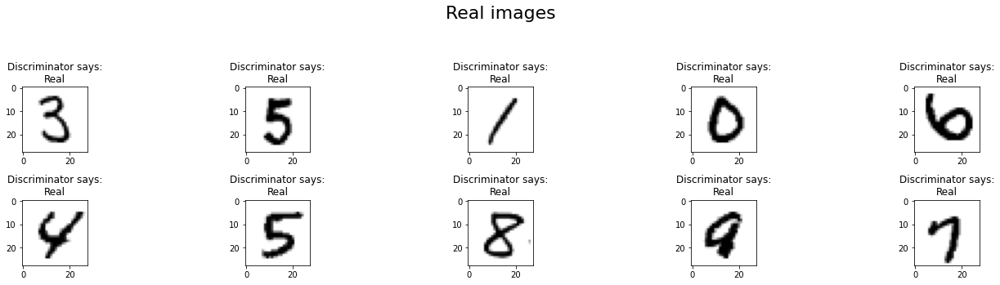

------------------------------------------------------------------------------------------------------------------------

Epoch: 12     | Batch: 400
Discriminator | Loss: 0.311695 | Accuracy:  0.875
Generator     | Loss: 5.31025 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       128
         1.0       1.00      0.98      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



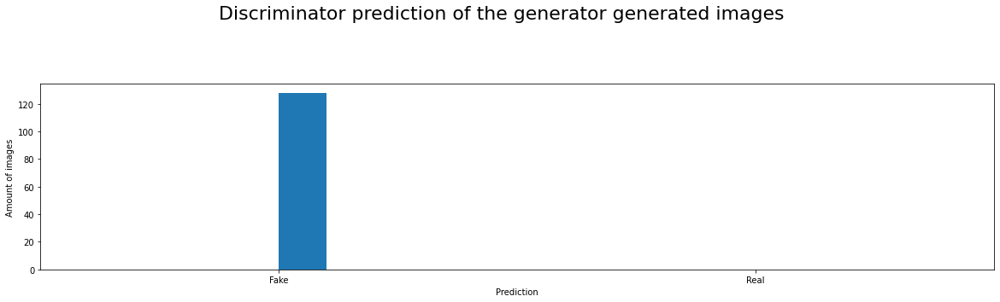

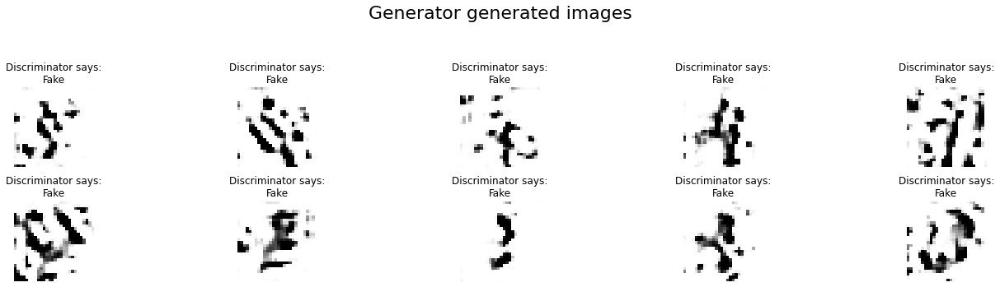

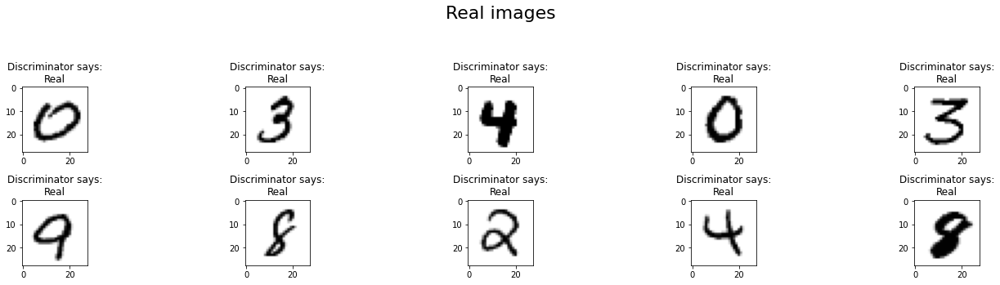

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 13     | Batch:   0
Discriminator | Loss: 1.16547 | Accuracy: 0.605469
Generator     | Loss: 7.28191 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98       128
         1.0       0.97      0.99      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



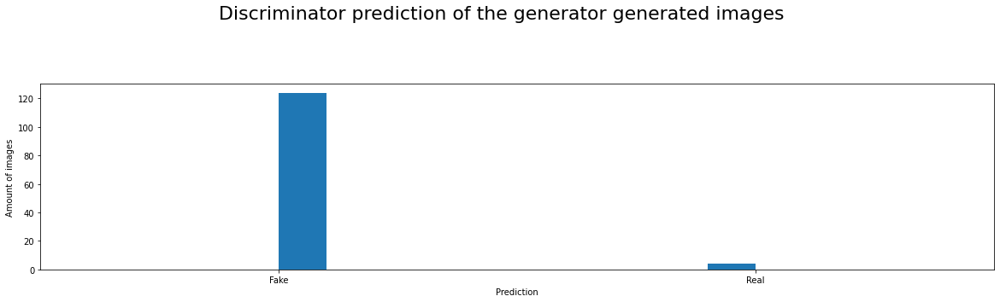

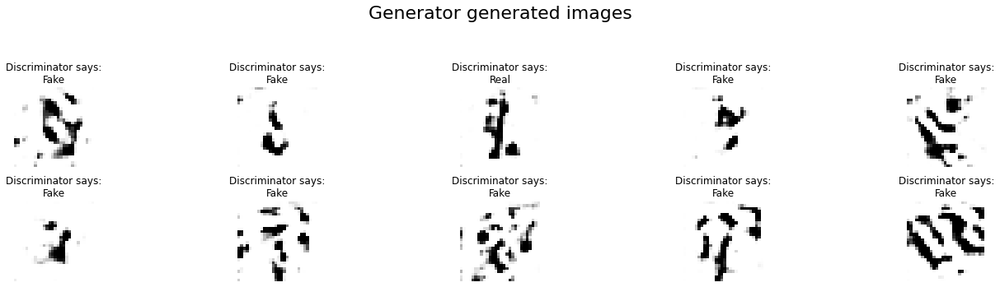

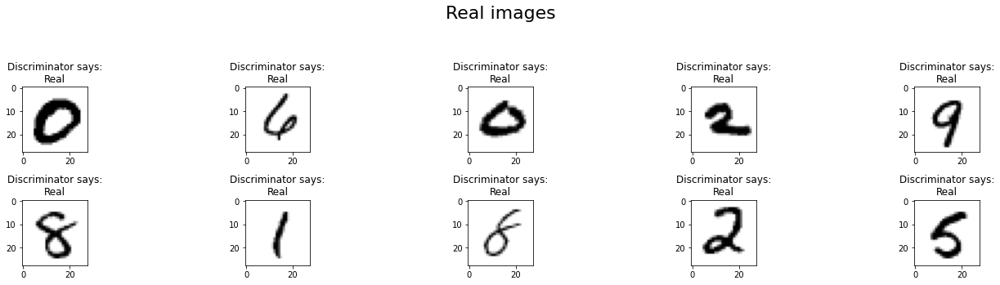

------------------------------------------------------------------------------------------------------------------------

Epoch: 13     | Batch: 200
Discriminator | Loss: 0.246546 | Accuracy: 0.910156
Generator     | Loss: 4.77515 | Accuracy: 0.046875
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.88      0.93       128
         1.0       0.89      0.99      0.94       128

    accuracy                           0.93       256
   macro avg       0.94      0.93      0.93       256
weighted avg       0.94      0.93      0.93       256



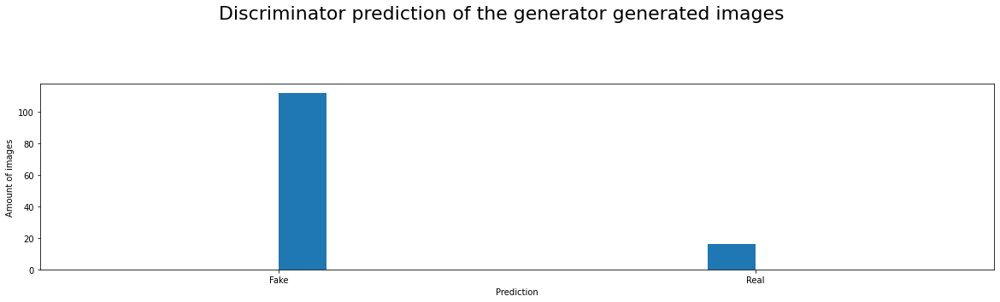

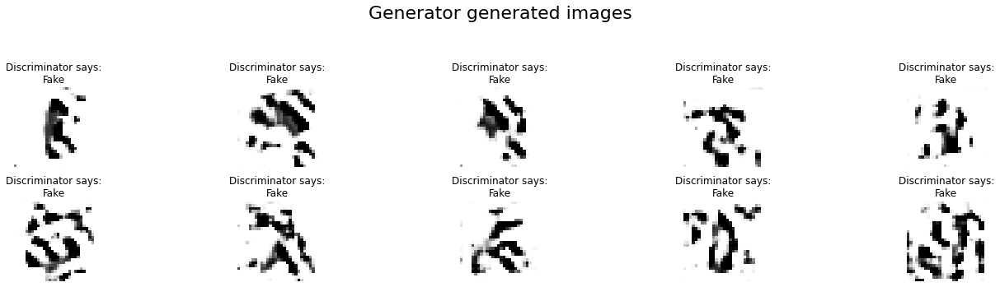

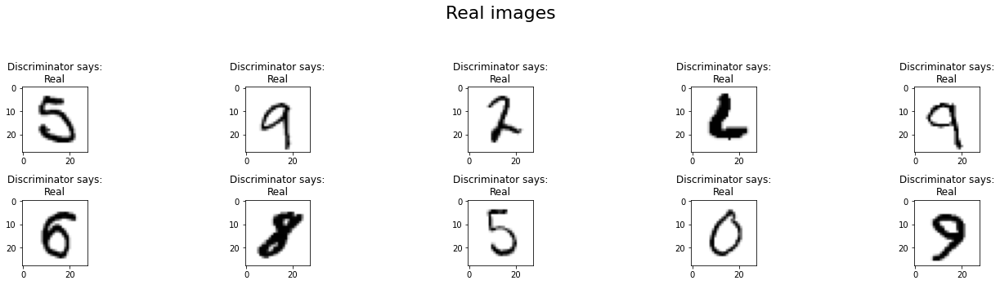

------------------------------------------------------------------------------------------------------------------------

Epoch: 13     | Batch: 400
Discriminator | Loss: 0.257729 | Accuracy: 0.929688
Generator     | Loss: 4.54509 | Accuracy: 0.0390625
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.98       128
         1.0       0.98      0.99      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



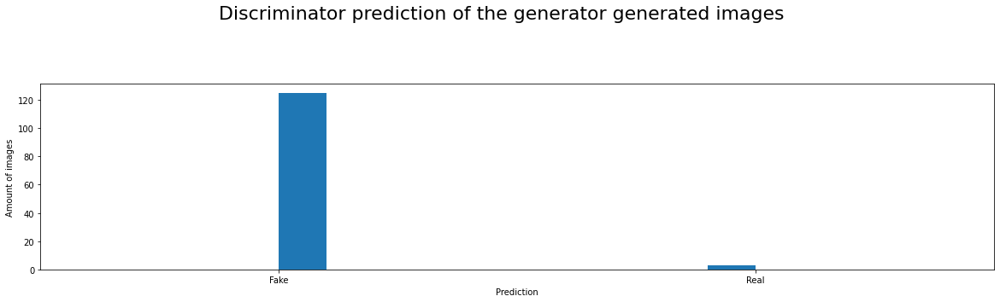

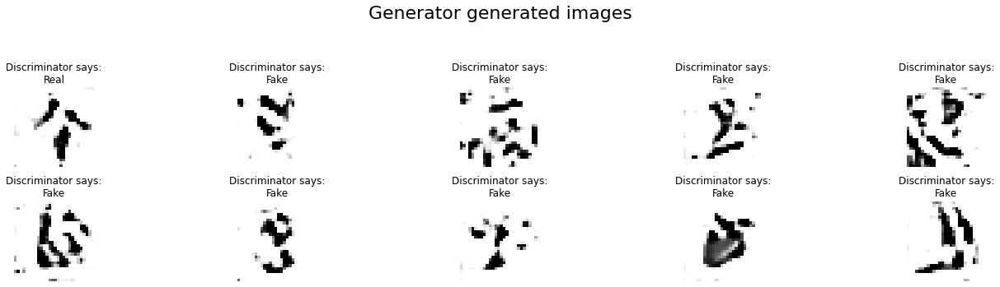

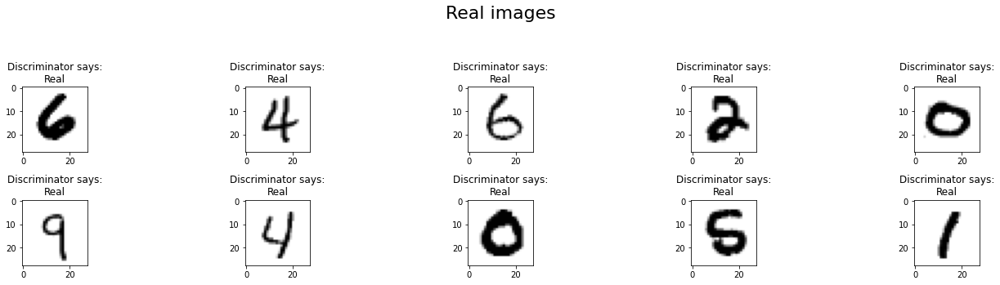

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 14     | Batch:   0
Discriminator | Loss: 0.40402 | Accuracy: 0.824219
Generator     | Loss: 6.71656 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       128
         1.0       0.99      0.97      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



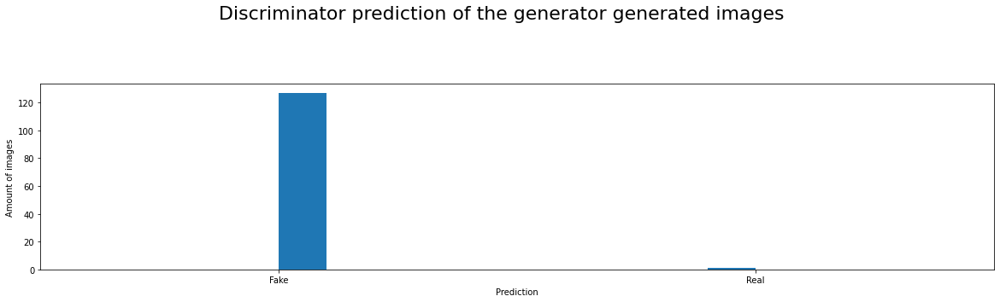

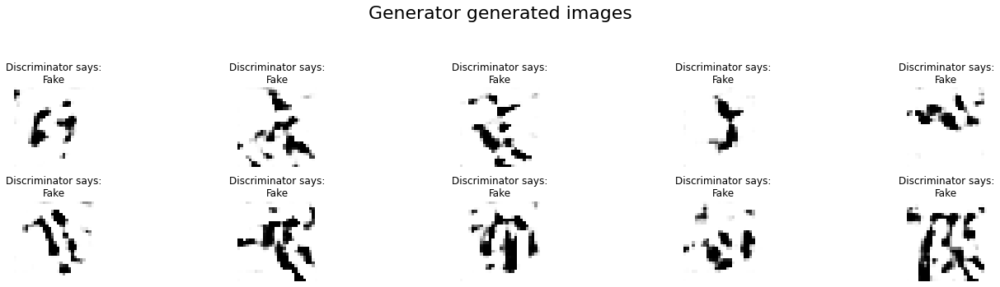

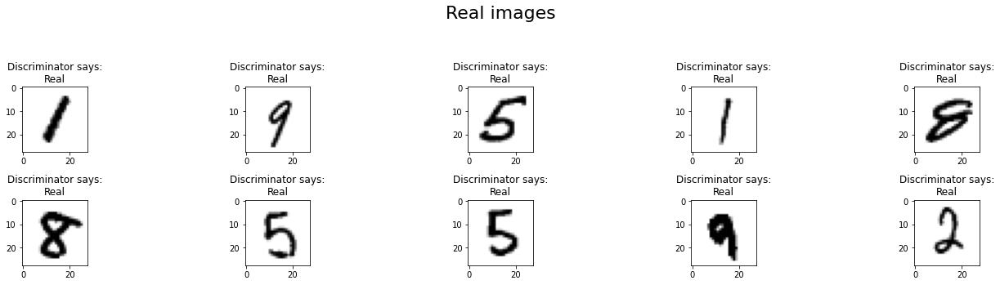

------------------------------------------------------------------------------------------------------------------------

Epoch: 14     | Batch: 200
Discriminator | Loss: 0.239595 | Accuracy: 0.917969
Generator     | Loss: 4.55719 | Accuracy: 0.0625
Metrics
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98       128
         1.0       0.97      0.98      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



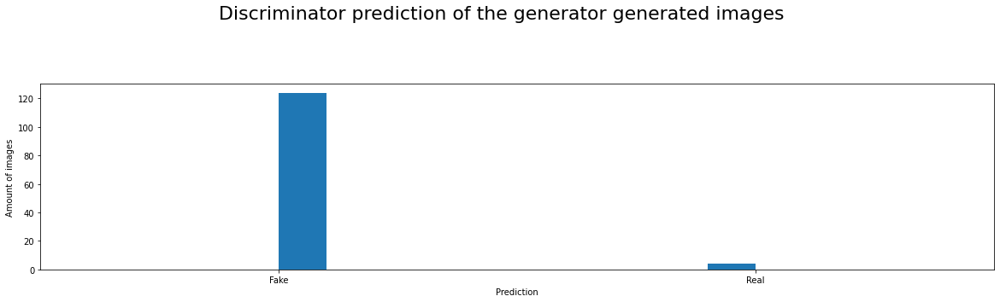

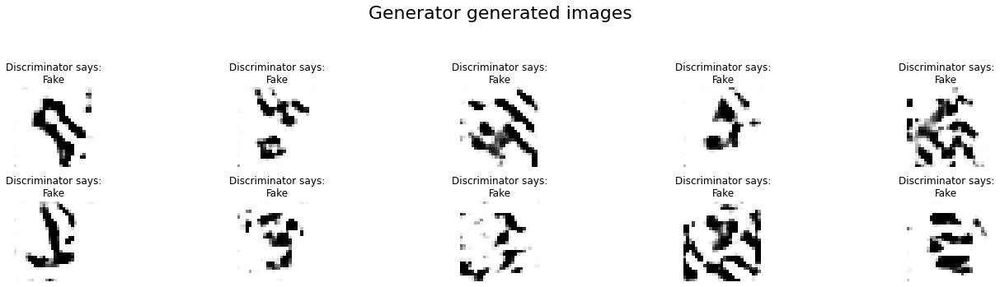

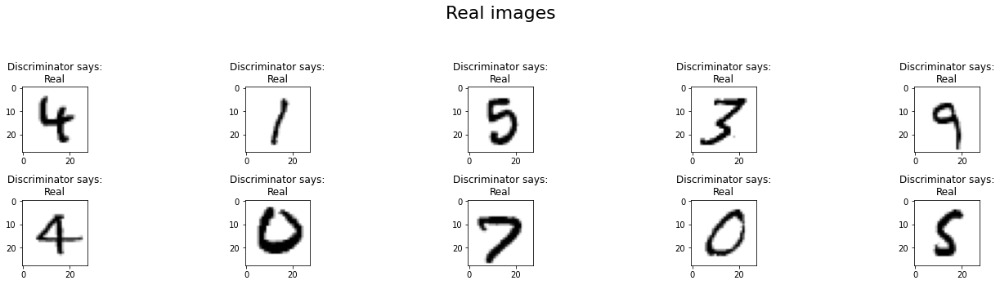

------------------------------------------------------------------------------------------------------------------------

Epoch: 14     | Batch: 400
Discriminator | Loss: 0.300371 | Accuracy: 0.859375
Generator     | Loss: 6.02706 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       128
         1.0       1.00      0.96      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



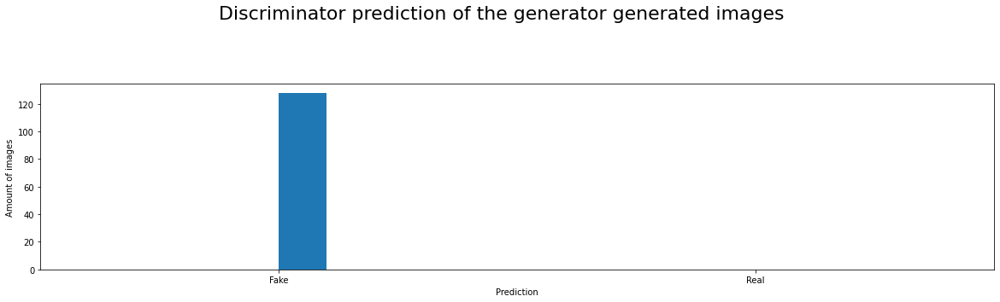

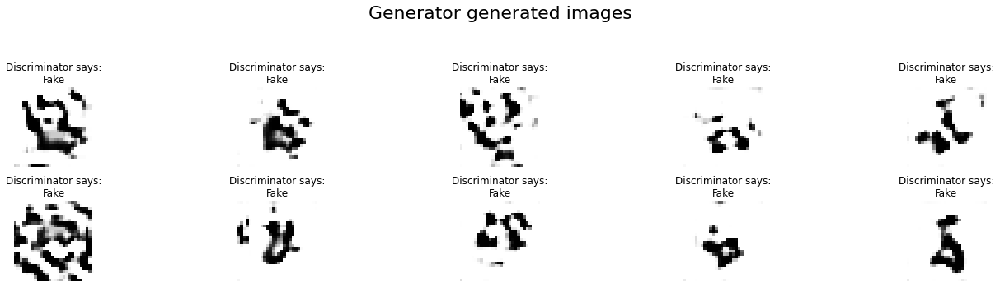

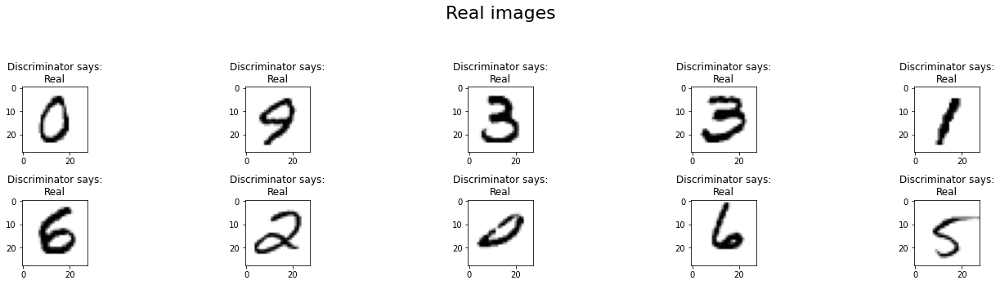

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 15     | Batch:   0
Discriminator | Loss: 0.228064 | Accuracy: 0.914062
Generator     | Loss: 3.77289 | Accuracy: 0.101562
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95       128
         1.0       0.91      1.00      0.95       128

    accuracy                           0.95       256
   macro avg       0.95      0.95      0.95       256
weighted avg       0.95      0.95      0.95       256



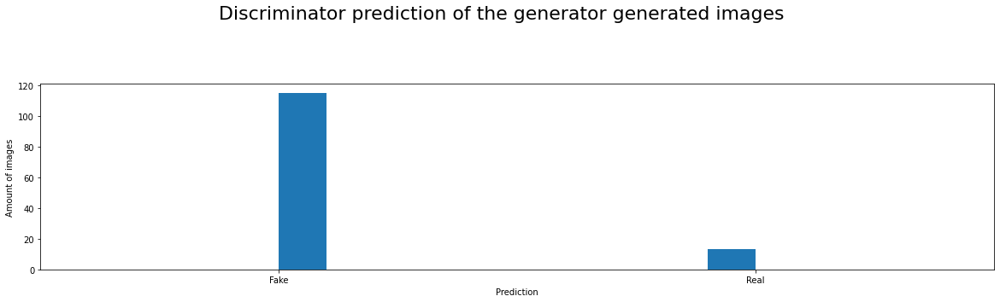

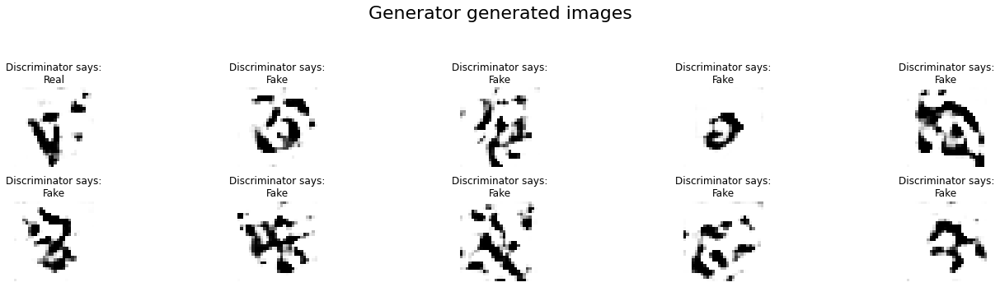

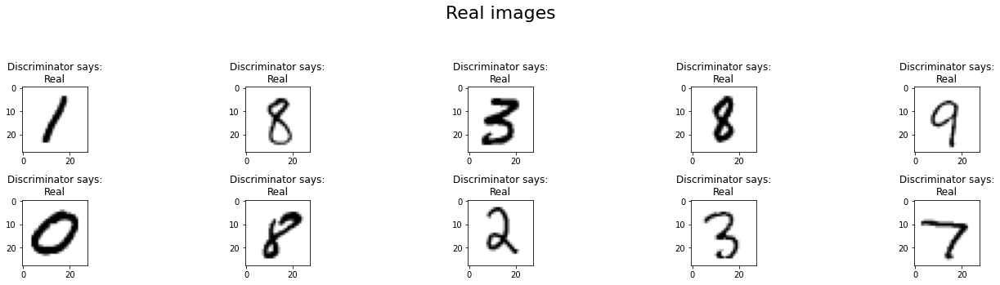

------------------------------------------------------------------------------------------------------------------------

Epoch: 15     | Batch: 200
Discriminator | Loss: 0.351774 | Accuracy: 0.882812
Generator     | Loss: 5.12185 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97       128
         1.0       1.00      0.94      0.97       128

    accuracy                           0.97       256
   macro avg       0.97      0.97      0.97       256
weighted avg       0.97      0.97      0.97       256



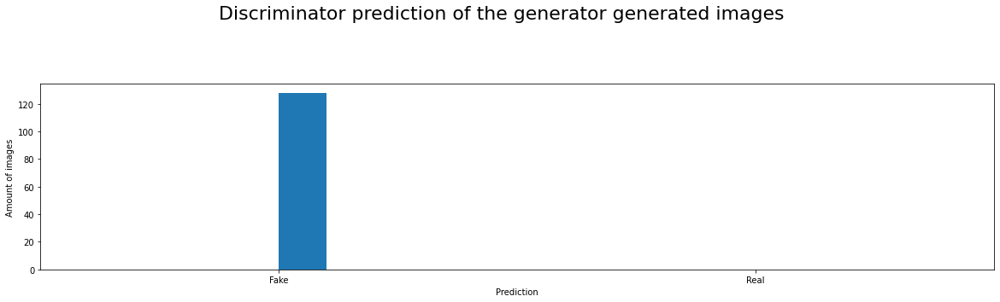

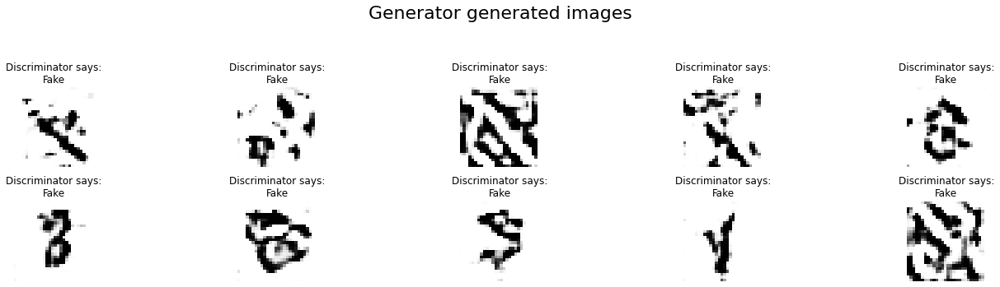

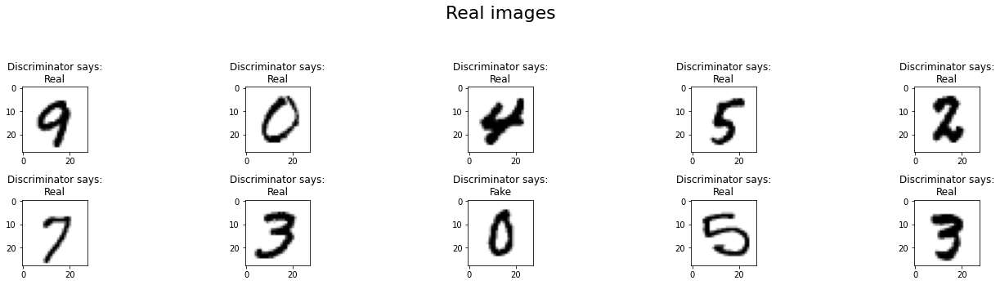

------------------------------------------------------------------------------------------------------------------------

Epoch: 15     | Batch: 400
Discriminator | Loss: 0.302816 | Accuracy: 0.898438
Generator     | Loss: 5.29479 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       128
         1.0       0.98      0.98      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



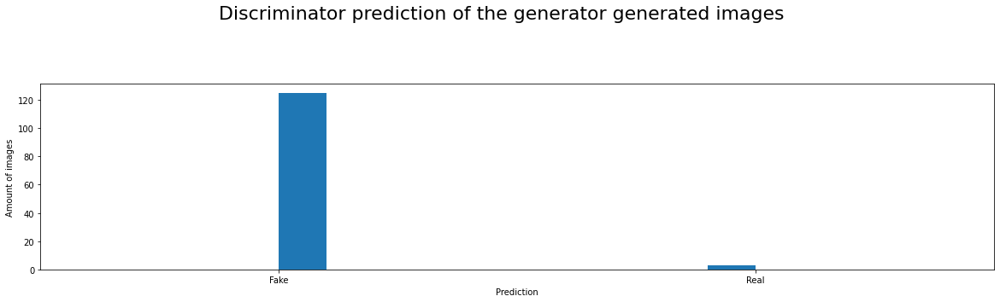

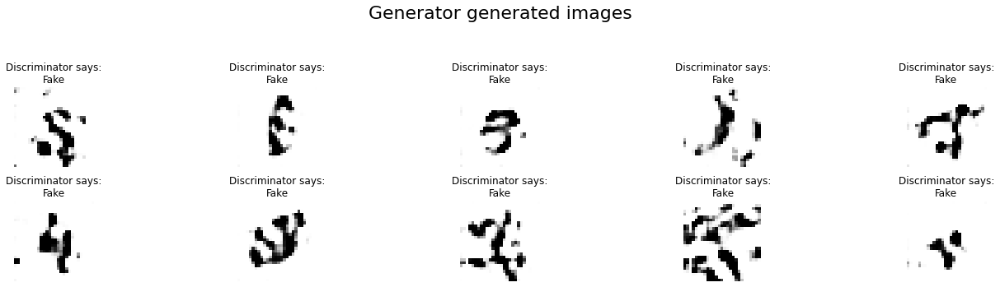

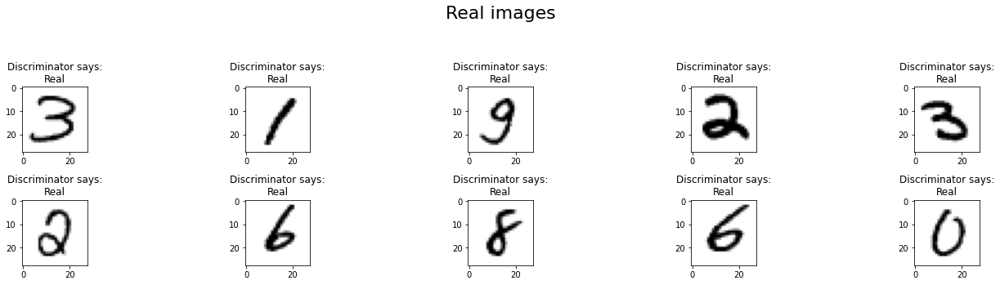

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 16     | Batch:   0
Discriminator | Loss: 0.538654 | Accuracy: 0.800781
Generator     | Loss: 2.81565 | Accuracy: 0.210938
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.58      0.73       128
         1.0       0.70      1.00      0.83       128

    accuracy                           0.79       256
   macro avg       0.85      0.79      0.78       256
weighted avg       0.85      0.79      0.78       256



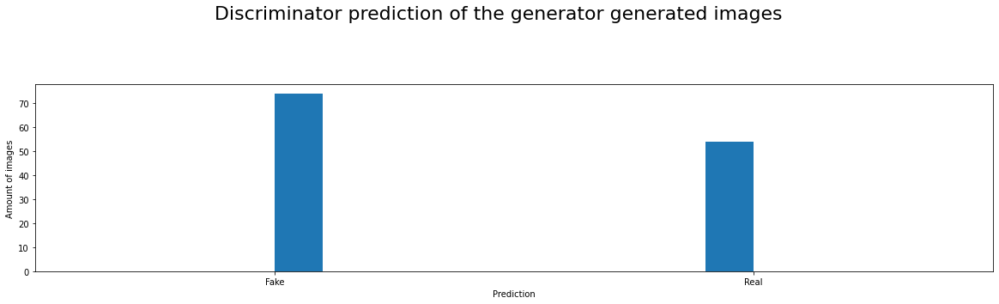

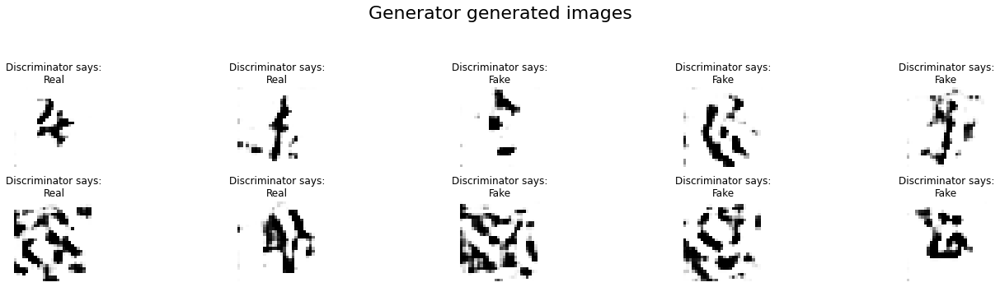

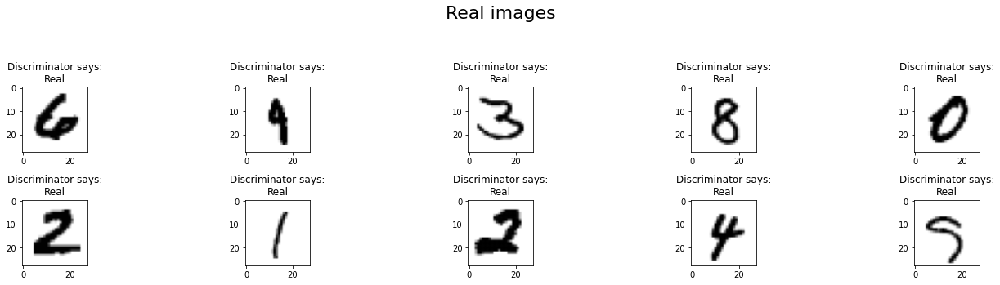

------------------------------------------------------------------------------------------------------------------------

Epoch: 16     | Batch: 200
Discriminator | Loss: 0.252792 | Accuracy: 0.898438
Generator     | Loss: 4.30032 | Accuracy: 0.0703125
Metrics
              precision    recall  f1-score   support

         0.0       0.99      0.95      0.97       128
         1.0       0.95      0.99      0.97       128

    accuracy                           0.97       256
   macro avg       0.97      0.97      0.97       256
weighted avg       0.97      0.97      0.97       256



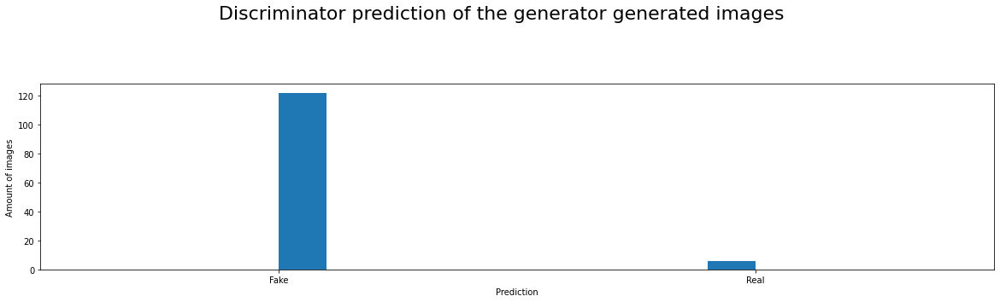

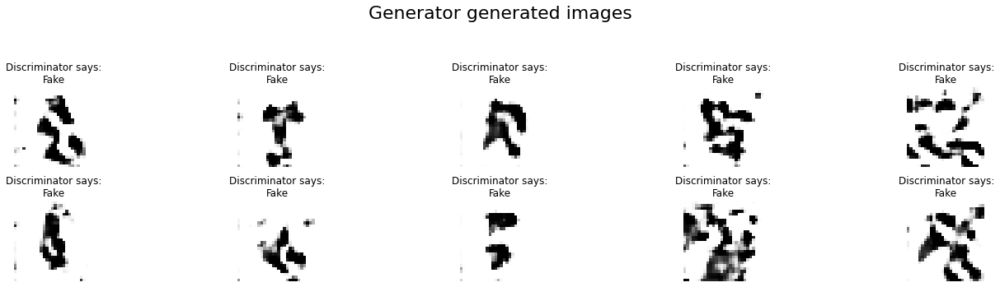

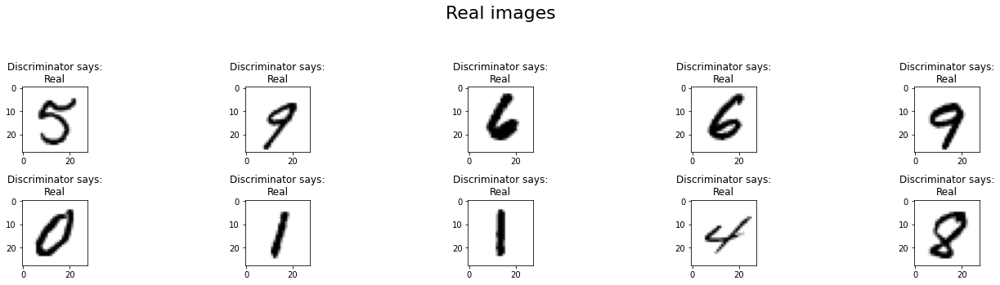

------------------------------------------------------------------------------------------------------------------------

Epoch: 16     | Batch: 400
Discriminator | Loss: 0.3646 | Accuracy: 0.851562
Generator     | Loss: 5.88256 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.88      1.00      0.93       128
         1.0       1.00      0.86      0.92       128

    accuracy                           0.93       256
   macro avg       0.94      0.93      0.93       256
weighted avg       0.94      0.93      0.93       256



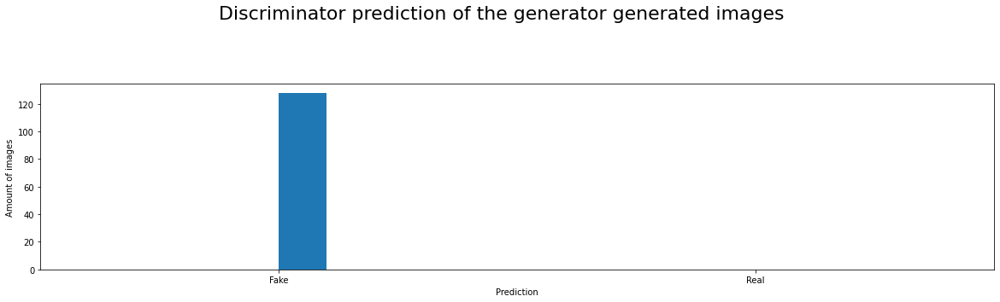

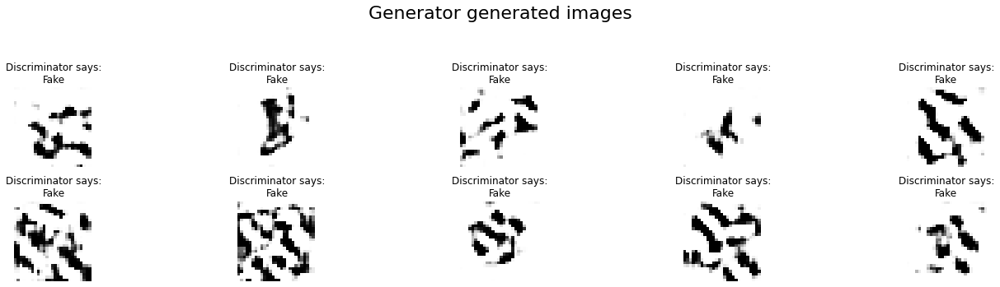

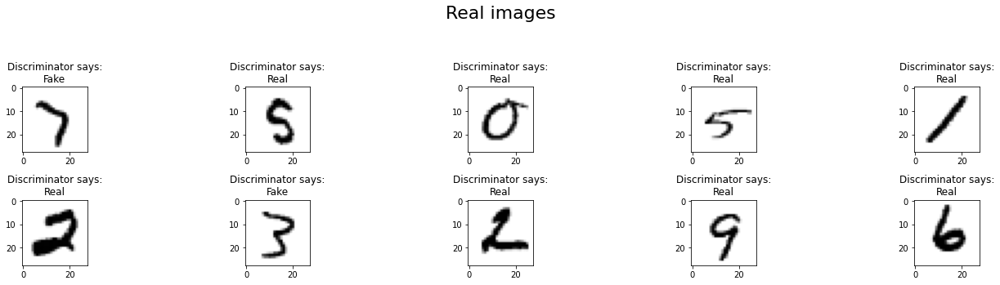

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 17     | Batch:   0
Discriminator | Loss: 0.463321 | Accuracy: 0.816406
Generator     | Loss: 7.35992 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95       128
         1.0       1.00      0.89      0.94       128

    accuracy                           0.95       256
   macro avg       0.95      0.95      0.95       256
weighted avg       0.95      0.95      0.95       256



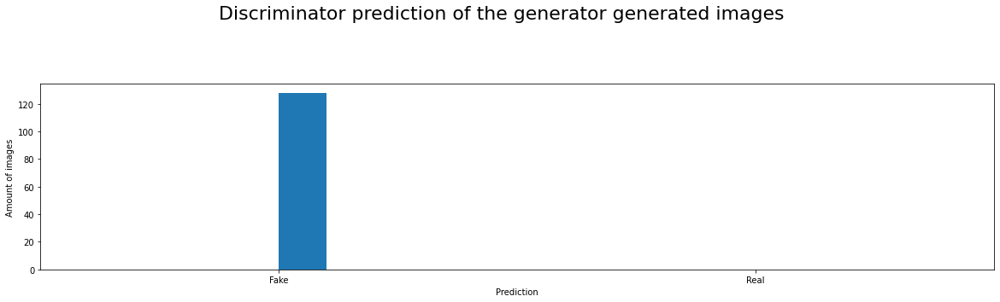

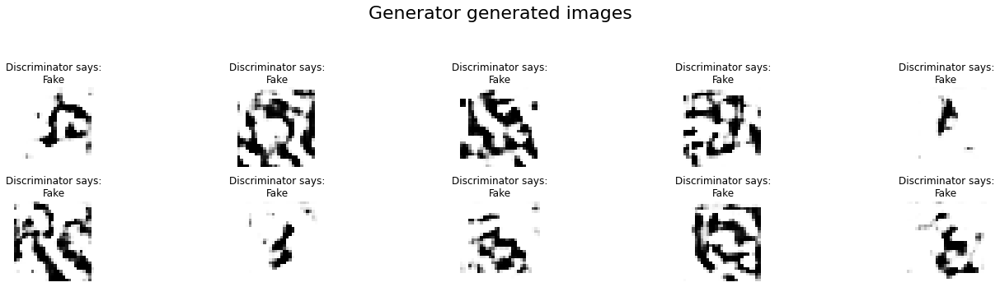

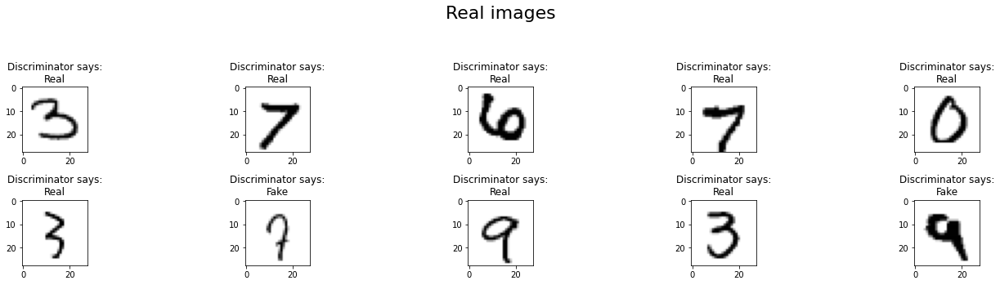

------------------------------------------------------------------------------------------------------------------------

Epoch: 17     | Batch: 200
Discriminator | Loss: 0.338667 | Accuracy: 0.867188
Generator     | Loss: 5.07327 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97       128
         1.0       1.00      0.95      0.97       128

    accuracy                           0.97       256
   macro avg       0.97      0.97      0.97       256
weighted avg       0.97      0.97      0.97       256



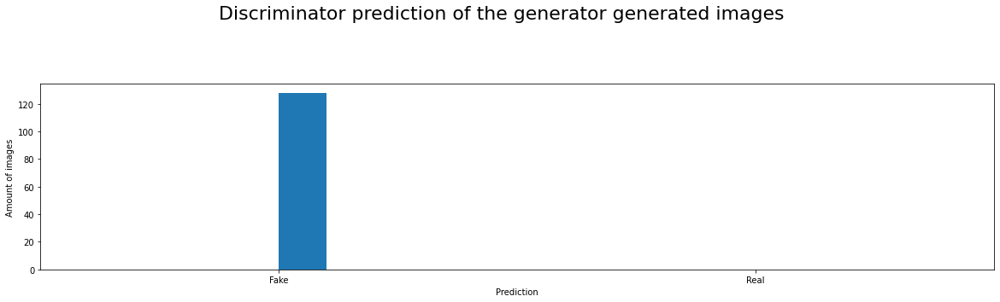

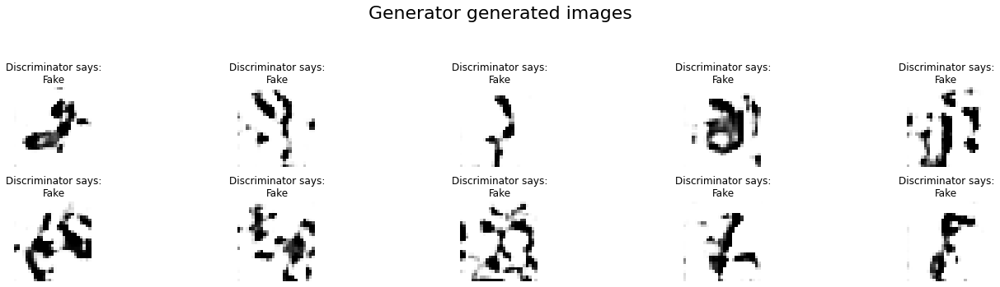

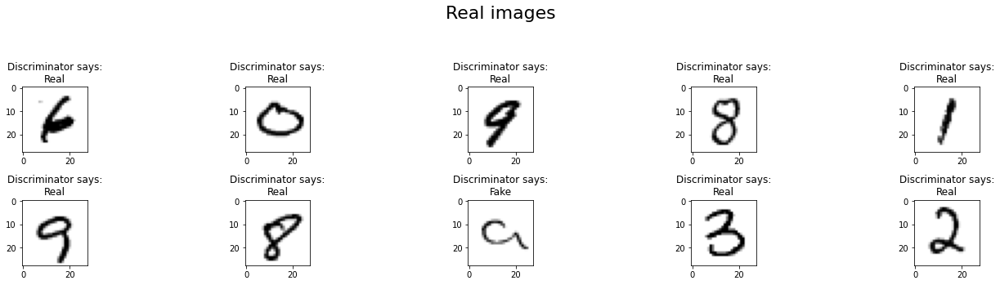

------------------------------------------------------------------------------------------------------------------------

Epoch: 17     | Batch: 400
Discriminator | Loss: 0.338484 | Accuracy: 0.847656
Generator     | Loss: 5.8476 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98       128
         1.0       1.00      0.97      0.98       128

    accuracy                           0.98       256
   macro avg       0.98      0.98      0.98       256
weighted avg       0.98      0.98      0.98       256



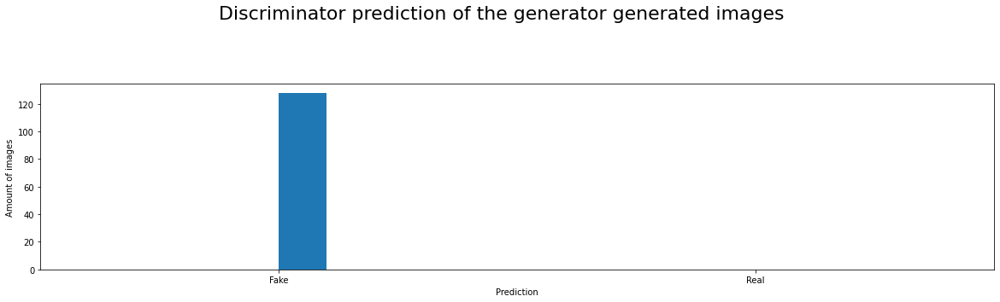

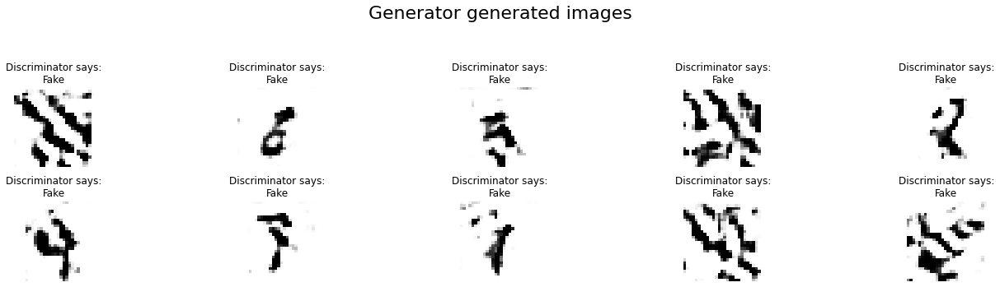

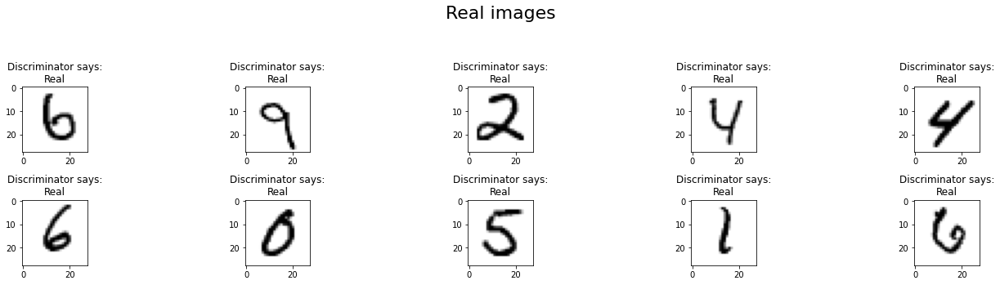

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 18     | Batch:   0
Discriminator | Loss: 0.227924 | Accuracy: 0.910156
Generator     | Loss: 3.71018 | Accuracy: 0.117188
Metrics
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99       128
         1.0       0.98      1.00      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



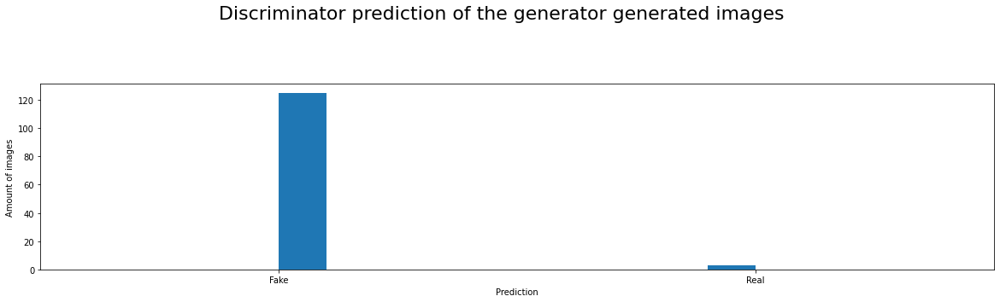

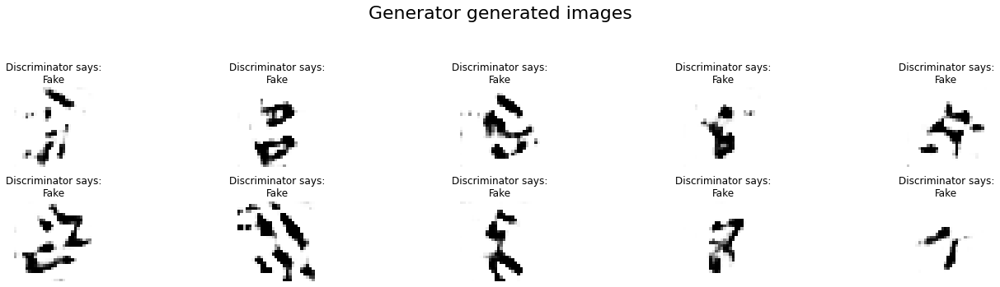

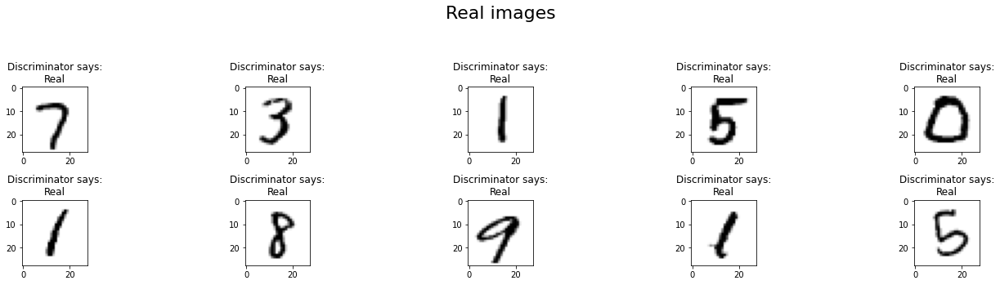

------------------------------------------------------------------------------------------------------------------------

Epoch: 18     | Batch: 200
Discriminator | Loss: 0.196092 | Accuracy: 0.917969
Generator     | Loss: 5.7632 | Accuracy: 0.015625
Metrics
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       128
         1.0       1.00      0.98      0.99       128

    accuracy                           0.99       256
   macro avg       0.99      0.99      0.99       256
weighted avg       0.99      0.99      0.99       256



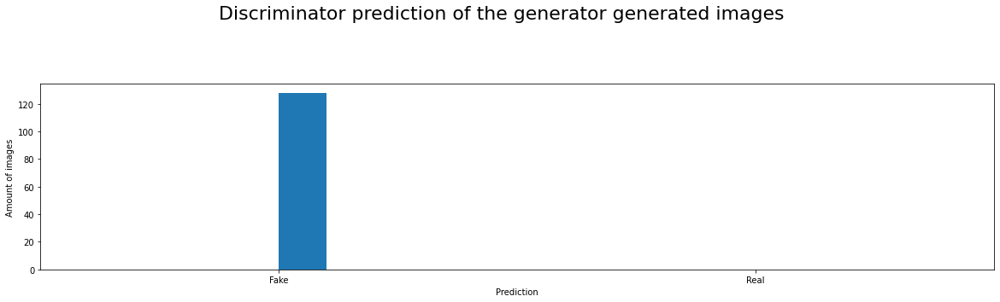

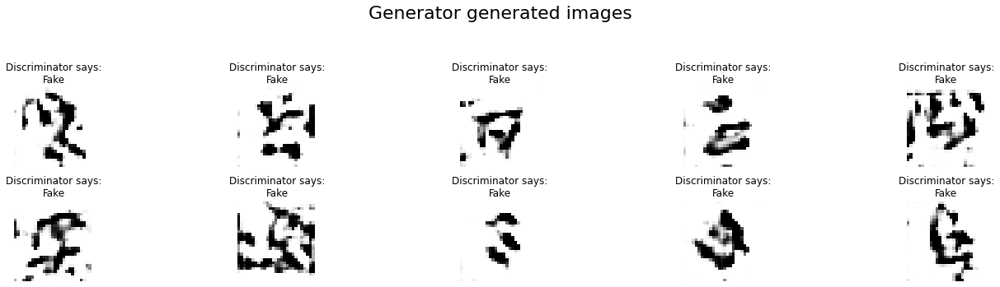

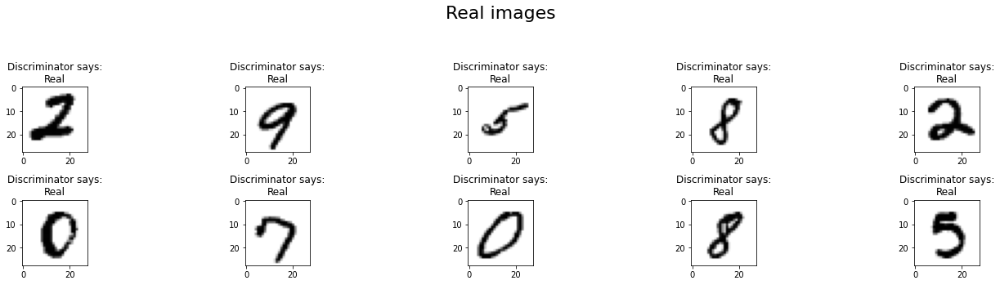

------------------------------------------------------------------------------------------------------------------------

Epoch: 18     | Batch: 400
Discriminator | Loss: 0.324031 | Accuracy: 0.871094
Generator     | Loss: 6.2218 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95       128
         1.0       1.00      0.90      0.95       128

    accuracy                           0.95       256
   macro avg       0.95      0.95      0.95       256
weighted avg       0.95      0.95      0.95       256



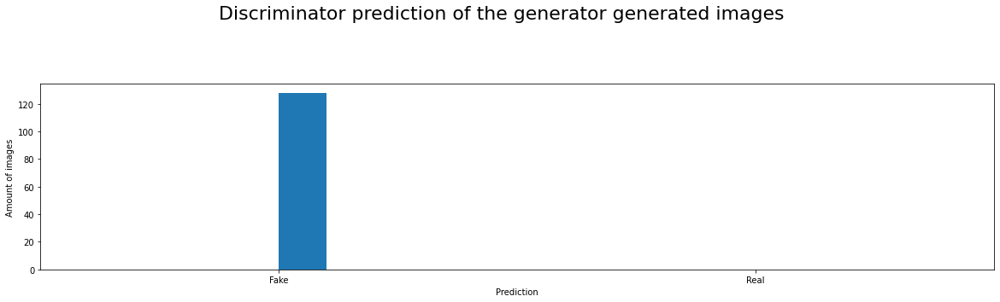

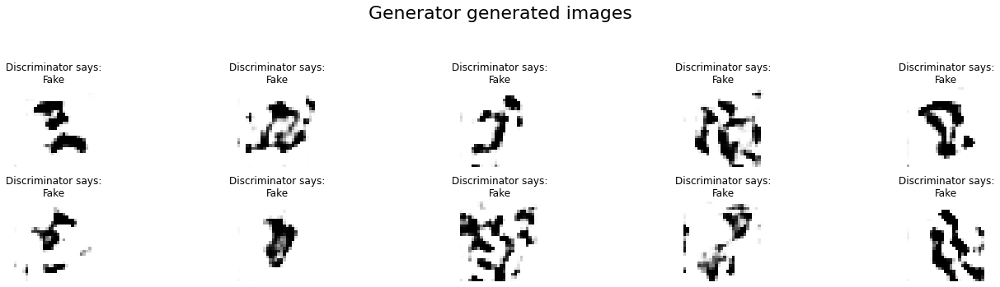

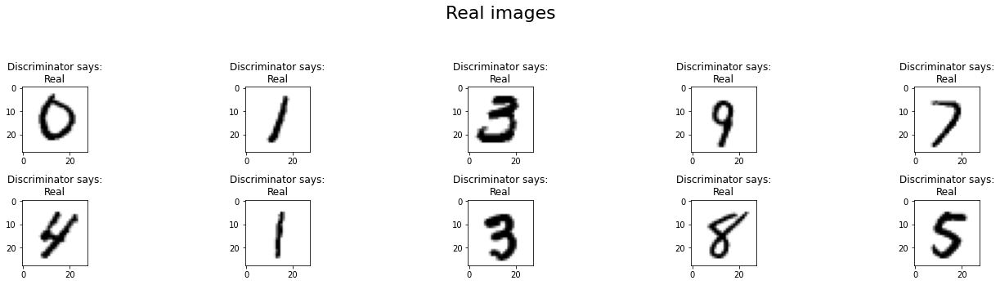

------------------------------------------------------------------------------------------------------------------------

(60000, 28, 28, 1)
Epoch: 19     | Batch:   0
Discriminator | Loss: 0.372056 | Accuracy: 0.863281
Generator     | Loss: 5.74687 | Accuracy: 0.0234375
Metrics
              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96       128
         1.0       0.99      0.93      0.96       128

    accuracy                           0.96       256
   macro avg       0.96      0.96      0.96       256
weighted avg       0.96      0.96      0.96       256



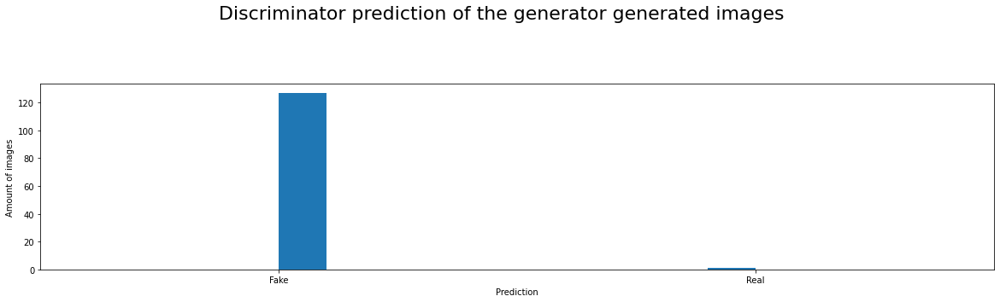

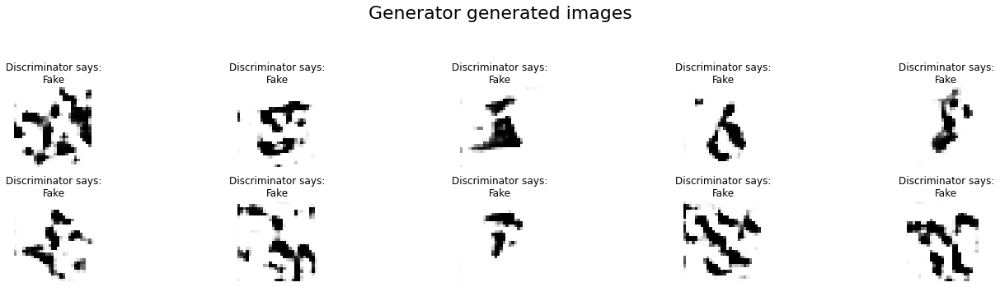

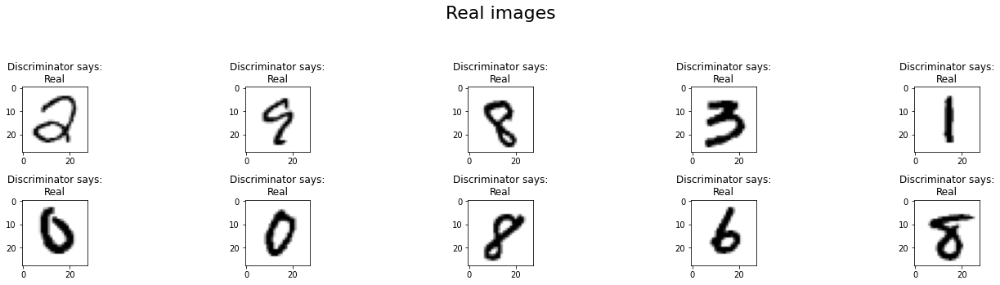

------------------------------------------------------------------------------------------------------------------------

Epoch: 19     | Batch: 200
Discriminator | Loss: 0.421727 | Accuracy: 0.839844
Generator     | Loss: 7.60042 | Accuracy: 0.0078125
Metrics
              precision    recall  f1-score   support

         0.0       0.88      1.00      0.93       128
         1.0       1.00      0.86      0.92       128

    accuracy                           0.93       256
   macro avg       0.94      0.93      0.93       256
weighted avg       0.94      0.93      0.93       256



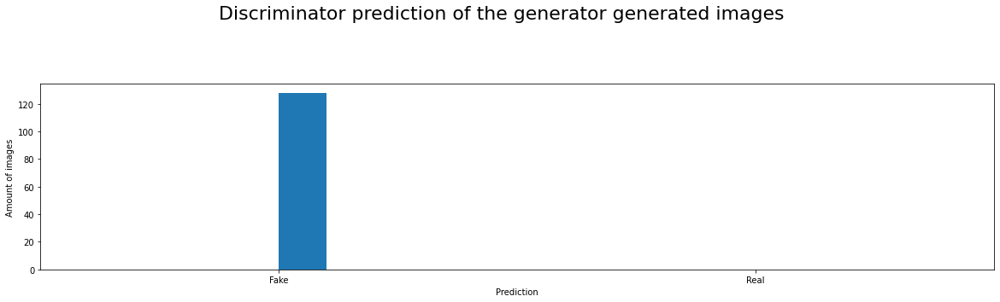

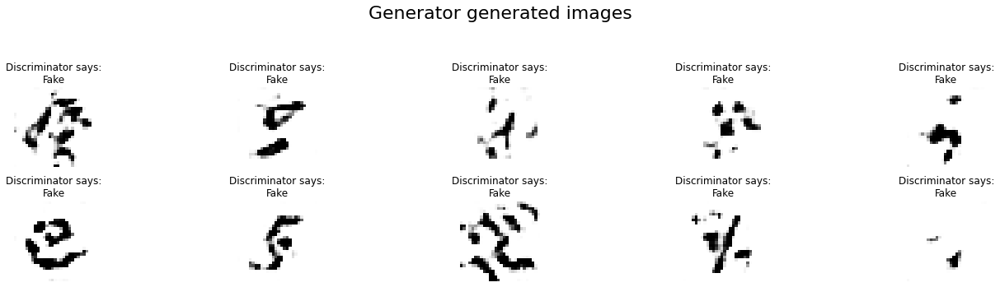

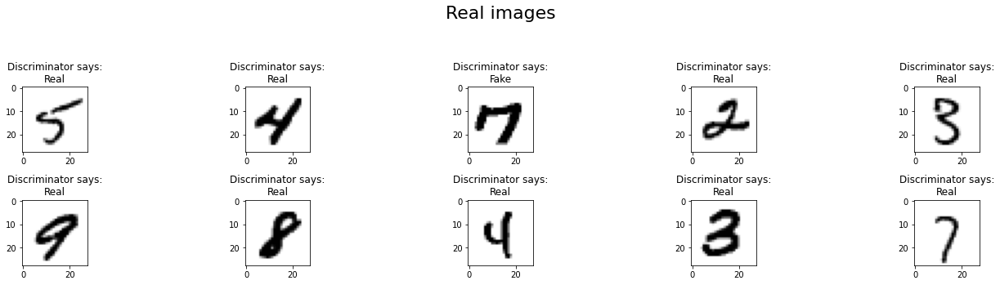

------------------------------------------------------------------------------------------------------------------------

Epoch: 19     | Batch: 400
Discriminator | Loss: 0.317408 | Accuracy:  0.875
Generator     | Loss: 5.27118 | Accuracy: 0.0625
Metrics
              precision    recall  f1-score   support

         0.0       0.93      0.98      0.96       128
         1.0       0.98      0.93      0.96       128

    accuracy                           0.96       256
   macro avg       0.96      0.96      0.96       256
weighted avg       0.96      0.96      0.96       256



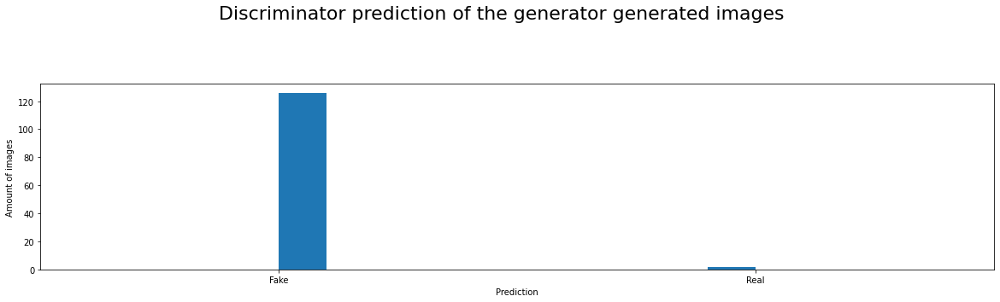

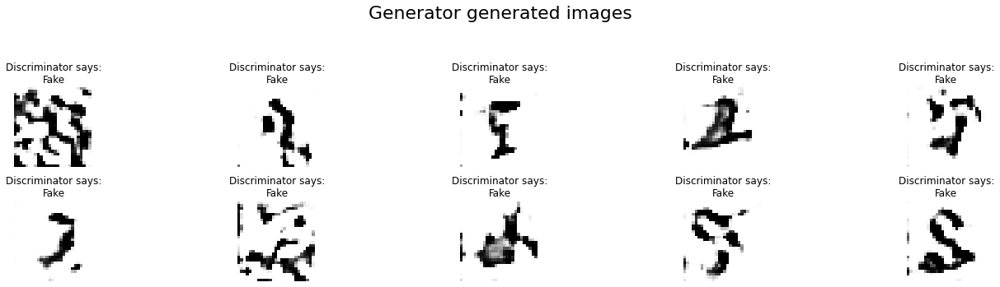

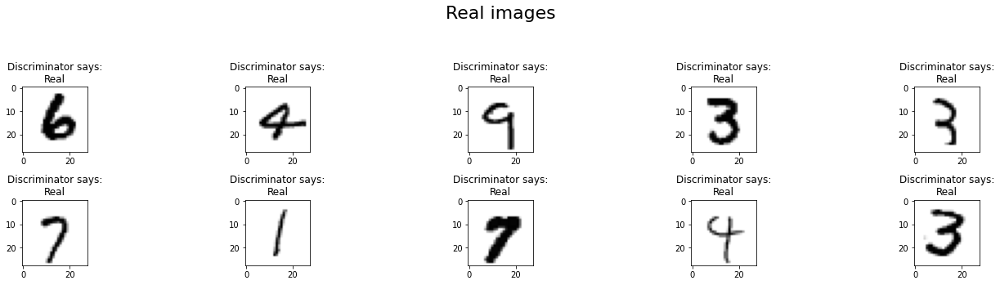

------------------------------------------------------------------------------------------------------------------------



In [ ]:
batch_size=128 # tamaño del batch
plt.rcParams["figure.figsize"]=[20,4]
for epoch in range(20): #epochs a realizar
    print(x.shape)
    for batch in range(int(x.shape[0]/batch_size)): #n° de batchs a realizar según el tamaño batch_size
      # train discriminator
      ix = np.random.randint(0, x.shape[0], batch_size) # generamos índices para samplear imágenes del dataset, sampleamos batch_size=128 datos
      x_real = x[ix]  # seleccionamos las imágenes
      noise = np.random.rand(noise_size * batch_size) # generamos ruido, según el tamaño de la entrada de nuestro generador
      noise = noise.reshape((batch_size, noise_size)) # reshape (batch_size,noise_size) sized noise
      x_false = generator_net.predict(noise) # generamos imágenes fake según el ruido
      y_real = np.ones((batch_size, 1)) # etiquetas real
      y_false = np.zeros((batch_size, 1)) #etiquetas fake
      x_train = np.concatenate((x_real, x_false)) # x_train-> imágenes reales + imágenes fakes
      y_train = np.concatenate((y_real, y_false)) # y_train-> etiquetas reales + etiquetas fakes
      dis_loss, dis_acc = discriminator.train_on_batch(x_train, y_train) #train discriminator
      # train generator
      noise2 = np.random.rand(noise_size * batch_size) # generamos ruido nuevamente según el tamaño de la entrada de nuestro generador
      noise2 = noise2.reshape((batch_size, noise_size)) # reshape (batch_size,noise_size) sized noise
      gen_loss, gen_acc = gan.train_on_batch(noise2 , np.ones((batch_size, 1))) # output is 1, as generator needs to convine discriminator (trainable false) w/ fake images from noise
      if batch%(200)==0: # cada cuánto plotear es ajustable
          print("Epoch: {:2}     | Batch: {:3}".format(epoch, batch))
          print("Discriminator | Loss: {:6.6} | Accuracy: {:6.6}".format(dis_loss, dis_acc))
          print("Generator     | Loss: {:6.6} | Accuracy: {:6.6}".format(gen_loss, gen_acc))
          # plot random generated images, discriminator image inputs and outputs, and losses and accuracies
          y_pred = discriminator.predict(x_train)
          y_pred = (y_pred > 0.5)
          print('Metrics')
          print(classification_report(y_train, y_pred))

          y_pred_gen = discriminator.predict(x_false)
          y_pred_gen = (y_pred_gen > 0.5).astype(int)
          plt.suptitle("Discriminator prediction of the generator generated images", y=1.2,size=22)
          plt.hist(y_pred_gen)
          plt.xticks([0, 1], ['Fake', 'Real'])
          plt.xlim(-0.5, 1.5)
          plt.xlabel('Prediction')
          plt.ylabel('Amount of images')
          plt.show()  

          plt.suptitle("Generator generated images", y=1.2,size=22)
          for i in range(10):
            plt.subplot(2, 5, 1 + i)
            plt.title("Discriminator says:\n"+ ["Fake","Real"][int(np.round(discriminator.predict(x_false[i:i+1, :, :, :])[0,0],0))])
            plt.axis('off')
            plt.imshow(x_false[i, :, :, 0], cmap='gray_r')
          plt.tight_layout()
          plt.show()
    
          plt.suptitle("Real images", y=1.2,size=22)
          for i in range(10):
            plt.subplot(2, 5, 1 + i)
            plt.title("Discriminator says:\n"+ ["Fake","Real"][int(np.round(discriminator.predict(x_real[i:i+1, :, :, :])[0,0],0))])
            plt.imshow(x_real[i, :, :, 0],cmap='gray_r')
          plt.tight_layout()
          plt.show()

          print("-"*120+"\n")
          

Como vemos, las perdida y el acc no variaron mucho y permanecieron en valores semejantes durante todo el entrenamiento. Por otra parte el discriminador aveces decretaba que la mayoria de elementos generados eran reales. Sin embargo, como podemos ver los dibujos generados fueron cada vez mejor a lo largo de las iteraciones.

<Figure size 1440x288 with 0 Axes>

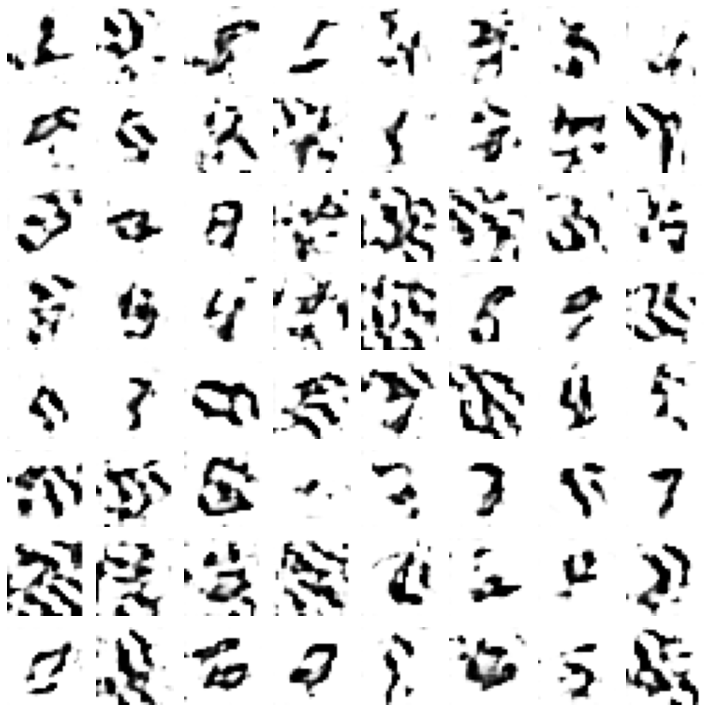

In [ ]:
noise = np.random.rand(noise_size * batch_size) # generamos ruido, según el tamaño de la entrada de nuestro generador
noise = noise.reshape((batch_size, noise_size)) # reshape (batch_size,noise_size) sized noise
x_false = generator_net.predict(noise) # generamos imágenes fake según el ruido

plt.suptitle("Generator generated images", y=1.2,size=22)
plt.figure(figsize=(10,10))
for i in range(64):
  plt.subplot(8, 8, 1 + i)
  plt.axis('off')
  plt.imshow(x_false[i, :, :, 0], cmap='gray_r')
plt.tight_layout()
plt.show()

<Figure size 1440x288 with 0 Axes>

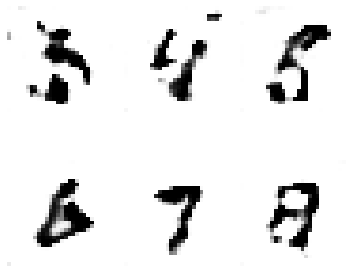

In [ ]:
plt.suptitle("Generator generated images", y=1.2,size=22)
plt.figure(figsize=(5,5))
for i, e in enumerate([6, 26, 29, 74, 47, 18]):
  plt.subplot(2, 3, 1 + i)
  plt.axis('off')
  plt.imshow(x_false[e, :, :, 0], cmap='gray_r')
plt.tight_layout()
plt.show()

Como podemos ver algunos numeros son mas faciles de reproducir para el modelo, esto se puede deber a un desbalanceo de clases o al simple hecho de que estos numeros comparten mas caracteristicas entre si, como el 8 que es un 3 con mas lineas. Podemos ver que el 5 y el 3 son los numeros mas repetidos, en cuanto a la certesa del modelo.

(1, 50)


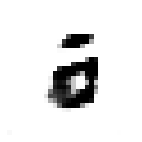

In [ ]:
noise_mean = np.array([np.mean(np.array([noise[74, :], noise[18, :]]), axis=0)])
print(noise_mean.shape)
x_false_mean = generator_net.predict(noise_mean)

plt.subplot(2, 3, 1 + i)
plt.axis('off')
plt.imshow(x_false_mean[0, :, :, 0], cmap='gray_r')
plt.tight_layout()
plt.show()

Al mezclar el 8 con el 6 se obtiene un 0, debido a que se pierde el circulo superir del 8 ya que el 6 no lo tiene.

## Pregunta **Bonus**

* Proponga o investigue como realizaría las siguientes tareas:
    * A partir de una base de datos de imagenes RGB, entrenar una GAN que genere imágenes a color convincentes a partir de imagenes en blanco y negro, es decir que deduzca el color a partir de imagenes en blanco y negro.
    * A partir de una base de datos de cuadros de paisajes reales y las fotos correspondientes al cuadro, entrenar una GAN que permita transformar fotografias a cuadros y viceversa (puede utilizar más de 2 redes)
    * Proponga un problema que les parezca interesante y una estructura de GAN que le permitiría resolverlo

Realizaremos tranferencia de estilo con GANs, para esto nos basaremos en el trabajo realizado por [TF](https://colab.research.google.com/github/tensorflow/models/blob/master/research/nst_blogpost/4_Neural_Style_Transfer_with_Eager_Execution.ipynb#scrollTo=riWE_b8k3s6o).

In [ ]:
import os
img_dir = '/tmp/nst'
if not os.path.exists(img_dir):
    os.makedirs(img_dir)
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg

### Import and configure modules

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools

%tensorflow_version 1.x
import tensorflow as tf

from tensorflow.python.keras.preprocessing import image as kp_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

print("Eager execution: {}".format(tf.executing_eagerly()))

TensorFlow is already loaded. Please restart the runtime to change versions.
Eager execution: True


In [ ]:
# Set up some global values here
content_path = '/tmp/nst/Green_Sea_Turtle_grazing_seagrass.jpg'
style_path = '/tmp/nst/The_Great_Wave_off_Kanagawa.jpg'

In [ ]:
def load_img(path_to_img):
  max_dim = 512
  img = Image.open(path_to_img)
  long = max(img.size)
  scale = max_dim/long
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  
  img = kp_image.img_to_array(img)
  
  # We need to broadcast the image array such that it has a batch dimension 
  img = np.expand_dims(img, axis=0)
  return img

def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display 
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)

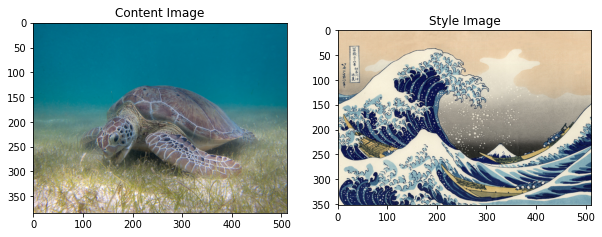

In [ ]:
plt.figure(figsize=(10,10))

content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.show()

In [ ]:
def load_and_process_img(path_to_img):
  img = load_img(path_to_img)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

In [ ]:
def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")
  
  # perform the inverse of the preprocessing step
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

In [ ]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
def get_model():
  """ Creates our model with access to intermediate layers. 
  
  This function will load the VGG19 model and access the intermediate layers. 
  These layers will then be used to create a new model that will take input image
  and return the outputs from these intermediate layers from the VGG model. 
  
  Returns:
    returns a keras model that takes image inputs and outputs the style and 
      content intermediate layers. 
  """
  # Load our model. We load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Get output layers corresponding to style and content layers 
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model 
  return models.Model(vgg.input, model_outputs)

In [ ]:
def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

In [ ]:
def gram_matrix(input_tensor):
  # We make the image channels first 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  """Expects two images of dimension h, w, c"""
  # height, width, num filters of each layer
  # We scale the loss at a given layer by the size of the feature map and the number of filters
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  
  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

In [ ]:
def get_feature_representations(model, content_path, style_path):
  """Helper function to compute our content and style feature representations.

  This function will simply load and preprocess both the content and style 
  images from their path. Then it will feed them through the network to obtain
  the outputs of the intermediate layers. 
  
  Arguments:
    model: The model that we are using.
    content_path: The path to the content image.
    style_path: The path to the style image
    
  Returns:
    returns the style features and the content features. 
  """
  # Load our images in 
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)
  
  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

In [ ]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """This function will compute the loss total loss.
  
  Arguments:
    model: The model that will give us access to the intermediate layers
    loss_weights: The weights of each contribution of each loss function. 
      (style weight, content weight, and total variation weight)
    init_image: Our initial base image. This image is what we are updating with 
      our optimization process. We apply the gradients wrt the loss we are 
      calculating to this image.
    gram_style_features: Precomputed gram matrices corresponding to the 
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of 
      interest.
      
  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  """
  style_weight, content_weight = loss_weights
  
  # Feed our init image through our model. This will give us the content and 
  # style representations at our desired layers. Since we're using eager
  # our model is callable just like any other function!
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Accumulate content losses from all layers 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score 
  return loss, style_score, content_score

In [ ]:
def compute_grads(cfg):
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

In [ ]:
import IPython.display

def run_style_transfer(content_path, 
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3, 
                       style_weight=1e-2): 
  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false. 
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False
  
  # Get the style and content feature representations (from our specified intermediate layers) 
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  init_image = load_and_process_img(content_path)
  init_image = tf.Variable(init_image, dtype=tf.float32)
  # Create our optimizer
  opt = tf.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=1e-1)

  # For displaying intermediate images 
  iter_count = 1
  
  # Store our best result
  best_loss, best_img = float('inf'), None
  
  # Create a nice config 
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }
    
  # For displaying
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # Update best loss and best image from total loss. 
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      start_time = time.time()
      
      # Use the .numpy() method to get the concrete numpy array
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      imgs.append(plot_img)
      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  IPython.display.clear_output(wait=True)
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
      
  return best_img, best_loss 

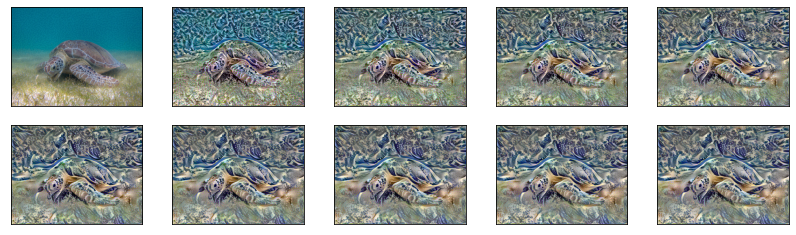

In [ ]:
best, best_loss = run_style_transfer(content_path, style_path, num_iterations=1000)

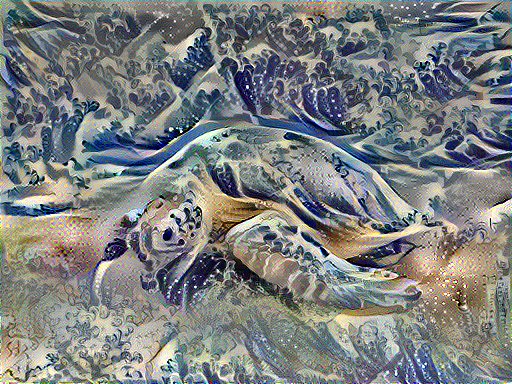

In [ ]:
Image.fromarray(best)

In [ ]:
#from google.colab import files
#files.download('wave_turtle.png')

In [ ]:
def show_results(best_img, content_path, style_path, show_large_final=True):
  plt.figure(figsize=(10, 5))
  content = load_img(content_path) 
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  if show_large_final: 
    plt.figure(figsize=(10, 10))

    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()

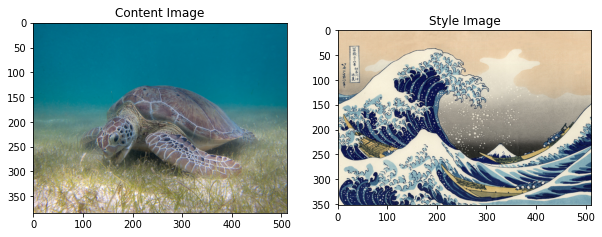

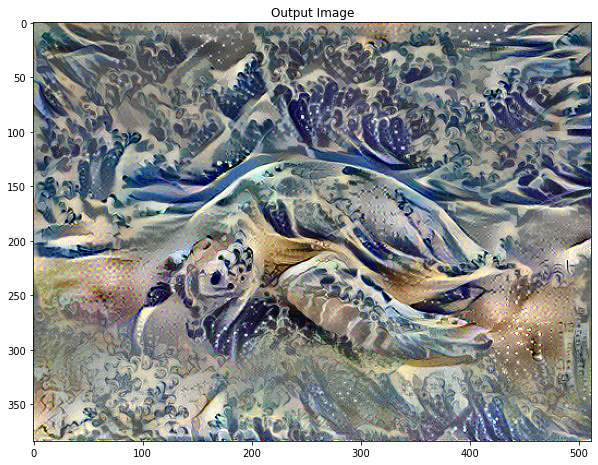

In [ ]:
show_results(best, content_path, style_path)

In [ ]:
!wget --quiet -P /tmp/nst/ https://cdn.hispantv.com/hispanmedia/files/images/thumbnail/20191007/02142324_xl.jpg
!wget --quiet -P /tmp/nst/ https://d16kd6gzalkogb.cloudfront.net/magazine_images/Jackson-Pollock-detail.jpg
content_path = "/tmp/nst/02142324_xl.jpg"
style_path = "/tmp/nst/Jackson-Pollock-detail.jpg"

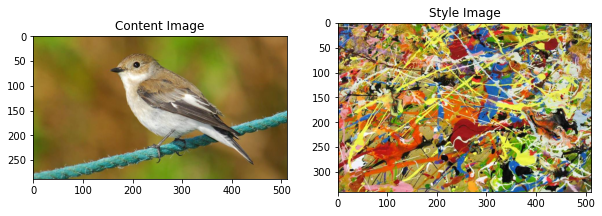

In [ ]:
plt.figure(figsize=(10,10))

content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.show()

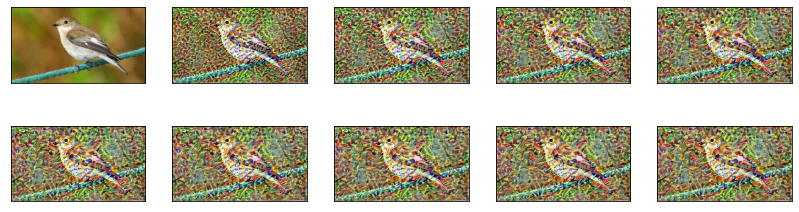

In [ ]:
best, best_loss = run_style_transfer(content_path, style_path, num_iterations=1000)

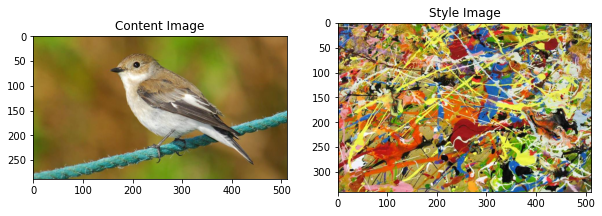

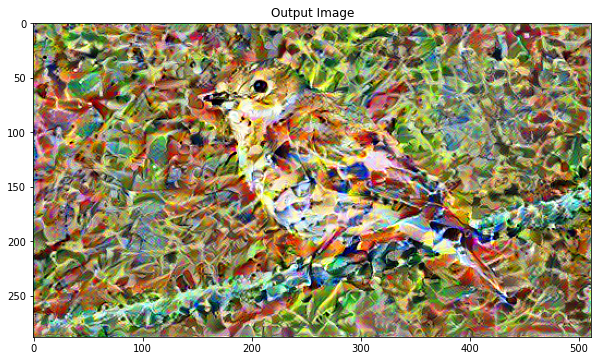

In [ ]:
show_results(best, content_path, style_path)

Como podemos ver, este modelo no demora mucho en entrenarse y logra resultados bastante espectaculares. Hay que considerar que el modelo esta hecho sobre vgg y que mediante transfer learning ya se tiene mucho tiempo ahorrado de entrenamiento, esto quiere decir que el modelo ya tiene conocimiento sobre muchos factores de las imagenes. 